<a href="https://colab.research.google.com/github/4teven/Machine-Learning/blob/main/Just_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Machine Learning



监督学习：在有标号的数据上训练一个模型，任务就是去预测这个标号

【自监督学习，产生标号，标号来源于数据的本身（字嵌入、BERT）】

1.   模型（Model）：通过输入预测输出；
2.   损失函数（Loss）：用于衡量模型预测出来的值与真实之间的差距；
3.   目标（Objective）：在训练训练时，优化函数：
4.   优化（Optimization）：在模型中没有指定的参数（刻意学习的参数），在实际数据中填上值，使得能最小化损失；

***分类：***



1.   决策树（Decision Trees）：用树来做决定；
2.   线性模型（Liner methds）：做决策时做决策的东西是根据输入的线性组合；
3.   核方法（Kernel machines）：用核函数来衡量两个样本间特征的相似度；
4.   神经网络（Neural network）：用多层的神经网络来学习一个特征表示，使得能在之后接的一个线性方法里会有一个很好的表示。
---

半监督学习：有一些标好的数据，还有大部分没有标好的数据，在这里有两个任务：

【像监督学习一样学习一个模型去预测标号，但尽量使用未标注的信息；将没有标注的数据的标号给预测出来（自训练）】；


---

无监督学习：整个数据是没有标号的，任务也不是去预测一个标号（聚类算法、估计分布（GAN））；


---


强化学习：模型跟环境进行交互，从环境中获取观测点之后进行学习，再做一些行为重新获取反馈（更像是人类的学习方式）；


## **Linear Regression Single Variable**

In [ ]:
import pandas as pd
import numpy as np
from sklearn import linear_model
import matplotlib.pyplot as plt

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/homeprices.csv')
df

,area,price
0,2600,550000
1,3000,565000
2,3200,610000
3,3600,680000
4,4000,725000


Text(0, 0.5, 'Price(US$)')

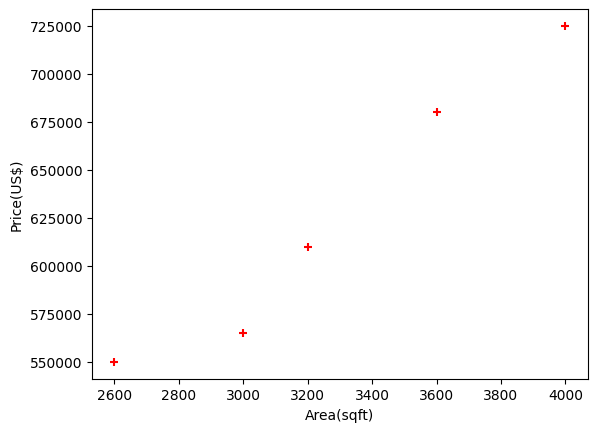

In [ ]:
%matplotlib inline
plt.scatter(df.area,df.price,color='red',marker='+')
plt.xlabel('Area(sqft)')
plt.ylabel('Price(US$)')

In [ ]:
dff = df.drop('price',axis='columns')
dff

,area
0,2600
1,3000
2,3200
3,3600
4,4000


In [ ]:
price = df.price
price

,price
0,550000
1,565000
2,610000
3,680000
4,725000


In [ ]:
model = linear_model.LinearRegression()
model.fit(df[['area']],df.price)
# same to below
# reg = linear_model.LinearRegression()
# reg.fit(dff,price)

LinearRegression()

In [ ]:
model.predict([[3300]])

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([628715.75342466])

In [ ]:
model.predict(pd.DataFrame([[3300]], columns=['area']))

array([628715.75342466])

In [ ]:
model.coef_

array([135.78767123])

In [ ]:
model.intercept_

180616.43835616432

In [ ]:
3300*135.78767123 + 180616.43835616432

628715.7534151643

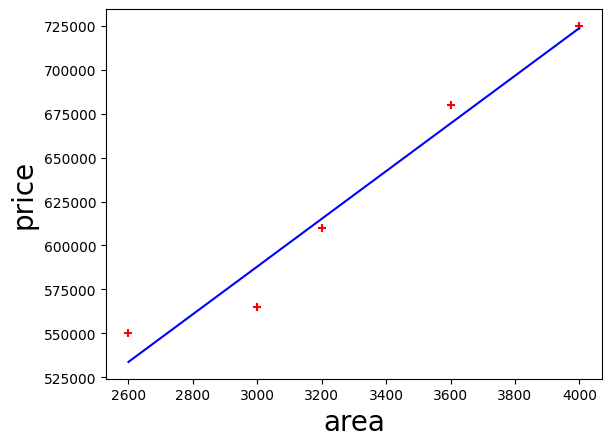

In [ ]:
%matplotlib inline
plt.xlabel('area',fontsize=20)
plt.ylabel('price',fontsize=20)
plt.scatter(df.area,df.price,color='red',marker='+')
plt.plot(df.area,model.predict(dff),color='blue')

In [ ]:
areas = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/areas.csv')
areas

,area
0,1000
1,1500
2,2300
3,3540
4,4120
5,4560
6,5490
7,3460
8,4750
9,2300


In [ ]:
dff

,area
0,2600
1,3000
2,3200
3,3600
4,4000


In [ ]:
m = linear_model.LinearRegression()
m.fit(dff,price)
p = m.predict(areas)

In [ ]:
areas['prices'] = p
areas

In [ ]:
areas.to_csv('new data.csv',index=False)



---


**Exercise**

In [ ]:
from sklearn.linear_model import LinearRegression

In [ ]:
ex = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/canada_per_capita_income.csv')
ex

In [ ]:
Linear= LinearRegression()
Linear.fit(ex[['year']],ex['per capita income (US$)'])

LinearRegression()

In [ ]:
Linear.predict(pd.DataFrame([[2020]], columns=['year']))

array([41288.69409442])

## **Linear Regression Multiple Variable**

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/Homeprice.csv')
data

,area,bedrooms,age,price
0,2600,3.0,20,550000
1,3000,4.0,15,565000
2,3200,NaN,18,610000
3,3600,3.0,30,595000
4,4000,5.0,8,760000
5,4100,6.0,8,810000


In [ ]:
#handling missing data
import math
median_bedrooms = math.floor(data.bedrooms.median())
data['bedrooms'] = data.bedrooms.fillna(median_bedrooms)
data

,area,bedrooms,age,price
0,2600,3.0,20,550000
1,3000,4.0,15,565000
2,3200,4.0,18,610000
3,3600,3.0,30,595000
4,4000,5.0,8,760000
5,4100,6.0,8,810000


In [ ]:
Reg = LinearRegression()
Reg.fit(data[['area','bedrooms','age']],data.price)

LinearRegression()

In [ ]:
Reg.predict(pd.DataFrame([[3000,3,40]], columns=['area','bedrooms','age']))

array([498408.25158031])

In [ ]:
print(Reg.coef_)
print(Reg.intercept_)

[  112.06244194 23388.88007794 -3231.71790863]
221323.00186540396


In [ ]:
112.06244194*3000+23388.88007794*3-3231.71790863*40 +221323.00186540396

498408.251574024



---
**Exercise**

examples:

12,10,10

2,9,6

In [ ]:
sales = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/hiring.csv')
sales

,experience,test_score(out of 10),interview_score(out of 10),salary($)
0,NaN,8.0,9,50000
1,NaN,8.0,6,45000
2,five,6.0,7,60000
3,two,10.0,10,65000
4,seven,9.0,6,70000
5,three,7.0,10,62000
6,ten,NaN,7,72000
7,eleven,7.0,8,80000


In [ ]:
sales['test_score(out of 10)'] = sales['test_score(out of 10)'].fillna(sales['test_score(out of 10)'].median())
sales

,experience,test_score(out of 10),interview_score(out of 10),salary($)
0,NaN,8.0,9,50000
1,NaN,8.0,6,45000
2,five,6.0,7,60000
3,two,10.0,10,65000
4,seven,9.0,6,70000
5,three,7.0,10,62000
6,ten,8.0,7,72000
7,eleven,7.0,8,80000


In [ ]:
sales['experience'] = sales['experience'].fillna('zero')
sales

,experience,test_score(out of 10),interview_score(out of 10),salary($)
0,zero,8.0,9,50000
1,zero,8.0,6,45000
2,five,6.0,7,60000
3,two,10.0,10,65000
4,seven,9.0,6,70000
5,three,7.0,10,62000
6,ten,8.0,7,72000
7,eleven,7.0,8,80000


In [ ]:
pip install word2number

In [ ]:
sales.experience

,experience
0,zero
1,zero
2,five
3,two
4,seven
5,three
6,ten
7,eleven


In [ ]:
from word2number import w2n
sales['experience'] = sales['experience'].apply(w2n.word_to_num)
sales

,experience,test_score(out of 10),interview_score(out of 10),salary($)
0,0,8.0,9,50000
1,0,8.0,6,45000
2,5,6.0,7,60000
3,2,10.0,10,65000
4,7,9.0,6,70000
5,3,7.0,10,62000
6,10,8.0,7,72000
7,11,7.0,8,80000


In [ ]:
sales['experience'][:2] = math.floor(sales['experience'].mean())
sales

<ipython-input-186-0d9723a7d168>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sales['experience'][:2] = math.floor(sales['experience'].mean())


,experience,test_score(out of 10),interview_score(out of 10),salary($)
0,4,8.0,9,50000
1,4,8.0,6,45000
2,5,6.0,7,60000
3,2,10.0,10,65000
4,7,9.0,6,70000
5,3,7.0,10,62000
6,10,8.0,7,72000
7,11,7.0,8,80000


In [ ]:
Exreg = LinearRegression()
Exreg.fit(sales[['experience','test_score(out of 10)','interview_score(out of 10)']],sales['salary($)'])

LinearRegression()

In [ ]:
Exreg.predict(pd.DataFrame([[2,9,6]], columns=['experience','test_score(out of 10)','interview_score(out of 10)']))

array([46341.80249281])

In [ ]:
Exreg.predict(pd.DataFrame([[12,10,10]], columns=['experience','test_score(out of 10)','interview_score(out of 10)']))

array([94792.77433975])

## **Gradient Descent**

**Cost Function J(θ):**

$$ J(\theta) = \frac{1}{2m} \sum_{i=1}^{m} \left( h_\theta(x^{(i)}) - y^{(i)} \right)^2 $$

**b*:**

$$b := b- \alpha \frac{1}{m} \sum_{i=1}^{m} \left( h_\theta(x^{(i)}) - y^{(i)} \right)$$

**w*:**

$$w := w - \alpha \frac{1}{m} \sum_{i=1}^{m} \left( \left( h_\theta(x^{(i)}) - y^{(i)} \right) x^{(i)} \right)$$

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

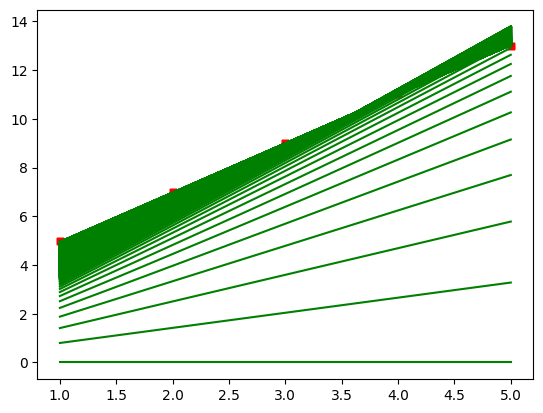

In [ ]:
%matplotlib inline
def gradient_descent(x,y):
  w_curr = b_curr = 0
  iterations = 1000
  n=len(x)
  learning_rate = 0.01
  plt.scatter(x,y,color='red',marker='+',linewidth=5)
  for i in range(iterations+1):
    y_predicted = w_curr * x + b_curr # y = wx+b
    # Plot the new predicted line
    plt.plot(x,y_predicted,color='green')
    cost = (1/n) * sum([val**2 for val in (y-y_predicted)])
    w_derivative = -(2/n)*sum(x*(y-y_predicted))
    b_derivative = -(2/n)*sum(y-y_predicted)
    w_curr = w_curr - learning_rate * w_derivative
    b_curr = b_curr - learning_rate * b_derivative
    #print("w {}, b {}, cost {}, iteration {}".format(w_curr,b_curr,cost,i))


x = np.array([1,2,3,4,5])
y = np.array([5,7,9,11,13])

gradient_descent(x,y)

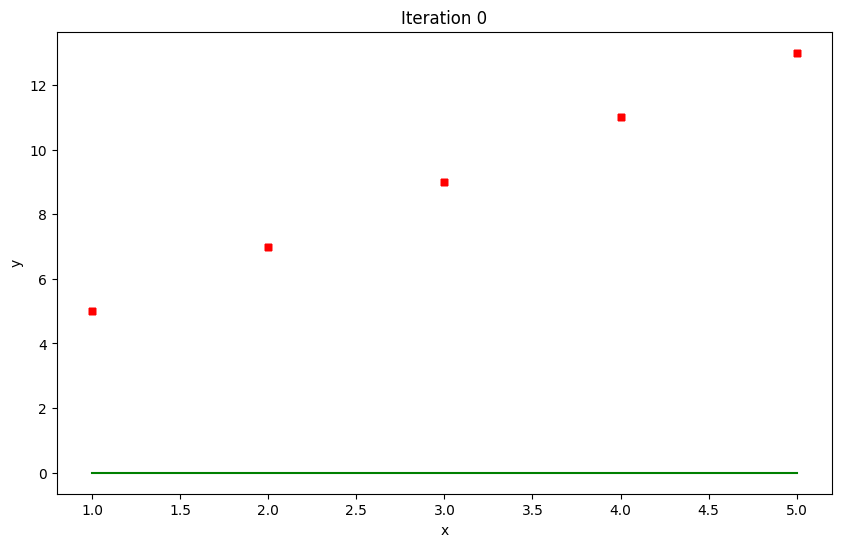

Iteration 0: w = 0.62, b = 0.18, cost = 89.0


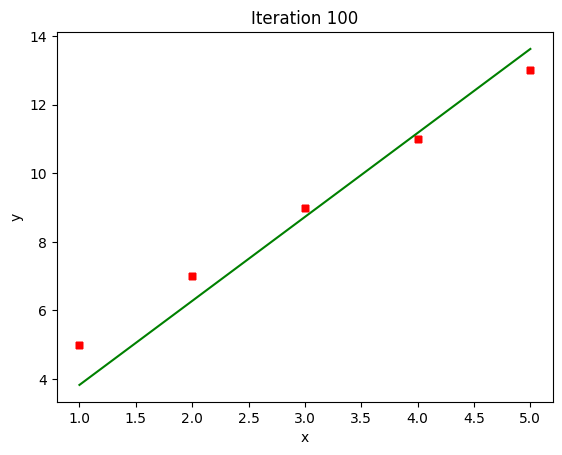

Iteration 100: w = 2.4469521472074027, b = 1.3863609314182666, cost = 0.4771638970482712


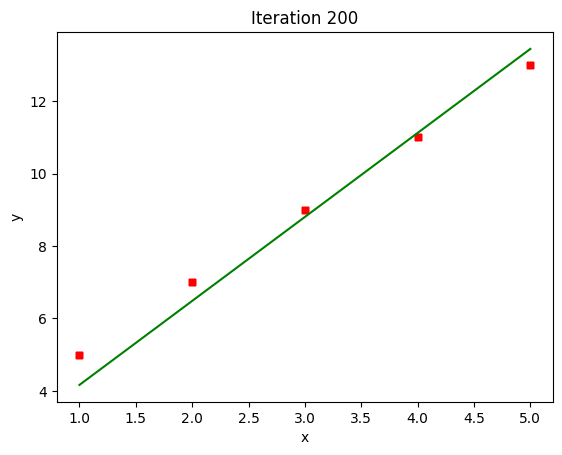

Iteration 200: w = 2.318550968403369, b = 1.8499299283889075, cost = 0.24238368296104512


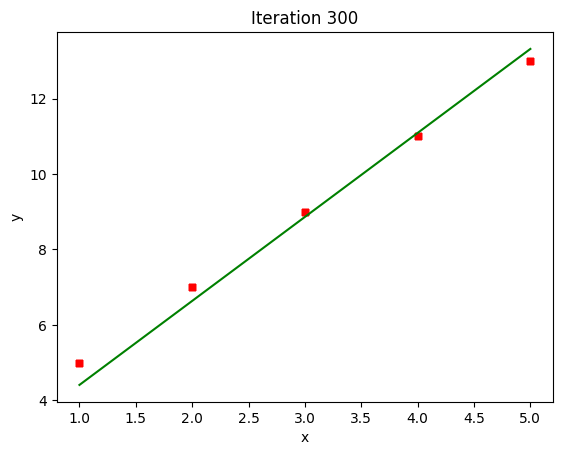

Iteration 300: w = 2.227037100288903, b = 2.1803240294752406, cost = 0.12312299846905057


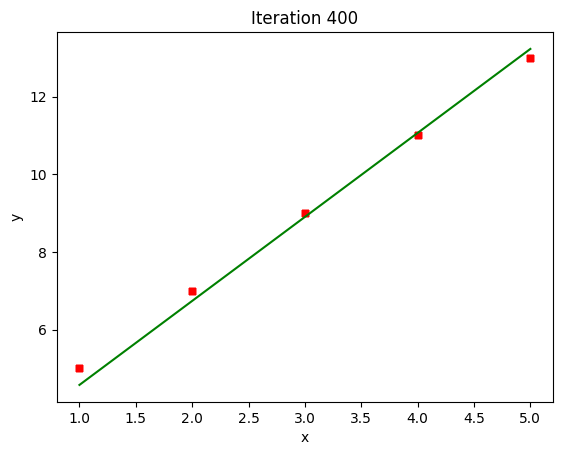

Iteration 400: w = 2.1618134930367656, b = 2.4158019469939687, cost = 0.06254246394319472


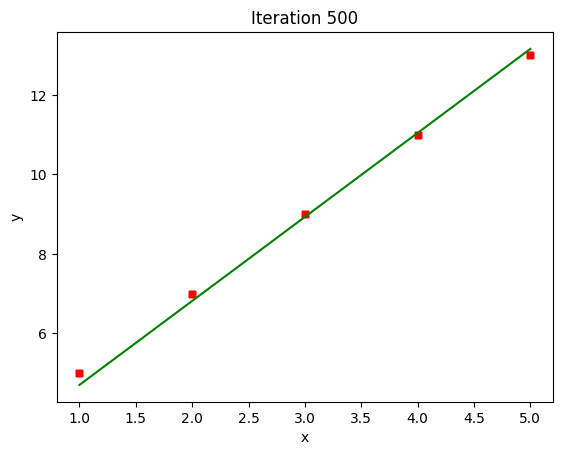

Iteration 500: w = 2.115327435451919, b = 2.5836313648214624, cost = 0.031769530020575504


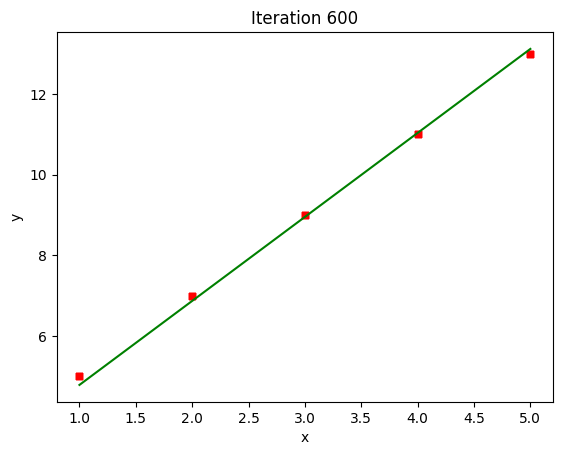

Iteration 600: w = 2.082195972154773, b = 2.703246459880537, cost = 0.016137884152517098


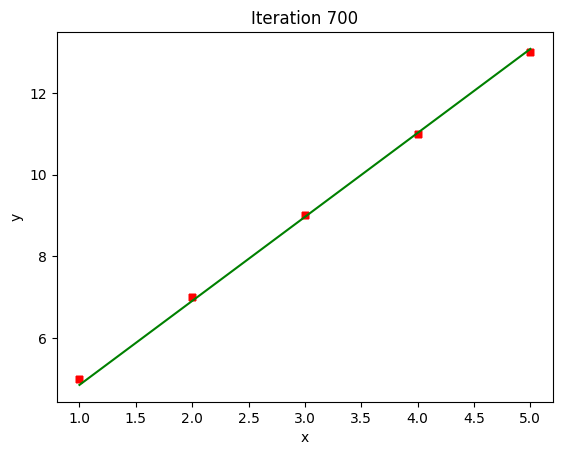

Iteration 700: w = 2.058582572412138, b = 2.788498325442612, cost = 0.008197518337583162


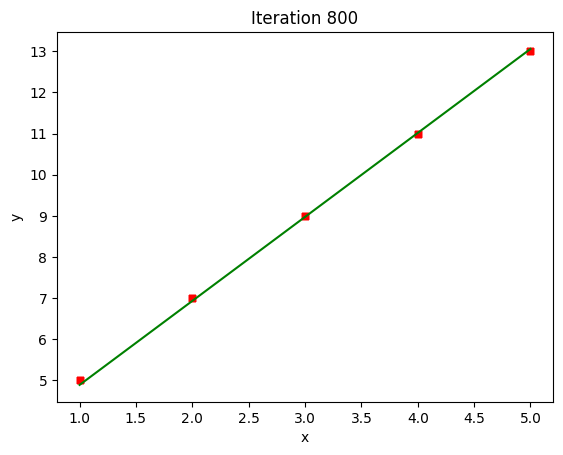

Iteration 800: w = 2.0417528706146477, b = 2.8492588889670167, cost = 0.004164071712246711


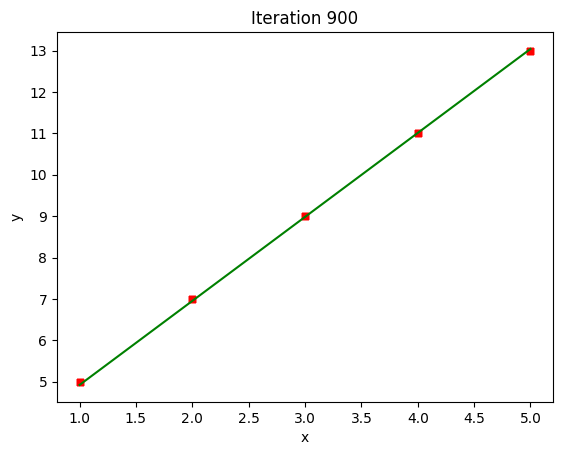

Iteration 900: w = 2.029758034391168, b = 2.8925640536747035, cost = 0.002115212496108267


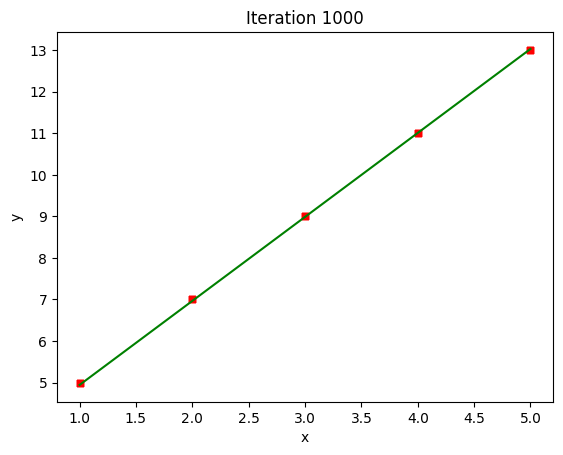

Iteration 1000: w = 2.021209095273925, b = 2.9234284364516427, cost = 0.001074458898134308


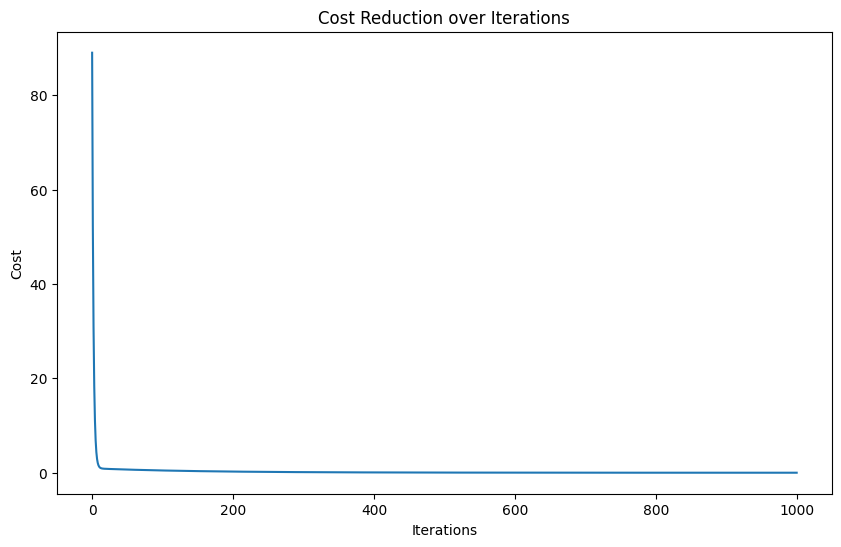

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def gradient_descent(x, y):
    w_curr = b_curr = 0
    iterations = 1000
    n = len(x)
    learning_rate = 0.01
    costs = []
    plt.figure(figsize=(10, 6))
    for i in range(iterations + 1):
        y_predicted = w_curr * x + b_curr
        cost = (1 / n) * sum([val ** 2 for val in (y - y_predicted)])
        costs.append(cost)
        w_derivative = -(2 / n) * sum(x * (y - y_predicted))
        b_derivative = -(2 / n) * sum(y - y_predicted)
        w_curr = w_curr - learning_rate * w_derivative
        b_curr = b_curr - learning_rate * b_derivative
        # 每隔100次迭代绘制一次拟合直线
        if i % 100 == 0:
            plt.scatter(x, y, color='red', marker='+', linewidth=5)
            plt.plot(x, y_predicted, color='green')
            plt.title(f"Iteration {i}")
            plt.xlabel('x')
            plt.ylabel('y')
            plt.show()
            print(f"Iteration {i}: w = {w_curr}, b = {b_curr}, cost = {cost}")
    # 绘制损失函数下降曲线
    plt.figure(figsize=(10, 6))
    plt.plot(range(iterations + 1), costs)
    plt.title('Cost Reduction over Iterations')
    plt.xlabel('Iterations')
    plt.ylabel('Cost')
    plt.show()

x = np.array([1, 2, 3, 4, 5])
y = np.array([5, 7, 9, 11, 13])

gradient_descent(x, y)




>**Using Pytorch Version**





In [ ]:
import torch

In [ ]:
import random

In [ ]:
# features shape is (n,p) labels shape is (p,1)
def data_iter(batch_size, features, labels):#data_iter是一个数据生成器函数，用于从输入的 features 和 labels 中按照 batch_size 生成小批量数据
    num_features = len(features) #计算样本数
    indices = list(range(num_features))  # 生成从0到num_num_features-1的索引列表
    random.shuffle(indices)  # 打乱索引，随机抽样
    for i in range(0, num_features, batch_size): #按照 batch_size 进行分批次处理
        batch_indices = torch.tensor(indices[i:min(i + batch_size, num_features)]) #为每个 batch 获取对应的索引。
        yield features[batch_indices], labels[batch_indices] #返回这个批次的 features 和 labels

In [ ]:
w = torch.normal(0, 0.01, size=(p, 1), requires_grad=True)
#初始化权重向量为服从均值为 0、标准差为 0.01 的正态分布的随机值，形状为 (p, 1)。requires_grad=True 表示这些权重需要计算梯度
b = torch.zeros(1, requires_grad=True)
#初始化偏置项为 0，并且 requires_grad=True，表示它也是可训练的参数

In [ ]:
for epoch in range(num_epochs):
    for X, y in data_iter(batch_size, features, labels): #通过 data_iter 生成小批量的 X 和 y
        y_hat = X @ w + b  # 线性回归模型的预测值
        loss = ((y_hat - y) ** 2 / 2).mean()  # 计算损失：均方误差
        loss.backward()  # 反向传播计算梯度

        for param in [w, b]:
            param -= learning_rate * param.grad  # 梯度下降更新参数
            param.grad.zero_()  # 梯度清零


In [ ]:
import torch
import random

# 数据生成器函数
def data_iter(batch_size, features, labels):
    num_examples = len(features)
    indices = list(range(num_examples))
    random.shuffle(indices)  # 随机打乱索引
    for i in range(0, num_examples, batch_size):
        batch_indices = torch.tensor(indices[i:min(i + batch_size, num_examples)])
        yield features[batch_indices], labels[batch_indices]

# 线性回归模型
def linreg(X, w, b):
    return X @ w + b  # 矩阵乘法

# 均方误差损失函数
def squared_loss(y_hat, y):
    return ((y_hat - y.view(y_hat.size())) ** 2) / 2  # MSE

# 超参数
batch_size = 10
learning_rate = 0.03
num_epochs = 3

# 初始化参数
w = torch.normal(0, 0.01, size=(2, 1), requires_grad=True)  # 假设输入特征维度为2
b = torch.zeros(1, requires_grad=True)

# 生成一些示例数据
true_w = torch.tensor([2, -3.4])
true_b = 4.2
features = torch.randn(1000, 2)  # 1000 个样本，每个样本有 2 个特征
labels = true_w[0] * features[:, 0] + true_w[1] * features[:, 1] + true_b
labels += torch.randn(labels.shape) * 0.01  # 加上噪声

# 训练循环
for epoch in range(num_epochs):
    for X, y in data_iter(batch_size, features, labels):
        y_hat = linreg(X, w, b)  # 模型预测
        loss = squared_loss(y_hat, y).mean()  # 计算损失
        loss.backward()  # 反向传播计算梯度

        with torch.no_grad():  # 更新参数时不需要计算梯度
            w -= learning_rate * w.grad  # 更新权重
            b -= learning_rate * b.grad  # 更新偏置
            w.grad.zero_()  # 清零梯度
            b.grad.zero_()  # 清零梯度

    print(f'epoch {epoch + 1}, loss {loss.item():.6f}')


epoch 1, loss 0.036846
epoch 2, loss 0.000079
epoch 3, loss 0.000029



## Saving Model



In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/homeprices.csv')

In [ ]:
model = LinearRegression()
model.fit(df[['area']],df.price)

LinearRegression()

In [ ]:
model.coef_

array([135.78767123])

In [ ]:
model.intercept_

180616.43835616432

In [ ]:
model.predict(pd.DataFrame([[5000]], columns=['area']))

array([859554.79452055])

In [ ]:
import pickle

In [ ]:
with open('model_pickle','wb') as f:
  pickle.dump(model,f)

In [ ]:
mmm = pickle.load(open('model_pickle','rb'))

In [ ]:
mmm.predict(pd.DataFrame([[5000]], columns=['area']))

array([859554.79452055])

In [ ]:
import joblib

In [ ]:
joblib.dump(model,'model_joblib')

['model_joblib']

In [ ]:
mj = joblib.load('model_joblib')

In [ ]:
mj.predict(pd.DataFrame([[5000]], columns=['area']))

array([859554.79452055])

## Dummy Variable and One Hot Encoding

**Categorical Variables**


*   *Nominal*

No relationship between each other

e.g. green, red, blue, ...

*   *Ordinal*

E.g. High, medium, low


One Hot Encoding:

Green -> [1,0,0]

Red -> [0,1,0]

Blue -> [0,0,1]


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/homeprice.csv')
df

,town,area,price
0,monroe township,2600,550000
1,monroe township,3000,565000
2,monroe township,3200,610000
3,monroe township,3600,680000
4,monroe township,4000,725000
5,west windsor,2600,585000
6,west windsor,2800,615000
7,west windsor,3300,650000
8,west windsor,3600,710000
9,robinsville,2600,575000


In [ ]:
dummies = pd.get_dummies(df.town).astype(int)
dummies

,monroe township,robinsville,west windsor
0,1,0,0
1,1,0,0
2,1,0,0
3,1,0,0
4,1,0,0
5,0,0,1
6,0,0,1
7,0,0,1
8,0,0,1
9,0,1,0


In [ ]:
merged = pd.concat([df,dummies],axis='columns')
#merged = pd.concat([df, dummies], axis=1) same result with axis = columns
merged

,town,area,price,monroe township,robinsville,west windsor
0,monroe township,2600,550000,1,0,0
1,monroe township,3000,565000,1,0,0
2,monroe township,3200,610000,1,0,0
3,monroe township,3600,680000,1,0,0
4,monroe township,4000,725000,1,0,0
5,west windsor,2600,585000,0,0,1
6,west windsor,2800,615000,0,0,1
7,west windsor,3300,650000,0,0,1
8,west windsor,3600,710000,0,0,1
9,robinsville,2600,575000,0,1,0


In [ ]:
merged.drop(['town','west windsor'],axis='columns',inplace=True) #dummy variable trap
# which means it introduces multi-co-linear problem, so that the data has too much relationship between
# will affect the performance of the model
merged

,area,price,monroe township,robinsville
0,2600,550000,1,0
1,3000,565000,1,0
2,3200,610000,1,0
3,3600,680000,1,0
4,4000,725000,1,0
5,2600,585000,0,0
6,2800,615000,0,0
7,3300,650000,0,0
8,3600,710000,0,0
9,2600,575000,0,1


In [ ]:
X = merged.drop('price',axis='columns')
X

,area,monroe township,robinsville
0,2600,1,0
1,3000,1,0
2,3200,1,0
3,3600,1,0
4,4000,1,0
5,2600,0,0
6,2800,0,0
7,3300,0,0
8,3600,0,0
9,2600,0,1


In [ ]:
y = merged.price
y

,price
0,550000
1,565000
2,610000
3,680000
4,725000
5,585000
6,615000
7,650000
8,710000
9,575000


In [ ]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X,y)

LinearRegression()

In [ ]:
model.predict([[2800,0,1]])

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([590775.63964739])

In [ ]:
model.predict(pd.DataFrame([[2800,0,1]], columns=['area','monroe township','robinsville']))

array([590775.63964739])

In [ ]:
model.score(X,y)

0.9573929037221872

In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [ ]:
dfle = df
dfle.town = le.fit_transform(dfle.town)

In [ ]:
dfle

,town,area,price
0,0,2600,550000
1,0,3000,565000
2,0,3200,610000
3,0,3600,680000
4,0,4000,725000
5,2,2600,585000
6,2,2800,615000
7,2,3300,650000
8,2,3600,710000
9,1,2600,575000


In [ ]:
X = dfle[['town','area']].values
X

array([[   0, 2600],
       [   0, 3000],
       [   0, 3200],
       [   0, 3600],
       [   0, 4000],
       [   2, 2600],
       [   2, 2800],
       [   2, 3300],
       [   2, 3600],
       [   1, 2600],
       [   1, 2900],
       [   1, 3100],
       [   1, 3600]])

In [ ]:
y = dfle.price
y

,price
0,550000
1,565000
2,610000
3,680000
4,725000
5,585000
6,615000
7,650000
8,710000
9,575000


In [ ]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
ct = ColumnTransformer([('town', OneHotEncoder(), [0])], remainder = 'passthrough')

In [ ]:
X = ct.fit_transform(X)
X

array([[1.0e+00, 0.0e+00, 0.0e+00, 2.6e+03],
       [1.0e+00, 0.0e+00, 0.0e+00, 3.0e+03],
       [1.0e+00, 0.0e+00, 0.0e+00, 3.2e+03],
       [1.0e+00, 0.0e+00, 0.0e+00, 3.6e+03],
       [1.0e+00, 0.0e+00, 0.0e+00, 4.0e+03],
       [0.0e+00, 0.0e+00, 1.0e+00, 2.6e+03],
       [0.0e+00, 0.0e+00, 1.0e+00, 2.8e+03],
       [0.0e+00, 0.0e+00, 1.0e+00, 3.3e+03],
       [0.0e+00, 0.0e+00, 1.0e+00, 3.6e+03],
       [0.0e+00, 1.0e+00, 0.0e+00, 2.6e+03],
       [0.0e+00, 1.0e+00, 0.0e+00, 2.9e+03],
       [0.0e+00, 1.0e+00, 0.0e+00, 3.1e+03],
       [0.0e+00, 1.0e+00, 0.0e+00, 3.6e+03]])

In [ ]:
X = X[:,1:] # drop one column as well
X

array([[0.0e+00, 0.0e+00, 2.6e+03],
       [0.0e+00, 0.0e+00, 3.0e+03],
       [0.0e+00, 0.0e+00, 3.2e+03],
       [0.0e+00, 0.0e+00, 3.6e+03],
       [0.0e+00, 0.0e+00, 4.0e+03],
       [0.0e+00, 1.0e+00, 2.6e+03],
       [0.0e+00, 1.0e+00, 2.8e+03],
       [0.0e+00, 1.0e+00, 3.3e+03],
       [0.0e+00, 1.0e+00, 3.6e+03],
       [1.0e+00, 0.0e+00, 2.6e+03],
       [1.0e+00, 0.0e+00, 2.9e+03],
       [1.0e+00, 0.0e+00, 3.1e+03],
       [1.0e+00, 0.0e+00, 3.6e+03]])

In [ ]:
model.fit(X,y)

LinearRegression()

In [ ]:
model.predict([[1,0,2800]])

array([590775.63964739])

In [ ]:
model.predict([[0,1,3400]])

array([681241.6684584])



---
Exercise:

Mercedez Benz 4 yr old , 45000

BMW 7 yr old, 86000

Accuracy




In [ ]:
exx = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/carprices.csv')
exx

,Car Model,Mileage,Sell Price($),Age(yrs)
0,BMW X5,69000,18000,6
1,BMW X5,35000,34000,3
2,BMW X5,57000,26100,5
3,BMW X5,22500,40000,2
4,BMW X5,46000,31500,4
5,Audi A5,59000,29400,5
6,Audi A5,52000,32000,5
7,Audi A5,72000,19300,6
8,Audi A5,91000,12000,8
9,Mercedez Benz C class,67000,22000,6


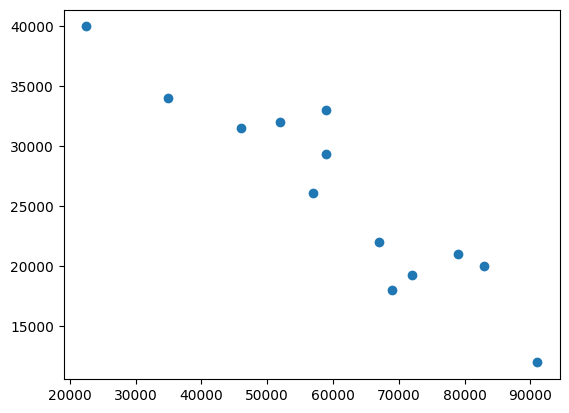

In [ ]:
plt.scatter(exx.Mileage,exx['Sell Price($)'])

In [ ]:
dummy = pd.get_dummies(exx['Car Model']).astype(int)
dummy

,Audi A5,BMW X5,Mercedez Benz C class
0,0,1,0
1,0,1,0
2,0,1,0
3,0,1,0
4,0,1,0
5,1,0,0
6,1,0,0
7,1,0,0
8,1,0,0
9,0,0,1


In [ ]:
merged = pd.concat([exx,dummy],axis='columns')
merged

,Car Model,Mileage,Sell Price($),Age(yrs),Audi A5,BMW X5,Mercedez Benz C class
0,BMW X5,69000,18000,6,0,1,0
1,BMW X5,35000,34000,3,0,1,0
2,BMW X5,57000,26100,5,0,1,0
3,BMW X5,22500,40000,2,0,1,0
4,BMW X5,46000,31500,4,0,1,0
5,Audi A5,59000,29400,5,1,0,0
6,Audi A5,52000,32000,5,1,0,0
7,Audi A5,72000,19300,6,1,0,0
8,Audi A5,91000,12000,8,1,0,0
9,Mercedez Benz C class,67000,22000,6,0,0,1


In [ ]:
final = merged.drop(['Car Model','Mercedez Benz C class'],axis='columns')
final

,Mileage,Sell Price($),Age(yrs),Audi A5,BMW X5
0,69000,18000,6,0,1
1,35000,34000,3,0,1
2,57000,26100,5,0,1
3,22500,40000,2,0,1
4,46000,31500,4,0,1
5,59000,29400,5,1,0
6,52000,32000,5,1,0
7,72000,19300,6,1,0
8,91000,12000,8,1,0
9,67000,22000,6,0,0


In [ ]:
X = final.drop('Sell Price($)',axis='columns')
X

,Mileage,Age(yrs),Audi A5,BMW X5
0,69000,6,0,1
1,35000,3,0,1
2,57000,5,0,1
3,22500,2,0,1
4,46000,4,0,1
5,59000,5,1,0
6,52000,5,1,0
7,72000,6,1,0
8,91000,8,1,0
9,67000,6,0,0


In [ ]:
y = final['Sell Price($)']
y

,Sell Price($)
0,18000
1,34000
2,26100
3,40000
4,31500
5,29400
6,32000
7,19300
8,12000
9,22000


In [ ]:
model = LinearRegression()
model.fit(X,y)

LinearRegression()

In [ ]:
model.predict([[45000,4,0,0]])

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([36991.31721061])

In [ ]:
model.predict([[86000,7,0,1]])

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([11080.74313219])

In [ ]:
model.score(X,y)

0.9417050937281082

## Logistic Regression

 $ \ sigmoid(z) = \frac{1}{1 + e^{-z}} $ ~ (0,1)

 $ \ y = \frac{1}{1 + e^{-(m*x+b)}} $



In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/insurance_data.csv')

In [ ]:
df.head()

,age,bought_insurance
0,22,0
1,25,0
2,47,1
3,52,0
4,46,1


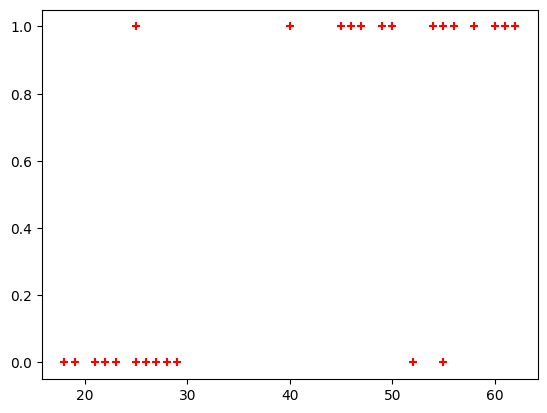

In [ ]:
plt.scatter(df.age,df.bought_insurance,marker='+',color='red')

In [ ]:
X_train,X_test,y_train,y_test = train_test_split(df[['age']],df.bought_insurance,train_size=0.8)

In [ ]:
model = LogisticRegression()
model.fit(X_train,y_train)

LogisticRegression()

In [ ]:
X_test

,age
19,18
4,46
21,26
6,55
5,56
8,62


In [ ]:
model.predict(X_test)

array([0, 1, 0, 1, 1, 1])

In [ ]:
model.score(X_test,y_test)

0.8333333333333334

In [ ]:
model.predict_proba(X_test)
# [P(0),P(1)]

array([[0.95012771, 0.04987229],
       [0.18753511, 0.81246489],
       [0.84372455, 0.15627545],
       [0.05291774, 0.94708226],
       [0.04555268, 0.95444732],
       [0.01820017, 0.98179983]])

In [ ]:
model.predict([[25]])

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


array([0])

In [ ]:
hr = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/HR_comma_sep.csv')

In [ ]:
hr.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,Department,salary
0,0.38,0.53,2,157,3,0,1,0,sales,low
1,0.80,0.86,5,262,6,0,1,0,sales,medium
2,0.11,0.88,7,272,4,0,1,0,sales,medium
3,0.72,0.87,5,223,5,0,1,0,sales,low
4,0.37,0.52,2,159,3,0,1,0,sales,low


In [ ]:
left = hr[hr.left==1]
left.shape

(3571, 10)

In [ ]:
retained = hr[hr.left==0]
retained.shape

(11428, 10)

In [ ]:
hr.groupby('left').mean(numeric_only=True) # set numeric_only to True to calculate the mean of only numeric columns

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years
left,,,,,,,
0,0.666810,0.715473,3.786664,199.060203,3.380032,0.175009,0.026251
1,0.440098,0.718113,3.855503,207.419210,3.876505,0.047326,0.005321


<Axes: xlabel='salary'>

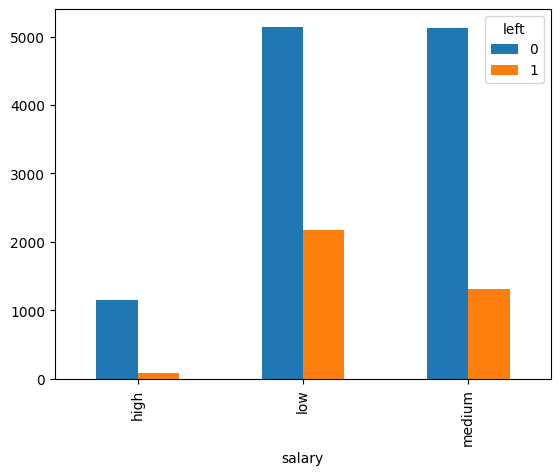

In [ ]:
pd.crosstab(hr.salary,hr.left).plot(kind='bar')

<Axes: xlabel='Department'>

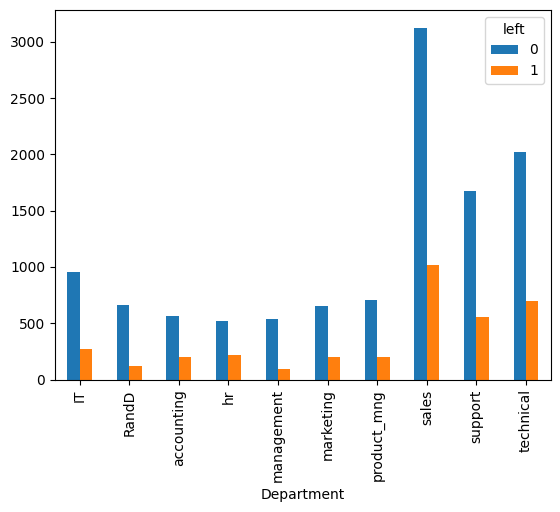

In [ ]:
pd.crosstab(hr.Department,hr.left).plot(kind='bar')

In [ ]:
subhr = hr[['satisfaction_level','average_montly_hours','promotion_last_5years','salary']]
subhr.head()

,satisfaction_level,average_montly_hours,promotion_last_5years,salary
0,0.38,157,0,low
1,0.80,262,0,medium
2,0.11,272,0,medium
3,0.72,223,0,low
4,0.37,159,0,low


In [ ]:
salary_dummies = pd.get_dummies(subhr.salary,prefix='salary').astype(int)
hr_with_dummies = pd.concat([subhr,salary_dummies],axis='columns')
hr_with_dummies.head()

,satisfaction_level,average_montly_hours,promotion_last_5years,salary,salary_high,salary_low,salary_medium
0,0.38,157,0,low,0,1,0
1,0.80,262,0,medium,0,0,1
2,0.11,272,0,medium,0,0,1
3,0.72,223,0,low,0,1,0
4,0.37,159,0,low,0,1,0


In [ ]:
hr_with_dummies.drop('salary',axis='columns',inplace=True)
hr_with_dummies.head()

,satisfaction_level,average_montly_hours,promotion_last_5years,salary_high,salary_low,salary_medium
0,0.38,157,0,0,1,0
1,0.80,262,0,0,0,1
2,0.11,272,0,0,0,1
3,0.72,223,0,0,1,0
4,0.37,159,0,0,1,0


In [ ]:
X = hr_with_dummies
y = hr.left

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,y,train_size=0.3)

In [ ]:
model = LogisticRegression()
model.fit(X_train, y_train)

LogisticRegression()

In [ ]:
model.predict(X_test)

array([1, 1, 1, ..., 0, 0, 0])

In [ ]:
model.score(X_test,y_test)

0.7761904761904762



---
### Multiclass


In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt

from sklearn.datasets import load_digits

In [ ]:
digits = load_digits()

In [ ]:
dir(digits)

['DESCR', 'data', 'feature_names', 'frame', 'images', 'target', 'target_names']

In [ ]:
digits.data[0]

array([ 0.,  0.,  5., 13.,  9.,  1.,  0.,  0.,  0.,  0., 13., 15., 10.,
       15.,  5.,  0.,  0.,  3., 15.,  2.,  0., 11.,  8.,  0.,  0.,  4.,
       12.,  0.,  0.,  8.,  8.,  0.,  0.,  5.,  8.,  0.,  0.,  9.,  8.,
        0.,  0.,  4., 11.,  0.,  1., 12.,  7.,  0.,  0.,  2., 14.,  5.,
       10., 12.,  0.,  0.,  0.,  0.,  6., 13., 10.,  0.,  0.,  0.])

<Figure size 640x480 with 0 Axes>

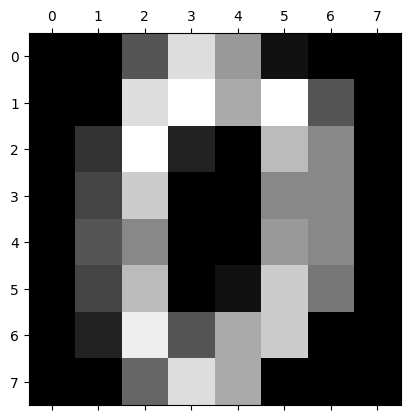

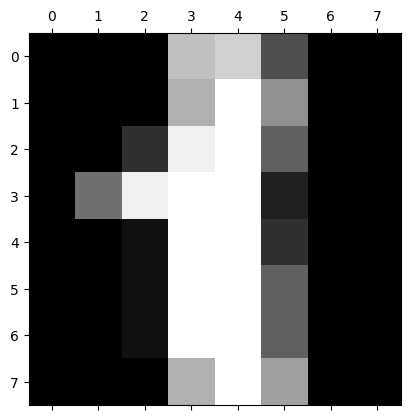

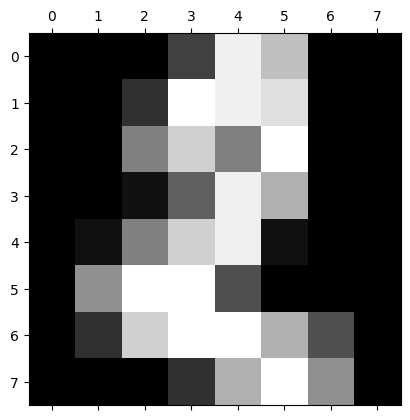

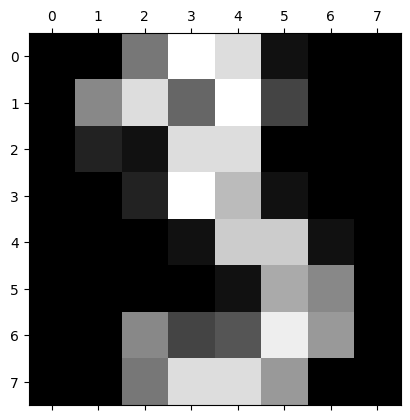

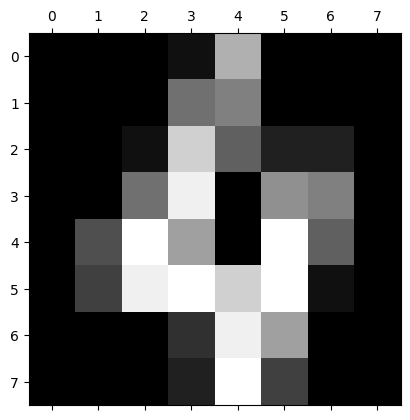

In [ ]:
plt.gray()
for i in range(5):
  plt.matshow(digits.images[i])

In [ ]:
digits.target[0:5]

array([0, 1, 2, 3, 4])

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(digits.data,digits.target,test_size=0.2)

In [ ]:
len(X_train)

1437

In [ ]:
len(X_test)

360

In [ ]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
model.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [ ]:
model.score(X_test, y_test)

0.9694444444444444

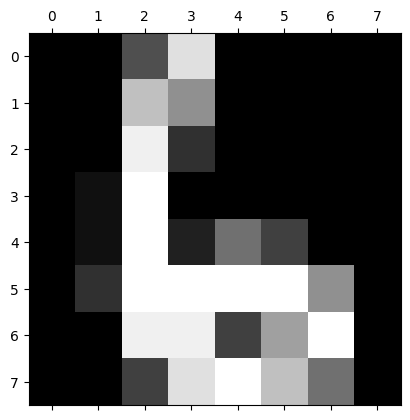

In [ ]:
plt.matshow(digits.images[67])

In [ ]:
digits.target[67]

6

In [ ]:
model.predict(digits.data[67].reshape(1,-1))

array([6])

In [ ]:
model.predict(digits.data[0:5])

array([0, 1, 2, 3, 4])

In [ ]:
# Confusion matrix
from sklearn.metrics import confusion_matrix
y_pred = model.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
cm

array([[36,  0,  0,  0,  0,  0,  0,  0,  0,  0],
       [ 0, 34,  0,  0,  0,  0,  0,  0,  0,  0],
       [ 0,  1, 39,  0,  0,  0,  0,  0,  0,  0],
       [ 0,  0,  0, 32,  0,  1,  0,  0,  1,  0],
       [ 0,  0,  0,  0, 36,  0,  1,  0,  0,  2],
       [ 0,  0,  0,  0,  0, 26,  0,  0,  0,  1],
       [ 0,  0,  0,  0,  0,  0, 38,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0,  0, 36,  0,  2],
       [ 0,  1,  0,  0,  0,  0,  0,  0, 42,  0],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  1, 30]])

Text(95.72222222222221, 0.5, 'Truth')

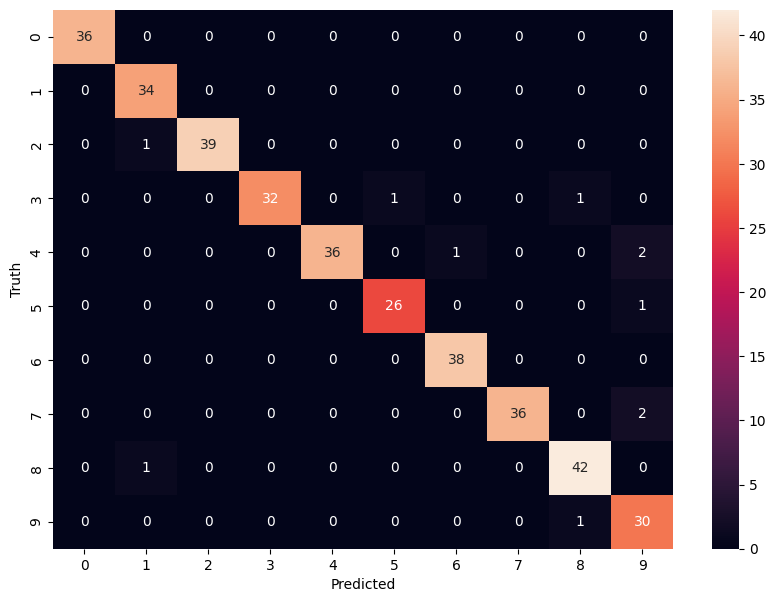

In [ ]:
import seaborn as sn
plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')

For example, this heat map shows the error that model makes:
For number 8 which is Truth value, and the model predicted as 2, the prob of happenning is 1.




---

Exercise:

Use sklearn.datasets iris flower dataset to train your model using logistic regression. You need to figure out accuracy
of your model and use that to predict different samples in your test dataset. In iris dataset there are 150 samples containing following features,

1. Sepal Length
2. Sepal Width
3. Petal Length
4. Petal Width

Using above 4 features you will clasify a flower in one of the three categories,

1. Setosa
2. Versicolour
3. Virginica

## Softmax

The Softmax function is defined as follows for a vector $\mathbf{z} = [z_1, z_2, \ldots, z_K]$:

$$
\sigma(z_i) = \frac{e^{z_i}}{\sum_{j=1}^{K} e^{z_j}} \quad \text{for } i = 1, 2, \ldots, K
$$

Where:
- $z_i$ is the raw score for class i
- $K$ is the total number of classes
- $\sigma(z_i)$ is the probability of class i after applying the Softmax function



Loss function or called Cross-entropy loss:
$$
ℓ(h(x),y) = - ∑_{j=1}^{k}p(label=h_{j}(x))logp(label=y)
$$
If using One-hot, normally we have
$$p(label=y)=1
$$
$$p(label=h(x))=0$$
$$
ℓ(h(x),y) = - logp(label=y) = -h_{y}(x)+log∑_{j=1}^{k}exp(h_{j}(x))
$$

Optimization:

We want to
$$
\text{minimize}_{\theta}\frac{1}{m}∑_{i=1}^{m}𝓵(h_{𝜃}(x^{(i)}),y^{(i)})
$$

We take $\frac{1}{m}∑_{i=1}^{m}𝓵(h_{𝜃}(x^{(i)}),y^{(i)})$ as $f(\theta)$ where f: $\mathbb{R}^{n \times k}$ → $\mathbb{R}$

$$
\nabla_{\theta} f(\theta) \in \mathbb{R}^{n \times k} =
\begin{bmatrix}
\frac{\partial f(\theta)}{\partial \theta_{11}} & \cdots & \frac{\partial f(\theta)}{\partial \theta_{1k}} \\
\vdots & \ddots & \vdots \\
\frac{\partial f(\theta)}{\partial \theta_{n1}} & \cdots & \frac{\partial f(\theta)}{\partial \theta_{nk}}
\end{bmatrix}
$$

gradient points in the direction that most increases f(locally)


To minimize a function, the **gradient descent** alogrithm proceeds by iteratively taking steps in the direction of the negative gradient

(where gradient always points in the most increases so we take the negative of gradient)

$$
\theta := \theta - \alpha \nabla_{\theta} f(\theta)
$$
Where $\alpha > 0 $ is a step size or *learning rate*

$$\nabla_{\theta} \ell_{ce}(h, y)=?$$
Recall
$$
ℓ(h(x),y) = -h_{y}(x)+log∑_{j=1}^{k}exp(h_{j}(x))
$$

$$
\frac{\partial \ell_{ce}(h, y)}{\partial h_i} = \frac{\partial}{\partial h_i} \left( -h_y + \log \sum_{j=1}^{k} \exp(h_j) \right)
$$
$$
= -𝓛\{i=y\} + \frac{\frac{\partial}{\partial h_i}(\sum_{j=1}^{k} \exp(h_j))}{\sum_{j=1}^{k} \exp(h_j)}
$$

$$
= -𝓛\{i=y\} + \frac{exp(h_j)}{\sum_{j=1}^{k} \exp(h_j)}
$$
$$
= -𝓛\{i=y\} + \frac{e^{z_j}}{\sum_{j=1}^{K} e^{z_j}}
$$
Where $-𝓛\{i=y\}$ is the indicator function equals to 1 as true value corresponding to predict value, otherwise 0

Simplify:


$$
\frac{\partial L}{\partial h_i} = - p_i + y_i
$$


- for true label $i = y$：
  $$
  \frac{\partial L}{\partial h_i} = y_i - 1
  $$
- others：
  $$
  \frac{\partial L}{\partial h_j} = y_j
  $$


**Example**:

Given the input mini-batch $ \{x^{(1)}, x^{(2)}, \ldots, x^{(m)}\}$:

   $$
   z^{[L]} =
   \begin{bmatrix}
   5 \\
   2 \\
   -1 \\
   3
   \end{bmatrix}
   $$
   $$
   t =
   \begin{bmatrix}
   e^5 \\
   e^2 \\
   e^{-1} \\
   e^3
   \end{bmatrix}
   $$


   $$
   a^{[L]} = g^{[L]}(z^{[L]}) =
   \begin{bmatrix}
   \frac{e^5}{e^5 + e^2 + e^{-1} + e^3} \\
   \frac{e^2}{e^5 + e^2 + e^{-1} + e^3} \\
   \frac{e^{-1}}{e^5 + e^2 + e^{-1} + e^3} \\
   \frac{e^3}{e^5 + e^2 + e^{-1} + e^3}
   \end{bmatrix} =
   \begin{bmatrix}
   0.842 \\
   0.042 \\
   0.002 \\
   0.114
   \end{bmatrix}
   $$

Where:
- $a^{[L]}$ represents the output probabilities after applying the Softmax function.


## Decision Tree


> **决策树**

怎么用决策树来做分类：拿一个数据，看一下这个数据在节点上是应该往哪个方向走，一直往下走，走到叶子节点，就会得到数据所对应的标号

用决策树做回归：与上面那个例子不同的是，叶节点不是一个具体的类而是一个实数值


---


* **优缺点：**

好处：

可以解释（可以让人看到对数据处理的过程）【常用于银行业保险业】；
可以处理数值类和类别类的特征；


坏处：

不稳定（数据产生一定的噪音之后，整棵树构建出的样子可能会不一样）【使用集成学习 (ensemble learning)可以解决】

数据过于复杂会生成过于复杂的树，会导致过拟合【把决策树的枝剪掉一些（在训练时觉得太复杂了就停下来，或在训练之后把特往下的节点给剪掉）】

大量的判断语句（太顺序化），不太好并行【在性能上会吃亏】




---

**随机森林——让决策树稳定的方法**

训练多个决策树来提升稳定性：

每棵树会独立的进行训练，训练之后这些树一起作用得出结果；

*分类的话，可以用投票（少数服从多数）；*

*回归的话，实数值可以是每棵树的结果求平均；*

随机来自以下两种情况：

Bagging：在训练集中随机采样一些样本出来（放回，可重复）；

e.g. [1,2,3,4,5]->[1,2,2,3,4]

在bagging出来的数字中，再随机采样一些特征出来，不用整个特征；



---
**Boosting——另一个提升树模型的方法**

顺序完成多个树的训练（之前是独立的完成）

利用训练好的树与真实值做残差来训练新的树，训练好了之后再与之前的树相加

残差 等价于 取了一个平均均方误差（预测值与真实值的）再求梯度乘上个负号


---

*树模型在工业界用的比较多【简单，训练算法简单，没有太多的超参数，结果还不错】（不用调参结果还不错）*


In [ ]:
import pandas as pd
df = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/salaries.csv')
df.head()

,company,job,degree,salary_more_then_100k
0,google,sales executive,bachelors,0
1,google,sales executive,masters,0
2,google,business manager,bachelors,1
3,google,business manager,masters,1
4,google,computer programmer,bachelors,0


In [ ]:
input = df.drop('salary_more_then_100k',axis='columns')
input.head()

,company,job,degree
0,google,sales executive,bachelors
1,google,sales executive,masters
2,google,business manager,bachelors
3,google,business manager,masters
4,google,computer programmer,bachelors


In [ ]:
target = df['salary_more_then_100k']
target.head()

,salary_more_then_100k
0,0
1,0
2,1
3,1
4,0


In [ ]:
from sklearn.preprocessing import LabelEncoder
le_company = LabelEncoder()
le_job = LabelEncoder()
le_degree = LabelEncoder()

In [ ]:
input['company_n'] = le_company.fit_transform(input['company'])
input['job_n'] = le_job.fit_transform(input['job'])
input['degree_n'] = le_degree.fit_transform(input['degree'])
input.head()

,company,job,degree,company_n,job_n,degree_n
0,google,sales executive,bachelors,2,2,0
1,google,sales executive,masters,2,2,1
2,google,business manager,bachelors,2,0,0
3,google,business manager,masters,2,0,1
4,google,computer programmer,bachelors,2,1,0


In [ ]:
X = input.drop(['company','job','degree'],axis='columns')
X.head()

,company_n,job_n,degree_n
0,2,2,0
1,2,2,1
2,2,0,0
3,2,0,1
4,2,1,0


In [ ]:
from sklearn import tree
model_tree = tree.DecisionTreeClassifier()
model_tree.fit(X,target)

DecisionTreeClassifier()

In [ ]:
model_tree.predict([[1,1,1]])

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


array([1])



---

Exercise:

In [ ]:
titanic = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/titanic.csv')
titanic.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [ ]:
df = titanic.drop(['PassengerId','Name','SibSp','Parch','Ticket','Cabin','Embarked'],axis='columns')
df.head()

,Survived,Pclass,Sex,Age,Fare
0,0,3,male,22.0,7.2500
1,1,1,female,38.0,71.2833
2,1,3,female,26.0,7.9250
3,1,1,female,35.0,53.1000
4,0,3,male,35.0,8.0500


In [ ]:
input = df.drop('Survived',axis='columns')
input.head()

,Pclass,Sex,Age,Fare
0,3,male,22.0,7.2500
1,1,female,38.0,71.2833
2,3,female,26.0,7.9250
3,1,female,35.0,53.1000
4,3,male,35.0,8.0500


In [ ]:
target = df.Survived
target.head()

,Survived
0,0
1,1
2,1
3,1
4,0


In [ ]:
input.Sex = input.Sex.map({'male': 1, 'female': 2})
input.head()

,Pclass,Sex,Age,Fare
0,3,1,22.0,7.2500
1,1,2,38.0,71.2833
2,3,2,26.0,7.9250
3,1,2,35.0,53.1000
4,3,1,35.0,8.0500


In [ ]:
input.Age = input.Age.fillna(input.Age.mean())
input.head()

,Pclass,Sex,Age,Fare
0,3,1,22.0,7.2500
1,1,2,38.0,71.2833
2,3,2,26.0,7.9250
3,1,2,35.0,53.1000
4,3,1,35.0,8.0500


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(input,target,test_size=0.2)

In [ ]:
model = tree.DecisionTreeClassifier()
model.fit(X_train,y_train)

DecisionTreeClassifier()

In [ ]:
model.score(X_test,y_test)

0.770949720670391

### Random forest

<Figure size 640x480 with 0 Axes>

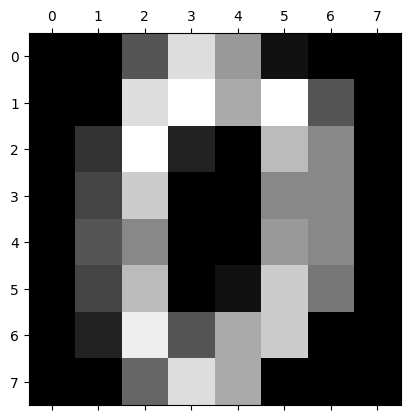

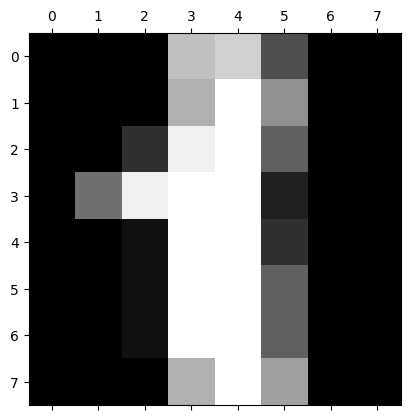

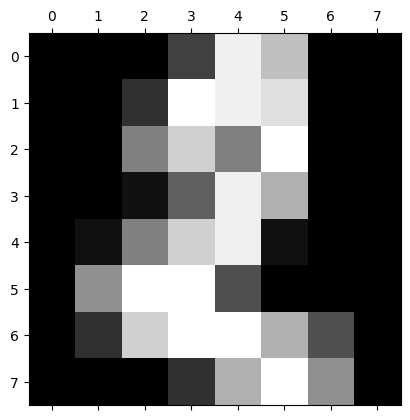

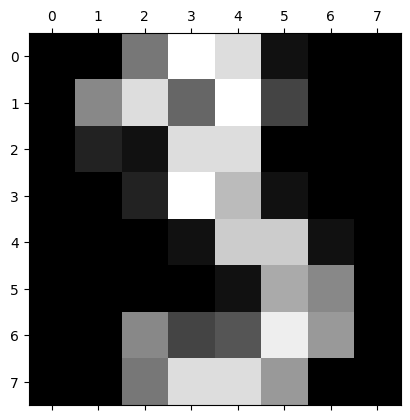

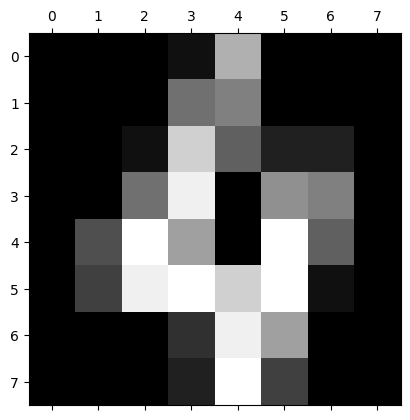

In [ ]:
digital = load_digits()
%matplotlib inline
plt.gray()
for i in range(5):
  plt.matshow(digital.images[i])

In [ ]:
data = pd.DataFrame(digital.data)
data.head()

,0,1,2,3,4,5,6,7,8,9,...,54,55,56,57,58,59,60,61,62,63
0,0.0,0.0,5.0,13.0,9.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,6.0,13.0,10.0,0.0,0.0,0.0
1,0.0,0.0,0.0,12.0,13.0,5.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,11.0,16.0,10.0,0.0,0.0
2,0.0,0.0,0.0,4.0,15.0,12.0,0.0,0.0,0.0,0.0,...,5.0,0.0,0.0,0.0,0.0,3.0,11.0,16.0,9.0,0.0
3,0.0,0.0,7.0,15.0,13.0,1.0,0.0,0.0,0.0,8.0,...,9.0,0.0,0.0,0.0,7.0,13.0,13.0,9.0,0.0,0.0
4,0.0,0.0,0.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2.0,16.0,4.0,0.0,0.0


In [ ]:
data['target'] = digital.target
data.head()

,0,1,2,3,4,5,6,7,8,9,...,55,56,57,58,59,60,61,62,63,target
0,0.0,0.0,5.0,13.0,9.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,6.0,13.0,10.0,0.0,0.0,0.0,0
1,0.0,0.0,0.0,12.0,13.0,5.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,11.0,16.0,10.0,0.0,0.0,1
2,0.0,0.0,0.0,4.0,15.0,12.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,3.0,11.0,16.0,9.0,0.0,2
3,0.0,0.0,7.0,15.0,13.0,1.0,0.0,0.0,0.0,8.0,...,0.0,0.0,0.0,7.0,13.0,13.0,9.0,0.0,0.0,3
4,0.0,0.0,0.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2.0,16.0,4.0,0.0,0.0,4


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(data.drop(['target'],axis='columns'),data.target,test_size=0.2)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
model_forest = RandomForestClassifier(n_estimators=100) # number of trees in the forest
model_forest.fit(X_train, y_train)

RandomForestClassifier()

In [ ]:
model_forest.score(X_test, y_test)

0.975

In [ ]:
y_pred = model_forest.predict(X_test)

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
cm

array([[28,  0,  0,  0,  1,  0,  0,  0,  0,  0],
       [ 0, 48,  0,  0,  0,  0,  0,  0,  0,  0],
       [ 0,  0, 33,  0,  0,  0,  0,  0,  0,  0],
       [ 0,  0,  0, 30,  0,  2,  0,  0,  3,  0],
       [ 0,  0,  0,  0, 38,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0, 32,  1,  0,  0,  1],
       [ 0,  0,  0,  0,  0,  0, 37,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0,  0, 36,  0,  0],
       [ 0,  0,  0,  0,  0,  1,  0,  0, 30,  0],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0, 39]])

Text(95.72222222222221, 0.5, 'Truth')

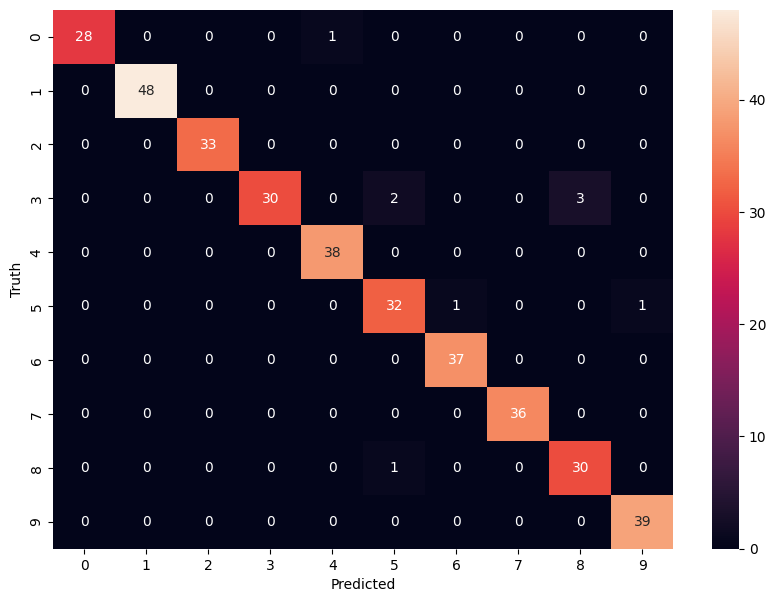

In [ ]:
import seaborn as sn
plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')



---
Exercise


In [ ]:
ir = load_iris()
ir_df = pd.DataFrame(ir.data, columns = ir.feature_names)
ir_df.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


In [ ]:
ir_target = ir.target
ir_target = pd.DataFrame(ir_target, columns = ['target'])

,target
0,0
1,0
2,0
3,0
4,0


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(ir_df,ir_target,test_size=0.2)
model_forest_iris = RandomForestClassifier(n_estimators=1000)
model_forest_iris.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestClassifier(n_estimators=1000)

In [ ]:
model_forest_iris.score(X_test, y_test)

0.9666666666666667

### Bagging



> Bagging - Bootstrp Aggregating

* Bagging trains n base learners in parallel
* Make decision by averaging learners' outputs(regression) or majority voting(classification)
* Each learner is trained on data by bootstrap sampling
  * Assume m training examples, then randomly sampling m examples with replacement
  * Around 1-1/e ≈ 63% examples will be sampled, the remain 37% may not be sampled and can be used for validation. (Out of bag)



In [ ]:
# Bagging implementation and explanation
class Bagging:
    def __init__(self, base_learner, n_learners):
        self.learners = [clone(base_learner) for _ in range(n_learners)]
# 1. `__init__` Method:
#    - Initializes the Bagging class, accepting a base learner (`base_learner`) and the number of learners (`n_learners`).
#    - Uses the `clone` method to replicate the base learner, creating multiple instances and storing them in the `self.learners` list.

    def fit(self, X, y):
        for learner in self.learners:
            examples = np.random.choice(
                np.arange(len(X)), int(len(X)), replace=True)
            learner.fit(X.iloc[examples, :], y.iloc[examples])
# 2. `fit` Method:
#    - Generates different training data subsets for each base learner through random sampling and trains each learner.
#    - Uses `np.random.choice` with replacement to ensure each learner sees a different subset of the training data.


    def predict(self, X):
        preds = [learner.predict(X) for learner in self.learners]
        return np.array(preds).mean(axis=0)
# 3. `predict` Method:
#    - Makes predictions using each base learner and averages all the predictions to produce the final Bagging model output.
#    - `np.array(preds).mean(axis=0)` averages the predictions from multiple learners to reduce the bias of individual learners.

In [ ]:
import pandas as pd
import numpy as np
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.base import clone

X, y = make_classification(n_samples=500, n_features=10, n_classes=2, random_state=42)
X = pd.DataFrame(X)
y = pd.Series(y)

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize a base learner (Decision Tree)
base_learner = DecisionTreeClassifier()

# Create Bagging model with 10 base learners
bagging_model = Bagging(base_learner, n_learners=10)

# Train the Bagging model
bagging_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = bagging_model.predict(X_test)

# Evaluate the model
accuracy = np.mean(y_pred.round() == y_test)
print(f'Bagging Model Accuracy: {accuracy:.2f}')

Bagging Model Accuracy: 0.92




---



In [ ]:
df = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/diabetes.csv')
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [ ]:
df.isnull().sum()

,0
Pregnancies,0
Glucose,0
BloodPressure,0
SkinThickness,0
Insulin,0
BMI,0
DiabetesPedigreeFunction,0
Age,0
Outcome,0


In [ ]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [ ]:
df.value_counts(df['Outcome']==1)/len(df)

,count
Outcome,
False,0.651042
True,0.348958


In [ ]:
X = df.drop('Outcome',axis='columns')
y = df.Outcome

In [ ]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, stratify=y, random_state=10)
# stratify 参数用于确保拆分后的训练集和测试集中，目标变量（y）的分布与原始数据集保持一致，特别是对于分类任务中的类别不平衡情况非常有用
#在分类问题中，如果目标变量的类别分布不平衡，比如某些类别的数据量远少于其他类别，直接进行随机拆分可能会导致训练集和测试集中的类别分布不均衡，进而影响模型的性能

In [ ]:
y_train.value_counts()/len(y_train)

,count
Outcome,
0,0.651042
1,0.348958


In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier

In [ ]:
cross_val_score(DecisionTreeClassifier(), X, y, cv=5).mean()

0.7175621763857057

In [ ]:
# Using bagging

In [ ]:
from sklearn.ensemble import BaggingClassifier
bag_model = BaggingClassifier(
    estimator=DecisionTreeClassifier(),
    n_estimators=100, # number of trees
    max_samples=0.8, # max number of samples to train
    oob_score=True, # out of bag score
    random_state=0
)
bag_model.fit(X_train, y_train)
bag_model.oob_score_

0.7534722222222222

In [ ]:
bag_model_cross = BaggingClassifier(
    estimator=DecisionTreeClassifier(),
    n_estimators=100, # number of trees
    max_samples=0.8, # max number of samples to train
    oob_score=True, # out of bag score
    random_state=0
)
cross_val_score(bag_model_cross, X, y, cv=5).mean()

0.7578728461081402

In [ ]:
cross_val_score(RandomForestClassifier(), X, y, cv=5).mean()

0.7683133859604449

In [ ]:
bag_model_r = BaggingClassifier(
    estimator=RandomForestClassifier(),# Random forest is one kind of bagging so do not need any more
    n_estimators=50, # number of trees
    max_samples=0.8, # max number of samples to train
    oob_score=True, # out of bag score
    random_state=0
)
cross_val_score(bag_model_r, X, y, cv=5).mean()

0.7669977081741788



---

Exercise

In [ ]:
heart = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/heart.csv')
heart.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.0,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.0,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.0,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.5,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.0,Up,0


In [ ]:
heart.describe()

,Age,RestingBP,Cholesterol,FastingBS,MaxHR,Oldpeak,HeartDisease
count,918.000000,918.000000,918.000000,918.000000,918.000000,918.000000,918.000000
mean,53.510893,132.396514,198.799564,0.233115,136.809368,0.887364,0.553377
std,9.432617,18.514154,109.384145,0.423046,25.460334,1.066570,0.497414
min,28.000000,0.000000,0.000000,0.000000,60.000000,-2.600000,0.000000
25%,47.000000,120.000000,173.250000,0.000000,120.000000,0.000000,0.000000
50%,54.000000,130.000000,223.000000,0.000000,138.000000,0.600000,1.000000
75%,60.000000,140.000000,267.000000,0.000000,156.000000,1.500000,1.000000
max,77.000000,200.000000,603.000000,1.000000,202.000000,6.200000,1.000000


In [ ]:
#Outlier detection
heart[heart.Cholesterol>(heart.Cholesterol.mean()+3*heart.Cholesterol.std())]

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
76,32,M,ASY,118,529,0,Normal,130,N,0.0,Flat,1
149,54,M,ASY,130,603,1,Normal,125,Y,1.0,Flat,1
616,67,F,NAP,115,564,0,LVH,160,N,1.6,Flat,0


In [ ]:
heart = heart[heart.Cholesterol<=(heart.Cholesterol.mean()+3*heart.Cholesterol.std())]

In [ ]:
heart[heart.RestingBP>(heart.RestingBP.mean()+3*heart.RestingBP.std())]

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
109,39,M,ATA,190,241,0,Normal,106,N,0.0,Up,0
241,54,M,ASY,200,198,0,Normal,142,Y,2.0,Flat,1
365,64,F,ASY,200,0,0,Normal,140,Y,1.0,Flat,1
399,61,M,NAP,200,0,1,ST,70,N,0.0,Flat,1
592,61,M,ASY,190,287,1,LVH,150,Y,2.0,Down,1
732,56,F,ASY,200,288,1,LVH,133,Y,4.0,Down,1
759,54,M,ATA,192,283,0,LVH,195,N,0.0,Up,1


In [ ]:
heart = heart[heart.RestingBP<=(heart.RestingBP.mean()+3*heart.RestingBP.std())]

In [ ]:
heart[heart.Oldpeak>(heart.Oldpeak.mean()+3*heart.Oldpeak.std())]

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
166,50,M,ASY,140,231,0,ST,140,Y,5.0,Flat,1
702,59,M,TA,178,270,0,LVH,145,N,4.2,Down,0
771,55,M,ASY,140,217,0,Normal,111,Y,5.6,Down,1
791,51,M,ASY,140,298,0,Normal,122,Y,4.2,Flat,1
850,62,F,ASY,160,164,0,LVH,145,N,6.2,Down,1
900,58,M,ASY,114,318,0,ST,140,N,4.4,Down,1


In [ ]:
heart = heart[heart.Oldpeak<=(heart.Oldpeak.mean()+3*heart.Oldpeak.std())]

In [ ]:
heart.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.0,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.0,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.0,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.5,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.0,Up,0


In [ ]:
# prompt: 使用 DataFrame“heart”: compiling the text label into numbers

# Create a dictionary to map categorical values to numerical values
label_mapping = {
    'Sex': {'M': 1, 'F': 0},
    'ChestPainType': {'ATA': 0, 'NAP': 1, 'ASY': 2, 'TA': 3},
    'RestingECG': {'Normal': 0, 'ST': 1, 'LVH': 2},
    'ExerciseAngina': {'N': 0, 'Y': 1},
    'ST_Slope': {'Up': 0, 'Flat': 1, 'Down': 2}
}

# Iterate through the columns and replace the text labels with numerical values
for column, mapping in label_mapping.items():
    heart[column] = heart[column].map(mapping)


In [ ]:
X= heart.drop('HeartDisease',axis='columns')
y = heart.HeartDisease

In [ ]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=20)

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score
cross_val_score(SVC(), X, y, cv=5).mean()

0.6906445672191528

In [ ]:
cross_val_score(DecisionTreeClassifier(), X, y, cv=5).mean()

0.7427378759975446

In [ ]:
bag_model = BaggingClassifier(
    estimator=SVC(),
    n_estimators=100,
    max_samples=0.8,
    oob_score=True,
    random_state=0
)
cross_val_score(bag_model, X, y, cv=5).mean()

0.6839656230816453

In [ ]:
bag_model = BaggingClassifier(
    estimator=DecisionTreeClassifier(random_state=0),
    n_estimators=100,
    max_samples=0.8,
    oob_score=True,
    random_state=0
)
cross_val_score(bag_model, X, y, cv=5).mean()

0.8047943523634131

In [ ]:
cross_val_score(RandomForestClassifier(), X, y, cv=5).mean()

0.8225537139349296



> Unstable Learners

* Bagging reduces variance, especially for unstable leaners
  * Models with high variance is unstable





### Boosting

* Boosting combines weak leaners into a strong one
  * Primarily to reduce bias

* Learn n weak learners sequentially, at step i:
  * Train a weak learner $h_i$ evaluate its $ϵ_t$
  * Re-sample data according to $ϵ_t$ to focus on wrongly predicted samples

* Notable examples include AdaBoost, gradient boosting



> **Gradient Boosting**

* Denote by $H_t(x)$ the model at time t, with $H_1(x)=0$

* At step t=1
  * Train a new model $h_t$ on residuals: $\{(x_i, y_i - H_t(x_i))\}_{i=1,\ldots,m}$

  * $H_{t+1}(x)= H_t(x) + ŋ f_t(x)$
    * The learning rate ŋ regularizes the model by shrinkage

* The residuals equal to $-\frac{\partial L}{\partial H}$ if using MSE as the loss
  * Other boosting algorithms (e.g. AdaBoost) can also be

In [ ]:
import numpy as np
from sklearn.base import clone

# Gradient Boosting implementation
class GradientBoosting:
# 1. `__init__` Method:
#    - Initializes the GradientBoosting class, accepting a base learner (`base_learner`), the number of learners (`n_learners`), and the learning rate (`learning_rate`).
#    - Uses the `clone` method to replicate the base learner, creating multiple instances and storing them in the `self.learners` list.
#    - Stores the learning rate in `self.lr`.
    def __init__(self, base_learner, n_learners, learning_rate):
        self.learners = [clone(base_learner) for _ in range(n_learners)]
        self.lr = learning_rate
# 2. `fit` Method:
#    - Fits the learners sequentially by training each learner on the current residuals.
#    - The residual is computed by subtracting the predictions of the current learner, multiplied by the learning rate, from the previous residual.
    def fit(self, X, y):
        residual = y.copy()
        for learner in self.learners:
            learner.fit(X, residual)
            residual -= self.lr * learner.predict(X)
# 3. `predict` Method:
#    - Makes predictions using each base learner and sums the predictions, scaled by the learning rate, to produce the final Gradient Boosting model output.
#    - `np.array(preds).sum(axis=0) * self.lr` aggregates the predictions from multiple learners and scales them by the learning rate.
    def predict(self, X):
        preds = [learner.predict(X) for learner in self.learners]
        return np.array(preds).sum(axis=0) * self.lr



> Gradient Boosting Decision Tree (GBDT)

* Use decision tree as the weak learner

  Gradient Boosting is very likely to overfit, so:

  * Regularize by a small max_depth and randomly sampling features

* Sequentially constructing trees runs slow
  * Popular libraries use acelerated algorithms, e.g. XGBoost, lightGBM



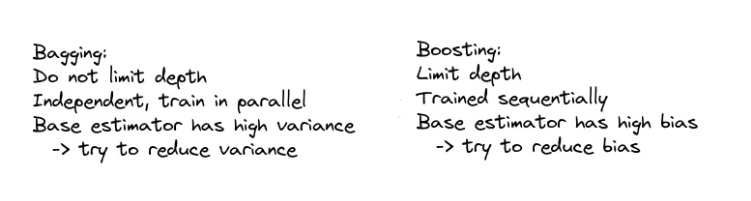



---



### Stacking

* Combine multiple base learners to reduce variance
  * Base learners can be different model types
  * Linearly combine base learners outputs by learned parameters
  * Go through a final fully connected layer and output
  * Every model training on the original data
* Widely used in competitions
* In comparison, bagging
  * Uses same type models
  * Uses bootstrap to get diversity



> **Multi-layer Stacking**

* Stacking base learners in multiple levels to reduce bias

  * Can use a different set of base learner at each level

* Upper levels are trained on the outputs of the below level
  (the output of the firt stacking layer can be the input of the next stacking layer)
  * Concat orginal inputs to the upper level may helps

* Quite likely to overfit




> **Overfitting in Multi-layer Stacking**

* Train learners from different levels on different data to alleviate overfitting

  * Split training data into A and B, train L1 learners on A, predict on B to generate inputs to L2 learners

* Repeat k-fold bagging:

  * Train k models as in k-fold cross validation
  * Combine predictions of each model on out-of-fold data (Those data consist a data set which not been trained before)
  * Repeat step 1,2 by n times, average the n predictions of each next level training



## SVM

In [ ]:
from sklearn.datasets import load_iris
iris = load_iris()

In [ ]:
dir(iris)

['DESCR',
 'data',
 'data_module',
 'feature_names',
 'filename',
 'frame',
 'target',
 'target_names']

In [ ]:
iris.feature_names

['sepal length (cm)',
 'sepal width (cm)',
 'petal length (cm)',
 'petal width (cm)']

In [ ]:
df = pd.DataFrame(iris.data,columns=iris.feature_names)
df.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


In [ ]:
df['target'] = iris.target
iris.target_names

array(['setosa', 'versicolor', 'virginica'], dtype='<U10')

In [ ]:
df[df.target==2].head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
100,6.3,3.3,6.0,2.5,2
101,5.8,2.7,5.1,1.9,2
102,7.1,3.0,5.9,2.1,2
103,6.3,2.9,5.6,1.8,2
104,6.5,3.0,5.8,2.2,2


In [ ]:
df['flower_name'] =df.target.apply(lambda x: iris.target_names[x])
df.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target,flower_name
0,5.1,3.5,1.4,0.2,0,setosa
1,4.9,3.0,1.4,0.2,0,setosa
2,4.7,3.2,1.3,0.2,0,setosa
3,4.6,3.1,1.5,0.2,0,setosa
4,5.0,3.6,1.4,0.2,0,setosa


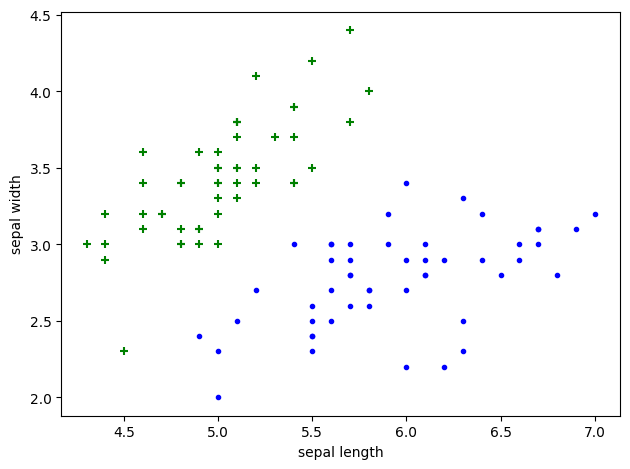

In [ ]:
from matplotlib import pyplot as plt
%matplotlib inline
df0 = df[df.target==0]
df1 = df[df.target==1]
df2 = df[df.target==2]
plt.scatter(df0['sepal length (cm)'], df0['sepal width (cm)'],color="green",marker='+')
plt.scatter(df1['sepal length (cm)'], df1['sepal width (cm)'],color="blue",marker='.')
plt.xlabel('sepal length')
plt.ylabel('sepal width')
plt.tight_layout()

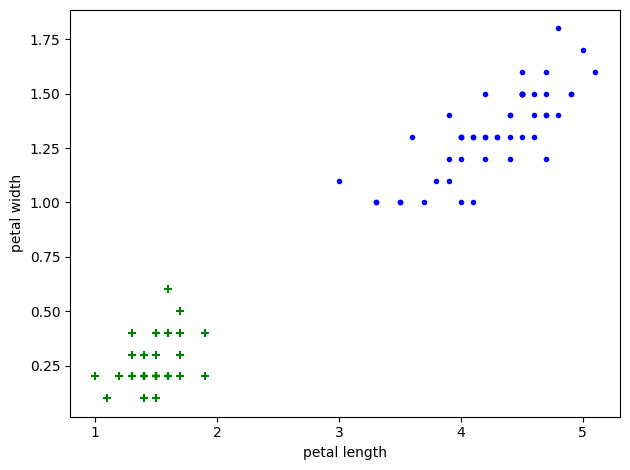

In [ ]:
plt.scatter(df0['petal length (cm)'], df0['petal width (cm)'],color="green",marker='+')
plt.scatter(df1['petal length (cm)'], df1['petal width (cm)'],color="blue",marker='.')
plt.xlabel('petal length')
plt.ylabel('petal width')
plt.tight_layout()

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df.drop(['target','flower_name'],axis='columns'), df.target, test_size=0.2)

In [ ]:
from sklearn import svm
model = svm.SVC()
model.fit(X_train, y_train)

SVC()

In [ ]:
model.score(X_test, y_test)

1.0



---
Exercies


In [ ]:
from sklearn.datasets import load_digits
digit = load_digits()

In [ ]:
digit.target

array([0, 1, 2, ..., 8, 9, 8])

In [ ]:
df = pd.DataFrame(digit.data,digit.target)
df.head()

,0,1,2,3,4,5,6,7,8,9,...,54,55,56,57,58,59,60,61,62,63
0,0.0,0.0,5.0,13.0,9.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,6.0,13.0,10.0,0.0,0.0,0.0
1,0.0,0.0,0.0,12.0,13.0,5.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,11.0,16.0,10.0,0.0,0.0
2,0.0,0.0,0.0,4.0,15.0,12.0,0.0,0.0,0.0,0.0,...,5.0,0.0,0.0,0.0,0.0,3.0,11.0,16.0,9.0,0.0
3,0.0,0.0,7.0,15.0,13.0,1.0,0.0,0.0,0.0,8.0,...,9.0,0.0,0.0,0.0,7.0,13.0,13.0,9.0,0.0,0.0
4,0.0,0.0,0.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2.0,16.0,4.0,0.0,0.0


In [ ]:
df['target'] = digit.target
df.head()

,0,1,2,3,4,5,6,7,8,9,...,55,56,57,58,59,60,61,62,63,target
0,0.0,0.0,5.0,13.0,9.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,6.0,13.0,10.0,0.0,0.0,0.0,0
1,0.0,0.0,0.0,12.0,13.0,5.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,11.0,16.0,10.0,0.0,0.0,1
2,0.0,0.0,0.0,4.0,15.0,12.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,3.0,11.0,16.0,9.0,0.0,2
3,0.0,0.0,7.0,15.0,13.0,1.0,0.0,0.0,0.0,8.0,...,0.0,0.0,0.0,7.0,13.0,13.0,9.0,0.0,0.0,3
4,0.0,0.0,0.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2.0,16.0,4.0,0.0,0.0,4


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df.drop('target',axis='columns'),df.target,test_size=0.2)

In [ ]:
model_rbf = svm.SVC(kernel='rbf')
model_rbf.fit(X_train, y_train)

SVC()

In [ ]:
model_rbf.score(X_test, y_test)

0.9944444444444445

In [ ]:
model_linear = svm.SVC(kernel='linear')
model_linear.fit(X_train, y_train)

SVC(kernel='linear')

In [ ]:
model_linear.score(X_test, y_test)

0.9833333333333333

## K-means


In [ ]:
from sklearn.cluster import KMeans
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from matplotlib import pyplot as plt
%matplotlib inline

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/income.csv')
df.head()

,Name,Age,Income($)
0,Rob,27,70000
1,Michael,29,90000
2,Mohan,29,61000
3,Ismail,28,60000
4,Kory,42,150000


Text(0, 0.5, 'Income')

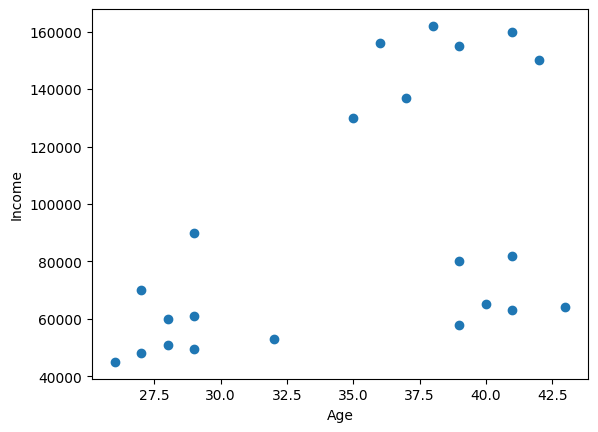

In [ ]:
plt.scatter(df.Age,df['Income($)'])
plt.xlabel('Age')
plt.ylabel('Income')

In [ ]:
km = KMeans(n_clusters=3)
km

KMeans(n_clusters=3)

In [ ]:
y_pred = km.fit_predict(df[['Age','Income($)']])
df['cluster'] = y_pred
df.head()

,Name,Age,Income($),cluster
0,Rob,27,70000,2
1,Michael,29,90000,0
2,Mohan,29,61000,2
3,Ismail,28,60000,2
4,Kory,42,150000,1


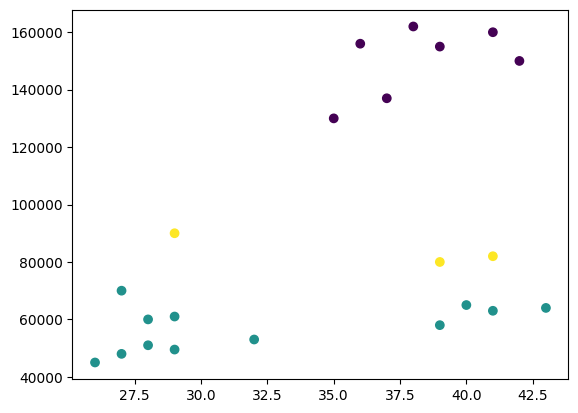

In [ ]:
plt.scatter(df.Age,df['Income($)'],c=y_pred)

In [ ]:
# scaling
scaler = MinMaxScaler()
scaler.fit(df[['Income($)']])
df['Income($)'] = scaler.transform(df[['Income($)']])
scaler.fit(df[['Age']])
df['Age'] = scaler.transform(df[['Age']])
df.head()

,Name,Age,Income($),cluster
0,Rob,0.058824,0.213675,1
1,Michael,0.176471,0.384615,1
2,Mohan,0.176471,0.136752,1
3,Ismail,0.117647,0.128205,1
4,Kory,0.941176,0.897436,2


In [ ]:
km = KMeans(n_clusters=3)
y_pred = km.fit_predict(df[['Age','Income($)']])
df['cluster'] = y_pred
df.head()

,Name,Age,Income($),cluster
0,Rob,0.058824,0.213675,1
1,Michael,0.176471,0.384615,1
2,Mohan,0.176471,0.136752,1
3,Ismail,0.117647,0.128205,1
4,Kory,0.941176,0.897436,2


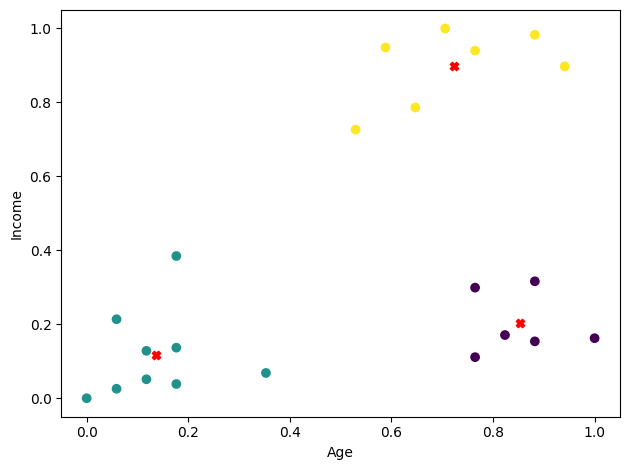

In [ ]:
plt.scatter(df.Age,df['Income($)'],c=y_pred)
plt.scatter(km.cluster_centers_[:,0],km.cluster_centers_[:,1],color='red',marker='X')
plt.xlabel('Age')
plt.ylabel('Income')
plt.tight_layout()

In [ ]:
k_rng = range(1,10)
sse = []
for k in k_rng:
  km = KMeans(n_clusters=k)
  km.fit(df[['Age','Income($)']])
  sse.append(km.inertia_)

In [ ]:
sse

[5.434011511988176,
 2.345614491472593,
 0.4750783498553095,
 0.4028477025733999,
 0.2761293767785354,
 0.31127658615237364,
 0.20850738640198316,
 0.15159646490421638,
 0.11304517838728051]

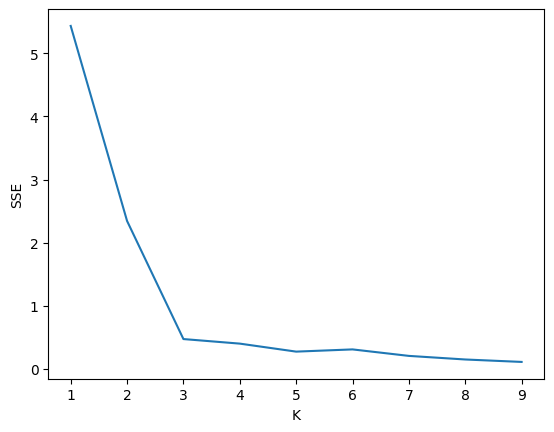

In [ ]:
plt.xlabel('K')
plt.ylabel('SSE')
plt.plot(k_rng,sse)



---
Exercise




In [ ]:
from sklearn.cluster import KMeans
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from matplotlib import pyplot as plt
from sklearn.datasets import load_iris
%matplotlib inline

In [ ]:
iris = load_iris()
df = pd.DataFrame(iris.data,columns=iris.feature_names)
df.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


In [ ]:
df['flower'] = iris.target
df.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),flower
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0


In [ ]:
df.drop(['sepal length (cm)', 'sepal width (cm)', 'flower'],axis='columns',inplace=True)


In [ ]:
km = KMeans(n_clusters=3)
yp = km.fit_predict(df)
df['cluster'] = yp

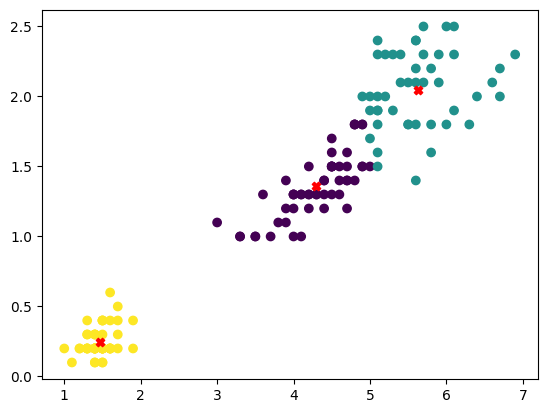

In [ ]:
plt.scatter(df['petal length (cm)'],df['petal width (cm)'],c=yp)
plt.scatter(km.cluster_centers_[:,0],km.cluster_centers_[:,1],color='red',marker='X')

In [ ]:
sse = []
k_rng = range(1,10)
for k in k_rng:
  km = KMeans(n_clusters=k)
  km.fit(df)
  sse.append(km.inertia_)

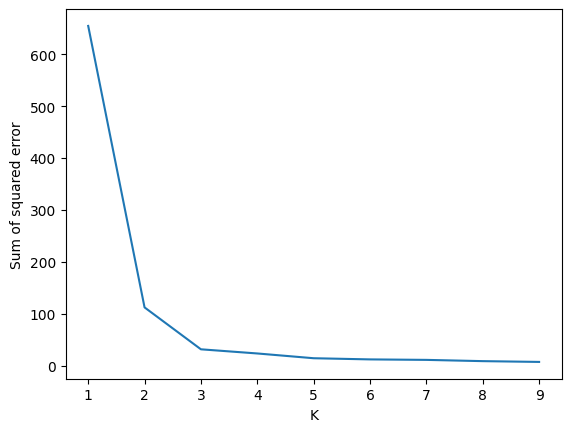

In [ ]:
plt.xlabel('K')
plt.ylabel('Sum of squared error')
plt.plot(k_rng,sse)

## K Nearest Neighbors  (KNN)

In [ ]:
iris = load_iris()
df = pd.DataFrame(iris.data,columns=iris.feature_names)
df['target'] = iris.target
df['flower'] = df.target.apply(lambda x: iris.target_names[x])

In [ ]:
%matplotlib inline
df0 = df[df.target==0]
df1 = df[df.target==1]
df2 = df[df.target==2]

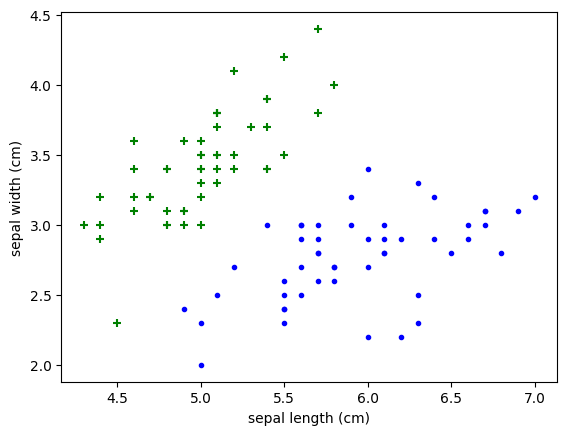

In [ ]:
plt.xlabel('sepal length (cm)')
plt.ylabel('sepal width (cm)')
plt.scatter(df0['sepal length (cm)'], df0['sepal width (cm)'],color="green",marker='+')
plt.scatter(df1['sepal length (cm)'], df1['sepal width (cm)'],color="blue",marker='.')

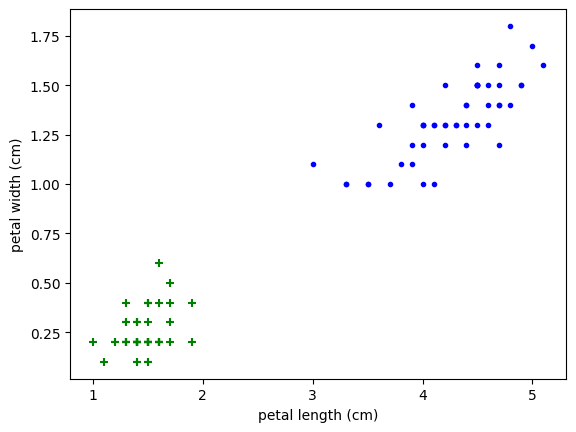

In [ ]:
plt.xlabel('petal length (cm)')
plt.ylabel('petal width (cm)')
plt.scatter(df0['petal length (cm)'], df0['petal width (cm)'],color="green",marker='+')
plt.scatter(df1['petal length (cm)'], df1['petal width (cm)'],color="blue",marker='.')

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df.drop(['target','flower'],axis='columns'),df.target,test_size=0.2)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=3)

In [ ]:
knn.score(X_test, y_test)

0.9

In [ ]:
from sklearn.metrics import confusion_matrix
y_pred = knn.predict(X_test)
cm = confusion_matrix(y_test, y_pred)

array([[ 8,  0,  0],
       [ 0,  9,  3],
       [ 0,  0, 10]])

In [ ]:
iris.target_names

array(['setosa', 'versicolor', 'virginica'], dtype='<U10')

Text(95.72222222222221, 0.5, 'Truth')

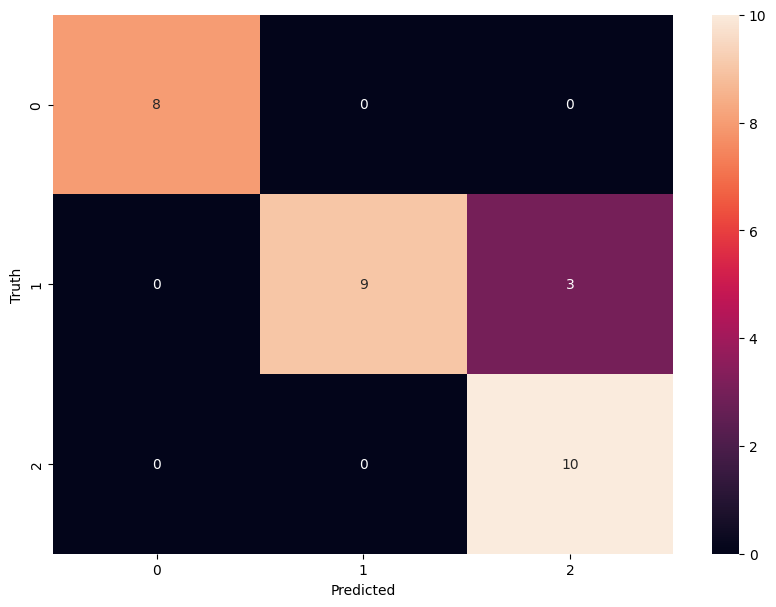

In [ ]:
import seaborn as sn
plt.figure(figsize = (10,7))
sn.heatmap(cm, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         8
           1       1.00      0.75      0.86        12
           2       0.77      1.00      0.87        10

    accuracy                           0.90        30
   macro avg       0.92      0.92      0.91        30
weighted avg       0.92      0.90      0.90        30





---

Exercise


In [ ]:
from sklearn.datasets import load_digits
digits = load_digits()

In [ ]:
df = pd.DataFrame(digits.data,columns=digits.feature_names)
X_train, X_test, y_train, y_test = train_test_split(df,digits.target,test_size=0.2)

In [ ]:
knn_ex = KNeighborsClassifier(n_neighbors=5)
knn_ex.fit(X_train, y_train)

KNeighborsClassifier()

In [ ]:
knn_ex.score(X_test, y_test)

0.9888888888888889

In [ ]:
y_pred_ex = knn_ex.predict(X_test)

In [ ]:
scores = []

for k in range(1,20):
  knn = KNeighborsClassifier(n_neighbors=k)
  knn.fit(X_train, y_train)
  scores.append({'k': k, 'score': knn.score(X_test, y_test)})

scores = pd.DataFrame(scores)
scores.sort_values(by='score', ascending=False)

,k,score
0,1,0.994444
2,3,0.994444
1,2,0.994444
3,4,0.991667
5,6,0.991667
4,5,0.988889
7,8,0.986111
11,12,0.986111
6,7,0.983333
10,11,0.983333


Text(95.72222222222221, 0.5, 'Truth')

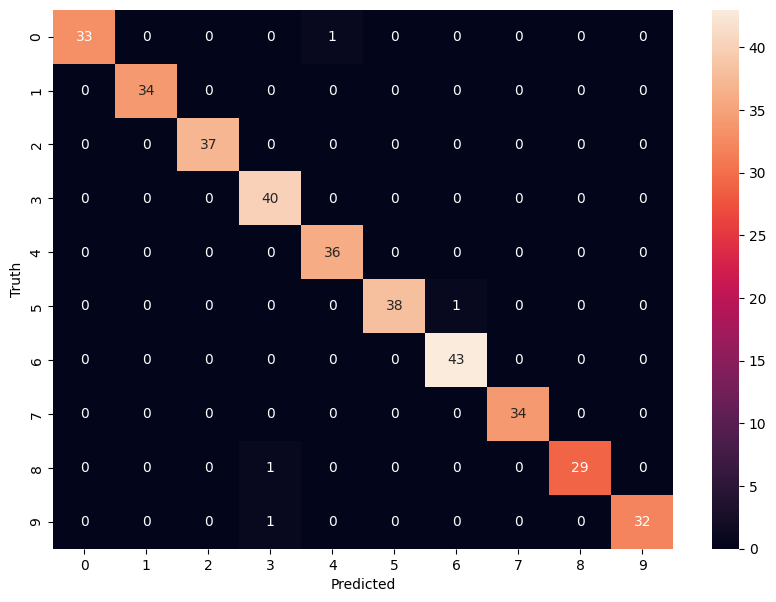

In [ ]:
cm_ex = confusion_matrix(y_test, y_pred_ex)
plt.figure(figsize = (10,7))
sn.heatmap(cm_ex, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [ ]:
print(classification_report(y_test, y_pred_ex))

              precision    recall  f1-score   support

           0       1.00      0.97      0.99        34
           1       1.00      1.00      1.00        34
           2       1.00      1.00      1.00        37
           3       0.95      1.00      0.98        40
           4       0.97      1.00      0.99        36
           5       1.00      0.97      0.99        39
           6       0.98      1.00      0.99        43
           7       1.00      1.00      1.00        34
           8       1.00      0.97      0.98        30
           9       1.00      0.97      0.98        33

    accuracy                           0.99       360
   macro avg       0.99      0.99      0.99       360
weighted avg       0.99      0.99      0.99       360



## GMM with EM



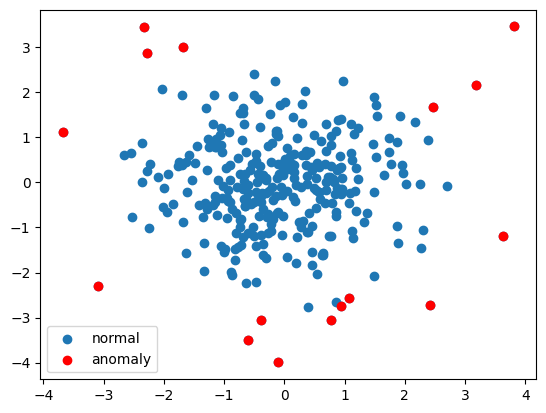

In [ ]:
import numpy as np
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt

# 生成示例数据
np.random.seed(0)
# 正常数据
X_normal = np.random.normal(0, 1, (300, 2))
# 异常数据
X_anomaly = np.random.uniform(-4, 4, (20, 2))
X = np.vstack([X_normal, X_anomaly])

# 训练GMM
gmm = GaussianMixture(n_components=2, covariance_type='full')
gmm.fit(X_normal)  # 仅用正常数据训练

# 计算概率密度
probs = gmm.score_samples(X)

# 设定阈值
threshold = np.percentile(probs, 5)  # 取最低5%的概率作为异常阈值

# 识别异常
anomalies = X[probs < threshold]

# 可视化
plt.scatter(X[:, 0], X[:, 1], label='normal')
plt.scatter(anomalies[:, 0], anomalies[:, 1], color='red', label='anomaly')
plt.legend()
plt.show()


## Naive Bayes

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/titanic-n.csv')
df.head()

,PassengerId,Name,Pclass,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived
0,1,"Braund, Mr. Owen Harris",3,male,22.0,1,0,A/5 21171,7.2500,NaN,S,0
1,2,"Cumings, Mrs. John Bradley (Florence Briggs Th...",1,female,38.0,1,0,PC 17599,71.2833,C85,C,1
2,3,"Heikkinen, Miss. Laina",3,female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S,1
3,4,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",1,female,35.0,1,0,113803,53.1000,C123,S,1
4,5,"Allen, Mr. William Henry",3,male,35.0,0,0,373450,8.0500,NaN,S,0


In [ ]:
df.drop(['PassengerId','Name','SibSp','Parch','Ticket','Cabin','Embarked'],axis='columns',inplace=True)
df.head()

,Pclass,Sex,Age,Fare,Survived
0,3,male,22.0,7.2500,0
1,1,female,38.0,71.2833,1
2,3,female,26.0,7.9250,1
3,1,female,35.0,53.1000,1
4,3,male,35.0,8.0500,0


In [ ]:
target = df.Survived
inputs = df.drop('Survived',axis='columns')

In [ ]:
dummies = pd.get_dummies(inputs.Sex).astype(int)
dummies.head(3)

,female,male
0,0,1
1,1,0
2,1,0


In [ ]:
inputs = inputs.drop('Sex',axis='columns')
inputs = pd.concat([inputs,dummies],axis='columns')
inputs.head(3)

,Pclass,Age,Fare,female,male
0,3,22.0,7.2500,0,1
1,1,38.0,71.2833,1,0
2,3,26.0,7.9250,1,0


In [ ]:
inputs.columns[inputs.isna().any()]

Index(['Age'], dtype='object')

In [ ]:
inputs.Age = inputs.Age.fillna(inputs.Age.mean())
inputs.head()

,Pclass,Age,Fare,female,male
0,3,22.0,7.2500,0,1
1,1,38.0,71.2833,1,0
2,3,26.0,7.9250,1,0
3,1,35.0,53.1000,1,0
4,3,35.0,8.0500,0,1


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(inputs,target,test_size=0.2)

In [ ]:
from sklearn.naive_bayes import GaussianNB
model = GaussianNB()
model.fit(X_train,y_train)

GaussianNB()

In [ ]:
model.score(X_test,y_test)

0.8268156424581006

In [ ]:
y_test[:10]

,Survived
323,1
453,1
691,1
657,0
521,0
864,0
684,0
273,0
572,1
870,0


In [ ]:
model.predict(X_test[:10])

array([1, 0, 1, 1, 0, 0, 0, 0, 0, 0])

In [ ]:
model.predict_proba(X_test[:10])

array([[0.03584258, 0.96415742],
       [0.54849798, 0.45150202],
       [0.04943113, 0.95056887],
       [0.09416152, 0.90583848],
       [0.98772113, 0.01227887],
       [0.97432071, 0.02567929],
       [0.96232105, 0.03767895],
       [0.91710121, 0.08289879],
       [0.91963444, 0.08036556],
       [0.98854079, 0.01145921]])

In [ ]:
spam = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/spam.csv')
spam.head()

,Category,Message
0,ham,"Go until jurong point, crazy.. Available only ..."
1,ham,Ok lar... Joking wif u oni...
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...
3,ham,U dun say so early hor... U c already then say...
4,ham,"Nah I don't think he goes to usf, he lives aro..."


In [ ]:
spam.groupby('Category').describe()

Message                                                            \
           count unique                                                top   
Category                                                                     
ham         4825   4516                             Sorry, I'll call later   
spam         747    641  Please call our customer service representativ...   

               
         freq  
Category       
ham        30  
spam        4

In [ ]:
spam['spam'] = spam['Category'].apply(lambda x: 1 if x=='spam' else 0)
spam.head()

,Category,Message,spam
0,ham,"Go until jurong point, crazy.. Available only ...",0
1,ham,Ok lar... Joking wif u oni...,0
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...,1
3,ham,U dun say so early hor... U c already then say...,0
4,ham,"Nah I don't think he goes to usf, he lives aro...",0


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(spam.Message,spam.spam,test_size=0.25)

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
v = CountVectorizer()
X_train_count = v.fit_transform(X_train.values)
X_train_count.toarray()[:3]

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [ ]:
from sklearn.naive_bayes import MultinomialNB
model = MultinomialNB()
model.fit(X_train_count,y_train)

MultinomialNB()

In [ ]:
model.score(v.transform(X_test),y_test)

0.9877961234745154

In [ ]:
emails = ['Hey mohan, can we get together to watch football game tomorrow?',
      'Up to 20% discount on parking, exclusive offer just for you. Dont miss this reward!'
]
emails_count = v.transform(emails)
model.predict(emails_count)

array([0, 1])

In [ ]:
from sklearn.pipeline import Pipeline
clf = Pipeline([
    ('vectorizer', CountVectorizer()),
    ('nb', MultinomialNB())
])
clf.fit(X_train, y_train)

Pipeline(steps=[('vectorizer', CountVectorizer()), ('nb', MultinomialNB())])

In [ ]:
clf.predict(emails)

array([0, 1])

In [ ]:
clf.score(X_test,y_test)

0.9849246231155779



---
Exercise



In [ ]:
from sklearn import datasets
wine = datasets.load_wine()
dir(wine)

['DESCR', 'data', 'feature_names', 'frame', 'target', 'target_names']

In [ ]:
wine.feature_names

['alcohol',
 'malic_acid',
 'ash',
 'alcalinity_of_ash',
 'magnesium',
 'total_phenols',
 'flavanoids',
 'nonflavanoid_phenols',
 'proanthocyanins',
 'color_intensity',
 'hue',
 'od280/od315_of_diluted_wines',
 'proline']

In [ ]:
wine.data[0:2]

array([[1.423e+01, 1.710e+00, 2.430e+00, 1.560e+01, 1.270e+02, 2.800e+00,
        3.060e+00, 2.800e-01, 2.290e+00, 5.640e+00, 1.040e+00, 3.920e+00,
        1.065e+03],
       [1.320e+01, 1.780e+00, 2.140e+00, 1.120e+01, 1.000e+02, 2.650e+00,
        2.760e+00, 2.600e-01, 1.280e+00, 4.380e+00, 1.050e+00, 3.400e+00,
        1.050e+03]])

In [ ]:
wine.target_names

array(['class_0', 'class_1', 'class_2'], dtype='<U7')

In [ ]:
df = pd.DataFrame(wine.data,columns=wine.feature_names)
df.head()

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065.0
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050.0
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185.0
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480.0
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735.0


In [ ]:
df['target'] = wine.target
df[55:63]

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline,target
55,13.56,1.73,2.46,20.5,116.0,2.96,2.78,0.20,2.45,6.25,0.98,3.03,1120.0,0
56,14.22,1.70,2.30,16.3,118.0,3.20,3.00,0.26,2.03,6.38,0.94,3.31,970.0,0
57,13.29,1.97,2.68,16.8,102.0,3.00,3.23,0.31,1.66,6.00,1.07,2.84,1270.0,0
58,13.72,1.43,2.50,16.7,108.0,3.40,3.67,0.19,2.04,6.80,0.89,2.87,1285.0,0
59,12.37,0.94,1.36,10.6,88.0,1.98,0.57,0.28,0.42,1.95,1.05,1.82,520.0,1
60,12.33,1.10,2.28,16.0,101.0,2.05,1.09,0.63,0.41,3.27,1.25,1.67,680.0,1
61,12.64,1.36,2.02,16.8,100.0,2.02,1.41,0.53,0.62,5.75,0.98,1.59,450.0,1
62,13.67,1.25,1.92,18.0,94.0,2.10,1.79,0.32,0.73,3.80,1.23,2.46,630.0,1


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(wine.data, wine.target, test_size=0.2)

In [ ]:
from sklearn.naive_bayes import GaussianNB, MultinomialNB
model_GNB = GaussianNB()
model_GNB.fit(X_train,y_train)

GaussianNB()

In [ ]:
model_GNB.score(X_test,y_test)

1.0

In [ ]:
model_MNB = MultinomialNB()
model_MNB.fit(X_train,y_train)

MultinomialNB()

In [ ]:
model_MNB.score(X_test,y_test)

0.8611111111111112


高斯朴素贝叶斯适用于连续型特征的数据，假设在给定类别的条件下，特征服从高斯分布（正态分布）。

多项式朴素贝叶斯适用于离散型特征的数据，特别是词频或计数数据，假设在给定类别的条件下，特征服从多项式分布。

伯努利朴素贝叶斯适用于二元离散特征的数据，假设在给定类别的条件下，特征服从伯努利分布，即每个特征只有两种可能的取值：出现（1）或不出现（0）。


> 场景

**高斯朴素贝叶斯：**

医学诊断（如根据患者的生理指标预测疾病）。

生物特征识别。

连续特征的分类任务。

**多项式朴素贝叶斯：**

文本分类（垃圾邮件检测、情感分析）。

文档主题识别。

基于词频的分类任务。

**伯努利朴素贝叶斯：**

文本分类中，使用词集模型，关注词的出现与否。

适用于短文本或强调词的存在性的场景。

**多项式朴素贝叶斯：**

文本分类中，使用词袋模型，关注词的出现次数。

适用于长文本或词频信息重要的场景。

## Principal Component Analysis (PCA)

It is a process of figuring out most important features or principal components that has the most impact on the target variable

PCA is called dimensionality reduction technique as it can help us reduce dimension


In [ ]:
digit = load_digits()
df = pd.DataFrame(digit.data,columns=digit.feature_names)

<Figure size 640x480 with 0 Axes>

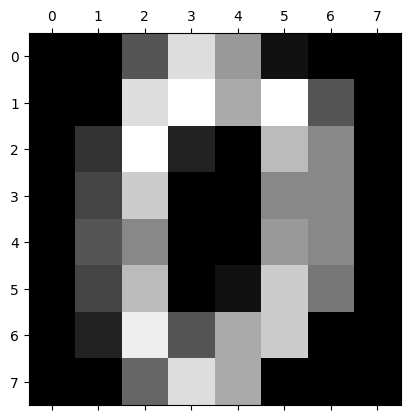

In [ ]:
%matplotlib inline

plt.gray()
plt.matshow(digit.images[0].reshape(8,8))

In [ ]:
import numpy as np
np.unique(digit.target)

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled,digit.target,test_size=0.2,random_state=30)

In [ ]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
model.fit(X_train, y_train)
model.score(X_test, y_test)

0.9722222222222222

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(0.95)
X_pca = pca.fit_transform(X_scaled)

In [ ]:
df.shape

(1797, 64)

In [ ]:
X_pca.shape
# the shape is decreasing which brings efficiency

(1797, 40)

In [ ]:
X_train_pca, X_test_pca, y_train, y_test = train_test_split(X_pca,digit.target,test_size=0.2,random_state=30)

In [ ]:
model.fit(X_train_pca, y_train)
model.score(X_test_pca, y_test)
# the accuracy is not quite declined so it is good

0.9638888888888889

In [ ]:
pca = PCA(n_components=4)
X_pca = pca.fit_transform(X_scaled)
X_pca.shape
# only four features which makes the compute faster

(1797, 4)

In [ ]:
X_train_pca, X_test_pca, y_train, y_test = train_test_split(X_pca,digit.target,test_size=0.2,random_state=30)

In [ ]:
model.fit(X_train_pca, y_train)
model.score(X_test_pca, y_test)

0.7888888888888889

## ICA


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import FastICA

# 生成示例数据
np.random.seed(0)
n_samples = 2000
time = np.linspace(0, 8, n_samples)

# 生成独立信号
s1 = np.sin(2 * time)  # 正弦波
s2 = np.sign(np.sin(3 * time))  # 方波
s3 = np.random.laplace(size=n_samples)  # Laplace 分布噪声

S = np.c_[s1, s2, s3]
S /= S.std(axis=0)  # 标准化信号

# 混合信号
A = np.array([[1, 1, 1], [0.5, 2, 1.0], [1.5, 1.0, 2.0]])  # 混合矩阵
X = np.dot(S, A.T)  # 生成混合信号

# 应用 FastICA
ica = FastICA(n_components=3)
S_ = ica.fit_transform(X)  # 重构信号
A_ = ica.mixing_  # 重构的混合矩阵

# 绘制结果
plt.figure(figsize=(10, 8))

models = [X, S, S_]
names = ['混合信号', '独立成分（真实）', '独立成分（ICA 提取）']

for ii, (model, name) in enumerate(zip(models, names), 1):
    plt.subplot(3, 1, ii)
    plt.title(name)
    for sig in model.T:
        plt.plot(time, sig)

plt.tight_layout()
plt.show()


## Training and test data


### **网页数据的抓取**


In [ ]:
pip install selenium

In [ ]:
from selenium import webdriver

In [ ]:

chrome_options = webdriver.ChromeOptions()
chrome_options.headless = True #do not need GUI
chrome=webdriver.Chrome(options=chrome_options)
page=chrome.fget("https://www.google.com")

In [ ]:
page = BeautifulSoup(open(html_path,'r'))
links = [a['href'] for a in poage.find_all('a','list-card-link')] #find all the url
ids = [l.split('/')[-2].split('_')[0]for l in links] # get the id

In [ ]:
sold_items = [a.text for a in page.find('div','ds-home-details-chip').find('p').find_all('span')]
for items in sold_items:
    if 'Sold:' in items:
        result['Sold Price'] = items.split('')[1]
    if 'Sold on' in items:
        result['Sold On'] = items.split('')[-1]

In [ ]:
#Get all image URLs
p = r'https:\\/\\/photos.zilowstatic.com\\/fp\\/([\d\w\-\_]+).jpg'
ids[a.split('-')[0] for a in re.findall(p,html)]
urls = [f'https://photos.zilowstatic.com/fp/{i}.jpg' for id in ids]



---



### **数据标注**

*提升标注是这个小节的关注的重点*

足够的标注 ---> 半监督模型

足够的预算 --->  找人给你标识

都没有？ ---> 弱监督学习

解决的问题：有一小部分数据有标注，有很多很多数据是没有标注（如何利用没有标注的数据）

*对于是否有标注的数据做了以下假设：*

连续性：样本之间的特征是相似的话，则这两个样本很有可能是有相同的标注的

类的聚类假设：数据是按类来分的；数据内在如有好一点的聚类的结构，一个类里面也可能有相同的标注

流型(manifold)假设：虽然我们收集的数据维度比较高，但是数据有可能是在低维的流型上分布的（可通过降维得到干净点的数据）

具体来说（自学习）

先用标注好的数据训练一个模型

用训练好的模型对未标注的数据进行预测（得到伪标注数据）

将伪标注数据与已标好数据合并

在合并的数据的基础上再训练模型

不断进行上述过程


P.S.
伪标注数据可能噪音比较大，故将模型比较确信的伪标注数据保留下来。（怎么样选择置信样本）
这里的模型是用来标记数据的，不用考虑该模型的成本，这个模型不会上线



---

主动学习（像半监督学习），未标注数据由人来干预（对有意思的数据）

Uncertainty sampliing，选择特别不置信的样本，让人来做

Query-by-committee，用多个模型来投票预测哪个样本比较难

主动学习与自学习混着使用:
确信的数据与原数据合并，不确信的发给标注工

***数据的质量控制（标错要怎么办）***

最简单的做法是，每个任务发给多个标注工，汇总之后，投票判断（贵）

可以把难确信的数据发给多个人（多做几次）

提前先出些题目，判断标注工靠不靠谱


---
弱监督学习

半自动生成标号（对数据编程，带引导性的，写相应的规则）


In [ ]:
def check_out(x):
  return SPAM if "check out" in x.lower() else ABSTAIN #如果有checkout就是spam
def sentiment(x):
  return HAM if sentiment_polarity(x)>0.9 else ABSTAIN #情绪分析模型
def short_comment(x):
  return HAM if len(x.split())<5 else ABSTAIN #短评

### **数据预处理**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib_inline
import matplotlib as mpl
import seaborn as sns
from IPython.display import display
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')

In [ ]:
data = pd.read_csv('data.csv')

In [ ]:
data.shape
data.head()
data.info()
data.describe

In [ ]:
#deal with missing data
null_sum = data.isnull().sum()
data.columns[null_sum<len(data)*0,3] #columns will keep
data.drop(columns=data.columns[null_sum>len(data)*0.3],inplace=True)
#inplace的作用是，直接将要去掉的列给改写掉（直接对数进行修改），可以省些内存，但是这个只能跑一次

In [ ]:
data.dtypes

In [ ]:
currency = ['Sold Price','Listed Price','Tax assessed value','Annual tax amount']
for c in currency:
  data[c]=data[c].replace(r'[$,-]','',regex=True).replace( #delete string with $
      r'^\s*$',np.nan,regex=True).astype(float) #if empty transform to nan type

In [ ]:
areas = ['Total interior livable area', 'Lot size']
for c in areas:
  acres = data[c].str.contains('Acres') == True
  col = data[c].replace(r'\b sqft\b|\b Acres\b|\b, \b','',regex=True).astype(float) #replace with empty and transform to float
  col[acres] *= 43560
  data[c] = col

In [ ]:
# filter out the houses whose living area are too small or too hard to simplify later
abnormal = (data[areas[1]]<10) | (data[areasp1[]>1e4])
data= data[~abnormal]
sum(abnormal)

In [ ]:
ax =sns.histplot(np.log10(data['Sold Price']))
ax.set_xlim([3,8])
ax.set_xticks(range(3,9))
ax.set_xticklabels(['%.0e'%a for a in 10**ax.get_xticks()]);

In [ ]:
#check the type of houses
data['Type'].value_counts()[0;20]
#price density for different types
types= data['Tpye'].isin(['SingleFamily','Condo'])
sns.displot(pd.DataFrame({'Sold Price':np.log10(data[types]['Sold Price']),'Type':data[types]['Type']}),
            x='Sold Price',hue='Type',kind='kde');


In [ ]:
#sale price per living sqft
data['Price per sqft'] = data['Sold Price']/data['Total interior livable area']
ax=sns.boxplot(x='Type', y='Price per sqft',data=data[types],fliersize=0)
ax.set_ylim([0,1000]);

In [ ]:
#location varies with the price
d = data[data['Zip'].isin(data['Zip'].value_counts()[:20].keys())]
ax = sns.boxplot(x='Zip',y='Price per living sqft',data=d,fliersize=0)
ax.set_ylim([0,1000])
ax.set_xticklabels(ax.get_xticklabels(),rotation=90);

In [ ]:
# visualize the correlatiuon matrix
_,ax = plt.subplots(figsize=(10,10))
columns = ['Sold Price','Listed Price','Tax assessed value','Annual tax amount',
           'Total interior livable area','Lot size','Price per sqft']
sns.heatmap(data[columns].corr(),annot=True,cmap='RdYlGn',ax=ax);

### **数据清理**


*   数据不干净（噪声多）？需要做数据的清理，将错误的信息纠正过来；
*   数据比较干净（数据不是想要的格式）？对数据进行变换；
*   数据对模型不是很友好，对数据的特征进行提取。



1.  **数据的错误**

收集到的数据与真实观测值不一致【数值丢失，数值错误，极端的值】

好的模型对错误是有容忍度的【给了错误的数据一样是能够收敛但是精度会比用干净的数据低一点】

部署了这样的模型后可能会影响新收集来的数据结果

**数据错误的类型：**

数据中某个样本的数值不在正常的分布区间中（Outlier）

违背了规则（Rule violations）

* 有对应或者对照规则可以用来检测是否正确

违反了语法上或语义上的限制（Pattern violations）





2.   **数据变换**

数据标注、清理到特征工程之间的操作是数据变换


*  *Normalization(普通化，正常化)*

把一个列里面的数值的最小值与最大值都限定到一个固定区间内，然后把所有的元素只通过线性变化出来【将数据的单位放到合理的区间】；

Z-score：通过算法使得均值变为0，方差变为1

把一列的数据换成是-1到1之间的数据

对数值都是大于0，且数值变换比较大可以试一下log一下【log上面的加减等于原始数据的乘除，可以将计算基于百分比的】。

*  *图片变换*

将图片的尺寸变小【机器学习对低分辨率的图片不在意】

图片采样的比较小，且jpeg选用中等质量压缩，可能会导致精度有1%的下降
（ImageNet）【数据的大小与质量要做权衡】

*   视频变换

使用短视频(10s以内)，将视频切到感兴趣的部分；

*   文本变换

Stemming and lemmatizatiuon
词根化：把一个词变成常见的形式

E.g. am,are,is->be
   car,cars,car's,cars'->car

Tokenization:text->a list of tokens

词元化(机器学习算法中最小的单元)



* By word:text.split('')

* By subwords:

Unigram,WordPiece,...

e.g. "a new Gpu!"-> "a","new","Gp","##u","!"





3. **特征工程**


为什么需要特征工程：

因为机器学习的算法比较喜欢定义的比较好的、它能比较好的去处理的、固定长度的输入输出。



* *对表的数据*  

对于整型或浮点型的数据，可以直接用或者是把最大最小值拿出来，再把这个数据分成n个区间，如果值在区间中，则会给它对应区间的下标i【这样可以让机器学习算法不去纠结一个具体的值（细粒度的值）】

对于类别的数据，一般采用one-hot（独热）编码（虽然有n列，但是只有每一列有值）【虽然有很多的类别但是常见的只有几个类，可以将少数的类别变成不确定(Unknown)的类别，只保留那些比较重要的类别，这样可以把这些重要的类别放到可控的单元内】

对于时间的特征，将时间的数据弄成机器学习算法能知道这些天数中是有特殊意义的日子（周末、休息日、新年之类的）

[year,month,year,day_of_year,week_of_year,day_of_week]
        后三项用于指示特殊日期等

特征组合：这样子能拿到两两特征之间相关性的东西



*   *文本数据*

Bag of words(BoW) model：

把每一个词元(token)弄成one-hot编码，再把句子里的所有词元加起来【这里要注意的是 怎么样把词典构造出来，不能太大也不能太小；BoW model最大的问题在于原句子的信息丢失了】


Word Embeddings(e.g. Word2vec)：

将词变成一个向量，向量之间具有一定的语义性的(两个词之间对应的向量之间的内积比较近的话，说明这两个词在语义上来说是比较相近的)

可以使用预训练的模型（BERT,GPT-3）




*   *图片视频*

传统是用手动的特征方式如SIFT来做

现在用预训练好的深度神经网络来做（ResNet,I3D）



In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
exx = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/carprices.csv')
exx

,Car Model,Mileage,Sell Price($),Age(yrs)
0,BMW X5,69000,18000,6
1,BMW X5,35000,34000,3
2,BMW X5,57000,26100,5
3,BMW X5,22500,40000,2
4,BMW X5,46000,31500,4
5,Audi A5,59000,29400,5
6,Audi A5,52000,32000,5
7,Audi A5,72000,19300,6
8,Audi A5,91000,12000,8
9,Mercedez Benz C class,67000,22000,6


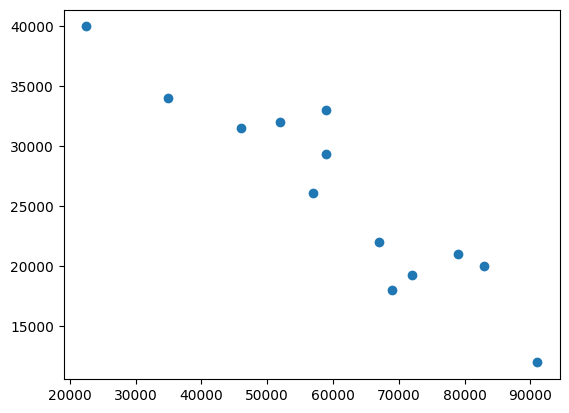

In [ ]:
plt.scatter(exx['Mileage'],exx['Sell Price($)'])

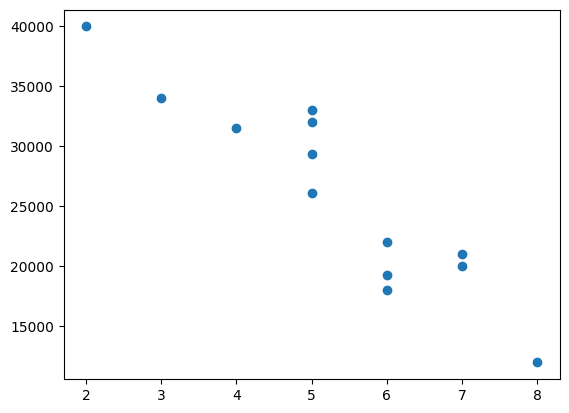

In [ ]:
plt.scatter(exx['Age(yrs)'],exx['Sell Price($)'])

In [ ]:
X = exx[['Mileage','Age(yrs)']]
y = exx['Sell Price($)']

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2)
#random_state to keep the split each time at the same value

In [ ]:
X_train

,Mileage,Age(yrs)
10,83000,7
7,72000,6
4,46000,4
0,69000,6
3,22500,2
9,67000,6
5,59000,5
6,52000,5
2,57000,5
12,59000,5


In [ ]:
clf = LinearRegression()
clf.fit(X_train,y_train)

LinearRegression()

In [ ]:
clf.predict(X_test)

array([18959.66697502, 36530.20351526, 14247.62950971])

In [ ]:
clf.score(X_train,y_train)

0.8018032847066888

In [ ]:
clf.score(X_test,y_test)

0.9361714151455143

### Cross Validation

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_digits

digits = load_digits()
X_train, X_test, y_train, y_test = train_test_split(digits.data, digits.target,test_size=0.3)

In [ ]:
lr = LogisticRegression()
lr.fit(X_train, y_train)
lr.score(X_test, y_test)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.9648148148148148

In [ ]:
svm = SVC()
svm.fit(X_train, y_train)
svm.score(X_test, y_test)

0.9925925925925926

In [ ]:
rf = RandomForestClassifier(n_estimators=40)
rf.fit(X_train, y_train)
rf.score(X_test, y_test)

0.975925925925926

In [ ]:
from sklearn.model_selection import KFold
kf = KFold(n_splits=3)
for train_index, test_index in kf.split([1,2,3,4,5,6,7,8,9]):
  print(train_index, test_index)

[3 4 5 6 7 8] [0 1 2]
[0 1 2 6 7 8] [3 4 5]
[0 1 2 3 4 5] [6 7 8]


In [ ]:
def get_score(model, X_train, X_test, y_train, y_test):
  model.fit(X_train, y_train)
  return model.score(X_test, y_test)

In [ ]:
score_l = []
score_svm = []
score_rf = []
for train_index, test_index in kf.split(digits.data):
  X_train, X_test, y_train, y_test = digits.data[train_index], digits.data[test_index],digits.target[train_index], digits.target[test_index]
  score_l.append(get_score(LogisticRegression(max_iter=500), X_train, X_test, y_train, y_test))
  score_svm.append(get_score(SVC(), X_train, X_test, y_train, y_test))
  score_rf.append(get_score(RandomForestClassifier(n_estimators=40), X_train, X_test, y_train, y_test))

In [ ]:
score_l

[0.9248747913188647, 0.9432387312186978, 0.9148580968280468]

In [ ]:
score_svm

[0.9666110183639399, 0.9816360601001669, 0.9549248747913188]

In [ ]:
score_rf

[0.9282136894824707, 0.9582637729549248, 0.9265442404006677]

In [ ]:
from sklearn.model_selection import StratifiedKFold
folds = StratifiedKFold(n_splits=3) #in a uniform way

In [ ]:
from sklearn.model_selection import cross_val_score
cross_val_score(LogisticRegression(max_iter=500), digits.data, digits.target)

array([0.92222222, 0.87222222, 0.94150418, 0.94150418, 0.89693593])

In [ ]:
cross_val_score(SVC(), digits.data, digits.target)

array([0.96111111, 0.94444444, 0.98328691, 0.98885794, 0.93871866])

In [ ]:
cross_val_score(RandomForestClassifier(n_estimators=40), digits.data, digits.target)

array([0.93888889, 0.90277778, 0.96657382, 0.96935933, 0.91922006])

In [ ]:
cross_val_score(RandomForestClassifier(n_estimators=5), digits.data, digits.target)

array([0.85277778, 0.81111111, 0.86908078, 0.91086351, 0.84958217])

### **GridSearch CV**


Hyper parameter Tuning:

For SVM

| Parameter | Value |
|-----|-----|
| Kernel | 'rbf','linear','poly' |
| C | INT |
| Gamma | Float |

In [ ]:
from sklearn import svm, datasets
iris = datasets.load_iris()

In [ ]:
df = pd.DataFrame(iris.data,columns=iris.feature_names)
df['flower'] = iris.target
df['flower'] = df['flower'].apply(lambda x: iris.target_names[x])
df[47:150]

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),flower
47,4.6,3.2,1.4,0.2,setosa
48,5.3,3.7,1.5,0.2,setosa
49,5.0,3.3,1.4,0.2,setosa
50,7.0,3.2,4.7,1.4,versicolor
51,6.4,3.2,4.5,1.5,versicolor
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,virginica
146,6.3,2.5,5.0,1.9,virginica
147,6.5,3.0,5.2,2.0,virginica
148,6.2,3.4,5.4,2.3,virginica


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(iris.data, iris.target, test_size=0.3)

In [ ]:
model_svm_tunning = svm.SVC(kernel='rbf',C=30,gamma='auto')
model_svm_tunning.fit(X_train,y_train)
model_svm_tunning.score(X_test, y_test)

1.0

In [ ]:
from sklearn.model_selection import cross_val_score
cross_val_score(svm.SVC(kernel='linear',C=10,gamma='auto'),iris.data, iris.target, cv=5).mean()

0.9733333333333334

In [ ]:
cross_val_score(svm.SVC(kernel='rbf',C=10,gamma='auto'),iris.data, iris.target, cv=5).mean()

0.9800000000000001

In [ ]:
cross_val_score(svm.SVC(kernel='rbf',C=30,gamma='auto'),iris.data, iris.target, cv=5).mean()

0.96

In [ ]:
import numpy as np
kernels = ['rbf', 'linear','poly']
C = [1,10,20]
avg_scores = {}
for kval in kernels:
    for cval in C:
        cv_scores = cross_val_score(svm.SVC(kernel=kval,C=cval,gamma='auto'),iris.data, iris.target, cv=5)
        avg_scores[kval + '_' + str(cval)] = np.average(cv_scores)

avg_scores

{'rbf_1': 0.9800000000000001,
 'rbf_10': 0.9800000000000001,
 'rbf_20': 0.9666666666666668,
 'linear_1': 0.9800000000000001,
 'linear_10': 0.9733333333333334,
 'linear_20': 0.9666666666666666,
 'poly_1': 0.9666666666666666,
 'poly_10': 0.9666666666666666,
 'poly_20': 0.9533333333333334}

In [ ]:
# GridSearch CV is doing the same thing as the above block shows
from sklearn.model_selection import GridSearchCV
clf = GridSearchCV(svm.SVC(gamma='auto'), {
    'C': [1,10,20],
    'kernel': ['rbf','linear','poly']
}, cv=5, return_train_score=False)
clf.fit(iris.data, iris.target)
clf.cv_results_

{'mean_fit_time': array([0.00136127, 0.0010901 , 0.00256305, 0.00127954, 0.00113506,
        0.00488133, 0.00210047, 0.00106225, 0.00951538]),
 'std_fit_time': array([2.38382461e-04, 1.90982979e-04, 1.64103769e-03, 1.07687357e-04,
        9.11443264e-05, 3.10149207e-03, 7.47436321e-04, 2.85272986e-05,
        7.54073072e-03]),
 'mean_score_time': array([0.00087042, 0.00074568, 0.00097408, 0.00086288, 0.0008616 ,
        0.00112548, 0.00116515, 0.00073833, 0.00114889]),
 'std_score_time': array([5.26315480e-05, 8.29618001e-05, 3.41738004e-04, 7.13676298e-05,
        1.38690807e-04, 2.66834197e-04, 3.87561526e-04, 1.38154464e-05,
        1.54685371e-04]),
 'param_C': masked_array(data=[1, 1, 1, 10, 10, 10, 20, 20, 20],
              mask=[False, False, False, False, False, False, False, False,
                    False],
        fill_value=999999),
 'param_kernel': masked_array(data=['rbf', 'linear', 'poly', 'rbf', 'linear', 'poly',
                    'rbf', 'linear', 'poly'],
         

In [ ]:
df = pd.DataFrame(clf.cv_results_)
df[['param_C','param_kernel','mean_test_score']].sort_values(by=['mean_test_score'],ascending=False)

,param_C,param_kernel,mean_test_score
0,1,rbf,0.980000
1,1,linear,0.980000
3,10,rbf,0.980000
4,10,linear,0.973333
6,20,rbf,0.966667
2,1,poly,0.966667
5,10,poly,0.966667
7,20,linear,0.966667
8,20,poly,0.953333


In [ ]:
print(clf.best_params_,'Best score is',clf.best_score_)

{'C': 1, 'kernel': 'rbf'} Best score is 0.9800000000000001


In [ ]:
from sklearn.model_selection import RandomizedSearchCV
rs = RandomizedSearchCV(svm.SVC(gamma='auto'), {
        'C': [1,10,20],
        'kernel': ['rbf','linear','poly']
    },
    cv=5,
    return_train_score=False,
    n_iter=2
)

In [ ]:
rs.fit(iris.data, iris.target)
pd.DataFrame(rs.cv_results_)[['param_C','param_kernel','mean_test_score']]

,param_C,param_kernel,mean_test_score
0,20,poly,0.953333
1,1,linear,0.980000


Choosing best model

In [ ]:
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

In [ ]:
model = {
    'svm': {
        'model': svm.SVC(gamma='auto'),
        'params' : {
            'C': [1,10,20],
            'kernel': ['rbf','linear','poly']
        }
    },
    'random_forest' : {
        'model': RandomForestClassifier(),
        'params' : {
            'n_estimators': [1,5,10]
        }
    },
    'logistic_regression' : {
        'model': LogisticRegression(solver='liblinear'),
        'params': {
            'C': [1,5,10]
        }
    }
}

In [ ]:
scores = []

for model_name, mp in model.items():
    clf =  GridSearchCV(mp['model'], mp['params'], cv=5, return_train_score=False)
    clf.fit(iris.data, iris.target)
    scores.append({
        'model': model_name,
        'best_score': clf.best_score_,
        'best_params': clf.best_params_
    })

df = pd.DataFrame(scores,columns=['model','best_score','best_params'])
df

,model,best_score,best_params
0,svm,0.980000,"{'C': 1, 'kernel': 'rbf'}"
1,random_forest,0.966667,{'n_estimators': 10}
2,logistic_regression,0.966667,{'C': 5}




---

Exercise



In [ ]:
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier

In [ ]:
digits = datasets.load_digits()

In [ ]:
df_digits = pd.DataFrame(digits.data,columns=digits.feature_names)
target = digits.target

In [ ]:
model_ex = {
    'svm': {
        'model': svm.SVC(gamma='auto'),
        'params' : {
            'C': [1,10,20],
            'kernel': ['rbf','linear','poly']
        }
    },
    'random_forest' : {
        'model': RandomForestClassifier(),
        'params' : {
            'n_estimators': [1,5,10]
        }
    },
    'logistic_regression' : {
        'model': LogisticRegression(solver='liblinear'),
        'params': {
            'C': [1,5,10]
        }
    },
    'GuasianNB': {
        'model': GaussianNB(),
        'params': {}
    },
    'MultinomialNB': {
        'model': MultinomialNB(),
        'params': {}
    },
    'DecisionTreeClassifier': {
        'model': DecisionTreeClassifier(),
        'params': {
            'criterion': ['gini','entropy']
        }
    }
}

In [ ]:
scores_ex = []

for model_name, mp in model_ex.items():
    clf =  GridSearchCV(mp['model'], mp['params'], cv=5, return_train_score=False)
    clf.fit(df_digits,target)
    scores_ex.append({
        'model': model_name,
        'best_score': clf.best_score_,
        'best_params': clf.best_params_
        })

df = pd.DataFrame(scores_ex,columns=['model','best_score','best_params'])
df

,model,best_score,best_params
0,svm,0.968842,"{'C': 1, 'kernel': 'poly'}"
1,random_forest,0.895967,{'n_estimators': 10}
2,logistic_regression,0.922114,{'C': 1}
3,GuasianNB,0.806928,{}
4,MultinomialNB,0.870350,{}
5,DecisionTreeClassifier,0.811365,{'criterion': 'entropy'}




---



### Model Metrics





*   In supervised learning we trianing models by minimizing the training loss
  * The loss value is a widely used metric to measure model quality
*   The are many other metrics
  * Model specific: e.g. accuracy for classification, mAP for object detection
  * Business specific: e.g. revenue, inference latency

* We select models by multiple metrics
  * Just like how you chosse cars




> **Case Study:Displaying Ads**

* Ads is one major revenue source for Internet Companies

* User Click-Through Rate Prediction for Ads

1. Search Terms (specific webpages being viewed) → Extract related webpages → Estimate the click-through rate (CTR) of ads that the user might click on (show ads with higher predicted CTR).
   
2. Since the actual CTR is unknown, this is framed as a machine learning problem, using machine learning to determine user clicks (a binary classification problem).
   
3. Sort all ads by multiplying the predicted CTR with the payment from the advertiser.





> **Metrics for Classification**

$$
TP: True \space Positive - Predicted \space as\space  True \space and \space actually \space True
$$
$$
FP: False \space Positive - Predicted \space as \space False \space and \space actually\space  True
$$
$$
TN: True \space Negative - Predicted \space as \space False \space and \space actually \space False
$$
$$
FN: False\space  Negative - Predicted\space  as \space False\space  and \space actually \space True
$$


* Accuracy: # correct predictions/ #examples

Accuracy measures the proportion of correctly predicted samples out of all samples.$$\text{Accuracy} = \frac{TP + TN}{TP + TN + FP + FN}$$


In [ ]:
sum(y==y_predicted)/y.size

* Precision: #correctly predicted as class i/# predicted as class i

  Precision measures the proportion of positive predictions that are actually positive.$$\text{Precision} = \frac{TP}{TP + FP}$$
  A high precision indicates fewer false positives.

In [ ]:
sum((y==y_predicted) & (y==1))/sum(y_predicted==1)

* Recall: # correctly predicted as class i / # examples in class i

  Recall measures the proportion of all actual positive samples that were correctly predicted as positive.$$\text{Recall} = \frac{TP}{TP + FN}$$
  A high recall indicates fewer false negatives.

For **precision**, think about predictions as your base

For **recall**, think about truth as your base

In [ ]:
sum((y==y_predicted) & (y==1))/sum(y==1)

* F1: Balance precision and recall
  * the harmonic mean of precision and recall:$$F1 = 2 \times \frac{\text{Precision} \times \text{Recall}}{\text{Precision} + \text{Recall}}$$



> **AUC-ROC**

* AUC, the area under ROC curve, measures the chance a model can distinguish classes
  * Choose various θ, predict as pos if $$\hat{y}\geq θ$$ else neg

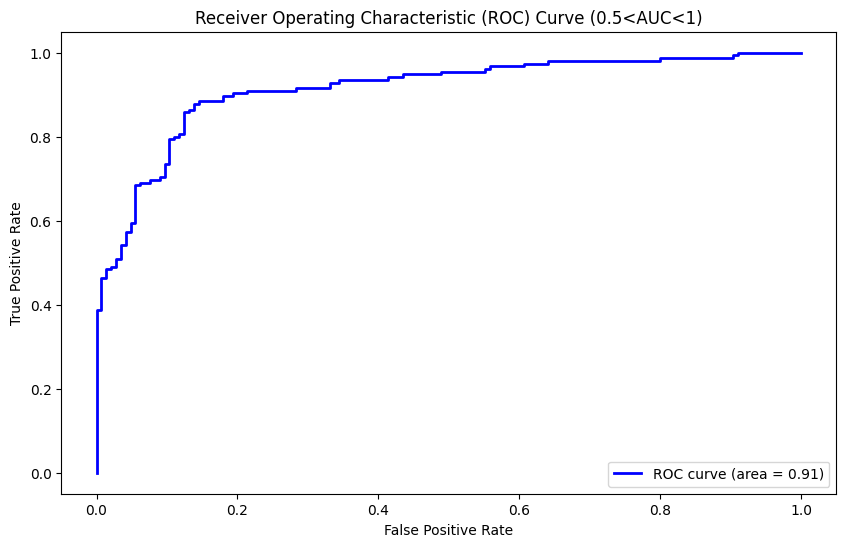

In [ ]:
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.table import Table
def plot_auc_roc():
    X, y = make_classification(n_samples=1000, n_features=20, n_classes=2, random_state=42)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    model = LogisticRegression()
    model.fit(X_train, y_train)

    y_scores = model.predict_proba(X_test)[:, 1]

    fpr, tpr, _ = roc_curve(y_test, y_scores)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(10, 6))
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.xlabel('False Positive Rate') # #wrong pos prediction/#neg examples
    plt.ylabel('True Positive Rate') # #correct pos predictions/#pos examples
    plt.title('Receiver Operating Characteristic (ROC) Curve (0.5<AUC<1)')
    plt.legend(loc='lower right')
    plt.show()

plot_auc_roc()

The area that the ROC curve and X axis consist is the AUC

* Confusion Matrix Representation
The confusion matrix provides a comprehensive description of the prediction results of a model, summarizing four scenarios:

|                | Predicted Positive | Predicted Negative |
|----------------|--------------------|--------------------|
| **Actual Positive**  | True Positive (TP)  | False Negative (FN)  |
| **Actual Negative**  | False Positive (FP)  | True Negative (TN)  |





> **Business Metyrics for Ads**

* Optimize both revennue and customer experience
  * Latency: Ads should be shown to users at the same time as others
  * ASN: Average #ads shown in pages
  * CTR: user click through rate
  * ACP: Average price advertiser pay per click

* Revenue = #pageviews * ASN * CTR * ACP

Platform cares about total revenue and traffic.

Users are concerned with ASN (Average Session Number) and CTR (Click-Through Rate).

Advertisers care about CTR (Click-Through Rate) and ACP (Average Cost Per Click).




> **Displaying Ads: Model -> Business Metrics**

For the model, we care about its AUC;

 however, focusing solely on AUC can be problematic.

A new model might show an increase in AUC, but it’s possible that some business metrics actually decline. AUC only reflects a statistical measure—predicted CTR might change, but not in a statistically significant way. Yet, it could still impact actual revenue. For instance:

- Predicted CTR might decrease without changing the AUC value, but this could lower the confidence in predicting user clicks, potentially leading to fewer ads being displayed.
- The newly replaced ads might have an actual lower CTR, as the model is using historical data. However, markets change, and users might not prefer ads based on outdated data.
- The ads selected by the model may have lower bids from advertisers.

Balancing model metrics with business metrics: The best approach is to deploy the model online and observe actual business metrics using real data.



### Regularization

L1 - Lasso

L2 - Ridge

Assume we have a regression problem:

match won = $\\θ_0$ + $\\θ_1$ * ages + $\\θ_2$ * $ages^2$ + $\\θ_3$ * $ages^3$ + $\\θ_4$ * $ages^4$

As we know In a linear model, this may cause overfit problems, so we try to make $\\θ_3$ and $\\θ_4$ almost close to zero:

match won = $\\θ_0$ + $\\θ_1$ * ages + $\\θ_2$ * $ages^2$

which obtains a 'Just right' model



> L2 Regularization:



$$
mse = \frac{1}{n} \sum_{i=1}^{n} \left( y_i - h_{\theta}(x_i) \right)^2 + \lambda \sum_{i=1}^{n} \theta_i^2
$$

参数收缩：L2 正则化会使参数值趋向于零，但一般不会完全为零

防止过拟合：通过限制参数的大小，降低模型复杂度，提高泛化能力

稳定性：对共线性（特征之间高度相关）数据有更好的处理效果

**用于**：

防止过拟合：在特征数量与样本数量相近时，通过平滑参数来提高泛化能力。

共线性数据：处理特征之间存在相关性的情况。

**优点**：

更稳定，适合处理特征相关性高的数据。
防止模型参数过大，平滑模型。

**缺点**：

不会产生稀疏解，模型仍然包含所有特征。




---





> L1 Regularization

$$
mse = \frac{1}{n} \sum_{i=1}^{n} \left( y_i - h_{\theta}(x_i) \right)^2 + \lambda \sum_{i=1}^{n} |\theta_i|
$$

稀疏性：L1 正则化会使一些参数的值缩小到零，从而起到 特征选择 的作用。

模型可解释性：由于只保留了少数重要特征，模型更易于解释。

适用于高维数据：在特征数量多于样本数量的情况下，L1 正则化仍能有效工作。

**用于**：

特征选择：在需要从大量特征中选择少数重要特征的情况下。

稀疏模型：如文本分类中的词袋模型。

**优点：**

产生稀疏模型，利于特征选择和模型解释。
适合高维数据。

**缺点：**

在某些情况下，可能不稳定，尤其是当特征相关性较高时。


Those will penalize the higher value of $\theta_i$  

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
dataset = pd.read_csv('/content/drive/MyDrive/ML DL—AI/ML with python/Melbourne_housing_FULL.csv')
dataset.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,68 Studley St,2,h,NaN,SS,Jellis,3/09/2016,2.5,3067.0,...,1.0,1.0,126.0,NaN,NaN,Yarra City Council,-37.8014,144.9958,Northern Metropolitan,4019.0
1,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,...,1.0,1.0,202.0,NaN,NaN,Yarra City Council,-37.7996,144.9984,Northern Metropolitan,4019.0
2,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,Yarra City Council,-37.8079,144.9934,Northern Metropolitan,4019.0
3,Abbotsford,18/659 Victoria St,3,u,NaN,VB,Rounds,4/02/2016,2.5,3067.0,...,2.0,1.0,0.0,NaN,NaN,Yarra City Council,-37.8114,145.0116,Northern Metropolitan,4019.0
4,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,Yarra City Council,-37.8093,144.9944,Northern Metropolitan,4019.0


In [ ]:
dataset.nunique()

,0
Suburb,351
Address,34009
Rooms,12
Type,3
Price,2871
Method,9
SellerG,388
Date,78
Distance,215
Postcode,211


In [ ]:
col = ['Suburb','Rooms','Type','Method','SellerG','Regionname','Propertycount','Distance','CouncilArea','Bedroom2','Bathroom','Car','Landsize','BuildingArea','Price']
dataset = dataset[col]
dataset.head()

,Suburb,Rooms,Type,Method,SellerG,Regionname,Propertycount,Distance,CouncilArea,Bedroom2,Bathroom,Car,Landsize,BuildingArea,Price
0,Abbotsford,2,h,SS,Jellis,Northern Metropolitan,4019.0,2.5,Yarra City Council,2.0,1.0,1.0,126.0,NaN,NaN
1,Abbotsford,2,h,S,Biggin,Northern Metropolitan,4019.0,2.5,Yarra City Council,2.0,1.0,1.0,202.0,NaN,1480000.0
2,Abbotsford,2,h,S,Biggin,Northern Metropolitan,4019.0,2.5,Yarra City Council,2.0,1.0,0.0,156.0,79.0,1035000.0
3,Abbotsford,3,u,VB,Rounds,Northern Metropolitan,4019.0,2.5,Yarra City Council,3.0,2.0,1.0,0.0,NaN,NaN
4,Abbotsford,3,h,SP,Biggin,Northern Metropolitan,4019.0,2.5,Yarra City Council,3.0,2.0,0.0,134.0,150.0,1465000.0


In [ ]:
dataset.isna().sum()

,0
Suburb,0
Rooms,0
Type,0
Method,0
SellerG,0
Regionname,3
Propertycount,3
Distance,1
CouncilArea,3
Bedroom2,8217


In [ ]:
cols_to_zero = ['Propertycount','Distance','Bedroom2','Bathroom','Car']
dataset[cols_to_zero] = dataset[cols_to_zero].fillna(0)
dataset.isna().sum()

,0
Suburb,0
Rooms,0
Type,0
Method,0
SellerG,0
Regionname,3
Propertycount,0
Distance,0
CouncilArea,3
Bedroom2,0


In [ ]:
dataset['Landsize'] = dataset['Landsize'].fillna(dataset.Landsize.mean())
dataset['BuildingArea'] = dataset['BuildingArea'].fillna(dataset.BuildingArea.mean())
dataset.isna().sum()

,0
Suburb,0
Rooms,0
Type,0
Method,0
SellerG,0
Regionname,3
Propertycount,0
Distance,0
CouncilArea,3
Bedroom2,0


In [ ]:
dataset.dropna(inplace=True)
dataset.isna().sum()

,0
Suburb,0
Rooms,0
Type,0
Method,0
SellerG,0
Regionname,0
Propertycount,0
Distance,0
CouncilArea,0
Bedroom2,0


In [ ]:
data_d = pd.get_dummies(dataset, drop_first=True).astype(int)
data_d.head()

,Rooms,Propertycount,Distance,Bedroom2,Bathroom,Car,Landsize,BuildingArea,Price,Suburb_Aberfeldie,...,CouncilArea_Moorabool Shire Council,CouncilArea_Moreland City Council,CouncilArea_Nillumbik Shire Council,CouncilArea_Port Phillip City Council,CouncilArea_Stonnington City Council,CouncilArea_Whitehorse City Council,CouncilArea_Whittlesea City Council,CouncilArea_Wyndham City Council,CouncilArea_Yarra City Council,CouncilArea_Yarra Ranges Shire Council
1,2,4019,2,2,1,1,202,160,1480000,0,...,0,0,0,0,0,0,0,0,1,0
2,2,4019,2,2,1,0,156,79,1035000,0,...,0,0,0,0,0,0,0,0,1,0
4,3,4019,2,3,2,0,134,150,1465000,0,...,0,0,0,0,0,0,0,0,1,0
5,3,4019,2,3,2,1,94,160,850000,0,...,0,0,0,0,0,0,0,0,1,0
6,4,4019,2,3,1,2,120,142,1600000,0,...,0,0,0,0,0,0,0,0,1,0


In [ ]:
X = data_d.drop('Price', axis=1)
y = data_d['Price']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=2)

In [ ]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression().fit(X_train, y_train)

In [ ]:
print('Test score:', lr.score(X_test, y_test),'Train score:',lr.score(X_train, y_train))

Test score: 0.13413168587586 Train score: 0.682586295004645


In [ ]:
from sklearn import linear_model

lasso_reg = linear_model.Lasso(alpha=50, max_iter=100, tol=0.1)
lasso_reg.fit(X_train, y_train)

Lasso(alpha=50, max_iter=100, tol=0.1)

In [ ]:
print('Test score:',lasso_reg.score(X_test, y_test),'\n','Train score:',lasso_reg.score(X_train, y_train))

Test score: 0.6633169721521481 
 Train score: 0.6765562610203997


In [ ]:
ridge_reg = linear_model.Ridge(alpha=50, max_iter=100, tol=0.1)
ridge_reg.fit(X_train, y_train)

Ridge(alpha=50, max_iter=100, tol=0.1)

In [ ]:
print('Test score:',ridge_reg.score(X_test, y_test),'\n','Train score:',ridge_reg.score(X_train, y_train))

Test score: 0.6669747759118698 
 Train score: 0.6619849633207061




---




### Hyper Tunning



> **Search Space**

* Specify range for each hyperparameter

| Hyper-Parameter                | Range                                                                                                         | Distribution      |
|--------------------------------|---------------------------------------------------------------------------------------------------------------|--------------------|
| model (backbone)               | [mobilenetv2_0.25, mobilenetv3_small, mobilenetv3_large, resnet18_v1b, resnet34_v1b, resnet50_v1b, resnet101_v1b, vgg16_bn, se_resnext50_32x4d, resnest50, resnest200] | categorical        |
| learning rate *                | [1e-6, 1e-1]                                                                                               | log-uniform        |
| batch size *                   | [8, 16, 32, 64, 128, 256, 512]                                                                              | categorical        |
| momentum **                    | [0.85, 0.95]                                                                                               | uniform            |
| weight decay **                | [1e-6, 1e-2]                                                                                               | log-uniform        |
| detector                       | [faster-rcnn, ssd, yolo-v3, center-net]                                                                    | categorical        |


* The search space can be exponentially large
  * Need to carefully design the space to improve efficiency



> **HPO algorithms: Black-box or Multi-fidelity**

* Black-box: treats a training job as a black-box in HPO
  * Completes the training process for each trial
  (Focus on the accuracy on certain hyperparameters)

  * Categories:
    - Grid Search
      * All combinations are evaluated
      * Guarantees the best results  
    - Random Search
      * Random Combinations are tried
      * More efficient than grid search
    - Bayesian Optimization (BO)
      * Iteratively learn a mapping from HP to objective function
      
        Based on previous trails, select the next trail based on the current estimation
      * Surrogate model
        - Estimate how the objective function depends on HP
        - Probabilistic regression models: Random forest, Gaussian process
      * Acquisition function
        - Acquisition max means uncertainty and predicted objective are high
        - Sample the next trial according to the acquisition function
        - Trade off exploration and exploitation
      * Limitation of BO:
        - In the initial stages, similar to random search
        - Optimization process is sequential
    - Simulated Annealing
    - Genetic Algorithms
  
* Multi-fidelity: modifies the training job to speed up the search(focus on hyperparameter's sorting)
  * Train on subsampled datasets
  * Reduce model size(e.g. less #layers, #channels)
  * Stop bad configuration earlier
  * Categories:
    - Modeling Learning Curve
    - Bandit Based
      * Successive Halving
        - Save the budget for most promising config
        - Randomly pick n configurations to train m epochs
        - Repeat until one configuration left:
          * Keep the best n/2 configuration to train another m epochs
          * Keep the best n/4 configuration to train another 2m epochs
          * ... ...

          (keep the best half of configuration and train one times more epochs on those)
        - Select n and m based on training budget and #epoch needed for a full training


In [ ]:
!pip install scikit-optimize

In [ ]:
import numpy as np
from sklearn import datasets, svm
from sklearn.model_selection import cross_val_score
from skopt import gp_minimize
from skopt.space import Real, Categorical, Integer


iris = datasets.load_iris()
X, y = iris.data, iris.target


def objective(params):
    C, gamma = params
    clf = svm.SVC(C=C, gamma=gamma)
    return -np.mean(cross_val_score(clf, X, y, cv=5, scoring='accuracy'))


space = [
    Real(1e-6, 1e+6, prior='log-uniform', name='C'),
    Real(1e-6, 1e+1, prior='log-uniform', name='gamma')
]


res = gp_minimize(objective, space, n_calls=50, random_state=0)

print("最佳参数：C=%.6f, gamma=%.6f" % (res.x[0], res.x[1]))
print("最佳准确率：%.4f" % (-res.fun))


最佳参数：C=11376.463871, gamma=0.000039
最佳准确率：0.9867


### Bias and Variance

In [ ]:
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt
import numpy as np

def plot_learning_curve(estimator, X, y, cv=5, scoring='neg_mean_squared_error'):
    train_sizes, train_scores, validation_scores = learning_curve(
        estimator, X, y, cv=cv, scoring=scoring, train_sizes=np.linspace(0.1, 1.0, 10)
    )

    train_scores_mean = -train_scores.mean(axis=1)
    validation_scores_mean = -validation_scores.mean(axis=1)

    plt.figure()
    plt.plot(train_sizes, train_scores_mean, label='训练误差')
    plt.plot(train_sizes, validation_scores_mean, label='验证误差')
    plt.ylabel('误差')
    plt.xlabel('训练集大小')
    plt.title('学习曲线')
    plt.legend()
    plt.show()

In [ ]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(estimator, X, y, cv=10, scoring='neg_mean_squared_error')
print("平均得分: ", -scores.mean())
print("得分方差: ", scores.var())


NameError: name 'estimator' is not defined

In [ ]:
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

def bias_variance_decomp(X, y, model, num_rounds=200, test_size=0.2):
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error

    mse_list = []
    bias_list = []
    variance_list = []

    for _ in range(num_rounds):
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size)
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        mse = mean_squared_error(y_test, y_pred)
        mse_list.append(mse)

        expected_y_pred = np.mean(y_pred)
        bias = (expected_y_pred - np.mean(y_test)) ** 2
        bias_list.append(bias)

        variance = np.mean((y_pred - expected_y_pred) ** 2)
        variance_list.append(variance)

    print("平均MSE:", np.mean(mse_list))
    print("平均偏差平方:", np.mean(bias_list))
    print("平均方差:", np.mean(variance_list))
    print("总误差:", np.mean(bias_list) + np.mean(variance_list))


## ML & DS Project

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import matplotlib
matplotlib.rcParams['figure.figsize'] = (20,10)



> Data cleaning



In [ ]:
df = pd.read_csv('/content/drive/MyDrive/MD/Learning is Learning/Bengaluru_House_Data.csv')
df.head()

,area_type,availability,location,size,society,total_sqft,bath,balcony,price
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,Coomee,1056,2.0,1.0,39.07
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,Theanmp,2600,5.0,3.0,120.00
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,NaN,1440,2.0,3.0,62.00
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,Soiewre,1521,3.0,1.0,95.00
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,NaN,1200,2.0,1.0,51.00


In [ ]:
df.shape

(13320, 9)

In [ ]:
df.groupby('area_type')['area_type'].agg('count') # only focus on the area)type columns

,area_type
area_type,
Built-up Area,2418
Carpet Area,87
Plot Area,2025
Super built-up Area,8790


In [ ]:
df.isna().sum()

,0
area_type,0
availability,0
location,1
size,16
society,5502
total_sqft,0
bath,73
balcony,609
price,0


In [ ]:
df_1 = df.drop(['area_type','availability','society','balcony'],axis='columns')
df_1.head()

,location,size,total_sqft,bath,price
0,Electronic City Phase II,2 BHK,1056,2.0,39.07
1,Chikka Tirupathi,4 Bedroom,2600,5.0,120.00
2,Uttarahalli,3 BHK,1440,2.0,62.00
3,Lingadheeranahalli,3 BHK,1521,3.0,95.00
4,Kothanur,2 BHK,1200,2.0,51.00


In [ ]:
df_1.isna().sum()

,0
location,1
size,16
total_sqft,0
bath,73
price,0


In [ ]:
df_1.bath = df_1.bath.fillna(df_1.bath.median())
df_1.isna().sum()

,0
location,1
size,16
total_sqft,0
bath,0
price,0


In [ ]:
df_2 = df_1.dropna()
df_2.isna().sum()

,0
location,0
size,0
total_sqft,0
bath,0
price,0


In [ ]:
df_2['size'].unique()

array(['2 BHK', '4 Bedroom', '3 BHK', '4 BHK', '6 Bedroom', '3 Bedroom',
       '1 BHK', '1 RK', '1 Bedroom', '8 Bedroom', '2 Bedroom',
       '7 Bedroom', '5 BHK', '7 BHK', '6 BHK', '5 Bedroom', '11 BHK',
       '9 BHK', '9 Bedroom', '27 BHK', '10 Bedroom', '11 Bedroom',
       '10 BHK', '19 BHK', '16 BHK', '43 Bedroom', '14 BHK', '8 BHK',
       '12 Bedroom', '13 BHK', '18 Bedroom'], dtype=object)

In [ ]:
df_2.loc[:,'bhk'] = df_2['size'].apply(lambda x: int(x.split(' ')[0])) # using loc to operate on the origin dataframe or using .copy()
df_2.head()

<ipython-input-87-a332c6277b34>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2.loc[:,'bhk'] = df_2['size'].apply(lambda x: int(x.split(' ')[0])) # using loc to operate on the origin dataframe or using .copy()


,location,size,total_sqft,bath,price,bhk
0,Electronic City Phase II,2 BHK,1056,2.0,39.07,2
1,Chikka Tirupathi,4 Bedroom,2600,5.0,120.00,4
2,Uttarahalli,3 BHK,1440,2.0,62.00,3
3,Lingadheeranahalli,3 BHK,1521,3.0,95.00,3
4,Kothanur,2 BHK,1200,2.0,51.00,2


In [ ]:
df_2['bhk'].unique()

array([ 2,  4,  3,  6,  1,  8,  7,  5, 11,  9, 27, 10, 19, 16, 43, 14, 12,
       13, 18])

In [ ]:
(df_2.bhk>df_2.bhk.mean()).count()

13303

In [ ]:
df_2.total_sqft.unique()

array(['1056', '2600', '1440', ..., '1133 - 1384', '774', '4689'],
      dtype=object)

In [ ]:
def is_float(x):
    try:
        float(x)
    except:
        return False
    return True

In [ ]:
df_2[~df_2['total_sqft'].apply(is_float)].head()

,location,size,total_sqft,bath,price,bhk
30,Yelahanka,4 BHK,2100 - 2850,4.0,186.000,4
56,Devanahalli,4 Bedroom,3010 - 3410,2.0,192.000,4
81,Hennur Road,4 Bedroom,2957 - 3450,2.0,224.500,4
122,Hebbal,4 BHK,3067 - 8156,4.0,477.000,4
137,8th Phase JP Nagar,2 BHK,1042 - 1105,2.0,54.005,2


In [ ]:
def convert_sqft_to_num(x):
    tokens = x.split('-')
    if len(tokens) == 2:
        return (float(tokens[0])+float(tokens[1]))/2
    try:
        return float(x)
    except:
        return None

In [ ]:
df_3 = df_2.copy()
df_3['total_sqft'] = df_3['total_sqft'].apply(convert_sqft_to_num)
df_3.head()

,location,size,total_sqft,bath,price,bhk
0,Electronic City Phase II,2 BHK,1056.0,2.0,39.07,2
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,120.00,4
2,Uttarahalli,3 BHK,1440.0,2.0,62.00,3
3,Lingadheeranahalli,3 BHK,1521.0,3.0,95.00,3
4,Kothanur,2 BHK,1200.0,2.0,51.00,2




> Feauture Engineering



In [ ]:
df_f = df_3.copy()
df_f['price_per_sqft'] = df_f['price']*100000/df_f['total_sqft']
df_f.head()

,location,size,total_sqft,bath,price,bhk,price_per_sqft
0,Electronic City Phase II,2 BHK,1056.0,2.0,39.07,2,3699.810606
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,120.00,4,4615.384615
2,Uttarahalli,3 BHK,1440.0,2.0,62.00,3,4305.555556
3,Lingadheeranahalli,3 BHK,1521.0,3.0,95.00,3,6245.890861
4,Kothanur,2 BHK,1200.0,2.0,51.00,2,4250.000000


In [ ]:
len(df_f.location.unique())

1304

In [ ]:
df_f.location = df_f.location.apply(lambda x: x.strip())
location_stats = df_f.groupby('location')['location'].agg('count').sort_values(ascending=False)
location_stats

,location
location,
Whitefield,540
Sarjapur Road,397
Electronic City,304
Kanakpura Road,273
Thanisandra,237
...,...
1 Giri Nagar,1
"Kanakapura Road,",1
Kanakapura main Road,1


In [ ]:
len(location_stats[location_stats<=10])

1052

In [ ]:
df_f.location = df_f.location.apply(lambda x: 'other' if x in location_stats[location_stats<=10] else x)
len(df_f.location.unique())

242



> Outlier Removal



In [ ]:
df_f[df_f.total_sqft/df_f.bhk<300].head()

,location,size,total_sqft,bath,price,bhk,price_per_sqft
9,other,6 Bedroom,1020.0,6.0,370.0,6,36274.509804
45,HSR Layout,8 Bedroom,600.0,9.0,200.0,8,33333.333333
58,Murugeshpalya,6 Bedroom,1407.0,4.0,150.0,6,10660.980810
68,Devarachikkanahalli,8 Bedroom,1350.0,7.0,85.0,8,6296.296296
70,other,3 Bedroom,500.0,3.0,100.0,3,20000.000000


In [ ]:
df_1.shape

(13320, 5)

In [ ]:
df_f_1 = df_f[~(df_f.total_sqft/df_f.bhk<300)]
df_f_1.shape

(12559, 7)

In [ ]:
df_f_1.price_per_sqft.describe()

,price_per_sqft
count,12513.000000
mean,6307.441644
std,4160.931610
min,267.829813
25%,4210.526316
50%,5295.007564
75%,6916.666667
max,176470.588235


In [ ]:
def remove_pps_outliers(df):
    df_out = pd.DataFrame()
    for key, subdf in df.groupby('location'):
        m = np.mean(subdf.price_per_sqft)
        st = np.std(subdf.price_per_sqft)
        reduced_df = subdf[(subdf.price_per_sqft>(m-st)) & (subdf.price_per_sqft<=(m+st))]
        df_out = pd.concat([df_out,reduced_df],ignore_index=True)
    return df_out
df_f_2 = remove_pps_outliers(df_f_1)
df_f_2.shape

(10286, 7)

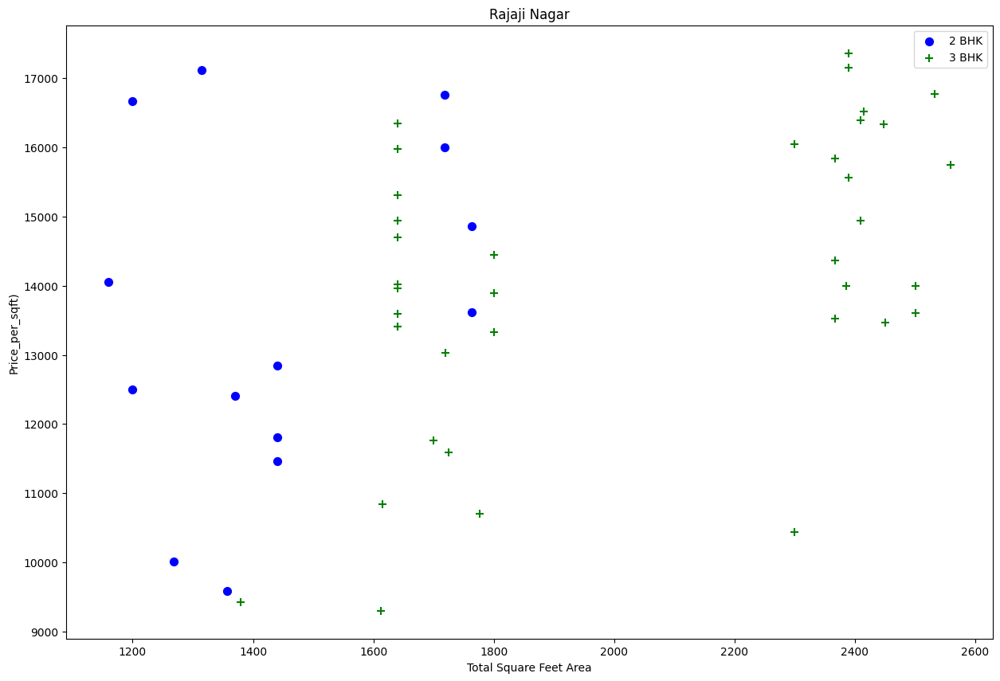

In [ ]:
def plot_scatter_chart(df,location):
    bhk2 = df[(df.location==location) & (df.bhk==2)]
    bhk3 = df[(df.location==location) & (df.bhk==3)]
    matplotlib.rcParams['figure.figsize'] = (15,10)
    plt.scatter(bhk2.total_sqft,bhk2.price_per_sqft,color='blue',label='2 BHK', s=50)
    plt.scatter(bhk3.total_sqft,bhk3.price_per_sqft,marker='+', color='green',label='3 BHK', s=50)
    plt.xlabel("Total Square Feet Area")
    plt.ylabel("Price_per_sqft)")
    plt.title(location)
    plt.legend()
plot_scatter_chart(df_f_2,"Rajaji Nagar")

In [ ]:
def remove_bhk_outliers(df):
    exclude_indices = np.array([])
    for location, location_df in df.groupby('location'):
        bhk_stats = {}
        for bhk, bhk_df in location_df.groupby('bhk'):
            bhk_stats[bhk] = {
                'mean': np.mean(bhk_df.price_per_sqft),
                'std': np.std(bhk_df.price_per_sqft),
                'count': bhk_df.shape[0]
            }
        for bhk, bhk_df in location_df.groupby('bhk'):
            stats = bhk_stats.get(bhk-1)
            if stats and stats['count']>5:
                exclude_indices = np.append(exclude_indices, bhk_df[bhk_df.price_per_sqft<(stats['mean'])].index.values)
    return df.drop(exclude_indices,axis='index')

In [ ]:
df_f_3 = remove_bhk_outliers(df_f_2)
df_f_3.shape

(7353, 7)

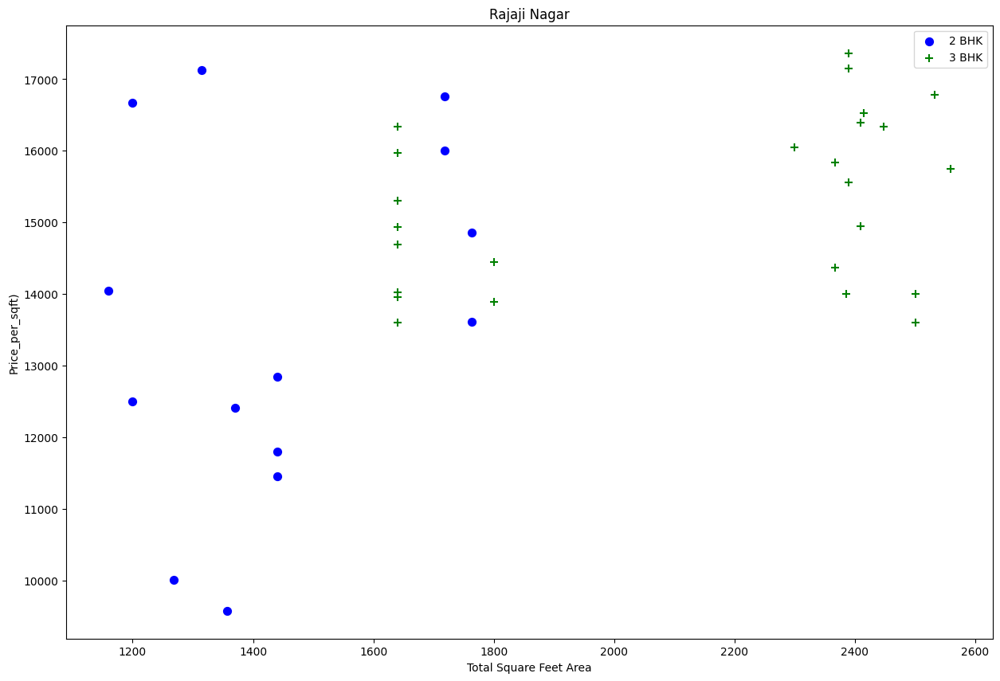

In [ ]:
plot_scatter_chart(df_f_3,"Rajaji Nagar")

Text(0, 0.5, 'Count')

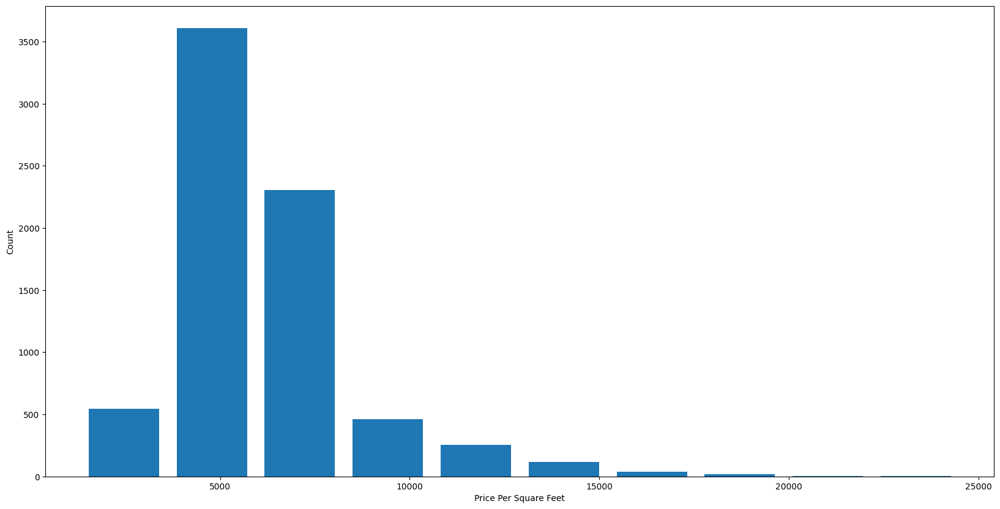

In [ ]:
#Histogram

matplotlib.rcParams["figure.figsize"] = (20,10)
plt.hist(df_f_3.price_per_sqft,rwidth=0.8)
plt.xlabel("Price Per Square Feet")
plt.ylabel("Count")

In [ ]:
df_f_3.bath.unique()

array([ 4.,  3.,  2.,  5.,  8.,  1.,  6.,  7.,  9., 12., 16., 13.])

In [ ]:
df_f_3[df_f_3.bath>10]

,location,size,total_sqft,bath,price,bhk,price_per_sqft
5306,Neeladri Nagar,10 BHK,4000.0,12.0,160.0,10,4000.000000
8530,other,10 BHK,12000.0,12.0,525.0,10,4375.000000
8619,other,16 BHK,10000.0,16.0,550.0,16,5500.000000
9352,other,11 BHK,6000.0,12.0,150.0,11,2500.000000
9683,other,13 BHK,5425.0,13.0,275.0,13,5069.124424


Text(0, 0.5, 'Count')

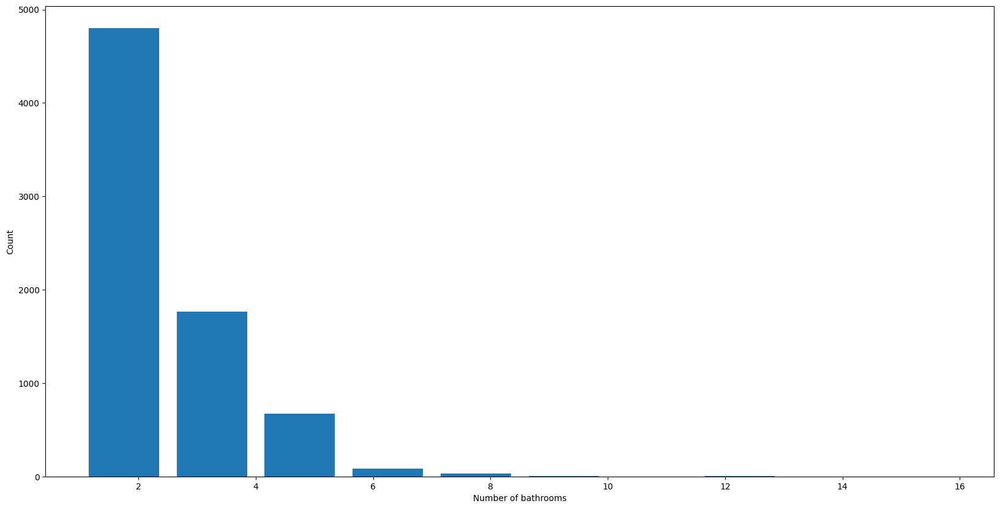

In [ ]:
plt.hist(df_f_3.bath,rwidth=0.8)
plt.xlabel("Number of bathrooms")
plt.ylabel("Count")

In [ ]:
df_f_3[df_f_3.bath>df_f_3.bhk+2]

,location,size,total_sqft,bath,price,bhk,price_per_sqft
1634,Chikkabanavar,4 Bedroom,2460.0,7.0,80.0,4,3252.032520
5267,Nagasandra,4 Bedroom,7000.0,8.0,450.0,4,6428.571429
6748,Thanisandra,3 BHK,1806.0,6.0,116.0,3,6423.034330
8455,other,6 BHK,11338.0,9.0,1000.0,6,8819.897689


In [ ]:
df_f_4 = df_f_3[df_f_3.bath<df_f_3.bhk+2]
df_f_4.shape

(7275, 7)

In [ ]:
dfv = df_f_4.drop(['size','price_per_sqft'],axis='columns')
dfv.head()

,location,total_sqft,bath,price,bhk
0,1st Block Jayanagar,2850.0,4.0,428.0,4
1,1st Block Jayanagar,1630.0,3.0,194.0,3
2,1st Block Jayanagar,1875.0,2.0,235.0,3
3,1st Block Jayanagar,1200.0,2.0,130.0,3
4,1st Block Jayanagar,1235.0,2.0,148.0,2




> Model Building



In [ ]:
dummies = pd.get_dummies(dfv.location).astype(int)
dummies.head()

,1st Block Jayanagar,1st Phase JP Nagar,2nd Phase Judicial Layout,2nd Stage Nagarbhavi,5th Block Hbr Layout,5th Phase JP Nagar,6th Phase JP Nagar,7th Phase JP Nagar,8th Phase JP Nagar,9th Phase JP Nagar,...,Vishveshwarya Layout,Vishwapriya Layout,Vittasandra,Whitefield,Yelachenahalli,Yelahanka,Yelahanka New Town,Yelenahalli,Yeshwanthpur,other
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
dfv_1 = pd.concat([dfv,dummies.drop('other',axis='columns')],axis='columns')
dfv_1.head()

,location,total_sqft,bath,price,bhk,1st Block Jayanagar,1st Phase JP Nagar,2nd Phase Judicial Layout,2nd Stage Nagarbhavi,5th Block Hbr Layout,...,Vijayanagar,Vishveshwarya Layout,Vishwapriya Layout,Vittasandra,Whitefield,Yelachenahalli,Yelahanka,Yelahanka New Town,Yelenahalli,Yeshwanthpur
0,1st Block Jayanagar,2850.0,4.0,428.0,4,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1st Block Jayanagar,1630.0,3.0,194.0,3,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1st Block Jayanagar,1875.0,2.0,235.0,3,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1st Block Jayanagar,1200.0,2.0,130.0,3,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1st Block Jayanagar,1235.0,2.0,148.0,2,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
dfv_2 = dfv_1.drop('location',axis='columns')
dfv_2.head()

,total_sqft,bath,price,bhk,1st Block Jayanagar,1st Phase JP Nagar,2nd Phase Judicial Layout,2nd Stage Nagarbhavi,5th Block Hbr Layout,5th Phase JP Nagar,...,Vijayanagar,Vishveshwarya Layout,Vishwapriya Layout,Vittasandra,Whitefield,Yelachenahalli,Yelahanka,Yelahanka New Town,Yelenahalli,Yeshwanthpur
0,2850.0,4.0,428.0,4,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1630.0,3.0,194.0,3,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1875.0,2.0,235.0,3,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1200.0,2.0,130.0,3,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1235.0,2.0,148.0,2,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
X = dfv_2.drop(['price'],axis='columns')
X.head()

,total_sqft,bath,bhk,1st Block Jayanagar,1st Phase JP Nagar,2nd Phase Judicial Layout,2nd Stage Nagarbhavi,5th Block Hbr Layout,5th Phase JP Nagar,6th Phase JP Nagar,...,Vijayanagar,Vishveshwarya Layout,Vishwapriya Layout,Vittasandra,Whitefield,Yelachenahalli,Yelahanka,Yelahanka New Town,Yelenahalli,Yeshwanthpur
0,2850.0,4.0,4,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1630.0,3.0,3,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1875.0,2.0,3,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1200.0,2.0,3,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1235.0,2.0,2,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
y = dfv_2.price
y.head()

,price
0,428.0
1,194.0
2,235.0
3,130.0
4,148.0


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=10)

In [ ]:
from sklearn.linear_model import LinearRegression
lr_clf = LinearRegression()
lr_clf.fit(X_train,y_train)
lr_clf.score(X_test,y_test)

0.8300702721039399

In [ ]:
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_val_score

cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
cross_val_score(LinearRegression(), X, y, cv=cv)

array([0.80702643, 0.77249195, 0.86466289, 0.83528873, 0.81806721])

In [ ]:
from sklearn.model_selection import GridSearchCV

from sklearn.linear_model import Lasso
from sklearn.tree import DecisionTreeRegressor

def GSCV(X,y):
  algos = {
      'linear_regression' : {
          'model': LinearRegression(),
          'params': {
              # 'normalize': [True, False] # Removed the normalize parameter
              'fit_intercept': [True, False] # Added an example of a valid parameter
          }
      },
      'lasso': {
          'model': Lasso(),
          'params': {
              'alpha': [1,2],
              'selection': ['random', 'cyclic']
          }
      },
      'decision_tree': {
          'model': DecisionTreeRegressor(),
          'params': {
              'criterion' : ['mse','friedman_mse'],
              'splitter': ['best','random']
          }
      }
  }

  scores = []
  cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
  for algo_name, config in algos.items():
    gs =  GridSearchCV(config['model'], config['params'], cv=cv, return_train_score=False)
    gs.fit(X,y)
    scores.append({
        'model': algo_name,
        'best_score': gs.best_score_,
        'best_params': gs.best_params_
    })
  return pd.DataFrame(scores,columns=['model','best_score','best_params'])

GSCV(X,y)

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
10 fits failed out of a total of 20.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_

,model,best_score,best_params
0,linear_regression,0.819696,{'fit_intercept': False}
1,lasso,0.679931,"{'alpha': 1, 'selection': 'cyclic'}"
2,decision_tree,0.700088,"{'criterion': 'friedman_mse', 'splitter': 'best'}"


In [ ]:
def predict_price(location,sqft,bath,bhk):
    loc_index = np.where(X.columns==location)[0][0]

    x=np.zeros(len(X.columns))
    x[0] = sqft
    x[1] = bath
    x[2] = bhk
    if loc_index >= 0:
        x[loc_index] = 1

    return lr_clf.predict([x])

predict_price('1st Phase JP Nagar',1000, 2,2)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([83.51389236])



> Save model



In [ ]:
import pickle
with open('banglore_home_prices_model.pickle','wb') as f:
    pickle.dump(lr_clf,f)

In [ ]:
#export other important infos
import json
columns = {
    'data_columns' : [col.lower() for col in X.columns]
}
with open("columns.json","w") as f:
    f.write(json.dumps(columns))



> Flask Server

Just for illustration



In [ ]:
from flask import Flask, request, jsonify
app = Flask(__name__)

@app.route('/predict_home_price',methods=['POST'])

def predict_home_price():
    total_sqft = float(request.form['total_sqft'])
    location = request.form['location']
    bhk = int(request.form['bhk'])
    bath = int(request.form['bath'])

    response = jsonify({
        'estimated_price': predict_price(location,total_sqft,bhk,bath)
    })
    response.headers.add('Access-Control-Allow-Origin', '*')

    return response

if __name__ == "__main__":
    print("Starting Python Flask Server For Home Price Prediction...")
    app.run()







---



# **Deep Learning**


## Regularization




1.   **L1 and L2**
2.   **Dropout**
3.   Data Augment
  * Mirroring
  * Random Cropping
      * Rotation
      * Shearing
      * Local warping
  * Color shifting
      * PCA

4.   Early stopping
  * Stop the iteration at a quite good dev set error point






> **L1 and L2**





*   **Weight decay** limits the size of the weights by increasing the penalty term in the loss function, making it impossible for the model to arbitrarily increase the weights to fit the noise in the training data
*   L2 regularization tends to make the distribution of weights more even, preventing individual weights from being too large, weights determine how inputs affect outputs. Larger weights can cause neurons to produce large output changes in response to small changes in inputs
  *  Reducing the over-reliance of the model on certain features improves the stability of the model





* L2:

$$
L = L_{orginal} + \lambda \sum_{i=1}^{n} w_i^2
$$



*   The regularization term makes it possible to update the weights during the gradient descent update process not only by considering the **reduction of the loss function**, but also by not increasing the regularization **penalty term**
  *   If there is noise in the training data, the model may require very large weights to accurately fit these noise points
  *   The model needs to find a balance between reducing $L_{original}$ and keeping 𝑅(𝑤) small when minimizing the total loss L
     *  By derivative:
     $\frac{\partial L}{\partial w_i} = \frac{\partial L_{\text{original}}}{\partial w_i} + 2\lambda w_i $
     
     * This means that every time the weights are updated, there is an extra $2\lambda w_i$ item that stops the weights from being too large
  



L2:

Used for a small number of samples to reduce variance from the train set, overfitting

L1:

Used to get rid of useless features



> **Dropout**

1. *Tradition Dropout*

Dropout is a regularization method that randomly discards a fraction of neurons and their connections in each training iteration.

**Purpose**: to prevent co-adaptation between neurons, where the model is too dependent on some specific combination of neurons.

**Property**:
*   Dropout forces each neuron of the model to be more adaptable, as any neuron can be dropped during training.


*   Dropout breaks the complex co-adaptive relationships between neurons, preventing the model from relying too heavily on particular combinations of neurons

**Training phase**:

For each layer, neurons are retained with probability 𝑝 (usually 0.5) and discarded with probability 1-𝑝.

The output of discarded neurons is set to 0 and does not participate in subsequent computations.

**Test phase**:

Dropout is not used, i.e., all neurons are kept.

Scaling of the neuron outputs is required to match the activation value expectations from training.


2. *Inverted Dropout*

Inverted Dropout is the **scaling** of the outputs of the retained neurons during the **training phase**, **without any scaling or adjustment** during the **testing phase**.

**Purpose**: To ensure that the expectation of neuron activation values in the training and testing phases are consistent and to simplify the implementation.



Advantages:
* Ensure consistent activation value expectations in the training and testing phases by scaling in the training phase.
  * Ensure that the behavior of the neural network is as consistent as possible between the training and testing phases
  * So that the features and patterns learned by the model during training can be effectively applied in the testing phase.
* No need to scale activation values during testing, reducing implementation complexity and computational overheads

**Usually used in the area in CV(Computer Vision)**

In [ ]:
# Inverted Dropout logic
d3 = np.random.rand(a3.shape[0], a3.shape[1]) < keep_prob
#Generate a matrix of the same shape as a3 with elements taking values between (0,1) and obeying a uniform distribution.
a3 = np.multiply(a3, d3)
a3 /= keep_prob #Scaling the activation values of retained neurons



> Example



In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
import warnings
warnings.filterwarnings('ignore')

df = pd.read_csv('/content/drive/MyDrive/MD/Learning is Learning/sonar_dataset.csv',header=None)
df.sample(5)

,0,1,2,3,4,5,6,7,8,9,...,51,52,53,54,55,56,57,58,59,60
102,0.0587,0.1210,0.1268,0.1498,0.1436,0.0561,0.0832,0.0672,0.1372,0.2352,...,0.0331,0.0111,0.0088,0.0158,0.0122,0.0038,0.0101,0.0228,0.0124,M
25,0.0201,0.0026,0.0138,0.0062,0.0133,0.0151,0.0541,0.0210,0.0505,0.1097,...,0.0108,0.0070,0.0063,0.0030,0.0011,0.0007,0.0024,0.0057,0.0044,R
182,0.0095,0.0308,0.0539,0.0411,0.0613,0.1039,0.1016,0.1394,0.2592,0.3745,...,0.0181,0.0019,0.0102,0.0133,0.0040,0.0042,0.0030,0.0031,0.0033,M
111,0.0530,0.0885,0.1997,0.2604,0.3225,0.2247,0.0617,0.2287,0.0950,0.0740,...,0.0244,0.0199,0.0257,0.0082,0.0151,0.0171,0.0146,0.0134,0.0056,M
146,0.1021,0.0830,0.0577,0.0627,0.0635,0.1328,0.0988,0.1787,0.1199,0.1369,...,0.0709,0.0317,0.0309,0.0252,0.0087,0.0177,0.0214,0.0227,0.0106,M


In [ ]:
df.shape

(208, 61)

In [ ]:
df.isna().sum()

,0
0,0
1,0
2,0
3,0
4,0
...,...
56,0
57,0
58,0
59,0


In [ ]:
df.columns # no column names

Index([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
       36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53,
       54, 55, 56, 57, 58, 59, 60],
      dtype='int64')

In [ ]:
df[60].value_counts()

,count
60,
M,111
R,97


In [ ]:
X = df.drop(60,axis=1)
y = df[60]

In [ ]:
y_cat = pd.get_dummies(y,drop_first=True).astype(int)
y_cat.sample(5)

,R
18,1
40,1
143,0
37,1
94,1


In [ ]:
y_cat.value_counts()

,count
R,
0,111
1,97


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y_cat, test_size=0.25, random_state=1)

In [ ]:
X_train.shape, X_test.shape

((156, 60), (52, 60))

In [ ]:
import tensorflow as tf
from tensorflow import keras

In [ ]:
model = keras.Sequential([
    keras.layers.Dense(60, input_dim=60, activation='relu'),
    keras.layers.Dense(30, activation='relu'),
    keras.layers.Dense(15, activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

model.fit(X_train, y_train, epochs=100, batch_size=8)

In [ ]:
model.evaluate(X_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 444ms/step - accuracy: 0.6931 - loss: 1.4888


[1.330589771270752, 0.7115384340286255]

In [ ]:
y_pred = model.predict(X_test).reshape(-1)
print(y_pred[:10])

y_pred = np.round(y_pred)
print(y_pred[:10])

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 269ms/step
[8.2509306e-09 9.9519628e-01 9.9748981e-01 1.2170662e-05 9.9999988e-01
 9.9995315e-01 8.6864012e-01 9.9999988e-01 1.5436457e-05 9.9999988e-01]
[0. 1. 1. 0. 1. 1. 1. 1. 0. 1.]


In [ ]:
y_test[:10]

,R
186,0
155,0
165,0
200,0
58,1
34,1
151,0
18,1
202,0
62,1


In [ ]:
from sklearn.metrics import confusion_matrix , classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.69      0.81      0.75        27
           1       0.75      0.60      0.67        25

    accuracy                           0.71        52
   macro avg       0.72      0.71      0.71        52
weighted avg       0.72      0.71      0.71        52



In [ ]:
model_drop = keras.Sequential([
    keras.layers.Dense(60, input_dim=60, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(30, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(15, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(1, activation='sigmoid')
])
model_drop.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

model_drop.fit(X_train, y_train, epochs=100, batch_size=8)

In [ ]:
model_drop.evaluate(X_test, y_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 309ms/step - accuracy: 0.7756 - loss: 0.4653


[0.44677111506462097, 0.7884615659713745]

In [ ]:
y_pred = model_drop.predict(X_test).reshape(-1)
print(y_pred[:10])

y_pred = np.round(y_pred)
print(y_pred[:10])

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 231ms/step
[0.00196861 0.52878666 0.81494325 0.0308568  0.999298   0.7595447
 0.25516772 0.99932134 0.04821543 0.99960494]
[0. 1. 1. 0. 1. 1. 0. 1. 0. 1.]


In [ ]:
y_test[:10]

,R
186,0
155,0
165,0
200,0
58,1
34,1
151,0
18,1
202,0
62,1


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.74      0.93      0.82        27
           1       0.89      0.64      0.74        25

    accuracy                           0.79        52
   macro avg       0.81      0.78      0.78        52
weighted avg       0.81      0.79      0.78        52



## MLP

* Why do we need Neural Networks?

  Thinking about nonlinear classification boundaries

  1. Apply a linear classifier to some features of the data
    * but not that general
  2. If we just again use a linear function for 𝞥 ?
  $$
  𝞥(x) = W^T x
  $$
  This does not work, it still a linear classifier

  Thus, we have
  $$
  𝞥(x)=𝛔(W^Tx)
  $$
  Where $ W \in \mathbb{R}^{n \times d}$, and 𝛔: $\mathbb{R}^{d} → \mathbb{R}^{d}$ is essentially any nonlinear function

  * And we are having a nonlinear classifier which is the basic form of Neural Network

**Example**

$$
h_{\theta}(x)= W_2^T𝛔(W_1^Tx)
$$
$$
\theta = \{W_1 \in \mathbb{R}^{n\times d},W_2 \in \mathbb{R}^{d\times k}\}
$$
Where 𝛔 is sigmoid or ReLu function or etc.

**Theorem (1D case)**
Given any smooth function $ f: \mathbb{R} \to \mathbb{R} $, closed region $\mathcal{D} \subset \mathbb{R}$, and $\epsilon > 0$, we can construct a one-hidden-layer neural network $\hat{f}$ such that:

$$
\max_{x \in \mathcal{D}} \left| f(x) - \hat{f}(x) \right| \leq \epsilon
$$

**Proof:**

Select some dense sampling of points $(x^{(i)}, f(x^{(i)}))$ over $\mathcal{D}$. Create a neural network that passes exactly through these points (see next slide). Because the neural network function is piecewise linear, and the function $f$ is smooth, by choosing the $x^{(i)}$ close enough together, we can *approximate the function arbitrarily closely*.




> **MLP**

A more generic form of a L-layer neural network - a.k.a "MLP", feedforward network,fully-connected network


$$
Z_{i+1}= 𝛔_i(Z_iW_i), i =1,...,L
$$
$$
Z_1=X (Input)
$$
$$
h_{\theta}(X) = Z_{L+1} (Output)
$$
$$
[Z_i \in \mathbb{R}^{m\times n_i},W_i \in \mathbb{R}^{n_i\times n_{i+1}}]
$$

which parameters $ \theta = \{W_1,...,W_L\} $ where bias terms is ignored here


In [ ]:

# MLP with 1 hidden layer
import torch
import torch.nn as nn
def relu(X):
  return torch.maximum(X, torch.tensor(0.0))

W_1 = nn.Parameter(torch.randn(num_inputs,num_hiddens)*0.01) # *0.01 is to initialize the parameter and prevent to explode
b_1 = nn.Parameter(torch.zeros(num_hiddens,1))
W_2 = nn.Parameter(torch.randn(num_hiddens,num_outputs)*0.01)
b_2 = nn.Parameter(torch.zeros(num_outputs,1))

H = relu(torch.matmul(W_1,X)+b_1) # relu(X@W_1+b_1)
y_hat = torch.matmul(W_2,H)+b_2 #H@W_2 + b_2

In [ ]:
import torch
import torch.nn as nn

# ReLU 激活函数
def relu(X):
    return X.clamp(min=0)  # 或者使用 torch.maximum(X, torch.tensor(0.0))

# 假设 num_inputs、num_hiddens、num_outputs 是已经定义的
num_inputs = 3
num_hiddens = 4
num_outputs = 2

# 初始化参数
W_1 = nn.Parameter(torch.randn(num_inputs, num_hiddens) * 0.01)
b_1 = nn.Parameter(torch.zeros(num_hiddens, 1))
W_2 = nn.Parameter(torch.randn(num_hiddens, num_outputs) * 0.01)
b_2 = nn.Parameter(torch.zeros(num_outputs, 1))

# 输入数据 X (形状为 num_inputs x batch_size)
X = torch.randn(num_inputs, 5)  # 假设 batch_size 为 5

# 前向传播
H = relu(torch.matmul(W_1.T, X) + b_1)  # 隐藏层计算
y_hat = torch.matmul(W_2.T, H) + b_2    # 输出层计算

print(y_hat)


tensor([[ 1.4999e-04,  2.3141e-05,  7.8689e-05,  8.8667e-05,  2.1071e-04],
        [-1.4834e-04,  7.6033e-05,  1.6806e-04,  7.7347e-05, -2.0840e-04]],
       grad_fn=<AddBackward0>)


In [ ]:
print(X)

tensor([[-0.5425, -0.8004, -1.4478, -0.2879,  2.6579],
        [ 0.3825, -0.4567, -1.2293,  1.0742,  0.1411],
        [-0.9293,  0.9351, -0.4611, -0.0383,  0.3785]])


In [ ]:
loss_fn = nn.MSELoss()
y = torch.randn(num_outputs, 5)  # 假设这是标签
loss = loss_fn(y_hat, y)
print('Loss:', loss.item())


Loss: 0.6018139123916626


In [ ]:
learning_rate = 0.01
with torch.no_grad():
    W_1 -= learning_rate * W_1.grad
    b_1 -= learning_rate * b_1.grad
    W_2 -= learning_rate * W_2.grad
    b_2 -= learning_rate * b_2.grad

    # 清零梯度
    W_1.grad.zero_()
    b_1.grad.zero_()
    W_2.grad.zero_()
    b_2.grad.zero_()


TypeError: unsupported operand type(s) for *: 'float' and 'NoneType'

In [ ]:
import torch.optim as optim

# 定义优化器
optimizer = optim.SGD([W_1, b_1, W_2, b_2], lr=learning_rate)

# 前向传播、计算损失...
loss = loss_fn(y_hat, y)

# 反向传播计算梯度
loss.backward()

# 使用优化器更新参数
optimizer.step()


In [ ]:
print('Updated W_1:', W_1)
print('Updated b_1:', b_1)
print('Updated W_2:', W_2)
print('Updated b_2:', b_2)

Updated W_1: Parameter containing:
tensor([[-0.0101, -0.0086,  0.0077, -0.0165],
        [-0.0008,  0.0183, -0.0100,  0.0100],
        [ 0.0078,  0.0003,  0.0025, -0.0021]], requires_grad=True)
Updated b_1: Parameter containing:
tensor([[-1.5101e-05],
        [ 1.4128e-05],
        [ 6.2096e-05],
        [-1.2839e-05]], requires_grad=True)
Updated W_2: Parameter containing:
tensor([[ 0.0108, -0.0054],
        [ 0.0050,  0.0079],
        [ 0.0121, -0.0120],
        [-0.0090, -0.0001]], requires_grad=True)
Updated b_2: Parameter containing:
tensor([[ 0.0042],
        [-0.0015]], requires_grad=True)


In [ ]:
# 清零梯度
optimizer.zero_grad()




---



## Convolution Neural Networks (CNN)




Dense Layer -> Convolution layer

Learning ImageNet (300 * 300) images with 1K classes by a MLP with a single Hidden layer with 10k outputs. In this case, assume we have 10,000 neurons in the hidden layer (90,000 of inputs and 1000 for output, we take a medium value)

-- Thus, we will have 90,000 * 10,000 parameter to train for this NN which nearly 1 billion. That's too much of parameter for MLP


**Solution for this**


Some  prior knowledge that can be added

For recognizing object in Image:

1. Translation Invariance:

The object to be recognize will not change too much if it shift to somewhere else

2. Locality:

Recognizing one object do not need the pixel that far away (the pixels around are highly related)


---



> **Convolutional Neural Network (CNN)**




*   A neural network ueses stack of convolution layers to extract features

  -- (Not necessary to process picture, something related to spatial infos, only need to satisfy the locality and Translation Invariance)

  *   Activation is applied after each convolution layer
  *   Using pooling to reduce location sensitivity

* Parameter sharing:
  
  A feature detetcor(vertical edge) that's useful in one part of the image is probably useful in another part of the image

* Sparsity of Connections:

  In each layer, each output value depends only on a small number of inputs

*   Modern CNNs are deep neural network with various hyper-params and layer connections (AlexNet, VGG, Inceptions, ResNet, MobileNet)





> **Convolution Layer**





*  **Locality**:

  An output is computed from K*K input windows (Only focus on the part we want, ignore the others).
  
  But for MLP (Fully connect NN), it will go through all the pixels of the image.


*   **Translation Invariance**:

  If we have an learnt weight, transform it to another place, it can still recognize objects.



*  **#** The number of params of a conv layer does not depend on input/output sizes


*   **A** kernel may learn to identify a pattern

  The k*k window is called kernel, usually being used to learn the some pattern or feature of the image.

  Varies between different data or models, however, we will use different kinds of channel which select multiple set of datat to obtain a multi-channel output to learn different kinds of pattern.




In [ ]:
import torch
# Convolution with single input and output channels
def corr2d(X, K): # X is the input and K is the weight both are metrics
    """Compute 2D cross-correlation."""
    h, w = K.shape #window size
    Y = torch.zeros((X.shape[0] - h + 1, X.shape[1] - w + 1)) # output size
    for i in range(Y.shape[0]):
        for j in range(Y.shape[1]):
            Y[i, j] = (X[i:i + h, j:j + w] * K).sum()
    return Y

In [ ]:
X = torch.tensor([[0.0, 1.0, 2.0], [3.0, 4.0, 5.0], [6.0, 7.0, 8.0]])
K = torch.tensor([[0.0, 1.0], [2.0, 3.0]])
corr2d(X, K)

tensor([[19., 25.],
        [37., 43.]])

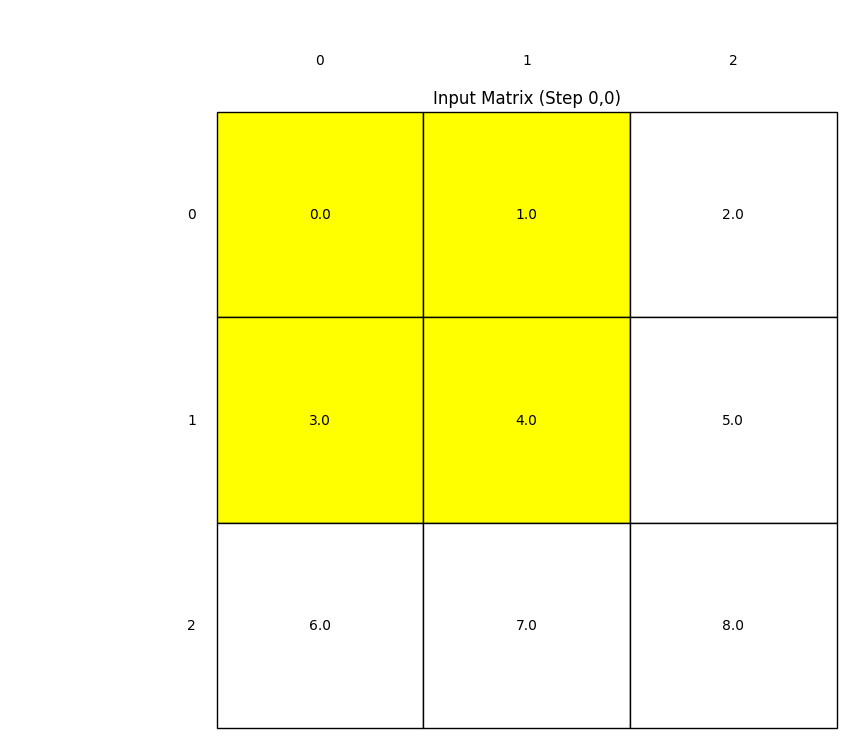

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.table import Table
import time
import torch

X = torch.tensor([[0.0, 1.0, 2.0],
                  [3.0, 4.0, 5.0],
                  [6.0, 7.0, 8.0]])
K = torch.tensor([[0.0, 1.0],
                  [2.0, 3.0]])

h, w = K.shape
Y = torch.zeros((X.shape[0] - h + 1, X.shape[1] - w + 1))

fig, ax = plt.subplots(figsize=(8, 8))

def draw_table(data, title, highlight_coords=None):
    ax.clear()
    ax.set_axis_off()
    table = Table(ax, bbox=[0, 0, 1, 1])
    nrows, ncols = data.shape
    width, height = 1.0 / ncols, 1.0 / nrows

    # Add cells
    for (i, j), val in np.ndenumerate(data.numpy()):
        if highlight_coords and (i, j) in highlight_coords:
            color = 'yellow'
        else:
            color = 'white'
        table.add_cell(i, j, width, height, text=val, loc='center', facecolor=color)

    # Row and column labels
    for i in range(nrows):
        table.add_cell(i, -1, width, height, text=i, loc='right',
                       edgecolor='none', facecolor='none')
    for j in range(ncols):
        table.add_cell(-1, j, width, height/2, text=j, loc='center',
                       edgecolor='none', facecolor='none')

    ax.add_table(table)
    ax.set_title(title)
    plt.pause(1)

for i in range(Y.shape[0]):
    for j in range(Y.shape[1]):
        region = X[i:i + h, j:j + w]
        Y[i, j] = torch.sum(region * K)
        draw_table(X, f'Input Matrix (Step {i},{j})', highlight_coords=[(i + x, j + y) for x in range(h) for y in range(w)])
        draw_table(K, 'Kernel')
        draw_table(Y, 'Output Matrix')

plt.show()



---





>  **Vertical Edge Detection**



Given the input matrix:

$$
\begin{bmatrix}
10 & 10 & 10 & 0 & 0 & 0 \\
10 & 10 & 10 & 0 & 0 & 0 \\
10 & 10 & 10 & 0 & 0 & 0 \\
10 & 10 & 10 & 0 & 0 & 0 \\
10 & 10 & 10 & 0 & 0 & 0 \\
\end{bmatrix}
$$

The convolution operation with the filter:

$$
\text{Filter} =
\begin{bmatrix}
1 & 0 & -1 \\
1 & 0 & -1 \\
1 & 0 & -1 \\
\end{bmatrix}
$$

Produces the output matrix:

$$
\begin{bmatrix}
0 & 30 & 30 & 0 \\
0 & 30 & 30 & 0 \\
0 & 30 & 30 & 0 \\
0 & 30 & 30 & 0 \\
\end{bmatrix}
$$

This highlights the vertical edges in the image.


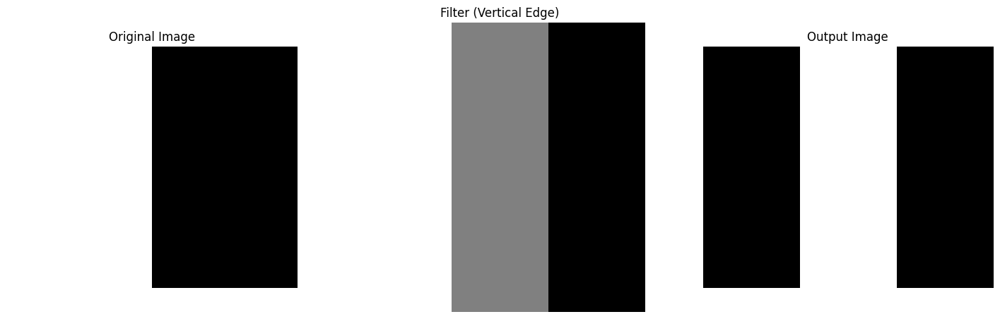

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the input matrix (image) - Grayscale, each value corresponds to a different intensity
image = np.array([[5, 5, 5, 0, 0, 0],
                  [5, 5, 5, 0, 0, 0],
                  [5, 5, 5, 0, 0, 0],
                  [5, 5, 5, 0, 0, 0],
                  [5, 5, 5, 0, 0, 0]])

# Define the filter for vertical edge detection
filter_vertical = np.array([[1, 0, -1],
                            [1, 0, -1],
                            [1, 0, -1]])

# Function to apply the filter (convolution)
def convolution2d(image, kernel):
    kernel_height, kernel_width = kernel.shape
    padded_image = np.pad(image, ((kernel_height//2, kernel_height//2), (kernel_width//2, kernel_width//2)), mode='constant')
    output = np.zeros_like(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_image[i:i + kernel_height, j:j + kernel_width]
            output[i, j] = np.sum(region * kernel)

    return output

# Apply the convolution
output = convolution2d(image, filter_vertical)

# Adjust output values for visualization
output_normalized = np.clip(output, -5, 5)  # Clip values for better visualization

# Plot the input image, the filter, and the output
plt.figure(figsize=(18, 6))

# Original Image
plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(image, cmap='gray', vmin=0, vmax=5)
plt.axis('off')

# Filter Visualization
plt.subplot(1, 3, 2)
plt.title("Filter (Vertical Edge)")
plt.imshow(filter_vertical, cmap='gray', vmin=-1, vmax=1)
plt.axis('off')

# Output after Vertical Edge Detection
plt.subplot(1, 3, 3)
plt.title("Output Image")
plt.imshow(output, cmap='gray', vmin=0, vmax=10)  # Set appropriate vmin and vmax
plt.axis('off')
plt.show()


plt.show()


Above is just a abstract graph to show the vertical edge detection,

We can see that there is boundary between white and gray for orginal image

by CNN, it can be augmented in a white band in the output



---





> **Padding**



In CNNs, padding is mainly used to control the spatial dimensions of the feature map. Specifically, padding helps to maintain consistent input and output sizes or adjust the size of the feature maps based on the requirements.

1. **Why is Padding Needed?**

  - **To Preserve Size**: Without padding, the border elements in an image have fewer neighboring elements, which could cause the feature map size to shrink after each convolution operation. Padding helps maintain consistent input and output sizes, making it easier to build deeper networks.
  
  - **To Preserve Border Information**: Padding helps retain the border information of data, avoiding the loss of crucial edge features during convolution.

2. **Common Types of Padding**

* **Valid Padding (No Padding)**

  - **Definition**: No padding is applied to the input, and convolution is performed directly.

  - **Characteristic**: The output feature map size will be smaller than the input.

  - **Formula**:

$$
\text{Output Size} = \left\lfloor \frac{\text{Input Size} - \text{Kernel Size}}{\text{Stride}} \right\rfloor + 1
$$

* **Same Padding (Zero Padding)**

  - **Definition**: Padding with zeros is applied around the border of the input, ensuring that the output feature map has the same size as the input (when stride = 1).

  - **Characteristic**: The output size is preserved to be the same as the input size.

  - **Formula**:

$$
\text{Padding} = \frac{(\text{Stride} - 1) \times \text{Input Size} - \text{Stride} + \text{Kernel Size}}{2}
$$

* **Full Padding**

  - **Definition**: Padding is added around the border of the input to ensure the convolution kernel completely covers all border pixels.

  - **Characteristic**: The output feature map size will be larger than the input size.

  - **Application**: Rarely used, mainly for specific requirements.


In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.models import Sequential

model = Sequential([
    Conv2D(filters=32, kernel_size=(3, 3), padding='valid', activation='relu', input_shape=(28, 28, 1)), # zero padding
    Conv2D(filters=64, kernel_size=(3, 3), padding='same', activation='relu'), # same padding
])

model.summary()


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)                    │ (None, 26, 26, 32)          │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 26, 26, 64)          │          18,496 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,816 (73.50 KB)

 Trainable params: 18,816 (73.50 KB)

 Non-trainable params: 0 (0.00 B)


* **Stride**

$$
Output Dimension = \frac{n+2p-f}{s} +1
$$

p is the padding

n is the input dimension

f is the filter dimension

s is the step/stride



> **3D CNN**



$$
Height * Width * channels
$$
RGB images for examples and this is for both Input and filter

$$
Output = OuputDimension*OutputDimension*filterNumber
$$

If Layer $l$ is a Convolution Layer:

- $f^{[l]}$: Filter size
- $ p^{[l]} $: Padding
- $ s^{[l]} $: Stride
- $ n_c^{[l]} $: Number of filters

Each filter is:
$
f^{[l]} \times f^{[l]} \times n_c^{[l-1]}
$

Activations:
$
a^{[l]}: n_H^{[l]} \times n_W^{[l]} \times n_c^{[l]}
$

Weights:
$
W^{[l]}: f^{[l]} \times f^{[l]} \times n_c^{[l-1]} \times n_c^{[l]}
$

Bias:
$
b^{[l]}: (1, 1, 1, n_c^{[l]})
$

Input Dimensions:
$
n_H^{[l-1]} \times n_W^{[l-1]} \times n_c^{[l-1]}
$

Output Dimensions:
$
n_H^{[l]} \times n_W^{[l]} \times n_c^{[l]}
$

Output Height and Width Calculation:

$
n_H^{[l]} = \left( \frac{n_H^{[l-1]} + 2p^{[l]} - f^{[l]}}{s^{[l]}} \right) + 1
$

$
n_W^{[l]} = \left( \frac{n_W^{[l-1]} + 2p^{[l]} - f^{[l]}}{s^{[l]}} \right) + 1
$

Number of Parameters:
- **Weights**: $ f^{[l]} \times f^{[l]} \times n_c^{[l-1]} \times n_c^{[l]} $
- **Bias**: $ n_c^{[l]} $


**Example and Notion:**

Say that, we having a $6×6×3$ input, and using a $3×3×3$ filter to Convolute:
* If we have only one filter,
  - The output will be like: using the filter to convolute for each $3×3$ channel and add together for one element
  - The ouput will be like $4×4$ with only one filter


- Suppose you have an input tensor $X$ of size **$2 \times 2 \times 3$**:

  $$
  X =
  \begin{bmatrix}
  [1, 2, 3] & [4, 5, 6] \\
  [7, 8, 9] & [10, 11, 12]
  \end{bmatrix}
  $$

  Here, each element is a 3-dimensional vector.

$1 \times 1$ Convolution Kernels:

- We use **two** $1 \times 1$ convolution kernels to reduce the channel number from **3** to **2**.
- The kernels are:
  - Kernel $W_1 = [0.1, 0.2, 0.3]$
  - Kernel $W_2 = [0.4, 0.5, 0.6]$

Convolution Operation:

- Apply each kernel to every spatial location of the input tensor.

- For position $(1,1)$, the input vector is $[1, 2, 3]$. Calculate the output using each kernel:

  $$
  z_1 = 1 \times 0.1 + 2 \times 0.2 + 3 \times 0.3 = 0.1 + 0.4 + 0.9 = 1.4
  $$
  $$
  z_2 = 1 \times 0.4 + 2 \times 0.5 + 3 \times 0.6 = 0.4 + 1.0 + 1.8 = 3.2
  $$

- Therefore, the output at position $(1,1)$ is a 2-dimensional vector: **$[1.4, 3.2]$**.

Output Tensor:

- After applying $1 \times 1$ convolutions to all positions, the output tensor has a size of **$2 \times 2 \times 2$**:
  
  $$
  Y =
  \begin{bmatrix}
  [1.4, 3.2] & [\dots, \dots] \\
  [\dots, \dots] & [\dots, \dots]
  \end{bmatrix}
  $$



---





> **Pooling Layer**



*   Convolution is sensitive to location
  
  A pixel shift in the input results in a pixel shift in output


*   A pooling layer computes mean/max in k*k windows

  To improve the robust ability for location shifting




Pooling Layer: Max Pooling

Input Matrix (4x4):
$$
\begin{bmatrix}
1 & 3 & 2 & 1 \\
2 & 9 & 1 & 1 \\
1 & 3 & 2 & 3 \\
5 & 6 & 1 & 2
\end{bmatrix}
$$

Pooling Operation:
- **Filter size** $ f : 2 \times 2$
- **Stride** $s: 2$

Max Pooling Steps:
1. Apply the $2 \times 2$ filter with a stride of 2 to each sub-region of the input matrix.
2. Take the maximum value from each sub-region.

Max Pooling Result (2x2):
$$
\begin{bmatrix}
9 & 2 \\
6 & 3
\end{bmatrix}
$$

Output Dimensions:
- Since the filter size is $ f = 2 $ and the stride is $s = 2 $, the output matrix dimensions are $ 2 \times 2$.


In [ ]:
def pool2d(X, pool_size, mode='max'):
    p_h, p_w = pool_size
    Y = torch.zeros((X.shape[0] - p_h + 1, X.shape[1] - p_w + 1))
    for i in range(Y.shape[0]):
        for j in range(Y.shape[1]):
            if mode == 'max':
                Y[i, j] = X[i: i + p_h, j: j + p_w].max()
            elif mode == 'avg':
                Y[i, j] = X[i: i + p_h, j: j + p_w].mean()
    return Y

In [ ]:
X = torch.tensor([[0.0, 1.0, 2.0], [3.0, 4.0, 5.0], [6.0, 7.0, 8.0]])
pool2d(X, (2, 2))

tensor([[4., 5.],
        [7., 8.]])

In [ ]:
pool2d(X, (2, 2), 'avg')

tensor([[2., 3.],
        [5., 6.]])



---





> **Classic Networks**

* LeNet-5






| Layer        | Activation Shape   | Activation Size | # size |# Parameters |
|--------------|--------------------|-----------------|--------------|-------------|
| **Input**    | (32, 32, 3)        | 3,072           | 0            |
| **CONV1**    | (f=5, s=1)         | (28, 28, 6)     | 4,704        | 456          |
| **POOL1**    |                    | (14, 14, 6)     | 1,176        | 0            |
| **CONV2**    | (f=5, s=1)         | (10, 10, 16)    | 1,600        | 2,416        |
| **POOL2**    |                    | (5, 5, 16)      | 400          | 0            |
| **FC3**      |                    | (120, 1)        | 120          | 48,120       |
| **FC4**      |                    | (84, 1)         | 84           | 10,164       |
| **Softmax**  |                    | (10, 1)         | 10           | 850          |

PS:

CONV1:
$f \times f \times 3 \times 6 = 5 \times 5 \times 3 \times 6 = 456$


* $ n_H, n_w$ decreasing, $n_c$ increasing
* conv pool conv pool fc fc output




---



* AlexNet


| Layer        | Activation Shape   | Activation Size | # Size |
|--------------|--------------------|-----------------|--------------|
| **Input**    | (227, 227, 3)        | 154,587           | 0            |
| **CONV1**    | (f=11, s=4)         | (55, 55, 96)     | 290,400        | 456          |
| **MAX POOL1**    |  (f=3, s=2)       | (27, 27, 96)     | 69,984       | 0            |
| **CONV2**    | (f=5, same)         | (27, 27, 256)    |  186,624      | 2,416        |
| **MAX POOL2**    | (f=3, s=2)        | (13, 13, 256)      | 43,264          | 0            |
| **CONV3**      |  (f=3, same)       | (13, 13, 384)     | 64,896          | 48,120       |
| **CONV4**   |  (f=3, same)          | (13, 13, 384)      | 84           | 10,164       |
| **CONV5** |  f=3                | (13, 13, 256)     | 43,264           | 850          |
| **MAX POOL3** |  (f=3, s=2)        | (6, 6, 256)     | 9,216           | 850          |
| **FC1** |          | (9216,1)     | 9,216           | 850          |
| **FC2** |         | (4096,1)     | 4096          | 850          |
| **Softmax** |         | (1000,1)     | 1000         | 850          |

* Using ReLu as activation function for each layer

* LRN



---



* VGG -16


| Layer        | Activation Shape   | Activation Size | # Size |
|--------------|--------------------|-----------------|--------------|
| **Input**    | (224, 224, 3)        | 150528          | 0            |
| **CONV1 [64]**    | (f=3, s=1,same)         | (224, 224, 64)     |             |
| **CONV2 [64]**   |  (f=3, s=1,same)       | (224, 224, 64)       |       | 0            |
| **MAX POOL1**    | (f=2, s=2)        | (112, 112, 64)      |           | 0            |
| **CONV3 [128]**    | (f=3, s=1,same)         | (112, 112, 128)      |             |
| **CONV4 [128]**   |  (f=3, s=1,same)       | (112, 112, 128)      |       | 0            |
| **MAX POOL2**    | (f=2, s=2)        | (56, 56, 128)       |           | 0            |        |
| **CONV5 [256]**    | (f=3, s=1,same)         | (56, 56, 256)      |             |
| **CONV6 [256]**   |  (f=3, s=1,same)       | (56, 56, 256)      |       | 0            |
| **CONV7 [256]**   |  (f=3, s=1,same)       | (56, 56, 256)      |       | 0            |
| **MAX POOL3**    | (f=2, s=2)        | (28, 28, 256)       |           | 0            |
| **CONV8,9,10 [512]**   |  (f=3, s=1,same)       | (28,28,512)      |       | 0            |
| **MAX POOL4**    | (f=2, s=2)        | (14, 14, 512)       |           | 0            |
| **CONV11,12,13 [512]**   |  (f=3, s=1,same)       | (14,14,512)      |       | 0            |
| **MAX POOL5**    | (f=2, s=2)        | (7, 7, 512)       |           | 0            |
| **FC1**    |       | (4096,1)       |           |
| **FC2**    |       | (4096,1)       |           |
| **Softmax** |         | (1000,1)     | 1000         |



*   The structure is uniform
*   doubling the filter dimension for each set of layers





---



* ResNet

Residual Block

Overview:
- **Residual Block** is a key component in ResNet.
- The idea is to add a "shortcut" or "skip connection" to pass the input directly to the output after going through a few layers.

Mathematical Representation:

1. **First Layer Calculation**:
   $$
   z^{[l+1]} = W^{[l+1]} a^{[l]} + b^{[l+1]}
   $$
   $$
   a^{[l+1]} = g(z^{[l+1]})
   $$

2. **Second Layer Calculation**:
   $$
   z^{[l+2]} = W^{[l+2]} a^{[l+1]} + b^{[l+2]}
   $$

3. **Skip Connection and Activation**:
   - Add the input \(a^{[l]}\) to the output of the linear transformation.
   $$
   a^{[l+2]} = g(z^{[l+2]} + a^{[l]})
   $$

Steps in Residual Block:

1. **Input Activation**:$a^{[l]}$
2. **Linear Layer**: Compute $ z^{[l+1]} = W^{[l+1]} a^{[l]} + b^{[l+1]}$
3. **Activation Function** (ReLU): $ a^{[l+1]} = g(z^{[l+1]})$
4. **Linear Layer**: Compute $ z^{[l+2]} = W^{[l+2]} a^{[l+1]} + b^{[l+2]}$
5. **Skip Connection**: Add $a^{[l]}  (input) to $ z^{[l+2]}$

6. **Activation Function** (ReLU): $a^{[l+2]} = g(z^{[l+2]} + a^{[l]})$

---

- **Shortcut Connection**: The input $a^{[l]}$ is added to the output of the two-layer sequence before applying the activation function.
- **Activation Function**: $g$ is typically a ReLU function.
- **Purpose**: The skip connection helps prevent the vanishing gradient problem, allowing gradients to flow more easily through deeper networks.


- The input $a^{[l]}$ flows through two main paths:
  1. **Main Path**: Linear -> ReLU -> Linear -> Add from input -> ReLU.
  2. **Skip Connection**: Directly adds the original input to the output of the main path before the final activation.

 Why Use Residual Blocks?
- **Easier Training**: By allowing the gradient to skip layers, residual blocks help with training very deep networks.
- **Avoid Vanishing Gradients**: Gradients can flow directly back through the skip connections without being diminished.


**Why ResNet works**

ResNet's ability to successfully train ultra-deep neural networks is due to several key factors:

1. Jump connections improve gradient flow

  By introducing jump connections in the residual module, gradients can be passed directly from higher layers to lower layers, significantly alleviating the problems of gradient vanishing and gradient explosion. This direct gradient transfer allows the network to backpropagate more efficiently, facilitating deeper network training.

2. Residual learning simplifies the optimization objective

  Learning the residual function F(x) = H(x) - x is a simpler task than learning H(x) directly. When the residual function F(x) is zero, the network can easily achieve a constant mapping, avoiding the performance degradation problem. This prevents the training error from rising due to increasing the number of layers even when the network becomes deeper.

3. Bottleneck structure improves network efficiency

  By using 1x1 convolutional layers for dimension compression and recovery, the bottleneck structure reduces the amount of computation and the number of parameters, which improves the training and inference efficiency of the network. This design reduces resource consumption while maintaining the expressive power of the network.

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, Add, MaxPooling2D, GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model

def residual_block(inputs, filters, kernel_size=3, stride=1):
    x = Conv2D(filters, kernel_size, strides=stride, padding='same')(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(filters, kernel_size, strides=1, padding='same')(x)
    x = BatchNormalization()(x)

    if stride != 1 or inputs.shape[-1] != filters:
        inputs = Conv2D(filters, 1, strides=stride, padding='same')(inputs)
        inputs = BatchNormalization()(inputs)

    x = Add()([x, inputs])
    x = Activation('relu')(x)
    return x

def build_resnet34(input_shape=(224, 224, 3), num_classes=1000):
    inputs = Input(shape=input_shape)

    # 初始卷积层
    x = Conv2D(64, 7, strides=2, padding='same')(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = MaxPooling2D(3, strides=2, padding='same')(x)

    # 残差块组
    filters = [64, 128, 256, 512]
    blocks = [3, 4, 6, 3]  # ResNet-34的残差块数量

    for i, (f, b) in enumerate(zip(filters, blocks)):
        for j in range(b):
            stride = 2 if j == 0 and i != 0 else 1
            x = residual_block(x, f, stride=stride)

    # 全局平均池化和全连接层
    x = GlobalAveragePooling2D()(x)
    outputs = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs, outputs)
    return model

# 构建 ResNet-34 模型
resnet34 = build_resnet34(input_shape=(224, 224, 3), num_classes=1000)
resnet34.summary()


In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions
import numpy as np

# 加载预训练的 ResNet-50 模型（在 ImageNet 上训练）
model = ResNet50(weights='imagenet')

# 加载并预处理图像
img_path = 'elephant.jpg'  # 替换为你的图像路径
img = image.load_img(img_path, target_size=(224, 224))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

# 进行预测
preds = model.predict(x)

# 解码预测结果
print('Predicted:', decode_predictions(preds, top=3)[0])




---



> **Inception Network**

* Before, let's imagine a 1$×$1 filter, what can it be done?

1. **Dimensionality Reduction and Expansion (DRE) of channel dimensions**

  By adjusting the number of output channels of 1x1 convolution, the channel dimension of the feature map can be effectively **reduced** (computation and consumption) or **increased**(channel number and model performance).

  Example:

  In ResNet's Bottleneck Architecture, 1x1 convolution is used for dimensionality reduction, followed by 3x3 convolution and then dimensionality increase. This design effectively reduces the number of parameters and computational complexity of the model.

2. **Implementing Network-In-Network Structures**

  This approach is equivalent to applying a small fully-connected network at each pixel point, thus improving the expressive power of the model.

  Example: In GoogLeNet (Inception-v1), 1x1 convolution is used to downscale the feature map before performing 3x3 or 5x5 convolution, reducing the amount of computation while preserving key information.

5. **Implementing Depthwise Separable Convolutions**

  In Depthwise Separable Convolution, 1x1 convolution is used for pointwise convolution of channels, combined with channel-by-channel Depthwise Convolution to further reduce model parameters and computation.

  Example:
  
  MobileNet uses Depthwise Convolution where the 1x1 Convolution is responsible for mixing information across channels, significantly reducing the computational complexity of the model for mobile and embedded devices.


* **Motivation for Inception network**

Input Dimensions:
- **Input Tensor**: $ 28 \times 28 \times 192 $

Inception Module:

The Inception Module processes the input tensor in multiple parallel branches with different filter sizes and pooling operations. Each branch extracts different types of features from the input tensor.

Parallel Branches:

1. **$ 1 \times 1 $ Convolution**:
   - **Output Dimensions**: $28 \times 28 \times 64 $
   
2. **$ 3 \times 3 $ Convolution** (Padding = "Same"):
   - **Output Dimensions**: $ 28 \times 28 \times 128 $
   
3. **$ 5 \times 5 $ Convolution** (Padding = "Same"):
   - **Output Dimensions**: $ 28 \times 28 \times 32 $
   
4. **Max Pooling** (Padding = "Same", Stride = 1):
   - **Output Dimensions**: $ 28 \times 28 \times 32 $ (With extra 1$×$1 to change the channel number)

Output of Inception Module:

- The outputs from all branches are concatenated along the depth (channel) dimension.
- **Concatenated Output Dimensions**:
  - $
  28 \times 28 \times (64 + 128 + 32 + 32) = 28 \times 28 \times 256
  $

Explanation:
- The Inception Module helps the network to learn different types of features at multiple scales.
- The module takes the input tensor ($28 \times 28 \times 192 $) and processes it through multiple branches:
  - **$ 1 \times 1 $** convolution to reduce dimensionality and capture fine-grained details.
  - **$ 3 \times 3 $** and **$ 5 \times 5 $** convolutions to capture spatial patterns of varying sizes.
  - **Max Pooling** to capture dominant features while reducing spatial dimensions.
- Finally, the concatenated output from each branch is stacked together, resulting in an output tensor of shape **$ 28 \times 28 \times 256 $**.



In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, Input
from tensorflow.keras.models import Model

# 定义输入层
input_layer = Input(shape=(32, 32, 256))  # 32x32大小，256个通道

# 1x1卷积用于降维到64个通道
conv1x1 = Conv2D(filters=64, kernel_size=(1, 1), padding='same', activation='relu')(input_layer)

# 创建模型
model = Model(inputs=input_layer, outputs=conv1x1)
model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 32, 32, 64)          │          16,448 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 16,448 (64.25 KB)

 Trainable params: 16,448 (64.25 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
from tensorflow.keras.layers import Add, BatchNormalization, Activation

def bottleneck_block(inputs, filters, stride=1):
    # 1x1卷积降维
    x = Conv2D(filters, (1, 1), strides=stride, padding='same')(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # 3x3卷积
    x = Conv2D(filters, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # 1x1卷积升维
    x = Conv2D(filters * 4, (1, 1), padding='same')(x)
    x = BatchNormalization()(x)

    # 跳跃连接
    if stride != 1 or inputs.shape[-1] != filters * 4:
        shortcut = Conv2D(filters * 4, (1, 1), strides=stride, padding='same')(inputs)
        shortcut = BatchNormalization()(shortcut)
    else:
        shortcut = inputs

    # 相加
    x = Add()([x, shortcut])
    x = Activation('relu')(x)
    return x

# 定义输入层
input_layer = Input(shape=(56, 56, 256))

# 添加一个瓶颈残差块
block = bottleneck_block(input_layer, filters=64, stride=2)

# 创建模型
model = Model(inputs=input_layer, outputs=block)
model.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 56, 56, 256)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 28, 28, 64)     │         16,448 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 28, 28, 64)     │            256 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 28, 28, 64)     │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 28, 28, 64)     │         36,928 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 28, 28, 64)     │            256 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 28, 28, 64)     │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 28, 28, 256)    │         16,640 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 28, 28, 256)    │         65,792 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 28, 28, 256)    │          1,024 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 28, 28, 256)    │          1,024 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 28, 28, 256)    │              0 │ batch_normalization_2… │
│                           │                        │                │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 28, 28, 256)    │              0 │ add[0][0]              │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 138,368 (540.50 KB)

 Trainable params: 137,088 (535.50 KB)

 Non-trainable params: 1,280 (5.00 KB)

In [ ]:
from tensorflow.keras.layers import DepthwiseConv2D

def depthwise_separable_conv(inputs, pointwise_filters, depth_multiplier=1):
    # 深度卷积
    x = DepthwiseConv2D(kernel_size=(3, 3), padding='same', depth_multiplier=depth_multiplier)(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # 逐点卷积（1x1卷积）
    x = Conv2D(pointwise_filters, (1, 1), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    return x

# 定义输入层
input_layer = Input(shape=(112, 112, 32))

# 添加深度可分离卷积层
ds_conv = depthwise_separable_conv(input_layer, pointwise_filters=64, depth_multiplier=1)

# 创建模型
model = Model(inputs=input_layer, outputs=ds_conv)
model.summary()


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ depthwise_conv2d (DepthwiseConv2D)   │ (None, 112, 112, 32)        │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 112, 112, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_3 (Activation)            │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 112, 112, 64)        │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 112, 112, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_4 (Activation)            │ (None, 112, 112, 64)        │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,816 (11.00 KB)

 Trainable params: 2,624 (10.25 KB)

 Non-trainable params: 192 (768.00 B)

* Why we use 1 $×$ 1 instead of  3$×$3  

**Because it is fast computing with less parameters and easy to adjust**




> **MobileNets**

* Low computational cost at deployment
* Useful for mobil and embedded vision applications
* Key idea: Normal vs. depthwise-separable convolutions

1. Depthwise Convolution

Convolute one layer by one:

Input: $n × n × n_c $

filter: $f × f $ (one filter)

Outputput: $n_o × n_o × n_c $

(Normally, we use $f × f × n_c$ filter and Output $n_o × n_o$)

2. Pointwise Convolution

Take the output from previous step:

Input: $n_o × n_o × n_c $

filter: $1 × 1 × n_c $ #number of filter = 5

Output: $n_o × n_o × 5 $

Adding the channel wise numbers

* **Comparing to normal convolution:**

Cost of Normal Convolution: 2160

Depthwise + pointwise: 432+240 = 672

672/2160 = 0.31



*   MobileNet V1

  With 13 times of the combination of Depthwise and pointwise layer and extra pool,fc,softmax as a whole structure
*   MobileNet V2

  With Residual Connection inside (Expansion+Depthwise+projection) 17 times and extra pool,fc,softmax as a whole structure

  * Bottleneck
  
      Illustration
  
      Input: n×n×3

      Expansion: 1 × 1 × 3 with number of 18

      ↓

      n × n × 18

      Depthwise: n × n × 18

      pointwise filter(projection): 1 × 1 × 18 with number of 3
      
      ↓

      n × n × 3

      * By expansion, increae the representation within the block, makes the performance richer
      * Due to it requires of high computation deploying on edge device, by projection, it can reduce the memory consumption







## Transfer Learning




Transfer Learning is a research problem in ML that focuses on storing knowledge gained while solving one problem and applying it to a different but related problem.

(E.g. knowledge gained while learning to recognize cars would apply when trying to recognize trucks)


In [26]:
import numpy as np
import cv2

import PIL.Image as Image
import os

import matplotlib.pylab as plt

import tensorflow as tf
import tensorflow_hub as hub

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [ ]:
import tf_keras

mobilenet_v2 ="https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4"
classifier_model = mobilenet_v2
IMAGE_SHAPE = (224, 224)

classifier = tf_keras.Sequential([
    hub.KerasLayer(classifier_model, input_shape=IMAGE_SHAPE+(3,))
])

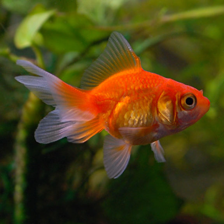

In [ ]:
gold_fish = Image.open('/content/drive/MyDrive/MD/Learning is Learning/pictures/goldfish.jpg').resize(IMAGE_SHAPE)
gold_fish

In [ ]:
gold_fish = np.array(gold_fish)/255.0
gold_fish.shape

(224, 224, 3)

In [ ]:
gold_fish[np.newaxis, ...].shape

(1, 224, 224, 3)

In [ ]:
result = classifier.predict(gold_fish[np.newaxis, ...])

1/1 [==============================] - 0s 25ms/step


In [ ]:
result.shape

(1, 1001)

In [ ]:
predict_label_index = np.argmax(result)
predict_label_index # the class label 2 is goldfish in

2

In [ ]:
with open('/content/drive/MyDrive/MD/Learning is Learning/pictures/ImageNetLabels.txt') as f:
  labels = f.read().splitlines()
labels[:5] # goldfish is 2

['background', 'tench', 'goldfish', 'great white shark', 'tiger shark']

In [ ]:
labels[predict_label_index]

'goldfish'

Flowers dataset

In [ ]:
dataset_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"
data_dir = tf.keras.utils.get_file('flower_photos', origin=dataset_url,  cache_dir='.', untar=True)

228813984/228813984 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [ ]:
import pathlib
data_dir = pathlib.Path(data_dir)
data_dir

PosixPath('datasets/flower_photos')

In [22]:
list(data_dir.glob('*/*.jpg'))[:5]

[PosixPath('datasets/flower_photos/roses/4061451210_1650590c6a.jpg'),
 PosixPath('datasets/flower_photos/roses/8642943283_47e44d049d_m.jpg'),
 PosixPath('datasets/flower_photos/roses/16149016979_23ef42b642_m.jpg'),
 PosixPath('datasets/flower_photos/roses/19988406792_68201f76e3_n.jpg'),
 PosixPath('datasets/flower_photos/roses/410425647_4586667858.jpg')]

In [23]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

3670


In [24]:
roses = list(data_dir.glob('roses/*'))
roses[:5]

[PosixPath('datasets/flower_photos/roses/4061451210_1650590c6a.jpg'),
 PosixPath('datasets/flower_photos/roses/8642943283_47e44d049d_m.jpg'),
 PosixPath('datasets/flower_photos/roses/16149016979_23ef42b642_m.jpg'),
 PosixPath('datasets/flower_photos/roses/19988406792_68201f76e3_n.jpg'),
 PosixPath('datasets/flower_photos/roses/410425647_4586667858.jpg')]

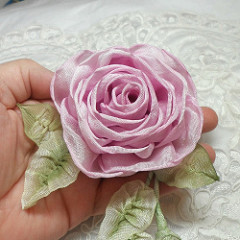

In [28]:
import PIL
PIL.Image.open(str(roses[1]))

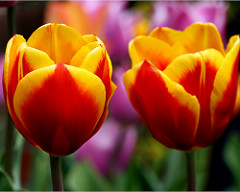

In [29]:
tulips = list(data_dir.glob('tulips/*'))
PIL.Image.open(str(tulips[0]))

In [30]:
flowers_images_dict = {
    'roses': list(data_dir.glob('roses/*')),
    'daisy': list(data_dir.glob('daisy/*')),
    'dandelion': list(data_dir.glob('dandelion/*')),
    'sunflowers': list(data_dir.glob('sunflowers/*')),
    'tulips': list(data_dir.glob('tulips/*')),
}

In [31]:
flowers_labels_dict = {
    'roses': 0,
    'daisy': 1,
    'dandelion': 2,
    'sunflowers': 3,
    'tulips': 4,
}

In [32]:
flowers_images_dict['roses'][:5]

[PosixPath('datasets/flower_photos/roses/4061451210_1650590c6a.jpg'),
 PosixPath('datasets/flower_photos/roses/8642943283_47e44d049d_m.jpg'),
 PosixPath('datasets/flower_photos/roses/16149016979_23ef42b642_m.jpg'),
 PosixPath('datasets/flower_photos/roses/19988406792_68201f76e3_n.jpg'),
 PosixPath('datasets/flower_photos/roses/410425647_4586667858.jpg')]

In [33]:
str(flowers_images_dict['roses'][0])

'datasets/flower_photos/roses/4061451210_1650590c6a.jpg'

In [34]:
img = cv2.imread(str(flowers_images_dict['roses'][0]))
img.shape

(333, 500, 3)

In [35]:
cv2.resize(img,(224,224)).shape

(224, 224, 3)

In [36]:
X, y = [], []

for flower_name, images in flowers_images_dict.items():
    for image in images:
        img = cv2.imread(str(image))
        resized_img = cv2.resize(img,(224,224))
        X.append(resized_img)
        y.append(flowers_labels_dict[flower_name])

In [37]:
X = np.array(X)
y = np.array(y)

In [38]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

In [39]:
X_train_scaled = X_train / 255
X_test_scaled = X_test / 255

In [40]:
X[0].shape

(224, 224, 3)

In [41]:
IMAGE_SHAPE+(3,)

(224, 224, 3)

In [46]:
x0_resized = cv2.resize(X[0], IMAGE_SHAPE)
x1_resized = cv2.resize(X[1], IMAGE_SHAPE)
x2_resized = cv2.resize(X[2], IMAGE_SHAPE)
x0_resized.shape, x1_resized.shape, x2_resized.shape

((224, 224, 3), (224, 224, 3), (224, 224, 3))

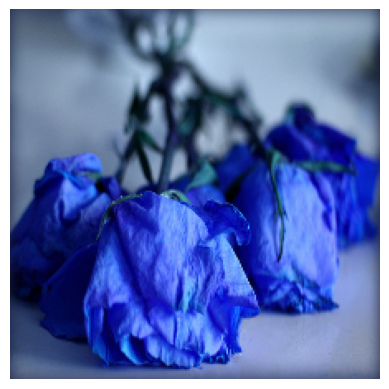

In [43]:
plt.axis('off')
plt.imshow(X[0])

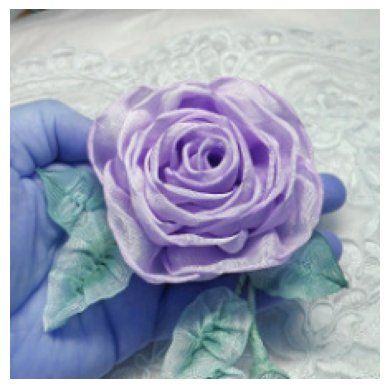

In [44]:
plt.axis('off')
plt.imshow(X[1])

In [49]:
predicted = classifier.predict(np.array([x0_resized,x1_resized,x2_resized]))

1/1 [==============================] - 0s 24ms/step


In [50]:
predicted = np.argmax(predicted, axis=1)
predicted

array([795, 722, 722])

In [51]:
labels[predicted[0]], labels[predicted[1]], labels[predicted[2]]

('shower curtain', 'pillow', 'pillow')

Use another model to extract the feature of the flowers

In [52]:
feature_extractor_model = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4"

pretrained_model_without_top_layer = hub.KerasLayer(
    feature_extractor_model, input_shape=(224, 224, 3), trainable=False)

In [55]:
num_of_flowers = 5

model = tf_keras.Sequential([
  pretrained_model_without_top_layer,
  tf_keras.layers.Dense(num_of_flowers)
])

model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_5 (KerasLayer)  (None, 1280)              2257984   
                                                                 
 dense (Dense)               (None, 5)                 6405      
                                                                 
Total params: 2264389 (8.64 MB)
Trainable params: 6405 (25.02 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


In [56]:
model.compile(
  optimizer="adam",
  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['acc'])

model.fit(X_train_scaled, y_train, epochs=5)

Epoch 1/5
86/86 [==============================] - 5s 14ms/step - loss: 0.7625 - acc: 0.7188
Epoch 2/5
86/86 [==============================] - 1s 13ms/step - loss: 0.4001 - acc: 0.8605
Epoch 3/5
86/86 [==============================] - 1s 13ms/step - loss: 0.3109 - acc: 0.8961
Epoch 4/5
86/86 [==============================] - 1s 13ms/step - loss: 0.2596 - acc: 0.9150
Epoch 5/5
86/86 [==============================] - 1s 13ms/step - loss: 0.2233 - acc: 0.9328


In [57]:
model.evaluate(X_test_scaled,y_test)

29/29 [==============================] - 1s 14ms/step - loss: 0.3820 - acc: 0.8671


[0.3819946348667145, 0.8671023845672607]

In [76]:
predicted_1 = model.predict(X_test_scaled)

29/29 [==============================] - 1s 12ms/step


In [77]:
a = tf.nn.softmax(predicted_1[0])
b = tf.nn.softmax(predicted_1[1])
c = tf.nn.softmax(predicted_1[2])

In [78]:
np.argmax(a),np.argmax(b),np.argmax(c)

(1, 0, 2)

In [81]:
y_test[0],y_test[1],y_test[2]

(1, 0, 2)

## RNN


Dense layer -> Recurrent networks



> **RNN:**



*   Language model: predict the next word

  * hello -> world   
  * hello world -> !

*   Use MLP naively doesn't handle sequence info well:
  * each time using a simple fully connected layer to do a softmax regression and classify;
  * The problem is as we do the first prediction which is hello -> world is quite good, but at the second time we predicting world -> ! it does not see the previous word (no hello for this time)
  * If we add hello before world, the length will change (We know that the size of the fully connected layer cannot be changed)
  * The key problem is the time series are ignored

*  RNN:
  * hello -> world remains the same, we assume that the output from the previous fully connect layer has not go into Softmax yet, it may contains the info of hello, copy this value and concat this with world, and repeat this process for the next predictions.
  * The info of hello we called it Hidden status which it can be passed backward and no matter how many steps it goes, the length/size does not change, and it will contains all the info that has been gone through.




> **RNN and Gated RNN**

* Simple RNN:

  we assue the hidden status from previous layer is $h_{t-1}$ and current layer at time t will also product $h_t$ to next layer.

  $$ h_t = f(W_{hh} h_{t-1} + W_{hx}x_t + b_h)$$
  $$
  y_t = g(W_{yh}h_t + b_y)
  $$
  (For simple RNN.the output $y_t = h_t$)

  Where f and g are activation functions, $W_{hh},W_{hx},W_{yh}$ are weights and $b_h,b_y$ are bias terms
  * It differents from MLP is that it add one more thing which takes the output from previous time as the input and multiplied with a weight parameter





```
opt = Optimizer(params = (W_hh,W_hx,W_yh,b_h,b_y))
h[0]=0
l = 0
for t=1,...,T:
  h[t] = f(W_hh @ h[t-1] + W_hx @ x[t] + b_h)
  y[t] = g(W_yh @ h[t] + b_y)
  l += Loss(y[t],y_star[t])
l.backward()
opt.step()
opt.zero_grad()
```



In [ ]:
class RNNScratch(d2l.Module):
    def __init__(self, num_inputs, num_hiddens, sigma=0.01):
        super().__init__()
        self.save_hyperparameters()
        self.W_xh = nn.Parameter(
            torch.randn(num_inputs, num_hiddens) * sigma)
        self.W_hh = nn.Parameter(
            torch.randn(num_hiddens, num_hiddens) * sigma)
        self.b_h = nn.Parameter(torch.zeros(num_hiddens))

* Gated RNN(LSTM,GRU): finer control of information flow

  * Forget input: suppress $x_t$ when computing $h_t$

    (suppress something not that important,like .,\, or the a an)

  * Forget past: suppress $h_{t-1}$ when computing $h_t$
    (something that so far away from now)

* LSTM

Long short term memory cells are a particular form of hidden unit update that avoids the problem of vanilla RNNs

1. Divide the hidden unit into two components, called the hidden state and the cell state


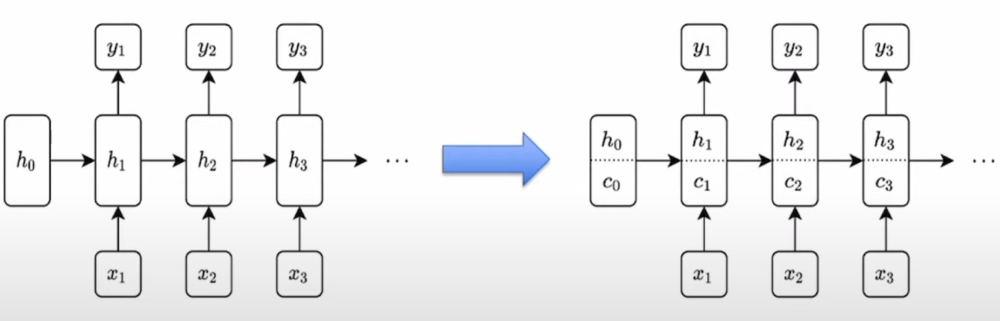

2. Use a very specific formula to update the hidden state and cell state

$$
\begin{bmatrix}
i_t \\
f_t \\
g_t \\
o_t
\end{bmatrix}
=
\begin{bmatrix}
sigmoid \\
sigmoid \\
\tanh \\
sigmoid
\end{bmatrix}
\left( W_{hh} h_{t-1} + W_{hx} x_t + b_h \right)
$$

$$
c_t = c_{t-1} \odot f_t + i_t \odot g_t
$$

$$
h_t = \tanh(c_t) \odot o_t
$$


Key points:
* We form $c_t$ by scaling down $c_{t-1}$(where $f_t$ is in $[0,1]^d$), then adding a term(where is in $[-1,1]^d$) to it

  (If $f_t$ is 0 it will ignore the previous states, otherwise will remember entirely past state)
* Importantly, "saturating" sigmoid activation for $f_t$ at 1 would just pass through $c_{t-1}$ untouched
* For a wider range of weights, LSTMs don not suffer vanishing gradients



> **Bi-RNN and Deep RNN**

* One direction -> Two directions

  Forward layer:
  put the info of previous moment to present

  Backward layer:
  put the info of t+1 to the direction of time t

  (Time t here is not the real time we understand, it is the word sequence in text)

  Combining the Forward and Backward layer as $y_t$

* Deep RNN

  Making multiple layers of RNN as MLP




> **Model Selection**




*   Tabular
  * Trees
  * Linear/MLP
*   Text/speech
  * RNNs
  * Transformers - which can deal with both timeseries info and spatial info
* Images/audio/video
  * CNNs
  * Transformers





> **Summary**

MLP:

A Multilayer Perceptron stacks multiple fully connected layers together, using activation layers to achieve a nonlinear model.

CNN (Convolutional Neural Network):

A Convolutional Neural Network can be seen as a specialized form of fully connected layers. The convolutional layers utilize spatial locality and translation invariance, simplifying the fully connected layers.

With fewer parameters, CNNs are better suited for processing image information. By stacking convolutional layers and pooling layers, an efficient model for capturing spatial information can be constructed.

RNN (Recurrent Neural Network):

A Recurrent Neural Network can be viewed as fully connected layers that incorporate past information into the present. By adding an extra edge to the fully connected layer, we obtain a recurrent neural network capable of processing data with temporal sequences.


In [ ]:
import torch
import torch.nn as nn
import numpy as np

In [ ]:
model = nn.LSTMCell(20,100)
print(model.weight_hh.shape)
print(model.weight_ih.shape)

torch.Size([400, 100])
torch.Size([400, 20])




> Single LSTM Cell



Applies a multi-layer long short-term memory (LSTM) RNN to an input sequence.

For each element in the input sequence, each layer computes the following function:

$$
i_t = \sigma(W_{ii} x_t + b_{ii} + W_{hi} h_{t-1} + b_{hi})
$$

$$
f_t = \sigma(W_{if} x_t + b_{if} + W_{hf} h_{t-1} + b_{hf})
$$

$$
g_t = \tanh(W_{ig} x_t + b_{ig} + W_{hg} h_{t-1} + b_{hg})
$$

$$
o_t = \sigma(W_{io} x_t + b_{io} + W_{ho} h_{t-1} + b_{ho})
$$

$$
c_t = f_t \odot c_{t-1} + i_t \odot g_t
$$

$$
h_t = o_t \odot \tanh(c_t)
$$


In [ ]:
def sigmoid(x):
  return 1/(1+np.exp(-x))

def lstm_cell(x,h,c,W_hh,W_ih,b):
  i,f,g,o = np.split(W_hh@h + W_ih@x + b, 4)
  i,f,g,o = sigmoid(i),sigmoid(f),np.tanh(g),sigmoid(o)
  c_out = f*c + i*g
  h_out = o*np.tanh(c_out)
  return h,c

In [ ]:
x = np.random.randn(1,20).astype(np.float32)
h_0 = np.random.randn(1,100).astype(np.float32)
c_0 = np.random.randn(1,100).astype(np.float32)

In [ ]:
h_, c_ = model(torch.tensor(x),(torch.tensor(h_0),torch.tensor(c_0)))

In [ ]:
h_.shape,c_.shape

(torch.Size([1, 100]), torch.Size([1, 100]))

In [ ]:
h,c = lstm_cell(x[0],h_0[0],c_0[0],model.weight_hh.detach().numpy(),model.weight_ih.detach().numpy(),(model.bias_hh+model.bias_ih).detach().numpy())



> Full sequence LSTM



In [ ]:
model = nn.LSTM(20,100,num_layers=1)

In [ ]:
X = np.random.randn(50,20).astype(np.float32)
h_0 = np.random.randn(1,100).astype(np.float32)
c_0 = np.random.randn(1,100).astype(np.float32)

In [ ]:
def lstm(X,h,c,w_hh,w_ih,b):
  H = np.zeros((X.shape[0],h.shape[0]))
  for t in range(X.shape[0]):
    h,c = lstm_cell(X[t],h,c,w_hh,w_ih,b)
    H[t] = h
  return H,c

In [ ]:
H,cn = lstm(X,h_0[0],c_0[0],model.weight_hh_l0.detach().numpy(),model.weight_ih_l0.detach().numpy(),(model.bias_hh_l0+model.bias_ih_l0).detach().numpy())

In [ ]:
H_,(hn_,cn_) = model(torch.tensor(X)[:,None,:],(torch.tensor(h_0)[:,None,:],torch.tensor(c_0)[:,None,:]))



> Train LSTMs



In [ ]:
opt = optim.SGD([W_hh,W_ih,b])

In [ ]:
def train_lstm(X,h0,c0,W_hh,W_ih,b,opt):
  H,cn = lstm(X,h0,c0,W_hh,W_ih,b)
  l = loss(H,Y)
  l.backward()
  opt.step()
  opt.zero_grad()

def train_deep_lstm(X,h0,c0,Y,W_hh,W_ih,b,opt):
  H = X
  depth = len(W_hh)
  for d in range(depth):
    H,cn = lstm(H,h0[d],c0[d],W_hh[d],W_ih[d],b[d])
    h0[d] = H[-1].detach().copy()
    c0[d] = cn.detach().copy()
  l = loss(H,Y)
  l.backward()
  opt.step()
  opt.zero_grad()

In [ ]:
h0,c0 = zeros(...)
for i in range(sequence_len // block_size):
  h0,c0 = train_deep_lstm(X[i*block_size:(i+1)*block_size],h0,c0,Y[i*block_size:(i+1)*block_size],W_hh,W_ih,b,opt)

NameError: name 'zeros' is not defined



---



## GAN



Unlike supervised classification setting, the "goal" is less obvious

To build effective training mechanism, we need to define a "distance" between generated and real datasets and use that to drive the training


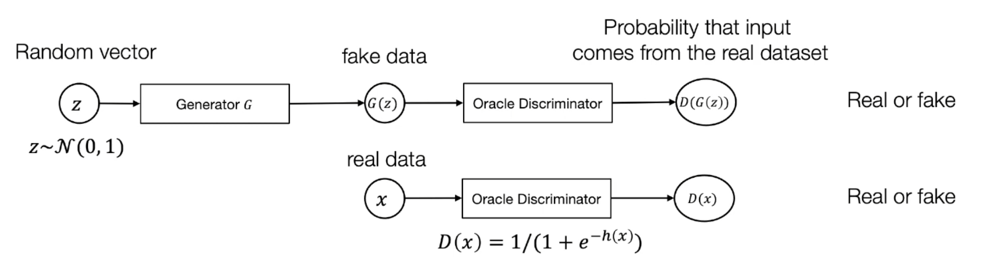

Assume that we have an oracle discriminator that can tell the difference between real and fake data. Then we need train the generator to "fool" the oracle discriminator. We need to maximize the discriminator loss:

$$
\text Generator\space objective: max_{G}
\{-E_{z～Noise} log(1-D(G(z)))\}
$$

Where $D(G(z))$ is the probability that $\hat{y}$ =1

We do not have an oracle discriminator, but we can learn it using the real and generated fake data

Discriminator Objective:
$$
min_{D}\{-E_{x～Data} log(D(x))-E_{z～Noise} log(1-D(G(z)))\}
$$

Putting it together, it becomes an "MinMax" game between D and G:

$$
min_{D}max_{G}\{-E_{x～Data} log(D(x))-E_{z～Noise} log(1-D(G(z)))\}
$$



Iterative process:
* Discriminator update
  * Sample minbatch of D(G(z))(generated fake data), get a minibatch of D(x) (real data)
  * Update D to minimize $min_{D}\{-E_{x～Data} log(D(x))-E_{z～Noise} log(1-D(G(z)))\}$
* Generator update
  * Sample minibatch of D(G(z))
  * Update G to minimize $max_{G}\{-E_{z～Noise} log(1-D(G(z)))\}$, this can be done by feeding label=1 to the model

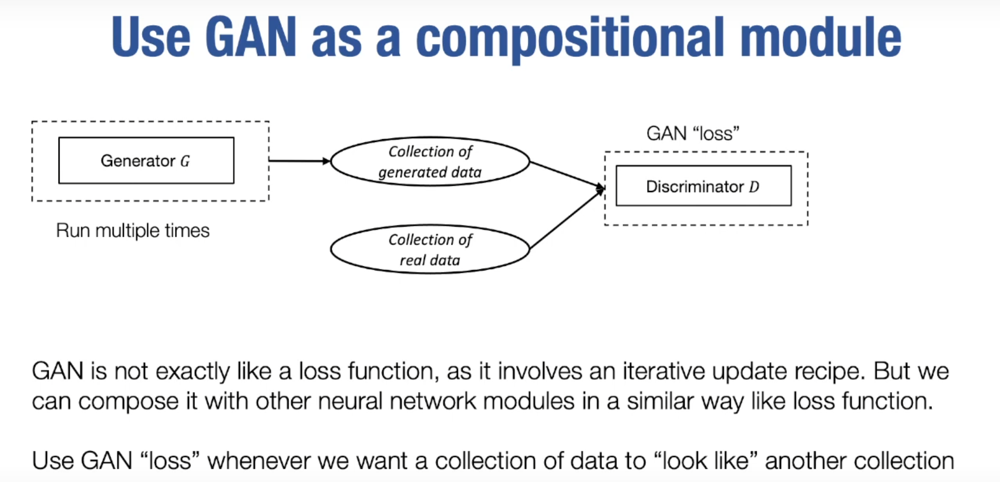

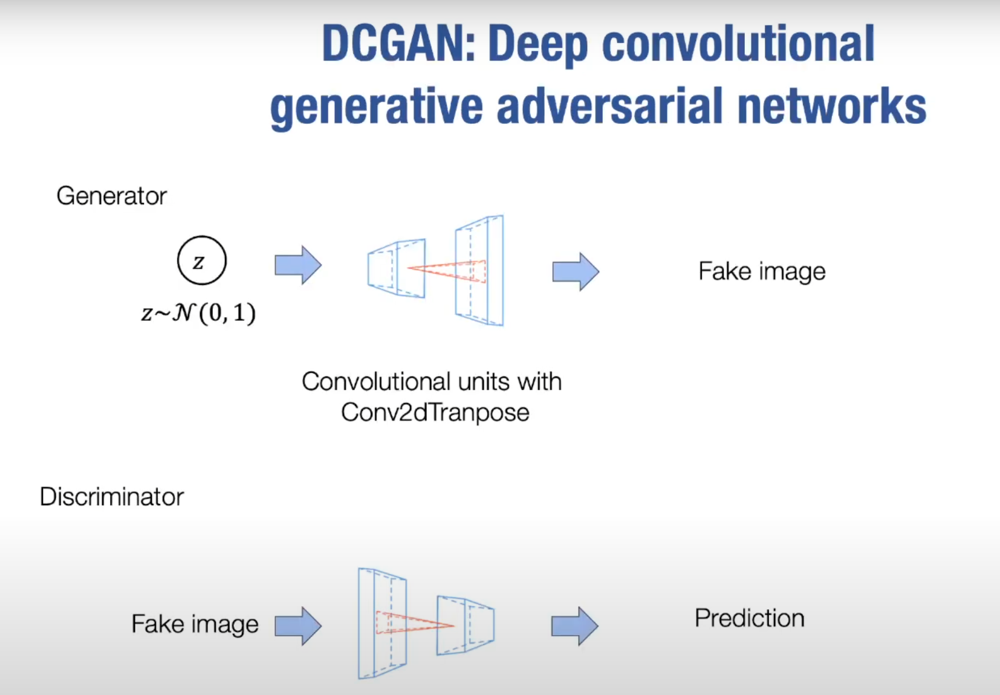

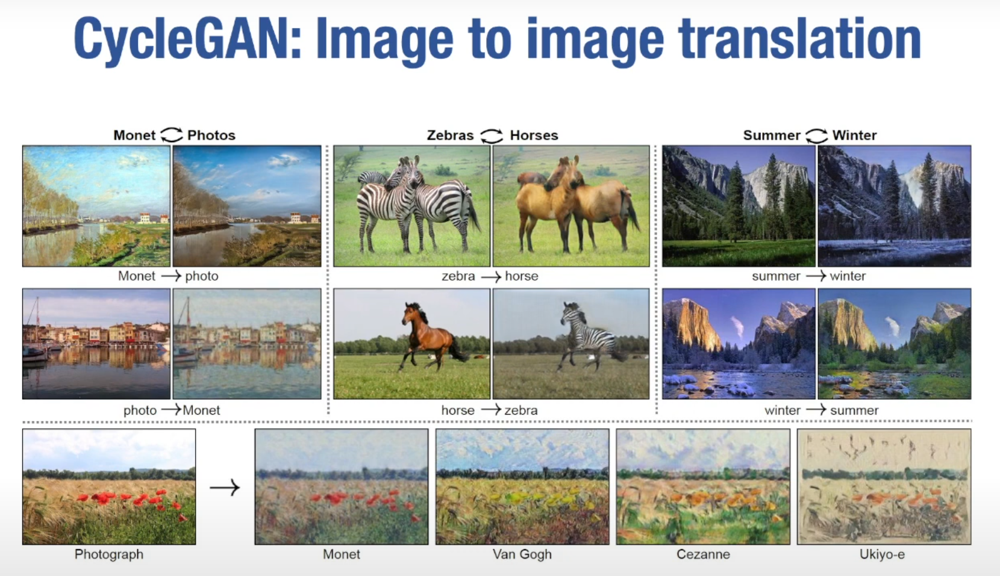

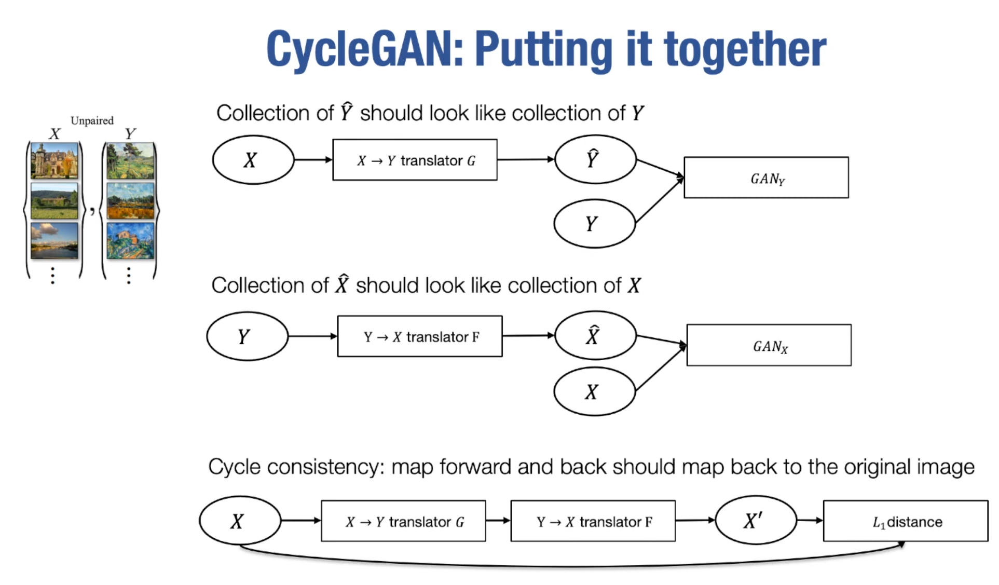

Generative Adversarial Networks introduce the idea of **game theory** which consist of two part:

1. Generator: generates fake data from random noise to decept discriminator
2. Discriminator: Discriminate the real data and the fake data generated

**Goal**
* As real as possible of the generated data
* Improve the ability of the discriminator to distinguish real and fake data

This two part adverse against each other to generate "real" data

## **NLP**

### Word Representation



* **One-hot representation**
  * e.g. A [1,0,0,...,0] orange [0,0,...,1,0,...,1]
  * Drawbacks:
    * e.g. I want a glass of orange _____ (juice)
    
         I want a glass of apple ______

         (It can fill the juice for one sentence, but can not related to the second one as a highly similar one as well)

         Inner product between are 0!


* **Word Embedding**

$$
\begin{array}{|c|c|c|c|c|c|c|}
\hline
 & \textbf{Man (5391)} & \textbf{Woman (9853)} & \textbf{King (4914)} & \textbf{Queen (7157)} & \textbf{Apple (456)} & \textbf{Orange (6257)} \\
\hline
\text{Gender} & -1 & 1 & -0.95 & 0.97 & 0.00 & 0.01 \\
\hline
\text{Royal} & 0.01 & 0.02 & 0.93 & 0.95 & -0.01 & 0.00 \\
\hline
\text{Age} & 0.03 & 0.02 & 0.70 & 0.69 & 0.03 & -0.02 \\
\hline
\text{Food} & 0.04 & 0.01 & 0.02 & 0.01 & 0.95 & 0.97 \\
\hline
\end{array}
$$

Where the vector for Man could be: [-1,0.01,0.03,0.04,...]

You can find that Apple and Orange has similar vector. Allow algorithm to generalizing more across.


    

  * How can we do Man -> Woman as King ->?
  
  $e_{man} - e_{woman} = [-2,0,0,0]$

  $e_{king} - e_{queen} = [-2,0,0,0]$

  So the algorithms is to find
  $e_{man} - e_{woman} ≈ e_{King} - e_{?}$

  make this equation stands

 **To be generalize:**

  Find word w which
  $$
  argmax \ sim(e_{w},e_{King}-e_{man}+e_{woman})
  $$

  Where $sim(e_{w},e_{King}-e_{man}+e_{woman})$ os callled **Cosine similarity**

  $$
  \text{sim}(\mathbf{u}, \mathbf{v}) = \frac{\mathbf{u}^T \mathbf{v}}{\|\mathbf{u}\|_2 \|\mathbf{v}\|_2}
  $$
  Which indicates the similarity (Inner product) between each vector

  It can be able to do this:

  Man:Woman as Boy:Girl

  Big:Bigger as Tall:Taller

In [1]:
import numpy as np
from tensorflow.keras.preprocessing.text import one_hot
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Flatten,Embedding

In [2]:
reviews = [
    'nice food',
    'amazing restaurant',
    'too good',
    'just loved it!',
    'will go again',
    'horrible food',
    'never go there',
    'poor service',
    'poor equality',
    'needs improvement'
]

sentiment = np.array([1,1,1,1,1,0,0,0,0,0])

In [7]:
one_hot('amazing restaurant',30)

[27, 18]

In [20]:
vocab_size = 50

encoded_reviews = [one_hot(d,vocab_size) for d in reviews]
encoded_reviews

[[39, 29],
 [18, 1],
 [36, 4],
 [34, 38, 29],
 [17, 43, 5],
 [40, 29],
 [8, 43, 47],
 [40, 31],
 [40, 32],
 [5, 15]]

In [21]:
max_length=3

padded_reviews = pad_sequences(encoded_reviews,maxlen=max_length,padding='post')
padded_reviews

array([[39, 29,  0],
       [18,  1,  0],
       [36,  4,  0],
       [34, 38, 29],
       [17, 43,  5],
       [40, 29,  0],
       [ 8, 43, 47],
       [40, 31,  0],
       [40, 32,  0],
       [ 5, 15,  0]], dtype=int32)

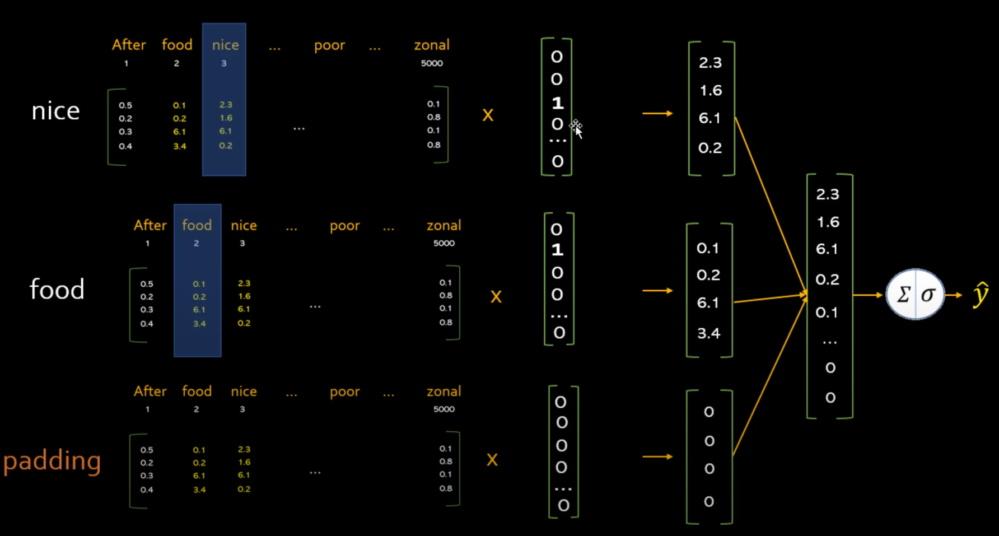

In [22]:
embeded_vector_size = 5

model = Sequential()
model.add(Embedding(vocab_size,embeded_vector_size,input_length=max_length,name='embedding'))
model.add(Flatten())
model.add(Dense(1,activation='sigmoid'))

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


In [23]:
X = padded_reviews
y = sentiment

In [24]:
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])
model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ embedding (Embedding)                │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ ?                           │     0 (unbuilt) │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

In [25]:
model.fit(X,y,epochs=50,verbose=0)

In [26]:
loss,accuracy = model.evaluate(X,y)
accuracy

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step - accuracy: 1.0000 - loss: 0.5904


1.0

In [27]:
weights = model.get_layer('embedding').get_weights()[0]

In [30]:
weights[39] # nice

array([ 0.06270808,  0.05802705,  0.0380394 , -0.09941413,  0.08441348],
      dtype=float32)

In [29]:
weights[18] #amazing

array([ 0.00439606,  0.05456872,  0.02484024, -0.04673329,  0.09086044],
      dtype=float32)

 * **Embedding matrix**

Say we having a matrix with $ 300 × 10,000$ which 10,000 stands for the dictionary as previou, we call the matrix as $E$

And we still having a vector $ 10,000 × 1$ stands for the words vector in dictonary as $o$

We have $$ E * o_{j} = e_{j} $$
Where $e_{j}$ stands for the embedding for word j

It finds the j column in E as $e_{j}$




Example:

I want a glass of orange juice to go along with my cereal.

Target -> juice

Context:
  
  * Last 4 words
  * 4 words on left & right
  * Last 1 word
  * Nearby 1 word (e.g. glass)

Use these context to fit the network

* **Word2Vec**

  1. ***CBOW***

    I want a glass of orange juice to go along with my cereal.

    Context: randomly choose (e.g. orange)

    Target: randomly choose (e.g. juice/glass/my)
  
  * Model

    Vocab size = 10,000k
      
    Context c ('orange') → Target t ('juice')

  $$o_{c} → E → e_{c} → Softmax → y_{hat}$$

  $$ Softmax: p(t \mid c) = \frac{e^{\Theta_t^T e_c}}{\sum_{j=1}^{10,000} e^{\Theta_j^T e_c}}$$

  2. ***Skip-grams***

  Target t ('juice') → Context c ('orange')

  * Optimizing methods

    1. Hierarchical Softmax

      Using Huffman tree to transform the prob of vocab into path prob, which reducing complexity
    2. Negative Sampling

      e.g. choosing k negative samples and 1 positive sample for each iteration where having 10,000 samples

      So,not training 10,000 softmax but training 10,000 binary classification

      much easier

| context | word | | target |
| --- | --- | --- | --- |
|orange| juice| → | 1|
|orange| king| → |0|
|orange| book| → |0|
|orange| the| → |0|
|orange| of| → |0|

  




In [31]:
import gensim
import pandas as pd

In [32]:
df = pd.read_json("Cell_Phones_and_Accessories_5.json", lines=True)
df

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime
0,A30TL5EWN6DFXT,120401325X,christina,"[0, 0]",They look good and stick good! I just don't li...,4,Looks Good,1400630400,"05 21, 2014"
1,ASY55RVNIL0UD,120401325X,emily l.,"[0, 0]",These stickers work like the review says they ...,5,Really great product.,1389657600,"01 14, 2014"
2,A2TMXE2AFO7ONB,120401325X,Erica,"[0, 0]",These are awesome and make my phone look so st...,5,LOVE LOVE LOVE,1403740800,"06 26, 2014"
3,AWJ0WZQYMYFQ4,120401325X,JM,"[4, 4]",Item arrived in great time and was in perfect ...,4,Cute!,1382313600,"10 21, 2013"
4,ATX7CZYFXI1KW,120401325X,patrice m rogoza,"[2, 3]","awesome! stays on, and looks great. can be use...",5,leopard home button sticker for iphone 4s,1359849600,"02 3, 2013"
...,...,...,...,...,...,...,...,...,...
194434,A1YMNTFLNDYQ1F,B00LORXVUE,eyeused2loveher,"[0, 0]",Works great just like my original one. I reall...,5,This works just perfect!,1405900800,"07 21, 2014"
194435,A15TX8B2L8B20S,B00LORXVUE,Jon Davidson,"[0, 0]",Great product. Great packaging. High quality a...,5,Great replacement cable. Apple certified,1405900800,"07 21, 2014"
194436,A3JI7QRZO1QG8X,B00LORXVUE,Joyce M. Davidson,"[0, 0]","This is a great cable, just as good as the mor...",5,Real quality,1405900800,"07 21, 2014"
194437,A1NHB2VC68YQNM,B00LORXVUE,Nurse Farrugia,"[0, 0]",I really like it becasue it works well with my...,5,I really like it becasue it works well with my...,1405814400,"07 20, 2014"


In [33]:
df.shape

(194439, 9)

In [34]:
df.reviewText[0]

"They look good and stick good! I just don't like the rounded shape because I was always bumping it and Siri kept popping up and it was irritating. I just won't buy a product like this again"

In [35]:
gensim.utils.simple_preprocess("They look good and stick good! I just don't like the rounded shape because I was always bumping it and Siri kept popping up and it was irritating. I just won't buy a product like this again")

['they',
 'look',
 'good',
 'and',
 'stick',
 'good',
 'just',
 'don',
 'like',
 'the',
 'rounded',
 'shape',
 'because',
 'was',
 'always',
 'bumping',
 'it',
 'and',
 'siri',
 'kept',
 'popping',
 'up',
 'and',
 'it',
 'was',
 'irritating',
 'just',
 'won',
 'buy',
 'product',
 'like',
 'this',
 'again']

In [37]:
review_text = df.reviewText.apply(gensim.utils.simple_preprocess)

In [38]:
review_text

,reviewText
0,"[they, look, good, and, stick, good, just, don..."
1,"[these, stickers, work, like, the, review, say..."
2,"[these, are, awesome, and, make, my, phone, lo..."
3,"[item, arrived, in, great, time, and, was, in,..."
4,"[awesome, stays, on, and, looks, great, can, b..."
...,...
194434,"[works, great, just, like, my, original, one, ..."
194435,"[great, product, great, packaging, high, quali..."
194436,"[this, is, great, cable, just, as, good, as, t..."
194437,"[really, like, it, becasue, it, works, well, w..."


In [42]:
model_w2v = gensim.models.Word2Vec(
    window=10,
    min_count=2,
    workers=4
)

In [43]:
model_w2v.build_vocab(review_text,progress_per=1000)

In [45]:
model_w2v.train(review_text,total_examples=model_w2v.corpus_count,epochs=model_w2v.epochs)

(61505800, 83868975)

In [46]:
model_w2v.wv.most_similar("bad")

[('terrible', 0.6798882484436035),
 ('shabby', 0.6253989934921265),
 ('horrible', 0.6220245957374573),
 ('good', 0.5922727584838867),
 ('awful', 0.5583803653717041),
 ('legit', 0.5490954518318176),
 ('poor', 0.5427694320678711),
 ('okay', 0.5309754610061646),
 ('crappy', 0.5307101607322693),
 ('cheap', 0.5183085799217224)]

In [47]:
model_w2v.wv.similarity(w1="cheap",w2="inexpensive")

0.53293544



---



In [ ]:
from gensim.models import Word2Vec
from nltk.tokenize import word_tokenize
import nltk

# 下载punkt分词器
nltk.download('punkt')

# 示例语料库
corpus = [
    "The quick brown fox jumps over the lazy dog",
    "I love natural language processing",
    "Word embeddings are useful for many NLP tasks",
    "Deep learning models like Skip-Gram can capture semantic relationships"
]

# 预处理：分词
tokenized_corpus = [word_tokenize(sentence.lower()) for sentence in corpus]

# 训练Skip-Gram模型
model = Word2Vec(
    sentences=tokenized_corpus,
    vector_size=100,      # 词向量维度
    window=5,            # 上下文窗口大小
    min_count=1,         # 忽略词频小于min_count的词
    sg=1,                # 1表示使用Skip-Gram，0表示使用CBOW
    workers=4,           # 并行训练的线程数
    epochs=100           # 训练轮次
)

# 保存模型
model.save("skipgram.model")


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
# 加载模型
model = Word2Vec.load("skipgram.model")

# 查看词向量
word = 'language'
print(f"Vector for '{word}':\n{model.wv[word]}")

# 查找最相似的词
similar_words = model.wv.most_similar('language', topn=3)
print(f"Words similar to 'language':\n{similar_words}")

# 示例输出：
# Vector for 'language':
# [ 0.001234, -0.003456, ..., 0.005678]
# Words similar to 'language':
# [('processing', 0.75), ('natural', 0.68), ('nlp', 0.65)]


Vector for 'language':
[ 9.8801060e-03 -9.6670920e-03 -6.4146211e-03  2.8701804e-03
  6.4254925e-03 -5.5526290e-03  2.9798164e-03  9.5452825e-03
 -7.0695411e-03 -6.3052336e-03 -4.9735452e-03 -3.9229244e-03
  1.9871243e-03  9.9378154e-03  6.1701294e-03  4.6555526e-04
  3.0019854e-03  8.4347595e-03  8.9260107e-03  4.9663689e-03
  6.0459916e-03 -7.5409417e-03 -3.6721067e-03 -5.7232538e-03
  5.9844526e-03 -2.2344952e-03 -9.1131544e-03  7.6688048e-03
  8.4595131e-03 -3.2669392e-03  9.4447890e-03 -7.7056675e-04
 -3.5707715e-03 -6.2064524e-04  6.1344675e-05 -3.3624917e-03
  3.1047193e-03  5.6194994e-03  6.7424257e-03 -9.0883560e-03
 -2.1696454e-03 -5.6600114e-03  7.5755753e-03  6.5631997e-03
 -4.2815432e-03  2.1952465e-03 -6.3060503e-03 -6.6722678e-05
  9.6492665e-03 -2.4762207e-03 -5.2380734e-03 -7.5361263e-03
 -3.1039254e-03 -8.6830172e-04  3.5292567e-03  9.6875820e-03
 -3.2374281e-03  1.8596309e-03  9.6539054e-03  1.7225654e-03
  9.7851525e-04  9.5371511e-03  9.6040331e-03  7.9391981e-03
 

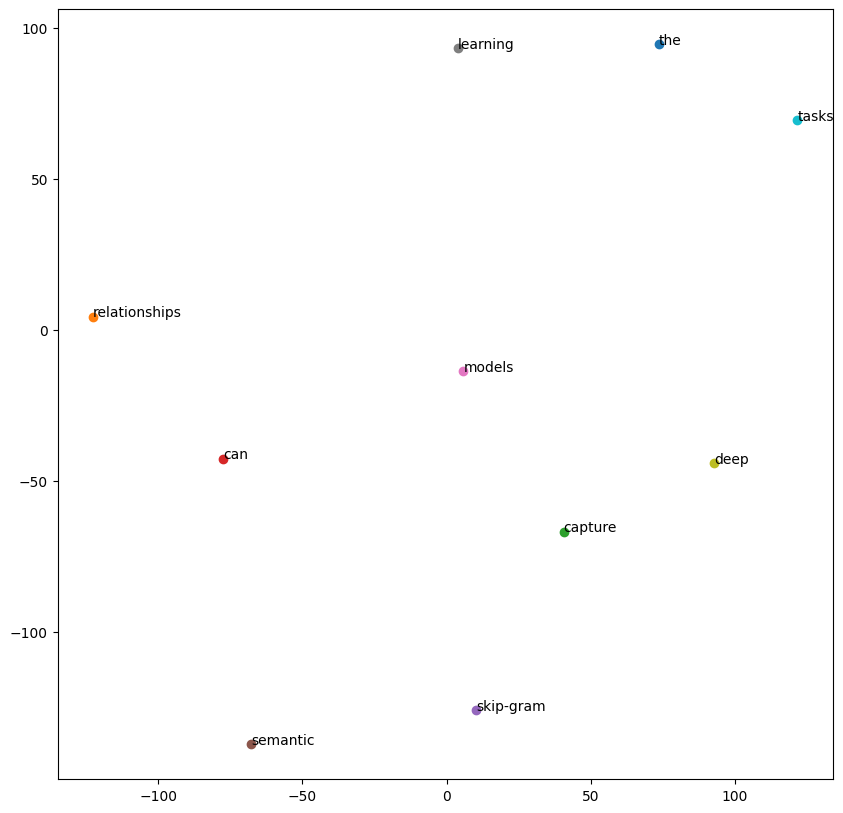

In [ ]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import numpy as np

# 选择要可视化的词
words = list(model.wv.key_to_index)[:10]
word_vectors = [model.wv[word] for word in words]

# 将word_vectors转换为NumPy数组
word_vectors = np.array(word_vectors)

# 使用TSNE降维到2D, perplexity must be less than n_samples (10 in this case)
tsne = TSNE(n_components=2, random_state=0, perplexity=5)  # Set perplexity to 5 (or any value less than 10)
vectors_2d = tsne.fit_transform(word_vectors)

# 绘制
plt.figure(figsize=(10, 10))
for i, word in enumerate(words):
    plt.scatter(vectors_2d[i, 0], vectors_2d[i, 1])
    plt.annotate(word, (vectors_2d[i, 0], vectors_2d[i, 1]))
plt.show()

In [ ]:
from gensim.models import FastText

# 训练FastText模型
model_fasttext = FastText(
    sentences=tokenized_corpus,
    vector_size=100,
    window=5,
    min_count=1,
    sg=1,                # 1表示使用Skip-Gram，0表示使用CBOW
    workers=4,
    epochs=100
)

# 使用FastText模型
print(model_fasttext.wv['processing'])


[ 3.8572837e-04  1.3786202e-03 -4.3526999e-04  1.2539362e-03
 -8.2170696e-04  1.4919915e-03  2.2881695e-05 -6.4493698e-04
 -7.7514257e-04 -1.3275971e-04 -1.1873065e-03  2.1409310e-04
  4.2927777e-04  9.4857119e-04  1.5766923e-03  1.2522015e-04
 -1.0234058e-03 -1.4421707e-03  5.1298260e-04  1.8525419e-04
 -6.6466513e-04 -1.0018293e-03 -5.8132474e-04 -1.1076253e-03
 -1.2336150e-03 -2.5353272e-04  5.9524662e-04 -2.1565366e-04
  7.5983058e-05 -7.0437253e-04 -1.0003507e-04  1.2723466e-04
 -2.0872602e-04  4.1122310e-04 -5.0093420e-04 -2.9690724e-04
 -8.1927795e-04  7.4355351e-04 -9.9327974e-04  6.4171979e-04
  8.6167239e-04  4.0379982e-04  8.6398510e-04 -6.3562248e-04
 -3.2188627e-04  6.1052089e-04 -8.4870687e-04  7.2093256e-04
 -1.7028303e-03  1.3656162e-03 -1.1688734e-03  2.5885776e-03
 -3.0099871e-04  1.1424809e-03  8.6471642e-04  1.7183828e-04
 -2.6556914e-04 -8.5209077e-04 -1.1422228e-03  1.9399355e-04
 -8.8026427e-04  5.2683586e-06 -7.4509054e-04 -9.0863425e-05
 -6.4064504e-04 -1.41422

In [ ]:
from gensim.models import KeyedVectors

# 假设已下载预训练的GloVe向量，并转换为Word2Vec格式
glove_file = 'glove.6B.100d.word2vec.txt'
model_glove = KeyedVectors.load_word2vec_format(glove_file, binary=False)

# 使用GloVe模型
print(model_glove.most_similar('language', topn=3))


In [ ]:
from transformers import BertTokenizer, BertModel
import torch

# 加载预训练的BERT模型和分词器
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')

# 编码输入文本
text = "Word2Vec is a popular word embedding technique."
inputs = tokenizer(text, return_tensors='pt')
outputs = model(**inputs)

# 获取词向量
word_embeddings = outputs.last_hidden_state
print(word_embeddings)


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

tensor([[[-0.2855, -0.3601, -0.2277,  ..., -0.3643, -0.2726,  0.7437],
         [ 0.0966, -0.1130, -0.1615,  ...,  0.0595,  0.5692,  0.4135],
         [ 0.6692, -0.8633,  0.2151,  ..., -0.5832,  0.1434,  0.4623],
         ...,
         [-0.2463,  0.4414, -0.3071,  ..., -0.5961, -0.6300,  0.3650],
         [ 0.7539,  0.2308, -0.5596,  ...,  0.1531, -0.4734, -0.1925],
         [ 0.0329,  0.1627, -0.1322,  ...,  0.5867, -0.6499, -0.2572]]],
       grad_fn=<NativeLayerNormBackward0>)




> **Sentiment classification**

| x | y |
| --- | --- |
|The dessert is excellent | ⋆⋆⋆⋆|
|Service quite good| ⋆⋆|
|Hppd fpr a quick meal, but nothing special| ⋆⋆⋆|
|Completely lacking in good taste| ⋆|

* Simple Model:

  *The dessert is excellent*

  Using embedding matrix:

  The → $e_{8928}$

  dessert → $e_{2469}$

  is → $e_{4694}$

  excellent → $e_{3180}$

  Averaging these
  
  $e_{8928} e_{2469} e_{4694} e_{3180} → Softmax → y_{hat} $


### Attention

Recall the RNN structure previously:

"Attention" in deep networks generally refers to any mechanism where individual states are weighted and then combined
(Where RNN only refers the last state)
$$
    z_t = \theta^T h_t^(k)
$$

$$
    w = softmax(z)
$$

$$
    \bar{h} = \sum_{t=1}^{T} w_t h_t^{(k)}
$$
Used originally in RNNs when one wanted to combine latent states over all times in a more general manner than "just" looking at the last state



> Self-Attention

Self-Attention is a mechanism that allows a neural network to weigh the importance of different elements within a sequence when computing representations. It's a fundamental component of the Transformer architecture, which has revolutionized fields like natural language processing and sequence modeling by enabling models to capture long-range dependencies more effectively.

Self-Attention refers to a particular form of attention mechanism

Given three inputs K,Q,V $\in \mathbb{R}^{T \times d}$ ("keys","queries","values", in one of the least-meaningful semantic designations we have in deep learning)

$$
K = \begin{bmatrix}
   \dots \mathbf{k}_1^T \dots\\
   \dots \mathbf{k}_2^T \dots\\
     \vdots \\
   \dots \mathbf{k}_T^T \dots
\end{bmatrix}
$$

$$
Q = \begin{bmatrix}
   \dots \mathbf{q}_1^T \dots\\
   \dots \mathbf{q}_2^T \dots\\
     \vdots \\
   \dots \mathbf{q}_T^T \dots
\end{bmatrix}
$$

$$
V = \begin{bmatrix}
   \dots \mathbf{v}_1^T \dots\\
   \dots \mathbf{v}_2^T \dots\\
     \vdots \\
   \dots \mathbf{v}_T^T \dots
\end{bmatrix}
$$

$$
X = \begin{bmatrix}
   \dots \mathbf{x}_1^T \dots\\
   \dots \mathbf{x}_2^T \dots\\
     \vdots \\
   \dots \mathbf{x}_T^T \dots
\end{bmatrix}
$$

$$
K = Xw_k
Q = Xw_q
V = Xw_v
$$


We define the self attention operation as

$$
SelfAttention(K,Q,V)= softmax(\frac{K Q^T}{\sqrt{d}})V
$$


$$
KQ^T = \begin{bmatrix}
   \dots \mathbf{k}_1^T q_j \dots\\
   \dots \mathbf{k}_2^T q_j\dots\\
     \vdots \\
   \dots \mathbf{k}_T^T q_j \dots
\end{bmatrix}
$$
1. $k_i^{T} q_j$

  Which is a T × T matrics computes *the similarity between K term and the J term* in some extent

  (This captures how much attention the model should pay to each position in the sequence when processing a particular element)

2. $softmax(K Q^T)$

  Then, softmax is apllied rowwise, which also a T × T matrics

  (This converts the scores into probabilities, highlighting the relative importance of each key for a given query)

3. $softmax(\frac{K Q^T}{\sqrt{d}})V$

  Finally, it becomes a T × d matrics with multiply with V

  (This means each output element at position i incorporates information from all positions in the sequence, weighted by their relevance to position i)

**So**

The each row of SelfAttention results is a linear combination of all the rows of v, in other words, it mixing together elements of different point of time

The self-attention mechanism allows the model to integrate information from all positions in the sequence for each output position.

This is particularly powerful for capturing dependencies regardless of their distance in the sequence

**Properties:**

* Invariant (really, equivariant) to permutatuons of K,Q,V matrices
  * If you shuffle the input sequence, the output sequence will shuffle correspondingly.
  * This property allows the model to focus on the content rather than the position.
* Allows influence between $k_t,q_t,v_t$ over all times
  * Each position in the output can attend to all positions in the input sequence.
  * This enables the model to capture long-range dependencies efficiently
* Compute cost is $O(T^2 + Td)$ (cannot be easily reduce due to nonlinearity applied to full T × T matrix)
  * The computation involves matrix multiplications and applying the softmax function over a T × T matrix.
  * The computational cost is O(T²d) due to the T × T attention matrix and subsequent operations.
  * This quadratic complexity can be a bottleneck for very long sequences.

### Transformers

The Transformer architecture builds upon the self-attention mechanism to handle sequence-to-sequence tasks efficiently

$$
Z^(i+1) = Transformer(Z^{(i)})
$$

All time steps are processed in **parallel**, avoids the need for sequential processing as in RNNs

**Layer Structure**
$$
\bar{z_1}=SelfAttention(z^{(i)}w_k,z^{(i)}w_q,z^{(i)}w_v)
$$
$$
   =softmax(\frac{z^{(i)}w_kw_q^Tz^{(i)}}{\sqrt{d}})z^{{i}}w_v
$$
$$
\bar{z_2} = LayerNorm(z^{(i)}+\bar{z_1})
$$

$$
z^{(i+1)} = LayerNorm(\bar{z_2}+ReLu(\bar{z_2}w_1)w_2)
$$

1. Multi-Head Self-Attention Layer
2. Position-Wise Feed-Forward Network (FFN)

  a linear layer + ReLu
  $$ FFN(x)=ReLu(xW_1+b_1)W_2+b_2$$
3. Residual Connections and Layer Normalization:
  * **Residual (skip) connections** are added around the sublayers to facilitate gradient flow.
  * **Layer normalization** is applied to stabilize training

Pros:
* Full receptive field within a single layer
* Mixing over time does not increase parameter count

Cons:
* All outputs depend on all inputs
* No ordering of data

**How can we deal with the cons:**



> Masked Self-Attention

To solve the problem of 'acausal' dependencies, we can mask the softmax operator to assign zero weight to any 'future' time step

**Masked self-attention** is a variant of the self-attention mechanism that restricts the attention scope to prevent a position in a sequence from attending to subsequent positions. It is designed to ensure that the model's predictions for a given position t depend only on the known outputs at positions < t

$$
softmax(\frac{K Q^T}{\sqrt{d}}-M)V
$$
Where M is an upper triangular matrix where positions corresponding to future tokens are set to negative infinity (or a large negative number)

$$
M = \begin{bmatrix}
0 & -\infty & -\infty & -\infty \\
0 & 0 & -\infty & -\infty \\
0 & 0 & 0 & -\infty \\
0 & 0 & 0 & 0
\end{bmatrix}
$$

After applying the softmax function, these positions effectively receive zero attention weight:
$$
A = \begin{bmatrix}
A_{11} & 0 & 0 & 0 \\
A_{21} & A_{22} & 0 & 0 \\
A_{31} & A_{32} & A_{33} & 0 \\
A_{41} & A_{42} & A_{43} & A_{44}
\end{bmatrix}
$$

Use masked self-attention to ensure that when predicting the token at position
𝑡, the model only attends to positions ≤𝑡

> Postional encodings

To solve the problem of "order invariance", we can add a postional encoding to the input,which associates each input with its position in the sequence

Since the model does not inherently consider the order of the sequence (due to the lack of recurrence or convolution), positional encoding is added to input embeddings

$$
X \in \mathbb{R}^n =
\begin{bmatrix}
x_1^T \\
x_2^T \\
\vdots \\
x_T^T
\end{bmatrix}
+
\begin{bmatrix}
\sin(\omega_1 \cdot 1) & \sin(\omega_2 \cdot 1) & \cdots \\
\sin(\omega_1 \cdot 2) & \sin(\omega_2 \cdot 2) & \cdots \\
\vdots & \vdots & \ddots \\
\sin(\omega_1 \cdot T) & \sin(\omega_2 \cdot T) & \cdots
\end{bmatrix}
$$

Format for multihead:
$$
SelfAttention(K,Q,V)= (softmax(\frac{K Q^T}{\sqrt{d}})V)w_{out}
$$

In [ ]:
import numpy as np
import torch
import torch.nn as nn

In [ ]:
def softmax(z):
  z = np.exp(z-z.max(axis=-1,keepdims=True))
  return z / z.sum(axis=-1,keepdims=True)

def self_attention(X,mask,w_kqv,w_out):
  K,Q,V = np.split(X@w_kqv,3,axis=1)
  A = softmax(K@Q.T/np.sqrt(X.shape[1])+mask)
  return A@V@w_out,A

In [ ]:
T,d = 100, 64
at = nn.MultiheadAttention(d,1,bias=False,batch_first=True)
M = torch.triu(-float("inf")*torch.ones(T,T),diagonal=1)
X = torch.randn(1,T,d)
Y_, A_ = at(X, X, X, attn_mask=M)

In [ ]:
X[0].shape

torch.Size([100, 64])

In [ ]:
M

tensor([[0., -inf, -inf,  ..., -inf, -inf, -inf],
        [0., 0., -inf,  ..., -inf, -inf, -inf],
        [0., 0., 0.,  ..., -inf, -inf, -inf],
        ...,
        [0., 0., 0.,  ..., 0., -inf, -inf],
        [0., 0., 0.,  ..., 0., 0., -inf],
        [0., 0., 0.,  ..., 0., 0., 0.]])

In [ ]:
at.in_proj_weight.shape

torch.Size([192, 64])

In [ ]:
Y,A = self_attention(
    X[0].numpy(),M.numpy(),
    at.in_proj_weight.detach().numpy().T,
    # detach is used to create copies of weight tensor that detached from computational graph
    at.out_proj.weight.detach().numpy().T
    )

In [ ]:
np.linalg.norm(Y-Y_.detach().numpy())

1.5895502e-06


> Mini-batching



In [ ]:
# Mini-Batch

C = np.random.randn(5,4,10,3)
D = np.random.randn(3,6)
(C@D).shape

(5, 4, 10, 6)

In [ ]:
(C.reshape(-1,3)@D).reshape(5,4,10,6).shape

(5, 4, 10, 6)

In [ ]:
def self_attention(X,mask,w_kqv,w_out):
  K,Q,V = np.split(X@w_kqv,3,axis=-1)
  A = softmax(K@Q.swapaxes(-1,-2)/np.sqrt(X.shape[-1])+mask)
  return A@V@w_out,A

In [ ]:
B,T,d = 50, 100, 64
X = torch.randn(B,T,d)
M = torch.triu(-float("inf")*torch.ones(T,T),diagonal=1)
Y_, A_ = at(X,X,X,attn_mask=M)

In [ ]:
Y,A = self_attention(
    X.numpy(),M.numpy(),
    at.in_proj_weight.detach().numpy().T,
    # detach is used to create copies of weight tensor that detached from computational graph
    at.out_proj.weight.detach().numpy().T
    )

In [ ]:
np.linalg.norm(Y-Y_.detach().numpy())# checking the difference between our function to the library function

1.1854309e-05



> Multi-head Attention



Instead of computing a single attention function, the Transformer uses multiple attention "heads."

Each head learns to focus on different parts of the input representation space

For each attention head h = 1, ..., H:

$$
Q_h = X W_h^Q
$$
$$
K_h = X W_h^K
$$
$$
V_h = X W_h^V
$$
$$
\text{head}_h = \text{SelfAttention}(Q_h, K_h, V_h)
$$

Where each matrix of $Q,V,K  \in \mathbb{R}^{T \times d/h}$


$$
y = [head_1,head_2, …, head_n] w_{out}
$$

In [ ]:
def multihead_attention(X,mask,heads,w_kqv,w_out):
  B,T,d = X.shape
  K,Q,V = np.split(X@w_kqv,3,axis=-1)
  # B x T x d => B x heads x T x d/heads
  K,Q,V = [a.reshape(B,T,heads,d//heads).swapaxes(1,2) for a in [K,Q,V]]
  A = softmax(K@Q.swapaxes(-1,-2)/np.sqrt(d//heads)+mask)
  return (A@V).swapaxes(1,2).reshape(B,T,d)@w_out,A

In [ ]:
heads = 4
attn = nn.MultiheadAttention(d,heads,bias=False,batch_first=True)
Y_, A_ = attn(X,X,X,attn_mask=M)

In [ ]:
Y, A = multihead_attention(
    X.numpy(),M.numpy(),heads,
    attn.in_proj_weight.detach().numpy().T,
    attn.out_proj.weight.detach().numpy().T
)

In [ ]:
print(A.shape, A_.shape)

(50, 4, 100, 100) torch.Size([50, 100, 100])


In [ ]:
np.linalg.norm(A.mean(axis=1)-A_.detach().numpy())

1.0021265e-06

In [ ]:
np.linalg.norm(Y-Y_.detach().numpy()) # checking the difference between our function to the library function

1.1735307e-05



> Transformer block



In [ ]:
def layer_norm(z,eps):
  return (z-z.mean(axis=-1,keepdims=True))/np.sqrt(z.var(axis=-1,keepdims=True)+eps)
def relu(z):
  return np.maximum(z,0)
def transformer(X,mask,heads,w_kqv,w_out,w_ff1,w_ff2,eps):
  z = layer_norm(X + multihead_attention(X,mask,heads,w_kqv,w_out)[0],eps)
  return layer_norm(z + relu(z@w_ff1)@w_ff2,eps)

In [ ]:
trans = nn.TransformerEncoderLayer(d, heads, dim_feedforward=128, dropout=0.0, batch_first=True)
trans.linear1.bias.data.zero_()
trans.linear2.bias.data.zero_()
Y_ = trans(X,M)

In [ ]:
Y = transformer(
    X.numpy(),M.numpy(),heads,
    trans.self_attn.in_proj_weight.detach().numpy().T,
    trans.self_attn.out_proj.weight.detach().numpy().T,
    trans.linear1.weight.detach().numpy().T,
    trans.linear2.weight.detach().numpy().T,
    eps=trans.norm1.eps
)

In [ ]:
np.linalg.norm(Y-Y_.detach().numpy())

5.9749895e-05

## Neural Architecture Search (NAS)

* A neural network has different types of hyperparameters:
  * Topological structure: resnet-ish, mobilenet-ish, #layers
  * Individual layers: kernel_size, #channels in convolution layer, #hidden_outputs in dense/recurrent layers
* NAS automates the design of neural network
  * How to specify the search space of NN
  * How to explore the search space
  * Performance estimation



> **NAS with reinforce learning**

* Using RNN to generate the Hyperparameter
* Get the validation accuracy from trainning
* Reward/feedback the accuracy, reinforce learning

Quite expensive!

> **The One-shot Approach**

* Train a huge model contains all the models from the search space
* Evaluate the performance of child model, using some approximation figures to ranking



> **Differenciatable Architecture Search**

* The architecture is fixed, select the network for each layer
* Regard the selection as a learnable parameter, use softmax to learn the parameter for choosing the network for each layer





## Details steps in DL

### NN-implementation

In [ ]:
# Code to set up the assignment
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/
!mkdir -p 10714f24
%cd /content/drive/MyDrive/10714f24

# NOTE: Run the following line
# - uncomment the following line if you run this section for the first time
# - comment and skip the following line when you run this section for a second time
#   so you will have a local copy of lecture8 under 10714f24/lecture8 that you can
#   continue to edit and play with
# !git clone https://github.com/dlsyscourse/lecture8
%rm -rf /content/needle
!ln -s /content/drive/MyDrive/10714f24/lecture8 /content/needle
%cd /content/needle

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive
/content/drive/MyDrive/10714f24
fatal: destination path 'lecture8' already exists and is not an empty directory.
/content/drive/MyDrive/10714f24/lecture8


In [ ]:
%set_env PYTHONPATH /content/needle/python:/env/python
import sys
sys.path.append("/content/needle/python")

env: PYTHONPATH=/content/needle/python:/env/python


In [ ]:
import needle as ndl

In [ ]:
w = ndl.Tensor([1,2,3], dtype="float32")

In [ ]:
w

needle.Tensor([1. 2. 3.])

In [ ]:
g = ndl.Tensor([1,1,1], dtype="float32")

In [ ]:
w.requires_grad
#By default, we create needle Tensors that sets requires_grad to be true
#This will cause us to record the gradient graph by default

True

In [ ]:
# Let us run a sgd style update for a few steps
grad = ndl.Tensor([1,1,1], dtype="float32")
lr = 0.1
for i in range(5):
  w = w + (-lr)*grad

In [ ]:
w.op

In [ ]:
w.inputs[0].op

In [ ]:
w.inputs[0].inputs[0].op

The problem with is approach is that we are actively building up a computational graph that tracks the history of all the past updates. Such un-necessary graph tracking can cause memory and speed issues.

Instead, we can create a "detached" tensor that does not requires grad. When we are

In [ ]:
w.data

needle.Tensor([0.4999999 1.4999999 2.5000005])

In [ ]:
w.data.requires_grad

False

In [ ]:
new_w = w.data + (-lr) * grad.data

In [ ]:
new_w

needle.Tensor([0.39999992 1.3999999  2.4000006 ])

The reason we get the number of 0.39999992 is because of floating point number, by mean that it can not accuratly approximate the number of 0.4 in some cases

In [ ]:
new_w.requires_grad

False

In [ ]:
new_w.inputs

[]



> Numerical stability



Most computations in a deep learning model are executed using 32-bit floating point. We need to pay special attention to potential numerical problems. Softmax is one of the most commonly used operators in loss functions.
Let $z = softmax(x)$, then we have

\begin{equation}
 z_i = \frac{exp(x_i)}{\sum_k exp(x_k)}
\end{equation}

If we naively follow the formula to compute softmax, the result can be inaccurate.

In [ ]:
import numpy as np

In [ ]:
x = np.array([100, 100, 101], dtype="float32") # floating number explodes

def softmax_naive(x):
    z = np.exp(x)
    return z / np.sum(z)

p = softmax_naive(x)
p

<ipython-input-21-35eddb9a8ee0>:4: RuntimeWarning: overflow encountered in exp
  z = np.exp(x)
<ipython-input-21-35eddb9a8ee0>:5: RuntimeWarning: invalid value encountered in divide
  return z / np.sum(z)


array([nan, nan, nan], dtype=float32)

Passing a large number(that is greater than 0) to exp function can easily result in overflow. Note that the following invariance hold for any constant $c$

\begin{equation}
 z_i = \frac{exp(x_i)}{\sum_k exp(x_k)} = \frac{exp(x_i-c)}{\sum_k exp(x_k-c)}
\end{equation}

We can pick $c = max(x)$ so that all the inputs to the exp become smaller or equal to 0


In [ ]:
x = np.array([1000, 10000, 100], dtype="float32")
def softmax_stable(x):
    x = x - np.max(x)
    z = np.exp(x)
    return z / np.sum(z)

softmax_stable(x)

array([0., 1., 0.], dtype=float32)



> Designing a Neural Network Library





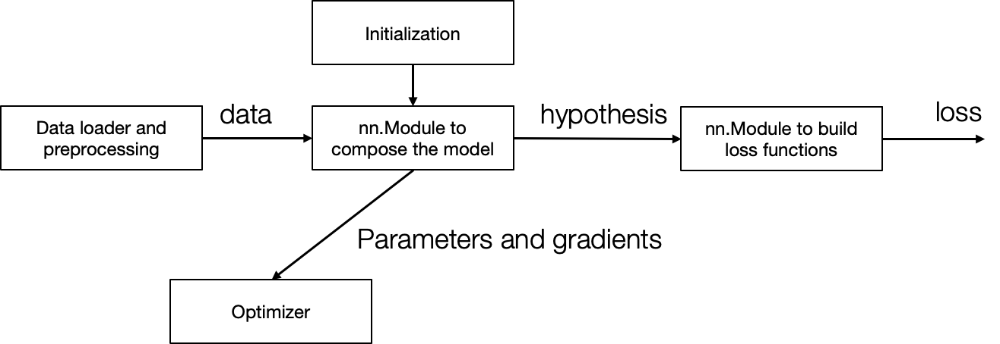

In [ ]:
class Parameter(ndl.Tensor):
    """parameter"""

In [ ]:
def _get_params(value):
    if isinstance(value, Parameter):
        return [value]
    if isinstance(value, dict):
        params = []
        for k, v in value.items():
            params += _get_params(v)
        return params
    if isinstance(value, Module):
        return value.parameters()
    return []

class Module:
    def parameters(self):
        return _get_params(self.__dict__)

    def __call__(self, *args, **kwargs):
        return self.forward(*args, **kwargs)

Now that we have the base Module interface, we can start to define different kind of modules. Let us define a simple scale add module, that computes $y = x \times s + b$. The ScaleAdd is parameterized by $s$ and $b$.

In [ ]:
class ScaleAdd(Module):
  def __init__(self,init_s=1,init_b=0):
    self.s = Parameter([init_s],dtype="float32")
    self.b = Parameter([init_b],dtype="float32")

  def forward(self,x):
    return self.s * x + self.b

In [ ]:
sadd = ScaleAdd()

In [ ]:
sadd.parameters()

# return a self.dict {'s':s,'b':b} to get_params and
# recursively return value

[needle.Tensor([1.]), needle.Tensor([0.])]

In [ ]:
sadd.parameters()[0] is sadd.s

True

In [ ]:
sadd.parameters()[1] is sadd.b

True

In [ ]:
sadd = ScaleAdd(2,1) # s = 2, b = 1

In [ ]:
sadd(ndl.Tensor([2],dtype="float32")) # 2*2 + 1 = 5

needle.Tensor([5.])

We allow a module to contain multiple submodules inside and compose them together

In [ ]:
class MultiPathScaleAdd(Module):
    def __init__(self):
        self.path0 = ScaleAdd()
        self.path1 = ScaleAdd()

    def forward(self, x):
        return self.path0(x) + self.path1(x)

In [ ]:
mpath = MultiPathScaleAdd()
mpath.parameters()

[needle.Tensor([1.]),
 needle.Tensor([0.]),
 needle.Tensor([1.]),
 needle.Tensor([0.])]



> Loss Function



In [ ]:
class L2Loss(Module):
    def forward(self, x ,y):
        z = x + (-1) * y
        return z * z

In [ ]:
x = ndl.Tensor([2], dtype="float32")
y = ndl.Tensor([2], dtype="float32")
loss = L2Loss()(mpath(x), y)

In [ ]:
loss.backward()



> Optimizer



In [ ]:
class Optimizer:
    def __init__(self, params):
        self.params = params

    def reset_grad(self):
        for p in self.params:
            p.grad = None

    def step(self):
        raise NotImplemented()

In [ ]:
class SGD(Optimizer):
    def __init__(self, params, lr):
        self.params = params
        self.lr = lr

    def step(self):
        for w in self.params:
            w.data = w.data + (-self.lr) * w.grad

In [ ]:
class SDGwithMomentum(Optimizer):
    def __init__(self, params, lr, momentum):
        self.params = params
        self.lr = lr
        self.momentum = momentum
        self.velocity = [ndl.zeros_like(p) for p in self.params]

In [ ]:
x = ndl.Tensor([2], dtype="float32")
y = ndl.Tensor([2], dtype="float32")

model = MultiPathScaleAdd()
l2loss = L2Loss()
opt = SGD(model.parameters(), lr=0.01)
num_epoch = 10

for epoch in range(num_epoch):
    opt.reset_grad()
    h = model(x)
    loss = l2loss(h, y)
    training_loss = loss.numpy()
    loss.backward()
    opt.step()

    print(training_loss)

### Practical cases



---


> **Handwritten Digits Classification (TensorFlow 2.0)**




In [ ]:
import tensorflow as tf
from tensorflow import keras
from matplotlib import pyplot as plt
%matplotlib inline
import numpy as np

In [ ]:
(X_train_full, y_train_full), (X_test, y_test) = keras.datasets.mnist.load_data()

In [ ]:
len(X_train_full)

60000

In [ ]:
X_train_full.shape #28*28 pictures with a number of 60000

(60000, 28, 28)

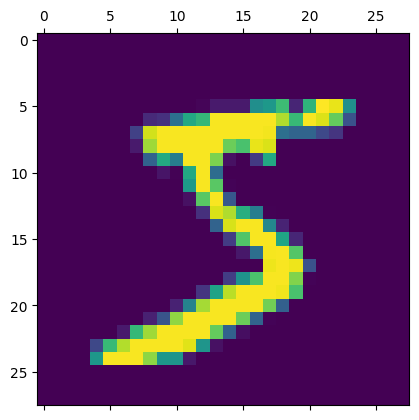

In [ ]:
plt.matshow(X_train_full[0])

In [ ]:
y_train_full[0]

5

In [ ]:
X_train_full = X_train_full / 255
X_test = X_test / 255

In [ ]:
X_train = X_train_full.reshape(60000,28*28)
X_test_1 = X_test.reshape(10000,28*28)
X_train.shape

(60000, 784)

In [ ]:
model = keras.Sequential([
    keras.layers.Dense(10, input_shape=(784,), activation='sigmoid')
])

model.compile(optimizer='SGD', # 'adam'
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])
model.fit(X_train, y_train_full, epochs=5)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.7133 - loss: 1.1413
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8745 - loss: 0.4827
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - accuracy: 0.8896 - loss: 0.4108
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8956 - loss: 0.3791
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8993 - loss: 0.3688


In [ ]:
model.evaluate(X_test_1,y_test)

313/313 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.9138 - loss: 0.3043


[0.27047088742256165, 0.9241999983787537]

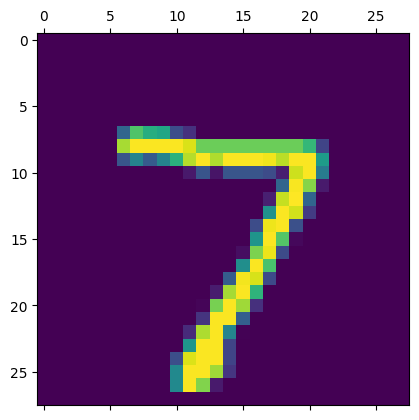

In [ ]:
plt.matshow(X_test[0])

In [ ]:
y_pred = model.predict(X_test_1)
y_pred[0]

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


array([2.33779997e-02, 2.78984402e-07, 5.43688163e-02, 9.60274994e-01,
       2.48849043e-03, 7.83490315e-02, 1.56693068e-06, 9.99771237e-01,
       1.03929356e-01, 5.51844954e-01], dtype=float32)

In [ ]:
np.argmax(y_pred[0]) #return the idex of the maximum prediction probability of the result which is the prediction of the digits

7

In [ ]:
y_test[0]

7

In [ ]:
cm = tf.math.confusion_matrix(labels = y_test, predictions = np.argmax(y_pred, axis=1))

Text(95.72222222222221, 0.5, 'Truth')

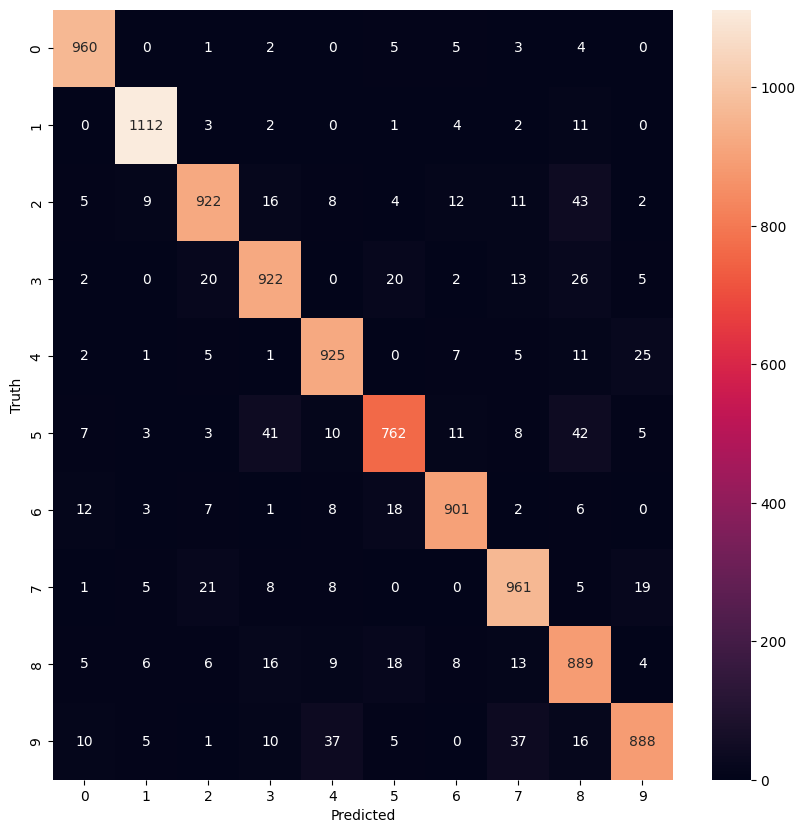

In [ ]:
import seaborn as sn
plt.figure(figsize = (10,10))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [ ]:
model = keras.Sequential([
    keras.layers.Dense(100, input_shape=(784,), activation='relu'),
    keras.layers.Dense(10, activation='sigmoid') # adding one more layer
])

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.fit(X_train, y_train_full, epochs=5)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 2ms/step - accuracy: 0.8714 - loss: 0.4595
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 2ms/step - accuracy: 0.9605 - loss: 0.1359
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.9744 - loss: 0.0873
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9800 - loss: 0.0661
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.9851 - loss: 0.0498


In [ ]:
model.evaluate(X_test_1,y_test)

313/313 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.9681 - loss: 0.0980


[0.08548332750797272, 0.9733999967575073]

In [ ]:
y_pred_1 = model.predict(X_test_1)

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


Text(95.72222222222221, 0.5, 'Truth')

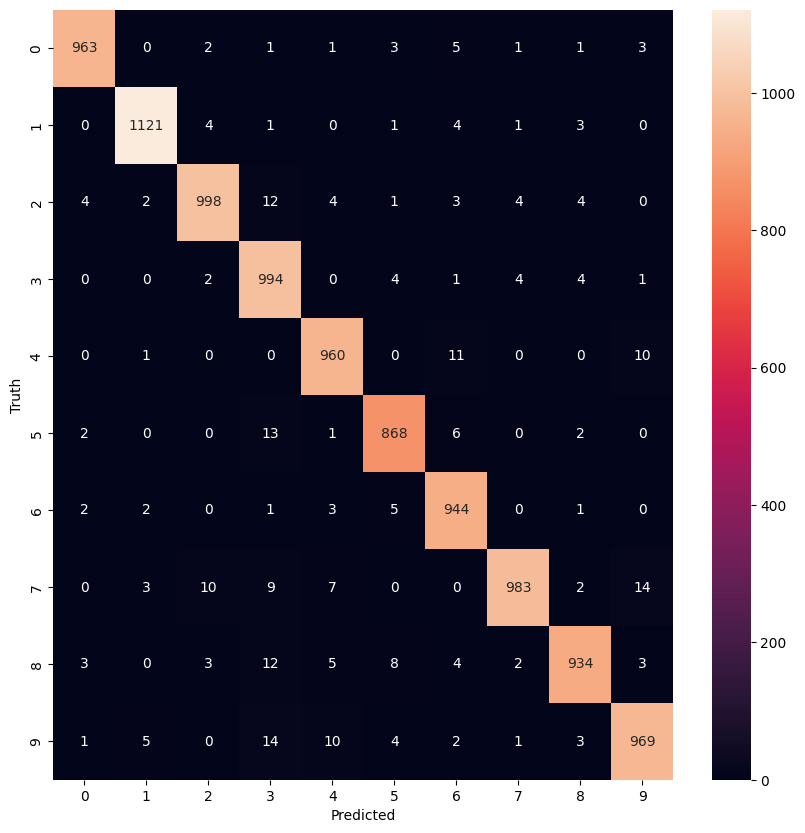

In [ ]:
cm_1 = tf.math.confusion_matrix(labels = y_test, predictions = np.argmax(y_pred_1, axis=1))
plt.figure(figsize = (10,10))
sn.heatmap(cm_1, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [ ]:
model = keras.Sequential([
    keras.layers.Flatten(input_shape=(28, 28)),
    keras.layers.Dense(100, activation='relu'),
    keras.layers.Dense(10, activation='sigmoid')
])

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.fit(X_train_full, y_train_full, epochs=5)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.8738 - loss: 0.4451
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9609 - loss: 0.1340
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.9728 - loss: 0.0906
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.9796 - loss: 0.0660
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9840 - loss: 0.0529


In [ ]:
model.evaluate(X_test,y_test)

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9698 - loss: 0.1048


[0.08996176719665527, 0.9736999869346619]

### Checking GPU


In [ ]:
import tensorflow as tf
from tensorflow import keras
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd

In [ ]:
tf.config.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [ ]:
tf.test.is_built_with_cuda()

True

In [ ]:
(X_train_full, y_train_full), (X_test, y_test) = keras.datasets.cifar10.load_data()

170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


In [ ]:
X_train_full.shape

(50000, 32, 32, 3)

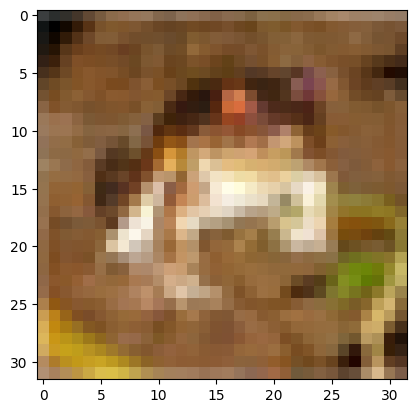

In [ ]:
plt.imshow(X_train_full[0])

In [ ]:
X_train_scaled = X_train_full / 255
X_test_scaled = X_test / 255

In [ ]:
y_train_full[0]

array([6], dtype=uint8)

In [ ]:
y_train_categorical = keras.utils.to_categorical(
    y_train_full, num_classes=10
)
y_test_categorical = keras.utils.to_categorical(
    y_test, num_classes=10
)

In [ ]:
model = keras.Sequential([
    keras.layers.Flatten(input_shape=(32,32,3)),# flatten into one dimension vector
    keras.layers.Dense(3000, activation='relu'),
    keras.layers.Dense(1000, activation='relu'),
    keras.layers.Dense(10, activation='sigmoid')
])

model.compile(optimizer='SGD',
              loss='categorical_crossentropy', # One-Hot
              metrics=['accuracy'])

model.fit(X_train_scaled, y_train_categorical, epochs=50)

Epoch 1/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.3033 - loss: 1.9315
Epoch 2/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.4204 - loss: 1.6394
Epoch 3/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.4511 - loss: 1.5534
Epoch 4/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.4762 - loss: 1.4861
Epoch 5/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.4914 - loss: 1.4464
Epoch 6/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.5092 - loss: 1.3947
Epoch 7/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.5232 - loss: 1.3600
Epoch 8/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.5425 - loss: 1.3149
Epoch 9/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.5491 - loss: 1.2864
Epoch 10/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.5579 - loss: 1.2577
Epoch 11/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.5695 - loss: 1.2237
Epoch 12/50
1563/1563 ━━━━━━━

In [ ]:
model.evaluate(X_test_scaled,y_test_categorical)

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.5541 - loss: 1.5931


[1.6012988090515137, 0.5508999824523926]

In [ ]:
classes = ["airplane","automobile","bird","cat","deer","dog","frog","horse","ship","truck"]

In [ ]:
classes[y_test[0][0]]

'cat'

In [ ]:
y_pred_0 = model.predict(X_test_scaled)[0]
np.argmax(y_pred_0)

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


3

In [ ]:
classes[np.argmax(y_pred_0)]

'cat'

In [ ]:
def get_model():
    model = keras.Sequential([
    keras.layers.Flatten(input_shape=(32,32,3)),# flatten into one dimension vector
    keras.layers.Dense(3000, activation='relu'),
    keras.layers.Dense(1000, activation='relu'),
    keras.layers.Dense(10, activation='sigmoid')
])

    model.compile(optimizer='SGD',
                  loss='categorical_crossentropy', # One-Hot
                  metrics=['accuracy'])
    return model


In [ ]:
import time

with tf.device('/CPU:0'):
  model = get_model()
  model.fit(X_train_scaled, y_train_categorical, epochs=1)
  time_cpu = time.time()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1563/1563 ━━━━━━━━━━━━━━━━━━━━ 141s 89ms/step - accuracy: 0.3040 - loss: 1.9362


In [ ]:
with tf.device('/GPU:0'):
  model = get_model()
  model.fit(X_train_scaled, y_train_categorical, epochs=1)
  time_gpu = time.time()

1563/1563 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.3036 - loss: 1.9319




---





> Distributed Training



In [48]:
import tensorflow as tf
from tensorflow import keras
import numpy as np

In [49]:
(X_train,y_train),(X_test,y_test) = tf.keras.datasets.cifar10.load_data()

170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [50]:
tf.config.experimental.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [51]:
classes = ["airplane","automobile","bird","cat","deer","dog","frog","horse","ship","truck"]

In [52]:
y_train[:5]

array([[6],
       [9],
       [9],
       [4],
       [1]], dtype=uint8)

In [53]:
X_train_scaled = X_train / 255
X_test_scaled = X_test / 255

In [55]:
y_train_categorical = keras.utils.to_categorical(
    y_train, num_classes=10,
)
y_test_categorical = keras.utils.to_categorical(
    y_test, num_classes=10,
)

In [56]:
def get_model():
    model = keras.Sequential([
    keras.layers.Flatten(input_shape=(32,32,3)),# flatten into one dimension vector
    keras.layers.Dense(3000, activation='relu'),
    keras.layers.Dense(1000, activation='relu'),
    keras.layers.Dense(10, activation='sigmoid')
])

    model.compile(optimizer='SGD',
                  loss='categorical_crossentropy', # One-Hot
                  metrics=['accuracy'])
    return model

In [57]:
train_tf_dataset = tf.data.Dataset.from_tensor_slices((X_train_scaled, y_train_categorical))
test_tf_dataset = tf.data.Dataset.from_tensor_slices((X_test_scaled, y_test_categorical))

In [58]:
type(train_tf_dataset)

tensorflow.python.data.ops.from_tensor_slices_op._TensorSliceDataset

In [59]:
strategy = tf.distribute.MirroredStrategy()

In [60]:
strategy.num_replicas_in_sync

1

In [61]:
BATCH_SIZE_PER_REPLICA = 250
BATCH_SIZE = BATCH_SIZE_PER_REPLICA * strategy.num_replicas_in_sync

In [62]:
train_dataset = train_tf_dataset.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
test_dataset = test_tf_dataset.batch(BATCH_SIZE)

In [64]:
%%timeit -n1 -r1
with strategy.scope():
  gpu_model = get_model()
  gpu_model.fit(train_dataset, epochs=50)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.2505 - loss: 2.0869
Epoch 2/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.3577 - loss: 1.8305
Epoch 3/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.3875 - loss: 1.7580
Epoch 4/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4070 - loss: 1.7108
Epoch 5/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4192 - loss: 1.6743
Epoch 6/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4301 - loss: 1.6440
Epoch 7/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4397 - loss: 1.6179
Epoch 8/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4481 - loss: 1.5947
Epoch 9/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4552 - loss: 1.5741
Epoch 10/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4607 - loss: 1.5555
Epoch 11/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4674 - loss: 1.5387
Epoch 12/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step



---
Exercise

In [ ]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
fashion_mnist = keras.datasets.fashion_mnist
(train_images, train_labels), (test_images, test_labels) = fashion_mnist.load_data()

29515/29515 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
26421880/26421880 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
5148/5148 ━━━━━━━━━━━━━━━━━━━━ 0s 1us/step
4422102/4422102 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

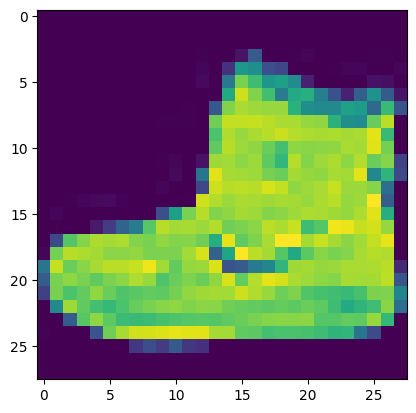

In [ ]:
plt.imshow(train_images[0])

In [ ]:
train_images.shape

(60000, 28, 28)

In [ ]:
train_images_scaled = train_images / 255.0
test_images_scaled = test_images / 255.0

In [ ]:
def get_model(hidden_layers=1):
    # Flatten layer for input
    layers = [keras.layers.Flatten(input_shape=(28, 28))]
    # hideen layers
    for i in range(hidden_layers):
        layers.append(keras.layers.Dense(500, activation='relu'),)
    # output layer
    layers.append(keras.layers.Dense(10, activation='sigmoid'))

    model = keras.Sequential(layers)

    model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    return model

In [ ]:
model = get_model(1)
model.fit(train_images_scaled, train_labels, epochs=5)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.7924 - loss: 0.5906
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - accuracy: 0.8674 - loss: 0.3626
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8825 - loss: 0.3269
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8917 - loss: 0.2942
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8932 - loss: 0.2837


In [ ]:
y_pred_2 = model.predict(test_images_scaled)[2]

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


In [ ]:
np.argmax(y_pred_2)

1

In [ ]:
test_labels[2]

1

In [ ]:
%%timeit -n1 -r1
with tf.device('/CPU:0'):
    model = get_model(1)
    model.fit(train_images_scaled, train_labels, epochs=5)

In [ ]:
%%timeit -n1 -r1
with tf.device('/GPU:0'):
    model = get_model(1)
    model.fit(train_images_scaled, train_labels, epochs=5)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.7919 - loss: 0.5925
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.8643 - loss: 0.3729
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8818 - loss: 0.3221
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8890 - loss: 0.2987
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - accuracy: 0.8955 - loss: 0.2792
30.8 s ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


In [ ]:
%%timeit -n1 -r1
with tf.device('/CPU:0'):
    model = get_model(5)
    model.fit(train_images_scaled, train_labels, epochs=5)

In [ ]:
%%timeit -n1 -r1
with tf.device('/GPU:0'):
    model = get_model(5)
    model.fit(train_images_scaled, train_labels, epochs=5)

Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - accuracy: 0.7703 - loss: 0.6305
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8557 - loss: 0.4008
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8723 - loss: 0.3609
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.8815 - loss: 0.3233
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 2ms/step - accuracy: 0.8907 - loss: 0.3015
32.8 s ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


### Customer churn prediction


In [ ]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
%matplotlib inline

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/MD/Learning is Learning/customer_churn.csv')
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [ ]:
df.drop('customerID',axis='columns',inplace=True)

In [ ]:
df.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [ ]:
df.TotalCharges.values

array(['29.85', '1889.5', '108.15', ..., '346.45', '306.6', '6844.5'],
      dtype=object)

In [ ]:
df.MonthlyCharges.values

array([ 29.85,  56.95,  53.85, ...,  29.6 ,  74.4 , 105.65])

In [ ]:
pd.to_numeric(df.TotalCharges)

ValueError: Unable to parse string " " at position 488

In [ ]:
pd.to_numeric(df.TotalCharges, errors='coerce').isnull()

,TotalCharges
0,False
1,False
2,False
3,False
4,False
...,...
7038,False
7039,False
7040,False
7041,False


In [ ]:
df[pd.to_numeric(df.TotalCharges, errors='coerce').isnull()]

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
488,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,No,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,,No
753,Male,0,No,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,,No
936,Female,0,Yes,Yes,0,Yes,No,DSL,Yes,Yes,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,,No
1082,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,,No
1340,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,Yes,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,,No
3331,Male,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,,No
3826,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,,No
4380,Female,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,,No
5218,Male,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,,No
6670,Female,0,Yes,Yes,0,Yes,Yes,DSL,No,Yes,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,,No


In [ ]:
df[pd.to_numeric(df.TotalCharges, errors='coerce').isnull()].shape

(11, 20)

In [ ]:
df.shape

(7043, 20)

In [ ]:
df.iloc[488].TotalCharges

' '

In [ ]:
df1 = df[df.TotalCharges!=' ']
df1.shape

(7032, 20)

In [ ]:
pd.to_numeric(df1.TotalCharges)

,TotalCharges
0,29.85
1,1889.50
2,108.15
3,1840.75
4,151.65
...,...
7038,1990.50
7039,7362.90
7040,346.45
7041,306.60


In [ ]:
df1.TotalCharges = pd.to_numeric(df1.TotalCharges)

<ipython-input-15-b67e0c3d31a6>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1.TotalCharges = pd.to_numeric(df1.TotalCharges)


In [ ]:
df1.TotalCharges.dtypes # now we change object to float

dtype('float64')

In [ ]:
df1[df1.Churn == 'No'].tenure

,tenure
0,1
1,34
3,45
6,22
7,10
...,...
7037,72
7038,24
7039,72
7040,11


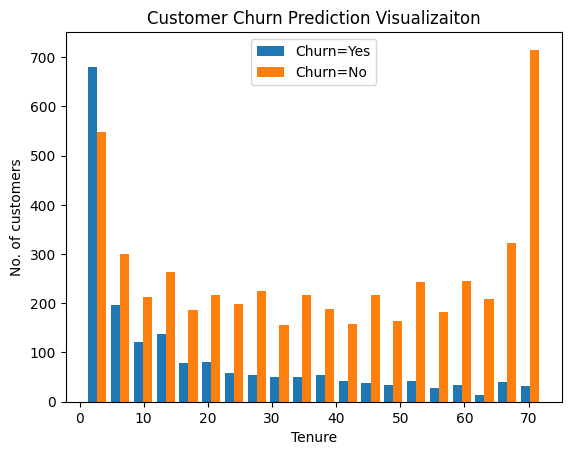

In [ ]:
tenure_churn_no = df1[df1.Churn == 'No'].tenure
tenure_churn_yes = df1[df1.Churn == 'Yes'].tenure

plt.hist([tenure_churn_yes, tenure_churn_no], bins=20, label=['Churn=Yes', 'Churn=No'])
plt.xlabel('Tenure')
plt.ylabel('No. of customers')
plt.title('Customer Churn Prediction Visualizaiton')
plt.legend()

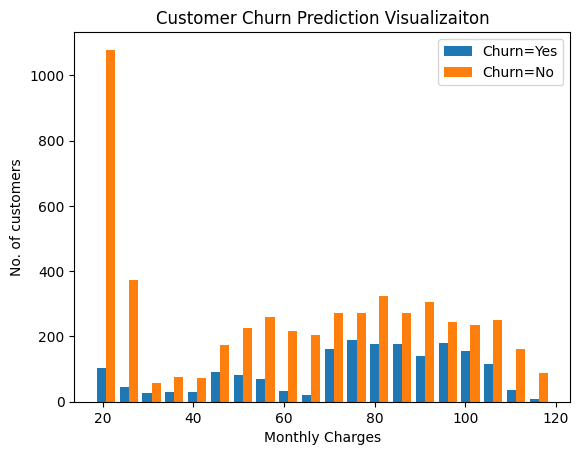

In [ ]:
mc_churn_no = df1[df1.Churn == 'No'].MonthlyCharges
mc_churn_yes = df1[df1.Churn == 'Yes'].MonthlyCharges

plt.hist([mc_churn_yes, mc_churn_no], bins=20, label=['Churn=Yes', 'Churn=No'])
plt.xlabel('Monthly Charges')
plt.ylabel('No. of customers')
plt.title('Customer Churn Prediction Visualizaiton')
plt.legend()

In [ ]:
def print_unique_col_values(df):
  for column in df:
    if df[column].dtypes=='object':
      print(f'{column}: {df[column].unique()}')

In [ ]:
print_unique_col_values(df1)

gender: ['Female' 'Male']
Partner: ['Yes' 'No']
Dependents: ['No' 'Yes']
PhoneService: ['No' 'Yes']
MultipleLines: ['No phone service' 'No' 'Yes']
InternetService: ['DSL' 'Fiber optic' 'No']
OnlineSecurity: ['No' 'Yes' 'No internet service']
OnlineBackup: ['Yes' 'No' 'No internet service']
DeviceProtection: ['No' 'Yes' 'No internet service']
TechSupport: ['No' 'Yes' 'No internet service']
StreamingTV: ['No' 'Yes' 'No internet service']
StreamingMovies: ['No' 'Yes' 'No internet service']
Contract: ['Month-to-month' 'One year' 'Two year']
PaperlessBilling: ['Yes' 'No']
PaymentMethod: ['Electronic check' 'Mailed check' 'Bank transfer (automatic)'
 'Credit card (automatic)']
Churn: ['No' 'Yes']


In [ ]:
# we would like to replace no phone service or no internet service in no
df1.replace('No internet service','No',inplace=True)
df1.replace('No phone service','No',inplace=True)

<ipython-input-21-1a56dff89029>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1.replace('No internet service','No',inplace=True)
<ipython-input-21-1a56dff89029>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1.replace('No phone service','No',inplace=True)


In [ ]:
print_unique_col_values(df1)

gender: ['Female' 'Male']
Partner: ['Yes' 'No']
Dependents: ['No' 'Yes']
PhoneService: ['No' 'Yes']
MultipleLines: ['No' 'Yes']
InternetService: ['DSL' 'Fiber optic' 'No']
OnlineSecurity: ['No' 'Yes']
OnlineBackup: ['Yes' 'No']
DeviceProtection: ['No' 'Yes']
TechSupport: ['No' 'Yes']
StreamingTV: ['No' 'Yes']
StreamingMovies: ['No' 'Yes']
Contract: ['Month-to-month' 'One year' 'Two year']
PaperlessBilling: ['Yes' 'No']
PaymentMethod: ['Electronic check' 'Mailed check' 'Bank transfer (automatic)'
 'Credit card (automatic)']
Churn: ['No' 'Yes']


In [ ]:
# Label Encoding from yes no to 1 0
yes_no_columns = ['Partner','Dependents','PhoneService','MultipleLines','OnlineSecurity','OnlineBackup',
                  'DeviceProtection','TechSupport','StreamingTV','StreamingMovies','PaperlessBilling','Churn']

for col in yes_no_columns:
  df1[col].replace({'Yes': 1,'No': 0},inplace=True)

<ipython-input-22-cd6c88a1d70a>:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df1[col].replace({'Yes': 1,'No': 0},inplace=True)
<ipython-input-22-cd6c88a1d70a>:6: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df1[col].replace({'Yes': 1,'No': 0},inplace=True)
<ipython-input-22-cd6c88a1d70a>:6: Set

In [ ]:
for column in df1:
    print(f'{column}: {df1[column].unique()}')

gender: ['Female' 'Male']
SeniorCitizen: [0 1]
Partner: [1 0]
Dependents: [0 1]
tenure: [ 1 34  2 45  8 22 10 28 62 13 16 58 49 25 69 52 71 21 12 30 47 72 17 27
  5 46 11 70 63 43 15 60 18 66  9  3 31 50 64 56  7 42 35 48 29 65 38 68
 32 55 37 36 41  6  4 33 67 23 57 61 14 20 53 40 59 24 44 19 54 51 26 39]
PhoneService: [0 1]
MultipleLines: [0 1]
InternetService: ['DSL' 'Fiber optic' 'No']
OnlineSecurity: [0 1]
OnlineBackup: [1 0]
DeviceProtection: [0 1]
TechSupport: [0 1]
StreamingTV: [0 1]
StreamingMovies: [0 1]
Contract: ['Month-to-month' 'One year' 'Two year']
PaperlessBilling: [1 0]
PaymentMethod: ['Electronic check' 'Mailed check' 'Bank transfer (automatic)'
 'Credit card (automatic)']
MonthlyCharges: [29.85 56.95 53.85 ... 63.1  44.2  78.7 ]
TotalCharges: [  29.85 1889.5   108.15 ...  346.45  306.6  6844.5 ]
Churn: [0 1]


In [ ]:
df1['gender'].replace({'Female':1,'Male':0},inplace=True)

<ipython-input-24-ba153b6b6960>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df1['gender'].replace({'Female':1,'Male':0},inplace=True)
<ipython-input-24-ba153b6b6960>:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df1['gender'].replace({'Female':1,'Male':0},inplace=True)
<ipython-input-24-ba15

In [ ]:
# One hot encoding
df2 = pd.get_dummies(data=df1, columns=['InternetService','Contract','PaymentMethod']).astype(float)

In [ ]:
df2.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,OnlineSecurity,OnlineBackup,DeviceProtection,...,InternetService_DSL,InternetService_Fiber optic,InternetService_No,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,0.0,0.0,34.0,1.0,0.0,1.0,0.0,1.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
2,0.0,0.0,0.0,0.0,2.0,1.0,0.0,1.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,0.0,0.0,0.0,45.0,0.0,0.0,1.0,0.0,1.0,...,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
4,1.0,0.0,0.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [ ]:
df2.dtypes

,0
gender,float64
SeniorCitizen,float64
Partner,float64
Dependents,float64
tenure,float64
PhoneService,float64
MultipleLines,float64
OnlineSecurity,float64
OnlineBackup,float64
DeviceProtection,float64


In [ ]:
# Scaling
cols_to_scale = ['tenure','MonthlyCharges','TotalCharges']

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df2[cols_to_scale] = scaler.fit_transform(df2[cols_to_scale])

In [ ]:
df2.sample(3)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,OnlineSecurity,OnlineBackup,DeviceProtection,...,InternetService_DSL,InternetService_Fiber optic,InternetService_No,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
5351,1.0,0.0,0.0,0.0,0.154930,1.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
4054,1.0,1.0,0.0,0.0,0.464789,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1346,1.0,0.0,1.0,1.0,0.183099,1.0,1.0,0.0,0.0,1.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [ ]:
X = df2.drop('Churn',axis='columns')
y = df2['Churn']

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=5)

In [ ]:
X_train.shape

(5625, 26)

In [ ]:
X_test.shape

(1407, 26)

In [ ]:
import tensorflow as tf
from tensorflow import keras

model = keras.Sequential([
    keras.layers.Dense(26, input_dim=26, activation='relu'),
    keras.layers.Dense(15, activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')
])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model.compile(optimizer='adam',
      loss='binary_crossentropy',
      metrics=['accuracy'])

model.fit(X_train, y_train, epochs=10)

Epoch 1/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - accuracy: 0.6648 - loss: 0.5954
Epoch 2/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7914 - loss: 0.4345
Epoch 3/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8013 - loss: 0.4213
Epoch 4/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7990 - loss: 0.4176
Epoch 5/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7993 - loss: 0.4197
Epoch 6/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8035 - loss: 0.4079
Epoch 7/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8078 - loss: 0.4075
Epoch 8/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.8111 - loss: 0.3937
Epoch 9/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8160 - loss: 0.4012
Epoch 10/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8101 - loss: 0.4093


In [ ]:
model.evaluate(X_test, y_test)

44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - accuracy: 0.8005 - loss: 0.4320


[0.4445377290248871, 0.7860696315765381]

In [ ]:
yp = model.predict(X_test)
yp[:5]

44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step


array([[0.15581493],
       [0.33941177],
       [0.01328598],
       [0.7682587 ],
       [0.42632648]], dtype=float32)

In [ ]:
y_test[:5]

,Churn
2660,0.0
744,0.0
5579,1.0
64,1.0
3287,1.0


In [ ]:
y_pred = []
for element in yp:
  if element > 0.5:
    y_pred.append(1)
  else:
    y_pred.append(0)

In [ ]:
y_pred[:10]

[0, 0, 0, 1, 1, 1, 0, 1, 0, 0]

In [ ]:
y_test[:10]

,Churn
2660,0.0
744,0.0
5579,1.0
64,1.0
3287,1.0
816,1.0
2670,0.0
5920,0.0
1023,0.0
6087,0.0


In [ ]:
from sklearn.metrics import confusion_matrix , classification_report

print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

         0.0       0.83      0.89      0.86       999
         1.0       0.67      0.54      0.60       408

    accuracy                           0.79      1407
   macro avg       0.75      0.72      0.73      1407
weighted avg       0.78      0.79      0.78      1407



Text(95.72222222222221, 0.5, 'Truth')

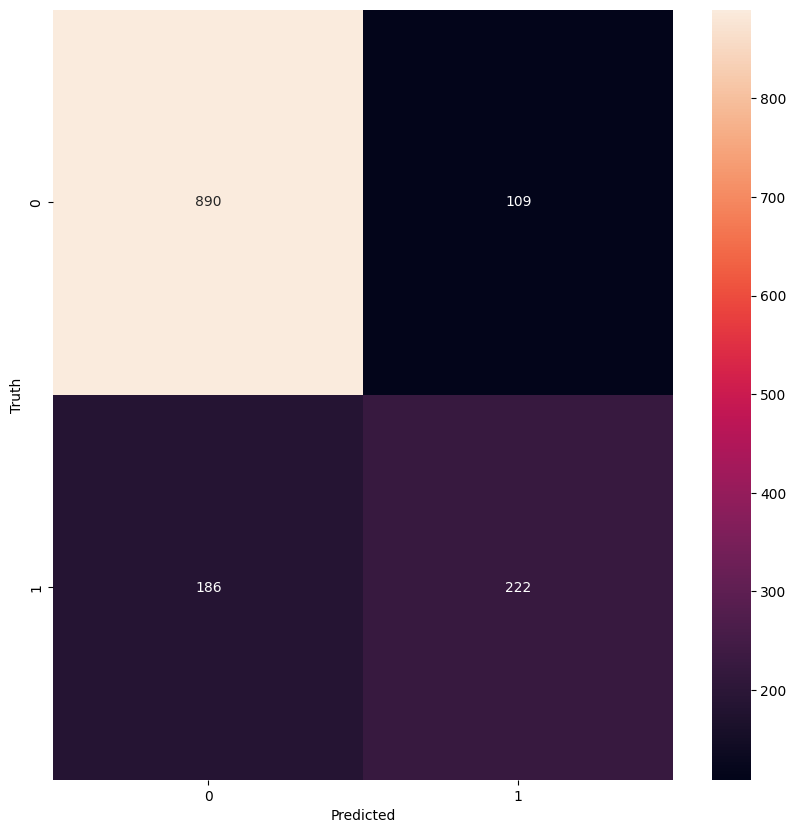

In [ ]:
import seaborn as sn

cm = tf.math.confusion_matrix(labels=y_test,predictions=y_pred)

plt.figure(figsize = (10,10))
sn.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [ ]:
round((906+200)/(906+200+208+93),2) # which is the accuracy

0.79

In [ ]:
round(906/(906+208),2) # the precision for 0

0.81

In [ ]:
round(200/(200+93),2) # the precision for 1

0.68

In [ ]:
round(906/(906+93),2) # recall for 0

0.91

In [ ]:
round(200/(200+208),2) # recall for 1

0.49

### Imbalanced Data

In [ ]:
def ANN(X_train, y_train, X_test, y_test, loss, weights):
    model = keras.Sequential([
        keras.layers.Dense(26, input_dim=26, activation='relu'),
        keras.layers.Dense(15, activation='relu'),
        keras.layers.Dense(1, activation='sigmoid')
    ])

    model.compile(optimizer='adam', loss=loss, metrics=['accuracy'])

    if weights == -1:
        model.fit(X_train, y_train, epochs=100)
    else:
        model.fit(X_train, y_train, epochs=100, class_weight = weights)

    print(model.evaluate(X_test, y_test))

    y_preds = model.predict(X_test)
    y_preds = np.round(y_preds)

    print("Classification Report: \n", classification_report(y_test, y_preds))

    return y_preds

In [ ]:
y_preds = ANN(X_train, y_train, X_test, y_test, 'binary_crossentropy', -1)

Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


176/176 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.6374 - loss: 0.6088
Epoch 2/100
176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7965 - loss: 0.4294
Epoch 3/100
176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7991 - loss: 0.4240
Epoch 4/100
176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8032 - loss: 0.4209
Epoch 5/100
176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8132 - loss: 0.4078
Epoch 6/100
176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8156 - loss: 0.4023
Epoch 7/100
176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8217 - loss: 0.3869
Epoch 8/100
176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8141 - loss: 0.4027
Epoch 9/100
176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8111 - loss: 0.4021
Epoch 10/100
176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8090 - loss: 0.4003
Epoch 11/100
176/176 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8089 - loss: 0.4068
Epoch 12/100
176/176 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

We can find that the F-1 score for class 1 is much lower than class 0

In [ ]:
y_test.value_counts() # which has an imbalanced in data

,count
Churn,
0.0,999
1.0,408




> Undersampling



In [ ]:
count_class_0, count_class_1 = df1.Churn.value_counts()

df_class_0 = df2[df2['Churn'] == 0]
df_class_1 = df2[df2['Churn'] == 1]

In [ ]:
count_class_0, count_class_1

(5163, 1869)

In [ ]:
df_class_0.shape, df_class_1.shape

((5163, 27), (1869, 27))

In [ ]:
df_class_0.sample(2)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,OnlineSecurity,OnlineBackup,DeviceProtection,...,InternetService_DSL,InternetService_Fiber optic,InternetService_No,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
3268,0.0,0.0,1.0,1.0,0.323944,1.0,1.0,1.0,0.0,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
2675,0.0,0.0,1.0,1.0,0.577465,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0


In [ ]:
# in order to make a balance data set
df_class_0_under = df_class_0.sample(count_class_1)

In [ ]:
df_under = pd.concat([df_class_0_under, df_class_1],axis=0)
df_under.shape

(3738, 27)

In [ ]:
df_under.Churn.value_counts()

,count
Churn,
0.0,1869
1.0,1869


In [ ]:
X_under = df_under.drop('Churn',axis='columns')
y_under = df_under.Churn

In [ ]:
X_train_under, X_test_under, y_train_under, y_test_under = train_test_split(X_under,y_under,test_size=0.2,random_state=15,stratify=y_under)

In [ ]:
X_train_under.shape, X_test_under.shape

((2990, 26), (748, 26))

In [ ]:
y_train_under.value_counts()

,count
Churn,
0.0,1495
1.0,1495


In [ ]:
y_pred_under = ANN(X_train_under, y_train_under, X_test_under, y_test_under, 'binary_crossentropy', -1)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - accuracy: 0.6177 - loss: 0.6582
Epoch 2/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7499 - loss: 0.5241
Epoch 3/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7529 - loss: 0.4992
Epoch 4/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7585 - loss: 0.4919
Epoch 5/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7831 - loss: 0.4654
Epoch 6/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7653 - loss: 0.4838
Epoch 7/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7598 - loss: 0.4857
Epoch 8/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7728 - loss: 0.4724
Epoch 9/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7920 - loss: 0.4467
Epoch 10/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7524 - loss: 0.5081
Epoch 11/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7713 - loss: 0.4690
Epoch 12/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy

It finds that the result is balanced




> Oversampling




In [ ]:
count_class_0, count_class_1

(5163, 1869)

In [ ]:
df_class_1.shape

(1869, 27)

In [ ]:
df_class_1_over = df_class_1.sample(count_class_0, replace=True) # copy some more into df
df_class_1_over.shape

(5163, 27)

In [ ]:
df_class_1_over.sample(5)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,OnlineSecurity,OnlineBackup,DeviceProtection,...,InternetService_DSL,InternetService_Fiber optic,InternetService_No,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
3737,1.0,0.0,0.0,0.0,0.056338,1.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
6453,0.0,1.0,1.0,0.0,0.647887,1.0,1.0,0.0,0.0,1.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
5724,0.0,0.0,0.0,0.0,0.000000,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
248,0.0,0.0,0.0,0.0,0.000000,1.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
117,1.0,0.0,1.0,1.0,0.126761,1.0,1.0,1.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [ ]:
df_over = pd.concat([df_class_0, df_class_1_over], axis=0)
df_over.shape

(10326, 27)

In [ ]:
df_over.Churn.value_counts()

,count
Churn,
0.0,5163
1.0,5163


In [ ]:
X_over = df_over.drop('Churn',axis='columns')
y_over = df_over.Churn

In [ ]:
X_train_over, X_test_over, y_train_over, y_test_over = train_test_split(X_over,y_over,test_size=0.2,random_state=15,stratify=y_over)

In [ ]:
y_pred_over = ANN(X_train_over, y_train_over, X_test_over, y_test_over, 'binary_crossentropy', -1)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.6059 - loss: 0.6347
Epoch 2/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7604 - loss: 0.4925
Epoch 3/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7529 - loss: 0.4941
Epoch 4/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7641 - loss: 0.4829
Epoch 5/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.7731 - loss: 0.4677
Epoch 6/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7823 - loss: 0.4592
Epoch 7/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7824 - loss: 0.4680
Epoch 8/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7817 - loss: 0.4639
Epoch 9/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7817 - loss: 0.4622
Epoch 10/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7760 - loss: 0.4655
Epoch 11/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7895 - loss: 0.4485
Epoch 12/100
259/259 ━━━━━━━━━━━━━━━━━━━━



> SMOTE



 increasing the number of cases in your dataset in a balanced way

In [ ]:
X_smote = df2.drop('Churn',axis='columns')
y_smote = df2.Churn

In [ ]:
!pip install imblearn

In [ ]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(sampling_strategy='minority')
X_smote_resampled, y_smote_resampled = smote.fit_resample(X_smote, y_smote)

In [ ]:
y_smote_resampled.value_counts()

,count
Churn,
0.0,5163
1.0,5163


In [ ]:
X_train_smote, X_test_smote, y_train_smote, y_test_smote = train_test_split(X_smote_resampled, y_smote_resampled, test_size=0.2,random_state=15,stratify=y_smote_resampled)

In [ ]:
y_pred_smote = ANN(X_train_smote, y_train_smote, X_test_smote, y_test_smote, 'binary_crossentropy', -1)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 7s 10ms/step - accuracy: 0.6404 - loss: 0.6238
Epoch 2/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7719 - loss: 0.4799
Epoch 3/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7774 - loss: 0.4710
Epoch 4/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7764 - loss: 0.4703
Epoch 5/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7774 - loss: 0.4631
Epoch 6/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7721 - loss: 0.4629
Epoch 7/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7862 - loss: 0.4512
Epoch 8/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7882 - loss: 0.4478
Epoch 9/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7841 - loss: 0.4507
Epoch 10/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7855 - loss: 0.4491
Epoch 11/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7969 - loss: 0.4421
Epoch 12/100
259/259 ━━━━━━━━━━━━━━━━━━━

Now, we are having balanced and desirable results



> Ensemble with undersampling



In [ ]:
df2.Churn.value_counts()

,count
Churn,
0.0,5163
1.0,1869


In [ ]:
X_ensemble = df2.drop('Churn',axis='columns')
y_ensemble = df2.Churn

In [ ]:
X_train_ensemble, X_test_ensemble, y_train_ensemble, y_test_ensemble = train_test_split(X_ensemble,y_ensemble,test_size=0.2,random_state=15,stratify=y_ensemble)

In [ ]:
y_train_ensemble.value_counts()

,count
Churn,
0.0,4130
1.0,1495


In [ ]:
df3 = X_train_ensemble.copy()
df3['Churn'] = y_train_ensemble

In [ ]:
df3_class_0 = df3[df3['Churn'] == 0]
df3_class_1 = df3[df3['Churn'] == 1]

In [ ]:
df3_class_0.shape, df3_class_1.shape

((4130, 27), (1495, 27))

In [ ]:
def get_train_batch(df_majority,df_minority,start,end):
  df_train = pd.concat([df_majority[start:end],df_minority],axis=0)

  X_train = df_train.drop('Churn',axis='columns')
  y_train = df_train.Churn
  return X_train,y_train

In [ ]:
X_train, y_train = get_train_batch(df3_class_0,df3_class_1,0,1495)
X_train.shape

(2990, 26)

In [ ]:
y_p = ANN(X_train, y_train, X_test_ensemble, y_test_ensemble, 'binary_crossentropy', -1)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5605 - loss: 0.6763
Epoch 2/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7448 - loss: 0.5279
Epoch 3/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7764 - loss: 0.4932
Epoch 4/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7575 - loss: 0.4956
Epoch 5/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7605 - loss: 0.4897
Epoch 6/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7552 - loss: 0.5026
Epoch 7/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7657 - loss: 0.4819
Epoch 8/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7796 - loss: 0.4752
Epoch 9/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7728 - loss: 0.4766
Epoch 10/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7835 - loss: 0.4759
Epoch 11/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7848 - loss: 0.4682
Epoch 12/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy

In [ ]:
X_train, y_train = get_train_batch(df3_class_0,df3_class_1,1495,2990)
y_p2 = ANN(X_train, y_train, X_test_ensemble, y_test_ensemble, 'binary_crossentropy', -1)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - accuracy: 0.5598 - loss: 0.6536
Epoch 2/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.7667 - loss: 0.5281
Epoch 3/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7502 - loss: 0.5051
Epoch 4/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7527 - loss: 0.5046
Epoch 5/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7492 - loss: 0.4978
Epoch 6/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7592 - loss: 0.4925
Epoch 7/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7631 - loss: 0.4847
Epoch 8/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7626 - loss: 0.4812
Epoch 9/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7744 - loss: 0.4768
Epoch 10/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7706 - loss: 0.4847
Epoch 11/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7634 - loss: 0.4759
Epoch 12/100
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy

In [ ]:
X_train, y_train = get_train_batch(df3_class_0,df3_class_1,2990,4130)
y_p3 = ANN(X_train, y_train, X_test_ensemble, y_test_ensemble, 'binary_crossentropy', -1)

Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


83/83 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.6454 - loss: 0.6472
Epoch 2/100
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7683 - loss: 0.5188
Epoch 3/100
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7643 - loss: 0.4894
Epoch 4/100
83/83 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7686 - loss: 0.4871
Epoch 5/100
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7656 - loss: 0.4751
Epoch 6/100
83/83 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7726 - loss: 0.4772
Epoch 7/100
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7779 - loss: 0.4735
Epoch 8/100
83/83 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7757 - loss: 0.4666
Epoch 9/100
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7728 - loss: 0.4672
Epoch 10/100
83/83 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7877 - loss: 0.4584
Epoch 11/100
83/83 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7833 - loss: 0.4546
Epoch 12/100
83/83 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7806 - l

In [ ]:
# Do majority Voting
len(y_p), len(y_p2), len(y_p3)

(1407, 1407, 1407)

In [ ]:
y_p_final = y_p.copy()

for i in range(len(y_p)):
  n_ones= y_p[i] + y_p2[i] + y_p3[i]
  if n_ones > 1:
    y_p_final[i] = 1
  else:
    y_p_final[i] = 0


In [ ]:
print(classification_report(y_test_ensemble,y_p_final))

              precision    recall  f1-score   support

         0.0       0.89      0.68      0.78      1033
         1.0       0.47      0.78      0.59       374

    accuracy                           0.71      1407
   macro avg       0.68      0.73      0.68      1407
weighted avg       0.78      0.71      0.73      1407



### CNN

In [ ]:
import tensorflow as tf
from tensorflow.keras import datasets, layers, models
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
(X_train,y_train),(X_test,y_test) = datasets.cifar10.load_data()

170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


In [ ]:
X_test.shape

(10000, 32, 32, 3)

In [ ]:
classes = ['airplane','automobile','bird','cat','deer','dog','frog','horse','ship','truck']

In [ ]:
def plot_sample(X,y,index):
  plt.figure(figsize=(15,2))
  plt.imshow(X[index])
  plt.xlabel(classes[y[index]])

In [ ]:
y_train[:5].shape

(5,)

In [ ]:
y_train = y_train.reshape(-1,)
y_train[:5].shape

(5,)

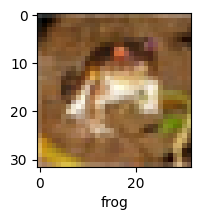

In [ ]:
plot_sample(X_train,y_train,0)

In [ ]:
X_train = X_train / 255.0
X_test = X_test / 255.0

In [ ]:
model = models.Sequential([
    layers.Flatten(input_shape=(32,32,3)),
    layers.Dense(3000,activation='relu'),
    layers.Dense(1000,activation='relu'),
    layers.Dense(10,activation='sigmoid')
])

model.compile(optimizer='SGD',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.fit(X_train,y_train,epochs=5)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/5
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - accuracy: 0.3076 - loss: 1.9307
Epoch 2/5
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.4235 - loss: 1.6415
Epoch 3/5
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.4531 - loss: 1.5480
Epoch 4/5
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.4815 - loss: 1.4819
Epoch 5/5
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.4943 - loss: 1.4381


In [ ]:
model.evaluate(X_test,y_test)

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4867 - loss: 1.4617


[1.4655585289001465, 0.482699990272522]

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np
y_pred = model.predict(X_test)
y_pred_classes = [np.argmax(element) for element in y_pred]

print("Classification Report: \n", classification_report(y_test, y_pred_classes))

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Classification Report: 
               precision    recall  f1-score   support

           0       0.41      0.71      0.52      1000
           1       0.56      0.67      0.61      1000
           2       0.44      0.27      0.34      1000
           3       0.39      0.29      0.33      1000
           4       0.40      0.44      0.42      1000
           5       0.48      0.26      0.34      1000
           6       0.60      0.42      0.50      1000
           7       0.45      0.66      0.53      1000
           8       0.58      0.63      0.60      1000
           9       0.57      0.48      0.52      1000

    accuracy                           0.48     10000
   macro avg       0.49      0.48      0.47     10000
weighted avg       0.49      0.48      0.47     10000



In [ ]:
model_cnn = models.Sequential([
    # cnn
    layers.Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=(32, 32, 3)),
    layers.MaxPooling2D((2, 2)),

    layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),

    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(10, activation='softmax')
])

model_cnn.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model_cnn.fit(X_train, y_train, epochs=10)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - accuracy: 0.3863 - loss: 1.6912
Epoch 2/10
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.6051 - loss: 1.1276
Epoch 3/10
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.6565 - loss: 0.9817
Epoch 4/10
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.6935 - loss: 0.8781
Epoch 5/10
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.7157 - loss: 0.8156
Epoch 6/10
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.7466 - loss: 0.7301
Epoch 7/10
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.7643 - loss: 0.6779
Epoch 8/10
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.7737 - loss: 0.6429
Epoch 9/10
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.7926 - loss: 0.5976
Epoch 10/10
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8050 - loss: 0.5597


In [ ]:
model_cnn.evaluate(X_test,y_test)

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7160 - loss: 0.8892


[0.9060652256011963, 0.7074999809265137]

In [ ]:
y_test = y_test.reshape(-1,)

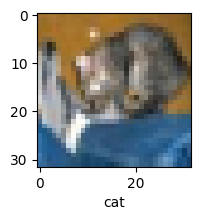

In [ ]:
plot_sample(X_test,y_test,0)

In [ ]:
y_pred = model.predict(X_test)
y_pred[:5]

313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


array([[0.42484987, 0.7154192 , 0.49912047, 0.8142232 , 0.39042   ,
        0.6594703 , 0.6832322 , 0.07237574, 0.6629026 , 0.09494182],
       [0.9359206 , 0.97616076, 0.30145055, 0.23171642, 0.1924148 ,
        0.05329205, 0.01270362, 0.21346875, 0.9736649 , 0.97853446],
       [0.9765603 , 0.9242211 , 0.41320717, 0.20087044, 0.24968982,
        0.11873017, 0.00442955, 0.4562841 , 0.9759174 , 0.9002645 ],
       [0.94835377, 0.6774341 , 0.64066017, 0.2222593 , 0.5554509 ,
        0.16833648, 0.0074144 , 0.7945817 , 0.8536515 , 0.42470145],
       [0.25950706, 0.07035255, 0.70343196, 0.53024626, 0.96556985,
        0.5754966 , 0.717909  , 0.48061556, 0.31597883, 0.03822064]],
      dtype=float32)

In [ ]:
classes[np.argmax(y_pred[0])]

'cat'

In [ ]:
y_pred_class = [np.argmax(element) for element in y_pred]
y_pred_class[:5]

[3, 9, 0, 0, 4]

In [ ]:
y_test[:5]

array([3, 8, 8, 0, 6], dtype=uint8)



> Data Augmentation



In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [ ]:
dataset_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"
data_dir = tf.keras.utils.get_file('flower_photos', origin=dataset_url,  cache_dir='.', untar=True)

228813984/228813984 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [ ]:
data_dir

'./datasets/flower_photos'

In [ ]:
import pathlib
data_dir = pathlib.Path(data_dir)
data_dir

PosixPath('datasets/flower_photos')

In [ ]:
list(data_dir.glob('*/*.jpg'))[:5]

[PosixPath('datasets/flower_photos/roses/4061451210_1650590c6a.jpg'),
 PosixPath('datasets/flower_photos/roses/8642943283_47e44d049d_m.jpg'),
 PosixPath('datasets/flower_photos/roses/16149016979_23ef42b642_m.jpg'),
 PosixPath('datasets/flower_photos/roses/19988406792_68201f76e3_n.jpg'),
 PosixPath('datasets/flower_photos/roses/410425647_4586667858.jpg')]

In [ ]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

3670


In [ ]:
roses = list(data_dir.glob('roses/*'))

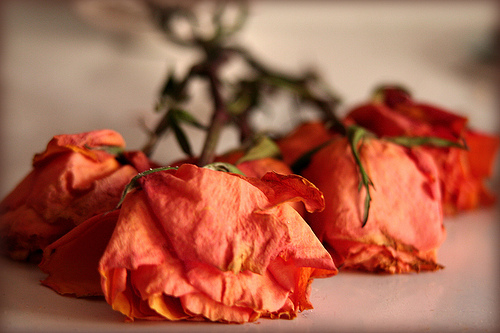

In [ ]:
PIL.Image.open(str(roses[0]))

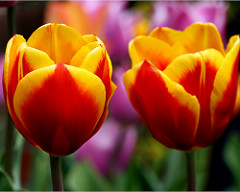

In [ ]:
tulips = list(data_dir.glob('tulips/*'))
PIL.Image.open(str(tulips[0]))

In [ ]:
flowers_images_dict = {
    'roses': list(data_dir.glob('roses/*')),
    'daisy': list(data_dir.glob('daisy/*')),
    'dandelion': list(data_dir.glob('dandelion/*')),
    'sunflowers': list(data_dir.glob('sunflowers/*')),
    'tulips': list(data_dir.glob('tulips/*')),
}

In [ ]:
flowers_images_dict['roses'][:5]

[PosixPath('datasets/flower_photos/roses/4061451210_1650590c6a.jpg'),
 PosixPath('datasets/flower_photos/roses/8642943283_47e44d049d_m.jpg'),
 PosixPath('datasets/flower_photos/roses/16149016979_23ef42b642_m.jpg'),
 PosixPath('datasets/flower_photos/roses/19988406792_68201f76e3_n.jpg'),
 PosixPath('datasets/flower_photos/roses/410425647_4586667858.jpg')]

In [ ]:
flowers_labels_dict = {
    'roses': 0,
    'daisy': 1,
    'dandelion': 2,
    'sunflowers': 3,
    'tulips': 4,
}

array([[[ 49,  58,  95],
        [ 49,  59,  93],
        [ 50,  61,  93],
        ...,
        [ 67,  80, 112],
        [ 63,  75, 109],
        [ 61,  73, 107]],

       [[ 49,  59,  93],
        [ 50,  61,  93],
        [ 50,  64,  93],
        ...,
        [ 70,  83, 115],
        [ 66,  79, 111],
        [ 64,  76, 110]],

       [[ 48,  61,  93],
        [ 50,  64,  93],
        [ 52,  66,  94],
        ...,
        [ 72,  88, 117],
        [ 67,  82, 114],
        [ 65,  80, 112]],

       ...,

       [[ 55,  66,  98],
        [ 58,  69, 101],
        [ 61,  70, 103],
        ...,
        [ 64,  75, 107],
        [ 61,  72, 104],
        [ 59,  69, 103]],

       [[ 53,  64,  96],
        [ 55,  66,  98],
        [ 58,  67, 100],
        ...,
        [ 62,  73, 105],
        [ 59,  70, 102],
        [ 57,  67, 101]],

       [[ 51,  62,  94],
        [ 53,  64,  96],
        [ 55,  64,  97],
        ...,
        [ 59,  70, 102],
        [ 56,  66, 100],
        [ 54,  64,  98]]], dtype=uint8)
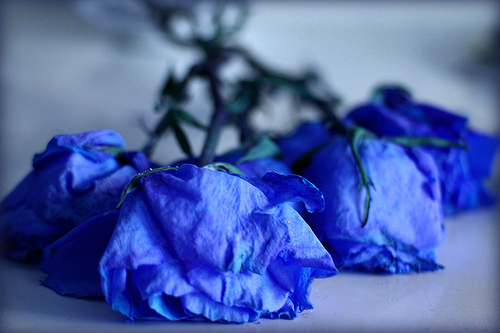

In [ ]:
cv2.imread(str(flowers_images_dict['roses'][0]))

In [ ]:
cv2.resize(cv2.imread(str(flowers_images_dict['roses'][0])),(180,180)).shape

(180, 180, 3)

In [ ]:
X , y = [],[]

for flower_name, images in flowers_images_dict.items():
  for image in images:
    img = cv2.imread(str(image))
    resized_img = cv2.resize(img,(180,180))
    X.append(resized_img)
    y.append(flowers_labels_dict[flower_name])

In [ ]:
y[:5]

[0, 0, 0, 0, 0]

In [ ]:
X = np.array(X)
y = np.array(y)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

In [ ]:
X_train_scaled = X_train / 255
X_test_scaled = X_test / 255

In [ ]:
model = Sequential([
    layers.Conv2D(16,3,padding='same',activation='relu',),
    layers.MaxPooling2D(),
    layers.Conv2D(32,3,padding='same',activation='relu',),
    layers.MaxPooling2D(),
    layers.Conv2D(64,3,padding='same',activation='relu',),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128,activation='relu'),
    layers.Dense(5,activation='softmax')
])

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.fit(X_train_scaled, y_train, epochs=30)

Epoch 1/30
86/86 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - accuracy: 0.2934 - loss: 1.6422
Epoch 2/30
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - accuracy: 0.5815 - loss: 1.0644
Epoch 3/30
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.6899 - loss: 0.8325
Epoch 4/30
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.7351 - loss: 0.6920
Epoch 5/30
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - accuracy: 0.8396 - loss: 0.4445
Epoch 6/30
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - accuracy: 0.9116 - loss: 0.2688
Epoch 7/30
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9622 - loss: 0.1403
Epoch 8/30
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9799 - loss: 0.0828
Epoch 9/30
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9888 - loss: 0.0447
Epoch 10/30
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9965 - loss: 0.0217
Epoch 11/30
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9989 - loss: 0.0070
Epoch 12/30
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy:

In [ ]:
model.evaluate(X_test,y_test) # overfitting

29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - accuracy: 0.5434 - loss: 716.3997


[711.2442626953125, 0.5413943529129028]

In [ ]:
pred = model.predict(X_test_scaled)
pred

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


array([[2.9181823e-05, 9.9873108e-01, 1.2397716e-03, 1.0445892e-11,
        1.3046096e-08],
       [1.9340765e-03, 1.0393096e-06, 7.7570239e-06, 9.9723130e-01,
        8.2586886e-04],
       [4.4652341e-11, 9.6447175e-06, 9.9998927e-01, 5.8412962e-07,
        4.8087884e-07],
       ...,
       [6.3399557e-04, 1.1056519e-07, 2.0881145e-10, 9.9898916e-01,
        3.7668063e-04],
       [9.7046262e-01, 2.4179228e-06, 1.5330956e-08, 7.5835025e-08,
        2.9534897e-02],
       [3.0642601e-05, 7.0219525e-05, 4.1964361e-03, 8.4524930e-01,
        1.5045343e-01]], dtype=float32)

In [ ]:
score = tf.nn.softmax(pred[0])
score

<tf.Tensor: shape=(5,), dtype=float32, numpy=
array([0.14890018, 0.40422755, 0.14908056, 0.14889583, 0.14889583],
      dtype=float32)>

In [ ]:
np.argmax(score)

1

In [ ]:
y_test[0]

1

In [ ]:
data_aug = keras.Sequential([
    layers.RandomZoom(0.3),
])

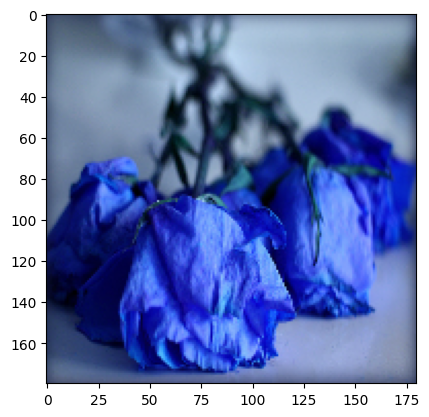

In [ ]:
plt.imshow(X[0])

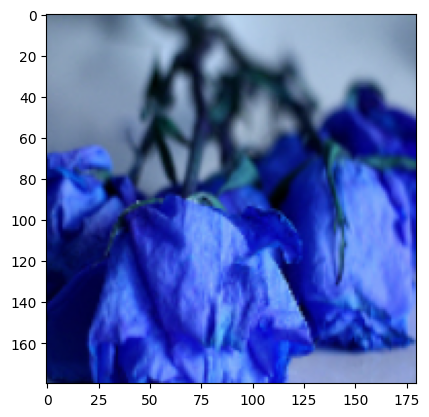

In [ ]:
plt.imshow(data_aug(X)[0].numpy().astype('uint8'))

In [ ]:
model_aug = Sequential([
    data_aug,
    layers.Conv2D(16,3,padding='same',activation='relu',),
    layers.MaxPooling2D(),
    layers.Conv2D(32,3,padding='same',activation='relu',),
    layers.MaxPooling2D(),
    layers.Conv2D(64,3,padding='same',activation='relu',),
    layers.MaxPooling2D(),
    layers.Dropout(0.2),
    layers.Flatten(),
    layers.Dense(128,activation='relu'),
    layers.Dense(5,activation='softmax')
])

model_aug.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model_aug.fit(X_train_scaled, y_train, epochs=20)

Epoch 1/20
86/86 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - accuracy: 0.3050 - loss: 1.5786
Epoch 2/20
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - accuracy: 0.5732 - loss: 1.0575
Epoch 3/20
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - accuracy: 0.6354 - loss: 0.9159
Epoch 4/20
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - accuracy: 0.6795 - loss: 0.8417
Epoch 5/20
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - accuracy: 0.7215 - loss: 0.7500
Epoch 6/20
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - accuracy: 0.7439 - loss: 0.6786
Epoch 7/20
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - accuracy: 0.7861 - loss: 0.5885
Epoch 8/20
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - accuracy: 0.8147 - loss: 0.5355
Epoch 9/20
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - accuracy: 0.8348 - loss: 0.4602
Epoch 10/20
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - accuracy: 0.8456 - loss: 0.4235
Epoch 11/20
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - accuracy: 0.8752 - loss: 0.3510
Epoch 12/20
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - accuracy:

In [ ]:
model_aug.evaluate(X_test_scaled,y_test)

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.6676 - loss: 1.4763


[1.4294203519821167, 0.6851851940155029]

Much better !!

## **Optimization**





### **Gradient Descending**



In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
import pandas as pd
import matplotlib.pyplot as plt

%matplotlib inline

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/MD/Learning is Learning/insurance_data.csv')
df.head()

,age,affordibility,bought_insurance
0,22,1,0
1,25,0,0
2,47,1,1
3,52,0,0
4,46,1,1


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df[['age','affordibility']],df.bought_insurance,test_size=0.2,random_state=25)

In [ ]:
X_train_scaled = X_train.copy()
X_train_scaled['age'] = X_train_scaled['age'] / 100
X_test_scaled = X_test.copy()
X_test_scaled['age'] = X_test_scaled['age'] / 100

In [ ]:
model = keras.Sequential([
    keras.layers.Dense(1, input_shape=(2,), activation='sigmoid', kernel_initializer='ones', bias_initializer='zeros') # w= 1 , b=0 for initialization
])

model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

model.fit(X_train_scaled, y_train, epochs=5000)

Epoch 1/5000


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Streaming output truncated to the last 5000 lines.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.5000 - loss: 0.6748
Epoch 115/5000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.5000 - loss: 0.6745
Epoch 116/5000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - accuracy: 0.5000 - loss: 0.6742
Epoch 117/5000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - accuracy: 0.5000 - loss: 0.6740
Epoch 118/5000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - accuracy: 0.5000 - loss: 0.6737
Epoch 119/5000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.5000 - loss: 0.6735
Epoch 120/5000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.5000 - loss: 0.6732
Epoch 121/5000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.5000 - loss: 0.6730
Epoch 122/5000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - accuracy: 0.5000 - loss: 0.6727
Epoch 123/5000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.5000 - loss: 0.6724
Epoch 124/5000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - accuracy: 0.5000 - loss: 0.6722
Epoch 1

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-55-1d14490008aa>", line 9, in <cell line: 9>
    model.fit(X_train_scaled, y_train, epochs=5000)
  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler
    return fn(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 316, in fit
    for step, iterator in epoch_iterator.enumerate_epoch():
  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 649, in enumerate_epoch
    iterator = iter(self._distributed_dataset)
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/dataset_ops.py", line 501, in __iter__
    return iterator_ops.OwnedIterator(self)
  File "/usr/local/lib/python3.10/dist-packages/ten

TypeError: object of type 'NoneType' has no len()

In [ ]:
model.evaluate(X_test_scaled,y_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 736ms/step - accuracy: 0.8333 - loss: 0.4747


[0.47473907470703125, 0.8333333134651184]

In [ ]:
model.predict(X_test_scaled)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step


array([[0.67106545],
       [0.4809206 ],
       [0.27954316],
       [0.5488039 ],
       [0.68296826],
       [0.7491491 ]], dtype=float32)

In [ ]:
y_test

,bought_insurance
2,1
10,0
21,0
11,0
14,1
9,1


In [ ]:
coef, intercept = model.get_weights()
coef, intercept

(array([[2.7219388],
        [1.0881293]], dtype=float32),
 array([-1.6544329], dtype=float32))

In [ ]:
def sigmoid(X):
  import math
  return 1 / (1 + math.exp(-X))

In [ ]:
def prediction_function(age, affordibility):
  weighted_sum = coef[0]*age + coef[1]*affordibility + intercept
  return sigmoid(weighted_sum)

In [ ]:
prediction_function(0.47,1)

<ipython-input-59-5de9060e72c3>:3: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return 1 / (1 + math.exp(-X))


0.6710654344022844

In [ ]:
X_test_scaled

,age,affordibility
2,0.47,1
10,0.18,1
21,0.26,0
11,0.28,1
14,0.49,1
9,0.61,1


In [ ]:
def log_loss(y_true,y_predicted):
  epsilon = 1e-15
  y_predicted_new = [max(i,epsilon) for i in y_predicted]
  y_predicted_new = [min(i,1-epsilon) for i in y_predicted_new]
  y_predicted_new = np.array(y_predicted_new)
  return -np.mean(y_true*np.log(y_predicted_new)+(1-y_true)*np.log(1-y_predicted_new))

In [ ]:
def sigmoid_numpy(X):
  import math
  return 1 / (1 + np.exp(-X))

In [ ]:
def gradient_descent(age, affordibility, y_true, epochs, loss_thresold):
  w1 = w2 = 1
  bias = 0
  rate = 0.5
  n = len(age)
  for i in range(epochs):
    weighted_sum = w1 * age + w2 * affordibility + bias
    y_predicted = sigmoid_numpy(weighted_sum)

    loss = log_loss(y_true, y_predicted)

    #updated weight and bias
    #derivative comes firts
    w1d = (1/n)*np.dot(np.transpose(age),(y_predicted-y_true)) # dot prodcuct is the SUM
    w2d = (1/n)*np.dot(np.transpose(affordibility),(y_predicted-y_true))
    bias_d = np.mean(y_predicted-y_true)
    #update
    w1 = w1 - rate * w1d
    w2 = w2 - rate * w2d
    bias = bias - rate * bias_d
    print (f'Epoch:{i}, w1:{w1}, w2:{w2}, bias:{bias}, loss:{loss}')
    if loss<=loss_thresold:
      break
  return w1, w2, bias


In [ ]:
gradient_descent(X_train_scaled['age'],X_train_scaled['affordibility'],y_train,1000, 0.4631)

Epoch:0, w1:0.974907633470177, w2:0.948348125394529, bias:-0.11341867736368583, loss:0.7113403233723417
Epoch:1, w1:0.9556229728273669, w2:0.9058873696677865, bias:-0.2122349122718517, loss:0.681264778737757
Epoch:2, w1:0.9416488476693794, w2:0.8719790823960313, bias:-0.2977578997796538, loss:0.6591474252715025
Epoch:3, w1:0.9323916996249162, w2:0.8457541517722915, bias:-0.3715094724003511, loss:0.6431523291301917
Epoch:4, w1:0.9272267472726993, w2:0.8262362885332687, bias:-0.43506643026891584, loss:0.6316873063379158
Epoch:5, w1:0.9255469396815343, w2:0.8124402814952774, bias:-0.48994490058938817, loss:0.623471707997592
Epoch:6, w1:0.9267936114129968, w2:0.8034375029757677, bias:-0.5375299543522853, loss:0.6175321183044205
Epoch:7, w1:0.93047170420295, w2:0.7983920007454487, bias:-0.5790424270894963, loss:0.6131591858705934
Epoch:8, w1:0.9361540784567942, w2:0.7965748796787705, bias:-0.6155315088627655, loss:0.6098518179750948
Epoch:9, w1:0.9434791243557357, w2:0.7973647616854131, bia

(5.051047623653049, 1.4569794548473887, -2.9596534546250037)

In [ ]:
coef, intercept
# Actually it should correspondent the the value above but this training is not good, so we cant see the result
# but it should be

(array([[2.7219388],
        [1.0881293]], dtype=float32),
 array([-1.6544329], dtype=float32))



---


> **Implement the Own NN**





In [ ]:
class myNN:
  def __init__(self):
    self.w1 = 1
    self.w2 = 1
    self.bias = 0


  def fit(self, X, y, epochs, loss_thresold):
    self.w1, self.w2, self.bias = self.gradient_descent(X['age'],X['affordibility'],y, epochs, loss_thresold)

  def predict(self, X_test):
    weighted_sum = self.w1*X_test['age'] + self.w2*X_test['affordibility'] + self.bias
    return sigmoid_numpy(weighted_sum)


  def gradient_descent(self,age, affordibility, y_true, epochs, loss_thresold):
    w1 = w2 = 1
    bias = 0
    rate = 0.5
    n = len(age)
    for i in range(epochs):
      weighted_sum = w1 * age + w2 * affordibility + bias
      y_predicted = sigmoid_numpy(weighted_sum)

      loss = log_loss(y_true, y_predicted)

      #updated weight and bias
      #derivative comes firts
      w1d = (1/n)*np.dot(np.transpose(age),(y_predicted-y_true)) # dot prodcuct is the SUM
      w2d = (1/n)*np.dot(np.transpose(affordibility),(y_predicted-y_true))
      bias_d = np.mean(y_predicted-y_true)
      #update
      w1 = w1 - rate * w1d
      w2 = w2 - rate * w2d
      bias = bias - rate * bias_d
      if i%100==0:
        print (f'Epoch:{i}, w1:{w1}, w2:{w2}, bias:{bias}, loss:{loss}')
      if loss<=loss_thresold:
        break
    return w1, w2, bias

In [ ]:
customModel = myNN()
customModel.fit(X_train_scaled, y_train, epochs=8000, loss_thresold=0.4631)

Epoch:0, w1:0.974907633470177, w2:0.948348125394529, bias:-0.11341867736368583, loss:0.7113403233723417
Epoch:100, w1:2.200713131760032, w2:1.2941584023238903, bias:-1.6607009122062801, loss:0.5390680417774752
Epoch:200, w1:3.443016970881803, w2:1.4042218624465033, bias:-2.2571369883752723, loss:0.5005011269691375
Epoch:300, w1:4.472179522095915, w2:1.438787986553552, bias:-2.707387811922373, loss:0.4750814640632793


In [ ]:
customModel.predict(X_test_scaled)

,0
2,0.705020
10,0.355836
21,0.161599
11,0.477919
14,0.725586
9,0.828987


In [ ]:
y_test

,bought_insurance
2,1
10,0
21,0
11,0
14,1
9,1




---



### **SGD vs BGD vs Mini-BGD**




Batch Gradient Descent:
Parameters are updated only once in an epoch

Stochastic Gradient Descent: the number of parameter updates in an epoch is equal to the number of samples

Mini-batch gradient descent: the number of parameter updates in an epoch is equal to the number of batches

Recall that:

For BGD
$$
\text{minimize}_{\theta}\frac{1}{m}∑_{i=1}^{m}𝓵(h_{𝜃}(x^{(i)}),y^{(i)})
$$

$$
\theta := \theta - \alpha \nabla_{\theta} f(\theta)
$$

And for SGD
$$
\theta := \theta - \frac{\alpha}{B}\sum_{i=1}^{B}\nabla_{\theta}𝓵(h_{𝜃}(x^{(i)}),y^{(i)})
$$

Where sample a minibatch of data $X \in \mathbb{R}^{B \times n} , y \in \{1, \ldots, k\}^B $

In [ ]:
import tensorflow as tf
from tensorflow import keras
from matplotlib import pyplot as plt
%matplotlib inline
import numpy as np
import pandas as pd

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/MD/Learning is Learning/homeprices_banglore.csv')
df.head()

,area,bedrooms,price
0,1056,2,39.07
1,2600,4,120.00
2,1440,3,62.00
3,1521,3,75.00
4,1200,2,51.00


In [ ]:
from sklearn import preprocessing

xscaler = preprocessing.MinMaxScaler()

scaled_X = xscaler.fit_transform(df.drop('price',axis=1))
scaled_X

array([[0.08827586, 0.25      ],
       [0.62068966, 0.75      ],
       [0.22068966, 0.5       ],
       [0.24862069, 0.5       ],
       [0.13793103, 0.25      ],
       [0.12758621, 0.25      ],
       [0.6662069 , 0.75      ],
       [0.86206897, 0.75      ],
       [0.17586207, 0.5       ],
       [1.        , 1.        ],
       [0.34482759, 0.5       ],
       [0.68448276, 0.75      ],
       [0.06896552, 0.25      ],
       [0.10344828, 0.25      ],
       [0.5       , 0.5       ],
       [0.12931034, 0.25      ],
       [0.13103448, 0.5       ],
       [0.25517241, 0.5       ],
       [0.67931034, 0.5       ],
       [0.        , 0.        ]])

In [ ]:
yscaler = preprocessing.MinMaxScaler()

scaled_y = yscaler.fit_transform(df['price'].values.reshape(-1,1))
scaled_y

array([[0.05237037],
       [0.65185185],
       [0.22222222],
       [0.31851852],
       [0.14074074],
       [0.04444444],
       [0.76296296],
       [0.91111111],
       [0.13333333],
       [1.        ],
       [0.37037037],
       [0.8       ],
       [0.04444444],
       [0.05925926],
       [0.51111111],
       [0.07407407],
       [0.11851852],
       [0.20740741],
       [0.51851852],
       [0.        ]])

In [ ]:
K = np.array([[1,2,3],[4,5,6]])
p = np.array([[1,2,3],[4,5,6],[1,1,1]])
K.dot(p)
# np.dot(K,p)

array([[12, 15, 18],
       [30, 39, 48]])

In [ ]:
def batch_gradient_descent(X, y_true, epochs, learning_rate=0.01):
    m = X.shape[0] #number of samples
    n = X.shape[1] #number of features
    w = np.ones(shape=(n))
    b = 0
    cost_list = []
    epoch_list = []
    for i in range(epochs):
        y_pred = np.dot(w,scaled_X.T) + b

        w_d = -(2/m)*np.dot(scaled_X.T,(y_true-y_pred))
        b_d = -(2/m)*np.sum(y_true-y_pred)

        w = w - learning_rate * w_d
        b = b - learning_rate * b_d

        cost = np.mean(np.square(y_true-y_pred))


        if i%10==0:
            cost_list.append(cost)
            epoch_list.append(i)
    return w, b, cost, cost_list, epoch_list



In [ ]:
w,b,cost,cost_list,epoch_list = batch_gradient_descent(scaled_X, scaled_y.reshape(-1),500)
w,b,cost

(array([0.70712464, 0.67456527]), -0.23034857438407427, 0.0068641890429808105)

Text(0, 0.5, 'Cost')

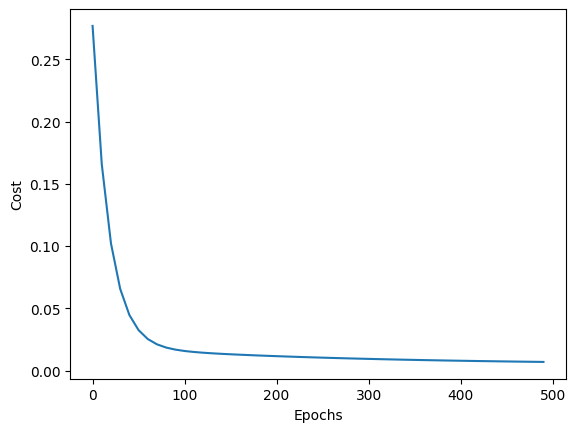

In [ ]:
plt.plot(epoch_list,cost_list)
plt.xlabel('Epochs')
plt.ylabel('Cost')

In [ ]:
def predict(area,bedrooms,w,b):
  scaled_X = xscaler.transform([[area,bedrooms]])[0]
  y_pred = w[0]*scaled_X[0] + w[1]*scaled_X[1] + b
  return yscaler.inverse_transform([[y_pred]])[0][0] # reverse the process of the scaler

predict(2600,4,w,b)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


128.45484403267596

In [ ]:
def stochastic_gradient_descent(X, y_true, epochs, learning_rate=0.01):
    m = X.shape[0] #number of samples
    n = X.shape[1] #number of features
    w = np.ones(shape=(n))
    b = 0
    cost_list = []
    epoch_list = []
    for i in range(epochs):
        random_index = np.random.randint(0,m-1)
        sample_x = X[random_index]
        sample_y = y_true[random_index]

        y_pred = np.dot(w,sample_x.T) + b

        w_d = -(2/m)*(sample_x.T.dot(sample_y-y_pred))
        b_d = -(2/m)*np.sum(sample_y-y_pred)

        w = w - learning_rate * w_d
        b = b - learning_rate * b_d

        cost = np.mean(np.square(sample_y-y_pred))

        if i%100==0:
            cost_list.append(cost)
            epoch_list.append(i)

    return w, b, cost, cost_list, epoch_list

In [ ]:
w_sgd, b_sgd, cost_sgd, cost_list_sgd, epoch_list_sgd = stochastic_gradient_descent(scaled_X, scaled_y.reshape(-1),10000)
w_sgd, b_sgd, cost_sgd

(array([0.72872719, 0.7092548 ]), -0.2646450910361398, 0.0002445489723578023)

Text(0, 0.5, 'Cost')

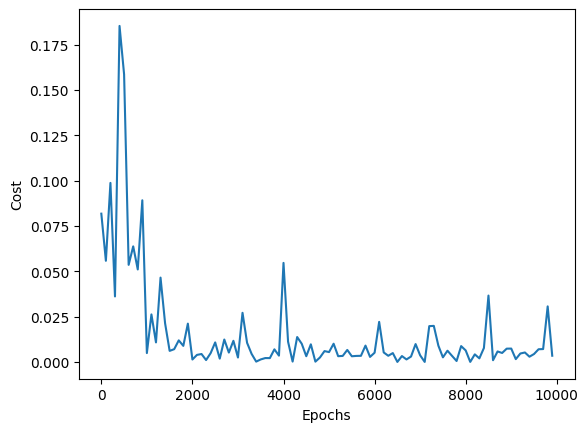

In [ ]:
plt.plot(epoch_list_sgd,cost_list_sgd)
plt.xlabel('Epochs')
plt.ylabel('Cost')

### Exponential Weighted Averages

Exponentially weighted averaging is a weighted averaging method in which the weights are exponentially decreasing, with greater weights assigned to more recent data and lesser weights assigned to earlier data

For given time series data $x_1, x_2, \ldots, x_t$，EWA $v_t$：
$v_t = \beta v_{t-1} + (1 - \beta) x_t$

- $v_t$: EWA for time t
- $β$: Smooth coefficient range: 0 ≤ $β$ < 1
- $x_t$: the data for time t


Expansion:

$v_t = (1 - \beta) \sum_{i=0}^{t-1} \beta^i x_{t-i} + \beta^t v_0$

$v_t$ is the weighted average for all previous data ，weight is $ (1 - \beta) \beta^i$。


β is close to 1:

The weights decay slowly and the historical data have a greater impact.
Smoothing effect is more pronounced, slower response.

β close to 0:

Weights decay quickly, more focus on recent data.
The smoothing effect is weaker and the response is faster.



> Bias Correction

At the beginning， $v_0$ is always 0, leading $v_t$ quite small.
Thus，introducing Bias Correction：

$$
\hat{v}_t = \frac{v_t}{1 - \beta^t}
$$

- **Purpose**：Eliminate the impact of initial value on EWA，makes the evaluation more accurate




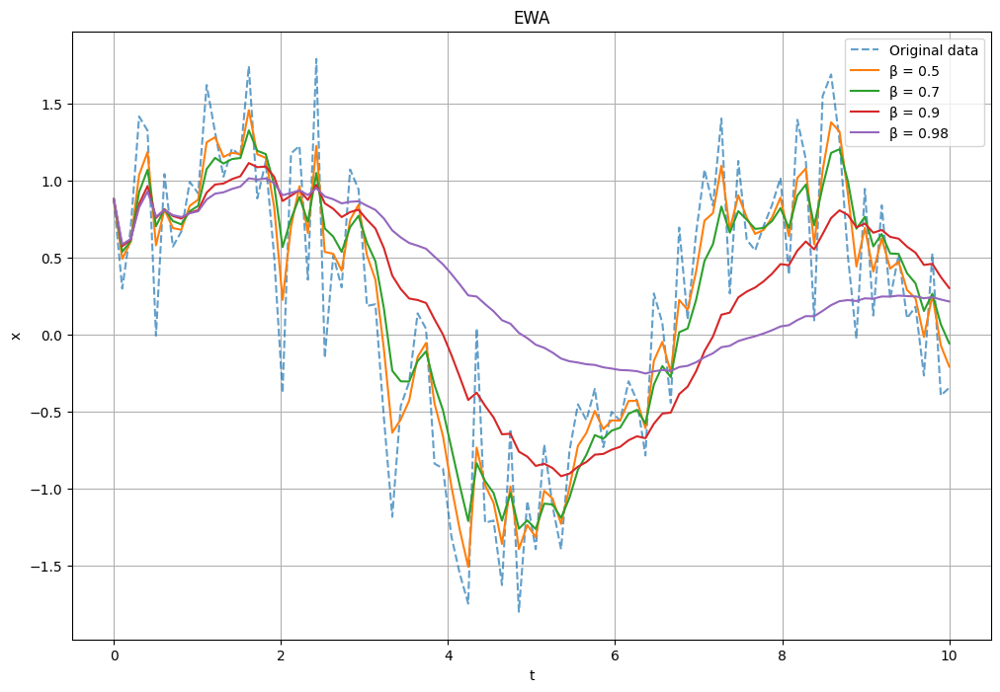

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

np.random.seed(0)
t = np.linspace(0, 10, 100)
x = np.sin(t) + np.random.normal(0, 0.5, size=t.shape)

beta_values = [0.5, 0.7, 0.9, 0.98]

plt.figure(figsize=(12, 8))
plt.plot(t, x, label='Original data', linestyle='--', alpha=0.7)

for beta in beta_values:
    v = np.zeros_like(x)
    v_corrected = np.zeros_like(x)
    v_prev = 0

    for i in range(len(x)):
        v[i] = beta * v_prev + (1 - beta) * x[i]
        v_prev = v[i]
        v_corrected[i] = v[i] / (1 - beta ** (i + 1))
    plt.plot(t, v_corrected, label=f'β = {beta}')

plt.title('EWA')
plt.xlabel('t')
plt.ylabel('x')
plt.legend()
plt.grid(True)
plt.show()




> **Newton's Method**

In optimization problems, the goal is to minimize (or maximize) an objective function f(x). For multivariate functions, Newton's method is extended to use the gradient (first derivative) and the Hessian Matrix (second derivative) for iterative updates

$$
\mathbf{x}_{n+1} = \mathbf{x}_n - \mathbf{H}^{-1}(\mathbf{x}_n) \nabla f(\mathbf{x}_n)
$$

1. Initialization: choose an initial point x0. (could be parameters)
2. Calculate gradient and Hessian matrix: Calculate the gradient of the objective function ∇f(xn) and the Hessian matrix H(xn) at the current point xn.
3. Calculate update direction: Solve the system of linear equations H(xn)Δxn=∇f(xn) to get the update direction Δxn.
4. Update parameter: update the estimated point xn+1=xn-Δxn.
5. Convergence judgment: if ∥Δxn∥ or ∥∇f(xn)∥ is smaller than the preset threshold, stop iteration; otherwise, return to step 2

Pros and cons:
* pros
1. **Fast convergence**: near the approximate optimal point, Newton's method has a **quadratic convergence** speed, much faster than first-order methods such as gradient descent.
2. Utilizing second-order information: By using the Hessian matrix, Newton's method can more **accurately** reflect the curvature information of the objective function, and the optimization process is more efficient
* cons
1. **High computational cost**: For high dimensional problems, the cost of computing and storing the Hessian matrix and its inverse matrix is very high, limiting the application of Newton's method to large scale problems.
2. Positive definiteness of the Hessian matrix: Newton's method assumes that the Hessian matrix is positive definite to ensure the direction of descent. However, in practice, the Hessian matrix may not satisfy this condition, causing the algorithm to fail or converge to a saddle point.
3. Initial point dependence: Newton's method is more sensitive to the initial point, and improper selection may lead to failure of convergence or convergence to a local optimum.

* Example

Initial point $\mathbf{x}_0 = (1.0, 1.0)$

Calculate the gradient $\nabla f(\mathbf{x}_0) = (2, 2)$

Calculate the Hessian matrix $\mathbf{H} = \begin{bmatrix} 2 & 0 \\ 0 & 2 \end{bmatrix}$

Calculate the inverse of the Hessian matrix $\mathbf{H}^{-1} = \begin{bmatrix} 0.5 & 0 \\ 0 & 0.5 \end{bmatrix}$

Update $\Delta \mathbf{x} = \mathbf{H}^{-1} \nabla f(\mathbf{x}_0) = (1.0, 1.0)$

Update $\mathbf{x}_1 = \mathbf{x}_0 - \Delta \mathbf{x} = (0, 0)$

Check convergence condition:

$$
\|\mathbf{x}_1 - \mathbf{x}_0\| = \sqrt{(0 - 1)^2 + (0 - 1)^2} = \sqrt{2} > 1e^{-6}
$$

However, in the next iteration, the gradient is zero, reaching the optimal solution.




> **GD with momentum**

In gradient descent, previous gradients are accumulated to form momentum terms that accelerate convergence and reduce oscillations

We want the update of gradient to be fast on horizontal and slow on vertical

$$
v_t = \beta v_{t-1} + (1 - \beta) \nabla_\theta J(\theta)
$$
$$
\theta = \theta - \alpha v_t
$$

- $\nabla_\theta J(\theta)$: The current gradient
- $v_t$: The exponentially weighted average (moment)
- $\alpha$: Learning rate
- $\beta$: momentum averaging parameter

* 'Unbiasing' momentum terms
$$
\theta_{t+1} = \theta_t - \frac{\alpha v_{t+1}}{1-\beta^{t+1}}
$$
If as we do in above, the momentum term $v_t$ will be smaller in initial iterations than in later ones, so by unbias the update we can have equal expected magnitude across all iterations

This actually makes the first few steps larger than classific momentum

* Nesterov Momentum

This computes momentum update at "next" point


$$
v_t = \beta v_{t-1} + (1 - \beta) \nabla_\theta J(\theta_{t-1} - \alpha v_{t-1})
$$
$$
\theta_{t} = \theta_{t-1} - \alpha v_{t}
$$

Advantages:

Faster convergence: By correcting in advance, NAG is able to approximate the optimal solution faster.

Reduced oscillations: In steep or narrow valleys, NAG is able to reduce oscillations more effectively.

More accurate gradient estimation: calculating the gradient before the parameters are updated makes the gradient direction more accurate.

Disadvantages:

Slightly higher computational complexity: requires the gradient to be computed at the predicted position, adding some computational overhead.

Hyperparameter tuning: similar to the momentum method, NAG needs to adjust the momentum decay coefficient and learning rate appropriately.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

theta = 5.0
alpha = 0.1
beta = 0.9
num_iterations = 50

theta_values = []
loss_values = []

v = 0

for i in range(num_iterations):
    grad = 2 * theta  # J(θ) = θ^2

    v = beta * v + (1 - beta) * grad

    theta = theta - alpha * v

    loss = theta ** 2

    theta_values.append(theta)
    loss_values.append(loss)

    print(f"Iteration {i+1}: θ = {theta:.5f}, Loss = {loss:.5f}")


plt.figure(figsize=(8, 4))
plt.plot(range(1, num_iterations + 1), loss_values, marker='o')
plt.title('Momentum')
plt.xlabel('iteration')
plt.ylabel('J(θ)')
plt.grid(True)
plt.show()


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.datasets import mnist

# 加载和预处理数据
(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train, x_test = x_train / 255.0, x_test / 255.0

# 构建模型
model = Sequential([
    Flatten(input_shape=(28, 28)),
    Dense(128, activation='relu'),
    Dense(10, activation='softmax')  # 输出层使用 Softmax 激活
])

# 定义优化器，使用 Nesterov 加速梯度
optimizer = SGD(learning_rate=0.01, momentum=0.9, nesterov=True)

# 编译模型
model.compile(optimizer=optimizer,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# 训练模型
model.fit(x_train, y_train, epochs=10, batch_size=32, validation_split=0.1)

# 评估模型
loss, accuracy = model.evaluate(x_test, y_test)
print(f"Test Accuracy: {accuracy}")


11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8533 - loss: 0.5165 - val_accuracy: 0.9603 - val_loss: 0.1524
Epoch 2/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9526 - loss: 0.1659 - val_accuracy: 0.9682 - val_loss: 0.1162
Epoch 3/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9653 - loss: 0.1177 - val_accuracy: 0.9750 - val_loss: 0.0919
Epoch 4/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9732 - loss: 0.0920 - val_accuracy: 0.9767 - val_loss: 0.0822
Epoch 5/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - accuracy: 0.9789 - loss: 0.0731 - val_accuracy: 0.9765 - val_loss: 0.0797
Epoch 6/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9818 - loss: 0.0631 - val_accuracy: 0.9770 - val_loss: 0.0777
Epoch 7/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.9847 - loss: 0.0520 - val_accuracy: 0.9780 - val_loss: 0.0730
Epoch 8/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9882 - loss: 0.0441 - 

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms

# 数据预处理
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])

# 加载数据集
train_dataset = datasets.MNIST(root='./data', train=True, download=True, transform=transform)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True)

test_dataset = datasets.MNIST(root='./data', train=False, download=True, transform=transform)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=32, shuffle=False)

# 定义模型
class MyModel(nn.Module):
    def __init__(self):
        super(MyModel, self).__init__()
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(28 * 28, 128)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(128, 10)
        self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        x = self.flatten(x)
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        return self.softmax(x)

model = MyModel()

# 定义损失函数和优化器，使用 Nesterov 加速梯度
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, nesterov=True)

# 训练模型
for epoch in range(10):
    model.train()
    running_loss = 0.0
    for batch_idx, (inputs, targets) in enumerate(train_loader):
        # 前向传播
        outputs = model(inputs)
        loss = criterion(outputs, targets)

        # 反向传播和优化
        optimizer.zero_grad()  # 清除之前的梯度
        loss.backward()        # 计算梯度
        optimizer.step()       # 更新参数

        running_loss += loss.item()
        if batch_idx % 100 == 99:
            print(f"Epoch {epoch + 1}, Batch {batch_idx + 1}, Loss: {running_loss / 100:.4f}")
            running_loss = 0.0

# 评估模型
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for inputs, targets in test_loader:
        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        total += targets.size(0)
        correct += (predicted == targets).sum().item()

print(f"Test Accuracy: {100 * correct / total:.2f}%")




> **RMSprop**

The average of the squared gradients is used to dynamically adjust the learning rate

$$
s_{dw} = \beta s_{dw} + (1 - \beta)dw^2
$$

dw are small

$$
s_{db} = \beta s_{db} + (1 - \beta)db^2
$$

db are large


$$
w = w - \alpha \frac{dw}{\sqrt{s_{dw}}}
$$

$$
b = b - \alpha \frac{db}{\sqrt{s_{db}}}
$$
with large db to divide, the oscilation on vertical will be small

Assuming that the w is the horizontal axis,

b is the vertical axis.

Still, we want slow on vertical and fast on horizontal

**Slow down the direction with large partial derivative**



> **Adam**

Adaptive moment estimation

Combining *Momentum* and *RMSProp*, exponentially weighted averaging of first-order and second-order moments of gradients

$$
v_t = \beta_1 v_{t-1} + (1 - \beta_1) \nabla_\theta J(\theta)
$$
$$
s_t = \beta_2 s_{t-1} + (1 - \beta_2) [\nabla_\theta J(\theta)]^2
$$
$$
\hat{v}_t = \frac{v_t}{1 - \beta_1^t}
$$
$$
\hat{s}_t = \frac{s_t}{1 - \beta_2^t}
$$
$$
\theta = \theta - \alpha \frac{\hat{v}_t}{\sqrt{\hat{s}_t} + \epsilon}
$$

Where θ is a generalized parameter stands for w,b


## **Hyperparameter Tuning**

### Batch Norm

Aims to solve the problem of gradient vanishing and gradient explosion in deep neural network training to accelerate training and improve model performance

* Internal Covariate Shift (ICS): during training, changes in the parameters of the previous layer lead to changes in the input distribution of the subsequent layer, which increases the difficulty of training.

* Gradient Vanishing and Gradient Explosion: the gradient of a deep network may decrease or increase layer by layer during backpropagation, making training difficult.

* Batch Normalization The above problems are mitigated by normalizing the inputs at each layer, allowing the use of higher learning rates and faster training.

For the given mini-batch input $\{x^{(1)}, x^{(2)}, \ldots, x^{(m)}\}$, the steps for batch normalization are as follows:

1. **Calculate the batch mean:**

$$
\mu_B = \frac{1}{m} \sum_{i=1}^{m} x^{(i)}
$$

2. **Calculate the batch variance:**

$$
\sigma_B^2 = \frac{1}{m} \sum_{i=1}^{m} (x^{(i)} - \mu_B)^2
$$

3. **Normalization:**

$$
\hat{x}^{(i)} = \frac{x^{(i)} - \mu_B}{\sqrt{\sigma_B^2 + \epsilon}}
$$

- $\epsilon$ is a small constant to prevent division by zero, typically taken to be $10^{-5}$.


Batch normalization introduces two learnable parameters:

- **Scale parameter** $\gamma$: Used to adjust the standard deviation $\sqrt{\sigma_B^2 + \epsilon}$
- **Shift parameter** $\beta$: Used to adjust the mean $\mu_B$

The output after normalization is given by:

$$
y^{(i)} = \gamma \hat{x}^{(i)} + \beta
$$

By learning $\gamma$ and $\beta$, the network can reproduce any possible input distribution.




> Why?

* batch normalization stabilizes the distribution of inputs across layers by normalizing the inputs of each layer to have a mean of 0 and a variance of 1. In this way, subsequent layers do not have to be adjusted frequently to accommodate input changes, and the model can learn faster

* Since batch normalization stabilizes the distribution of activation values and mitigates the problems of gradient explosion and gradient vanishing, **higher learning rates** can be safely used. This results in larger parameter updates and faster model convergence
  * Through standardization, the inputs of each layer are kept within a more stable range, preventing the activation values from being too large or too small, thus maintaining the stability of the gradient and facilitating effective parameter updating

In [ ]:
def batch_norm(X, gamma, beta, moving_mean, moving_var, eps, momentum):
    # Use is_grad_enabled to determine whether we are in training mode
    if not torch.is_grad_enabled():
        # In prediction mode, use mean and variance obtained by moving average
        X_hat = (X - moving_mean) / torch.sqrt(moving_var + eps)
    else:
        assert len(X.shape) in (2, 4)
        if len(X.shape) == 2:
            # When using a fully connected layer, calculate the mean and
            # variance on the feature dimension
            mean = X.mean(dim=0)
            var = ((X - mean) ** 2).mean(dim=0)
        else:
            # When using a two-dimensional convolutional layer, calculate the
            # mean and variance on the channel dimension (axis=1). Here we
            # need to maintain the shape of X, so that the broadcasting
            # operation can be carried out later
            mean = X.mean(dim=(0, 2, 3), keepdim=True)
            var = ((X - mean) ** 2).mean(dim=(0, 2, 3), keepdim=True)
        # In training mode, the current mean and variance are used
        X_hat = (X - mean) / torch.sqrt(var + eps)
        # Update the mean and variance using moving average
        moving_mean = (1.0 - momentum) * moving_mean + momentum * mean
        moving_var = (1.0 - momentum) * moving_var + momentum * var
    Y = gamma * X_hat + beta  # Scale and shift
    return Y, moving_mean.data, moving_var.data

In [ ]:
class BatchNorm(nn.Module):
    # num_features: the number of outputs for a fully connected layer or the
    # number of output channels for a convolutional layer. num_dims: 2 for a
    # fully connected layer and 4 for a convolutional layer
    def __init__(self, num_features, num_dims):
        super().__init__()
        if num_dims == 2:
            shape = (1, num_features)
        else:
            shape = (1, num_features, 1, 1)
        # The scale parameter and the shift parameter (model parameters) are
        # initialized to 1 and 0, respectively
        self.gamma = nn.Parameter(torch.ones(shape))
        self.beta = nn.Parameter(torch.zeros(shape))
        # The variables that are not model parameters are initialized to 0 and
        # 1
        self.moving_mean = torch.zeros(shape)
        self.moving_var = torch.ones(shape)

    def forward(self, X):
        # If X is not on the main memory, copy moving_mean and moving_var to
        # the device where X is located
        if self.moving_mean.device != X.device:
            self.moving_mean = self.moving_mean.to(X.device)
            self.moving_var = self.moving_var.to(X.device)
        # Save the updated moving_mean and moving_var
        Y, self.moving_mean, self.moving_var = batch_norm(
            X, self.gamma, self.beta, self.moving_mean,
            self.moving_var, eps=1e-5, momentum=0.1)
        return Y